# Chapter 6 — Ideal Flow

*Fluid Mechanics, 5th edition — Pijush K. Kundu, Ira M. Cohen, David R. Dowling (2012).*
This notebook teaches every new idea of the chapter with plain words, step-by-step mathematics, small worked examples, tested Python from the `fluidpy` package, figures, animations and interactive explainers. It does not reproduce the book's text or figures; equations are cited by their numbers so you can follow along in your copy.

---

**The big idea in one paragraph**

Air over a wing, water past a bridge pier, the ocean round an island: far from walls and wakes these fluids move almost
without friction and without spin. There the flow obeys $\nabla\cdot\mathbf u=0$ and
$\rho\,D\mathbf u/Dt=-\nabla p$ *(Eq. 6.1)*, and two scalar functions — the stream function ψ and the velocity
potential φ — obey the **linear** Laplace equation $\nabla^2\psi=0$ *(Eq. 6.5)*, $\nabla^2\phi=0$ *(Eq. 6.12)*. So flows
can be *added*: a stream plus a source makes a blunt nose, a stream plus a doublet makes a cylinder, a vortex added to
it makes lift, $L=\rho U\Gamma$ *(Eq. 6.40)*. Complex numbers pack φ and ψ into one function $w=\phi+i\psi$ *(Eq. 6.42)*,
turn force calculations into a residue and let a map carry the circle's flow onto other shapes. A grid of averages
solves the same Laplace equation numerically, sources hidden on an axis draw airships, and a moving sphere shows the one
force an ideal fluid *does* exert on a body moving through it at rest far away: added mass,
$\mathbf F_E=\big(m+\tfrac{2\pi}{3}\rho a^3\big)\,d\mathbf u_s/dt$ *(Eq. 6.109)*.

**Road map** — the new ideas of this chapter, in the order they build on each other:

1. §6.1 the ideal-flow equations $\nabla\cdot\mathbf u=0$, $\rho D\mathbf u/Dt=-\nabla p$ *(6.1)* and where to trust them (C01)
2. §6.2 ψ and φ: $\omega_z=-\nabla^2\psi$ *(6.4)*, Laplace, vortices and sources as point sources (C02); superposition — any streamline can be a wall (6.16), $\mathbf n\cdot\mathbf U_s=(\mathbf n\cdot\mathbf u)_{\text{surface}};\ \partial\phi/\partial n=0\ \text{or}\ \partial\psi/\partial s=0\ \text{(stationary)}$ (C03)
3. §6.3 the element kit and the doublet $\phi=\lvert\mathbf d\rvert\cos\theta/2\pi r$ *(6.29)* (C04); the half-body (6.31), $\psi=Uy+\frac{m}{2\pi}\tan^{-1}\frac yx=Ur\sin\theta+\frac{m}{2\pi}\theta$ (C05); the cylinder and d'Alembert's paradox, $C_p=1-4\sin^2\theta$ *(6.35)* (C06); circulation and lift $L=\rho U\Gamma$ *(6.40)* (C07); images and the wall pressure under a passing vortex (C08)
4. §6.4 the complex potential $w=\phi+i\psi$ *(6.42)* and $dw/dz=u-iv$ *(6.45)* (C09)
5. §6.5 Blasius $D-iL=\frac{i\rho}{2}\oint(dw/dz)^2dz$ *(6.60)* and Kutta–Zhukhovsky lift for any body (C10)
6. §6.6 conformal maps and the Zhukhovsky map $z=\zeta+b^2/\zeta$ *(6.65)* (C11)
7. §6.7 Laplace on a grid, $\psi_{i,j}=\tfrac14[\dots]$ *(6.72)*, and Gauss–Seidel relaxation (C12)
8. §6.8 axisymmetric flow and the sphere (6.90), $u_r=U\Big[1-\Big(\frac ar\Big)^3\Big]\cos\theta,\ u_\theta=-U\Big[1+\frac12\Big(\frac ar\Big)^3\Big]\sin\theta$ (C13); bodies from axial sources (C14)
9. §6.9 the accelerating sphere and added mass $M=2\pi\rho a^3/3$ *(6.108)* (C15)

**What you should already know** (each is recapped where it is used):

- continuity and the stream function (Ch. 4 §4.2–4.3)
- Bernoulli, steady and unsteady (Ch. 4 §4.9)
- vorticity, circulation and Kelvin's theorem (Ch. 3 §3.4, Ch. 5 §5.2)
- the point vortex and its image (Ch. 5 §5.7)
- the Laplacian, Gauss' theorem, the Dirac delta (Ch. 2)
- the cylinder flow in two frames (Ch. 3 §3.3)

## 🎮 Interactive explainers in this chapter

| # | Explainer | What it makes clear |
|---|---|---|
| 1 | **Where does the body come from?** | C03 C04 C05: add elements; the stagnation streamline becomes a wall; closed only when the sources cancel |
| 2 | **How does spin turn into lift?** | C06 C07: stagnation points slide, L = ρUΓ, drag stays zero |
| 3 | **What does a wall feel as an eddy passes?** | C08: image vortex, drift Γ/4πh, suction then over-pressure |
| 4 | **Why is the velocity u − iv?** | C09: Cauchy–Riemann as two difference quotients; calm vs violent corners |
| 5 | **Why doesn't lift depend on the shape?** | C10: the contour can move; only U × Γ/z survives |
| 6 | **How does a map carry a flow?** | C11: angles kept, circle → ellipse, the right square root |
| 7 | **How does a grid solve Laplace's equation?** | C12: average of neighbours, Jacobi vs Gauss–Seidel vs SOR, stop on the residual |
| 8 | **Given a shape, which sources draw it?** | C14: N unknown strengths, ψ = 0 at N points, one linear solve |
| 9 | **Why does an ideal fluid resist acceleration?** | C15: the speed pressure cancels, the acceleration pressure gives half the displaced mass |

Each one opens right where its idea is taught and fills the window (no scrolling). Start with the **Walkthrough**, then **Explore** with the sliders and presets, read **Explain** (every number worked out with your settings, and what it means), step through the **Derivation** where there is one, read the **Equations** and the **Code**, and finish with **Check yourself**. On the web page they are full-window; in Colab and Jupyter they appear in the cell output (use ⤢ *Full screen* or *Open in new tab* for more room).

## ⚙️ Setup — run this cell first

It works in three places without changes:
* **Google Colab** — clones the public repository into `/content/fluidpy` (the `fluidpy` package, its tests and the
  interactive explainers) and installs the one package Colab lacks (`pint`). No GPU is needed.
* **Jupyter / VS Code on your computer** — finds the repository root (the folder with `book.yaml`) and imports from it.
* **The published web page** — already executed; nothing to run.

In [1]:
# ── Setup: find (or fetch) the fluidpy repository, then load the house style ─────────────────────────────
import os, sys, subprocess, pathlib                     # standard library only, so this cell never fails on imports

IN_COLAB = "google.colab" in sys.modules                 # True when this notebook runs inside Google Colab
REPO_URL = "https://github.com/shammun/fluidpy.git"               # the public repository with the fluidpy package

if IN_COLAB:
    ROOT = pathlib.Path("/content/fluidpy")              # where the repository is cloned on Colab
    if not ROOT.exists():                                 # first run in this Colab session: clone it
        subprocess.run(["git", "clone", "--depth", "1", REPO_URL, str(ROOT)], check=True)
    else:                                                 # later runs: fetch the newest version
        subprocess.run(["git", "-C", str(ROOT), "pull", "--ff-only", "-q"], check=False)
    subprocess.run([sys.executable, "-m", "pip", "install", "-q", "-r", str(ROOT / "requirements-colab.txt")], check=True)
else:
    ROOT = pathlib.Path.cwd().resolve()                   # start where Jupyter was launched …
    while not (ROOT / "book.yaml").exists() and ROOT != ROOT.parent:
        ROOT = ROOT.parent                                # … and walk up until we find the repository root

os.chdir(ROOT)                                            # relative paths (outputs/, viz/) now resolve from the root
if str(ROOT) not in sys.path:
    sys.path.insert(0, str(ROOT))                         # make `import fluidpy` work

from fluidpy.core.style import setup_notebook            # matplotlib + plotly style shared with the explainers
from fluidpy.core.embed import show_viz                  # shows an interactive explainer in the notebook
from fluidpy.core.anim import show_animation             # plays a matplotlib animation inline
FAST = setup_notebook()                                   # FAST=True (env FLUIDPY_FAST=1) shrinks grids for quick runs
print(f"IN_COLAB = {IN_COLAB} | repository root: {ROOT} | FAST = {FAST}")

IN_COLAB = False | repository root: C:\Users\sislam27\Work\Climate Dynamics PHD\Fluid Dynamics | FAST = False


In [2]:
import numpy as np                                      # arrays (Ch. 1 primer P03)
import sympy as sp                                      # symbolic algebra (Ch. 1 primer P40)
import matplotlib.pyplot as plt                         # static figures (Ch. 1 primer P01)
import plotly.graph_objects as go                       # plotly figures that keep working on the web page (Ch. 1 P41)
from fluidpy import ch06_ideal_flow as ch06             # the tested chapter-6 module: every function cites its § and Eq.
from fluidpy.core import potential as pf                # new core module: superposable ideal-flow elements and bodies
from fluidpy.core import conformal as cm                # new core module: conformal maps (Zhukhovsky) and mapped flows
from fluidpy.core import laplace_solvers as ls          # new core module: Laplace on a masked grid, Jacobi / Gauss–Seidel / SOR
from fluidpy.core import panels as pn                   # new core module: axial singularities and source panels
from fluidpy import ch03_kinematics as ch03             # Ch. 3: the cylinder flow in two frames
from fluidpy import ch04_conservation_laws as ch04      # Ch. 4: incompressibility test, the accelerating sphere
from fluidpy import ch05_vorticity_dynamics as ch05     # Ch. 5: Kelvin's hypotheses, point vortices and images
from fluidpy.core.interact import slider_figure, live   # plotly slider figures (P17) and live widgets (P47)
from fluidpy.core.anim import animate, ffmpeg_path      # matplotlib animations (P16); show_animation came with the setup
from fluidpy.core.style import COLORS, savefig          # the house palette and a helper that saves PNGs to outputs/ch06
from tools.convergence import observed_order            # slope of log(error) vs log(step): the observed order (P13)
from scripts.ch06_drawings import flow_net, draw_body, pressure_arrows, separated_cp_band, circle   # drawing only, no physics
import warnings, logging                                # standard library: warning filters and log levels
warnings.filterwarnings("ignore", category=RuntimeWarning)             # 0/0 at a singular point is handled by NaN on purpose
logging.getLogger("matplotlib.font_manager").setLevel(logging.ERROR)   # hide harmless font-substitution notes
ffmpeg_path()                                           # find ffmpeg once (sets matplotlib's animation.ffmpeg_path)
plt.rcParams["contour.negative_linestyle"] = "solid"    # negative ψ levels are streamlines too: draw them solid (φ is dashed on purpose)


def recolor(fig, colors, dashes=None):                  # give plotly slider traces the notebook's colours by trace name
    for tr in fig.data:                                 # every trace of every slider step
        if tr.name in colors:                           # a name we assigned a colour to
            tr.line.color = colors[tr.name]             # same colour meaning as in the matplotlib figures
            tr.marker.color = colors[tr.name]           # markers too (for "markers" traces)
        if dashes and tr.name in dashes:                # optional dash pattern ("dash", "dot")
            tr.line.dash = dashes[tr.name]
    return fig                                          # the same figure, restyled


def step_titles(fig, titles):                           # a different title for every slider position (numbers per step)
    for step, text in zip(fig.layout.sliders[0].steps, titles):   # one slider step per title
        step.args = [step.args[0], {"title.text": text}]          # the step now also rewrites the figure title
    fig.layout.title.text = titles[fig.layout.sliders[0].active]  # the title of the starting position
    return fig                                          # the same figure


print(len([n for n in dir(ch06) if not n.startswith("_")]), "public names in fluidpy.ch06_ideal_flow")   # the toolbox

181 public names in fluidpy.ch06_ideal_flow


**What does the code above do?**

1. Numerical, symbolic and plotting libraries (all primed in Ch. 1–2).
2. `ch06` is the chapter module; it re-exports the four new core modules of this chapter — `pf` (elements such as
   `Uniform`, `Source`, `Vortex`, `Doublet`, `Corner`, their sum `Flow`, the bodies `half_body`, `cylinder`, `sphere`
   and the force tools), `cm` (conformal maps), `ls` (grid solvers) and `pn` (singularity distributions). We call them
   by these short names; every function is tested in `tests/test_ch06.py`.
3. The chapter modules of Ch. 3–5 are used for recaps and parity checks.
4. `scripts/ch06_drawings.py` only draws: flow nets (ψ solid, φ dashed), bodies, pressure arrows and the *qualitative*
   separated-pressure band of C06.
5. `recolor` and `step_titles` only restyle plotly figures (colours by meaning, a title per slider position).

### ⚠️ Conventions in this chapter (read once; each is repeated where it bites)

| Topic | This notebook and its code | Where the book differs |
|---|---|---|
| circulation Γ [m²/s] | **counterclockwise positive**: a vortex $\psi=-\frac{\Gamma}{2\pi}\ln r$ *(6.8)* turns the fluid at $u_\theta=+\Gamma/2\pi r$; `pf.Vortex(Gamma)` | the cylinder with circulation (6.36), $\psi=U\Big(r-\frac{a^2}{r}\Big)\sin\theta+\frac{\Gamma}{2\pi}\ln\Big(\frac ra\Big)$–(6.40), (6.52), $w=U\Big(z+\frac{a^2}z\Big)+\frac{i\Gamma}{2\pi}\ln(z/a)$, (6.61), $D-iL=\frac{i\rho}{2}\oint_C\Big(U+\frac{i\Gamma}{2\pi z}-\frac{d}{2\pi z^2}+\dots\Big)^2dz$–(6.62), $D-iL=\frac{i\rho}{2}2\pi i\Big(\frac{iU\Gamma}{\pi}\Big)=-i\rho U\Gamma,\ D=0,\ L=\rho U\Gamma$, (6.68), $w=U\Big(\zeta+\frac{a^2}{\zeta}\Big)+\frac{i\Gamma}{2\pi}\ln(\zeta/a)$ and Example 6.1 use a **clockwise** Γ; body functions accept `Gamma_cw=` (the book's Γ) or `Gamma_ccw=` (ours), $\Gamma_{ccw}=-\Gamma_{cw}$ |
| 2-D doublet | the dipole vector $\mathbf d=\sum_i\mathbf x_im_i$ points **from the sink to the source**; the cylinder needs $\mathbf d=-2\pi Ua^2\mathbf e_x$ (upstream) | (6.49), $w=\frac{d}{2\pi(z-z')}$'s scalar d means the dipole $-d\,\mathbf e_x$ (`pf.Doublet.from_book_scalar`) |
| angles | θ measured from +x (downstream): a body's nose in a stream from the left is at θ = π | the measured cylinder pressure is plotted against the angle from the front, 180° − θ |
| §6.8 axes | z is the **horizontal** symmetry axis, along the stream | — |
| §6.9 letters | w is the z-velocity, not the complex potential; M is the added mass, not the Mach number | — |
| forces | D (along the stream) and L (across it) are forces **on the body** per unit depth [N/m]; B is a span, not Ch. 4's Bernoulli function | (6.54), $\int_{A^*}\rho\mathbf u(\mathbf u\cdot\mathbf n)\,dA=-\int_{A^*}p\,\mathbf n\,dA+\mathbf F$'s F acts on the fluid |
| units | plane ψ, φ, Γ, m [m²/s]; Stokes ψ and 3-D source Q [m³/s]; 2-D dipole [m³/s], 3-D dipole [m⁴/s] | — |

**Numbers for the Γ convention** (used again in C07): a cylinder of radius a = 0.1 m in air (ρ = 1.2 kg/m³) and a
stream U = 10 m/s with the book's Γ_cw = 2 m²/s — i.e. our Γ_ccw = −2 m²/s — has its stagnation points **below** the
axis at −9.16° and −170.84° and feels the lift L = ρUΓ_cw = +24 N/m. We compute in the project convention and show the
book's alongside wherever they differ.

**Colours** (one meaning each, also in the explainers): uniform stream **blue** · sources **teal** · sinks **rose** ·
vortices **amber** · doublets **purple** · body and dividing streamline **black** · over-pressure **orange**, suction
**blue** · steady pressure part **teal**, acceleration part **orange** · lift **amber**, drag **grey** · ψ contours solid,
φ contours dashed · references and ghosts **grey dashed** · a "wrong variant" (numpy's principal root, a printed
coefficient) **rose dashed**.

**Book slips we correct in this notebook** (each is explained where it is used):

| The book prints | We use |
|---|---|
| (6.61), $D-iL=\frac{i\rho}{2}\oint_C\Big(U+\frac{i\Gamma}{2\pi z}-\frac{d}{2\pi z^2}+\dots\Big)^2dz$'s squared series with the $1/z^2$ coefficient $\big(\tfrac{Ud}{\pi}-\tfrac{\Gamma^2}{4\pi^2}\big)$ and an extra outer square | the coefficient is $-\big(\tfrac{Ud}{\pi}+\tfrac{\Gamma^2}{4\pi^2}\big)$; only the $1/z$ term matters (D18) |
| the middle bracket of (6.104), $\mathbf u_a=\tfrac32(\mathbf u_s\cdot\mathbf e_\xi)\mathbf e_\xi-\tfrac12\mathbf u_s$: $-\tfrac1{a^3}\mathbf u_s$ | $+\tfrac1{a^3}\mathbf u_s$, which that final form needs (D29) |
| (6.108), $\mathbf F_s=-M\frac{d\mathbf u_s}{dt},\ M=\frac{2\pi a^3\rho}{3}$, keeps $d\varphi$ after the φ-integration | the φ-integral has become its factor 2π (D30) |
| §6.3 "differentiation of (6.8), $\psi=-\frac{\Gamma}{2\pi}\ln\sqrt{(x-x')^2+(y-y')^2}$" for the source velocities | (6.15), $\phi=\frac m{2\pi}\ln r$ (note N24) |
| §6.4 "(6.5), $\nabla^2\psi=0$ and (6.12), $\nabla^2\phi=0$, respectively" for φ and ψ; "(6.43), $z\equiv x+iy=re^{i\theta}$ ensures the equality" | the other way round; the Cauchy–Riemann conditions (6.44), $\frac{\partial\phi}{\partial x}=\frac{\partial\psi}{\partial y},\ \frac{\partial\phi}{\partial y}=-\frac{\partial\psi}{\partial x}$ (note N43) |
| §6.5 "Section 3"; §6.6 "(see Figure 6.5)" | §6.3; Figure 6.3 (notes N53, N66) |
| §6.7 "first-order central differences" | first-*derivative* differences, second-order accurate (recap R19, D22) |
| Example 6.2's FORTRAN loop over I, and the inlet Δψ in m² | the loop should run over J; Δψ is in m²/s (note N74) |

**Where this chapter is used later**

| Result here | Used in |
|---|---|
| ideal outer flow and $C_p=1-\lvert\mathbf u\rvert^2/U^2$ (6.32) | the pressure that drives boundary layers, wedge flows $w=Az^n$ (6.46), separation (Ch. 9) |
| velocity potentials, images at a wall | water waves over a flat bottom (Ch. 7) |
| Laplace on a grid, relaxation, panels | elliptic solvers and panel methods (Ch. 10) |
| $\omega_z=-\nabla^2\psi$ (6.4), deformation (corner) flow, images, Poisson in a closed basin | stream-function inversion, fronts, coastal walls (Ch. 13) |
| Kutta–Zhukhovsky $L=\rho U\Gamma$ (6.62), conformal maps | airfoils, the Kutta condition, induced drag (Ch. 14) |
| added mass $M=2\pi\rho a^3/3$ (6.108) | bubbles, fish and structures (Ch. 16) |

*Climate hook:* the atmosphere and ocean are rotating and stratified, so they are almost never irrotational — but the
*tools* of this chapter carry over directly: recovering ψ from vorticity (a Poisson problem, C02 and C12), the strain
field of a corner flow that sharpens fronts (C04), walls as mirror images (C08).

> 🔁 **Tools from earlier chapters used in this one** (one line each where first used; the full primers are in
> `knowledge/primers.md`): partial derivatives (P25), Taylor series (P26, P98), definite integrals (P27), the net
> pressure force −∮p n dA (P28), `lambda` (P29), the trapezoid rule (P37), the product rule (P38), sympy (P40),
> i² = −1 and Euler's formula (P45), `np.where` (P46), the chain rule (P49, P91), `np.linalg.solve` (P57), orders of
> smallness (P68), Vieta's formulas (P71), `np.arctan2` (P70), the directional derivative (P75), `np.meshgrid` (P76),
> broadcasting (P77), contour and streamline plots (P78), eigenvalues (P80), the complex conjugate (P81), `quad` (P87),
> polar and spherical unit vectors (P88, P105), parametric curves (P92), substitution in an integral (P106), `brentq`
> (P108), dataclasses (P111), momentum flux (P114), Schwarz's theorem (P121), the curl of a curl (P122), the periodic
> trapezoid rule (P136), Poisson and Green's functions (P139), the gradient of 1/distance (P140), the FFT (P142),
> Gauss–Legendre quadrature (P143), improper integrals (P144), `animate` (P16), `slider_figure` (P17), `show_viz` (P18),
> `solve_ivp` (P31, P94), log–log slopes (P13), `assert np.allclose` (P15). New primers of this chapter: P149–P164.

---

## 6.1 Relevance of Irrotational Constant-Density Flow Theory

**What is this section about?** Real fluids are viscous, so why study a theory with no friction? Because at high
Reynolds number viscosity only matters in thin layers next to walls and in wakes; everywhere else the flow keeps no spin
and obeys a much simpler pair of equations. This section says what those equations are, what they drop, and where they
may be trusted.

> 🔁 **Recap — Why the fluid stays irrotational — Kelvin** (Ch. 5 §5.2). In a fluid of constant density pushed only by conservative forces, and away from viscous regions, the circulation of
every material loop is constant, $D\Gamma/Dt=0$ *(Eq. 5.8)* — so fluid that starts without vorticity (a uniform stream
far upstream) stays without it until it enters a boundary layer, a wake or a separated region. Constant density needs a
low Mach number, $M\equiv U/c\ll1$ *(Eq. 4.111)*, and no baroclinic torque $\nabla\rho\times\nabla p/\rho^2$ from a
density field (Ch. 5 §5.2 lists the restrictions). Below, `ch05.kelvin_hypotheses_text` says which hypothesis fails and
`ch04.is_incompressible_regime(U)` tests whether a speed U [m/s] is slow enough (U/c below 0.3 in air).

In [3]:
print(ch05.kelvin_hypotheses_text(barotropic=False))    # a stratified (baroclinic) fluid: Kelvin's theorem fails
print(ch04.is_incompressible_regime(10.0))              # a car at 10 m/s in air: M = 10/343 ≈ 0.03 → constant density is fine

Kelvin fails: DΓ/Dt ≠ 0 because of baroclinic.
True


### 🧩 The ideal-flow equations — and where to trust them `C01`

*The question:* Water and air are viscous. How can a theory with no friction describe them at all — and where does it fail?

*In one line:* $\nabla\cdot\mathbf u=0\ \text{ and }\ \rho\,\frac{D\mathbf u}{Dt}=-\nabla p$ *(6.1)*

#### The problem in plain words

Put your hand out of a car window at 10 m/s: the air feels the car only through a skin of slowed air about a millimetre
thick on its surface; a few centimetres away the air moves as if it had no viscosity at all. Engineers design wings,
hulls and cars from that outer flow; oceanographers use it for flow round islands and seamounts. We want the equations
of that outer flow and an honest list of where they fail.

#### The idea

```
far from walls:    no spin (w = 0)  -->  viscous force mu*lap(u) = -mu*curl(w) = 0  -->  Euler + div u = 0  = (6.1)
near the wall:     thin boundary layer, w != 0, friction matters                     -->  Ch. 9
behind a blunt body: separated wake, w != 0 everywhere                               -->  ideal flow fails
```

*The numbered equations in the sketch:* $\nabla\cdot\mathbf u=0\ \text{ and }\ \rho\,\frac{D\mathbf u}{Dt}=-\nabla p$ *(6.1)*

(Here w stands for the vorticity ω.) **Irrotational does not mean inviscid — it means the viscous forces cancel.**

> 🔁 **Tools from earlier chapters used here** (see `knowledge/primers.md`) — the vector identities D01 uses; the hydrostatic split p = p_h + p′ is Ch. 4 §4.9

- **partial derivative ∂/∂x** — $\partial f/\partial x$ changes x and holds every other variable fixed (Ch. 1 P25).
- **product rule for a divergence** — $\nabla\cdot(\rho\mathbf u)=\mathbf u\cdot\nabla\rho+\rho\nabla\cdot\mathbf u$ (Ch. 4 P113).
- **curl of a curl identity** — $\nabla\times(\nabla\times\mathbf u)=\nabla(\nabla\cdot\mathbf u)-\nabla^2\mathbf u$ for any smooth field (Ch. 4 P122).
- **boundary conditions** — what the flow must do on the edges of its region — no flow through a wall, no slip, a given stream far away (Ch. 1 P20).

#### 🧮 Derivation — The ideal-flow equations from continuity and Navier–Stokes `D01` (Eq. 6.1: $\nabla\cdot\mathbf u=0\ \text{ and }\ \rho\,\frac{D\mathbf u}{Dt}=-\nabla p$)

**What we want to show.** Show that a constant-density flow without vorticity obeys ∇·u = 0 and ρDu/Dt = −∇p *(6.1), $\nabla\cdot\mathbf u=0\ \text{ and }\ \rho\,\frac{D\mathbf u}{Dt}=-\nabla p$* — even though the fluid is viscous — and see which boundary condition this costs.

**Assumptions.** ρ constant (low Mach number, no stratification: step 1); gravity conservative (step 3); ω = 0 in the region (step 6); constant μ (step 2).

**The plan.**

1. Use constant density in continuity.
2. Absorb gravity into a hydrostatic pressure.
3. Rewrite the viscous force with the curl-of-a-curl identity.
4. Set ω = 0 and read off (6.1), $\nabla\cdot\mathbf u=0\ \text{ and }\ \rho\,\frac{D\mathbf u}{Dt}=-\nabla p$ and its boundary condition.

**Tools we use** (each explained before this point): product rule for a divergence ∇·(ρu) = u·∇ρ + ρ∇·u (ch04 P113, reminder) · hydrostatic balance ∇p_h = ρg (Ch. 4 §4.9) · curl of a curl ∇×(∇×u) = ∇(∇·u) − ∇²u (ch04 P122, reminder) · Kelvin's theorem (R01).

**We start from**

$$ \begin{array}{l}\frac{\partial\rho}{\partial t}+\nabla\cdot(\rho\mathbf u)=0\ \text{(4.7) and}\ \rho\frac{D\mathbf u}{Dt}=-\nabla p+\rho\mathbf g+\mu\nabla^2\mathbf u\ \text{(4.39b, the constant-μ,} \\ \text{∇·u = 0 form of 4.38)}\end{array} $$

*In words:* mass is conserved, and mass × acceleration equals pressure, weight and viscous forces.

---

**Step 1 of 8 — Use constant density in continuity.**

$$ \frac{D\rho}{Dt}+\rho\nabla\cdot\mathbf u=0\ \Rightarrow\ \nabla\cdot\mathbf u=0 $$

- *Why we can do this:* The product rule splits ∇·(ρu) into u·∇ρ + ρ∇·u, and ∂ρ/∂t + u·∇ρ = Dρ/Dt = 0 for constant ρ; divide by ρ ≠ 0.
- *In words:* Fluid of fixed density cannot be squeezed: what flows into a point flows out.

---

**Step 2 of 8 — Write the constant-μ momentum equation.**

$$ \rho\frac{D\mathbf u}{Dt}=-\nabla p+\rho\mathbf g+\mu\nabla^2\mathbf u $$

- *Why we can do this:* With ∇·u = 0 and constant μ the general Navier–Stokes (4.38), $\rho\frac{Du_j}{Dt}=-\frac{\partial p}{\partial x_j}+\rho g_j+\frac{\partial}{\partial x_i}\Big[\mu\Big(\frac{\partial u_j}{\partial x_i}+\frac{\partial u_i}{\partial x_j}\Big)+\big(\mu_v-\tfrac23\mu\big)\frac{\partial u_m}{\partial x_m}\delta_{ij}\Big]$ reduces to (4.39b), $\rho\frac{D\mathbf u}{Dt}=-\nabla p+\rho\mathbf g+\mu\nabla^2\mathbf u$ (Ch. 4 §4.6); we start from the simplest correct form.
- *In words:* Mass times acceleration equals pressure push, weight and viscous force.

---

**Step 3 of 8 — Absorb gravity into hydrostatic pressure.**

$$ p=p_h+p',\ \nabla p_h=\rho\mathbf g\ \Rightarrow\ \rho\frac{D\mathbf u}{Dt}=-\nabla p'+\mu\nabla^2\mathbf u $$

- *Why we can do this:* With constant ρ and conservative g a hydrostatic pressure p_h exists with ∇p_h = ρg; subtracting it removes gravity from the equation (the book's "measured relative to its hydrostatic value").
- *In words:* Weight is balanced by a background pressure; only the leftover pressure p′ moves the fluid.

---

**Step 4 of 8 — Apply the curl-of-a-curl identity.**

$$ \nabla^2\mathbf u=\nabla(\nabla\cdot\mathbf u)-\nabla\times(\nabla\times\mathbf u) $$

- *Why we can do this:* A vector identity valid for any smooth field (ch04 P122); we want the viscous term expressed through divergence and vorticity, the two quantities we control.
- *In words:* The Laplacian of velocity splits into a compression part and a spin part.

---

**Step 5 of 8 — Insert ∇·u = 0 and ω = ∇×u.**

$$ \mu\nabla^2\mathbf u=-\mu\nabla\times\boldsymbol\omega $$

- *Why we can do this:* Step 1 kills the gradient term; ∇×u is the vorticity by definition. This is (4.40), $\mu\nabla^2\mathbf u=-\mu\nabla\times\boldsymbol\omega$ — the line above: the net viscous force comes from spatial changes of vorticity only.
- *In words:* Viscosity pushes on an element only where the spin varies.

---

**Step 6 of 8 — Set the vorticity to zero.**

$$ \boldsymbol\omega=0\ \Rightarrow\ \mu\nabla^2\mathbf u=0\quad(\mu\neq0) $$

- *Why we can do this:* The flow is irrotational by assumption (kept so by Kelvin, R01); the curl of a zero field is zero, whatever the value of μ.
- *In words:* A viscous fluid that does not spin feels no net viscous force — the stresses on each element cancel.

---

**Step 7 of 8 — Rename p′ as p.**

$$ \nabla\cdot\mathbf u=0\quad\text{and}\quad\rho\frac{D\mathbf u}{Dt}=-\nabla p $$

- *Why we can do this:* Steps 1, 3 and 6 leave exactly these two equations; calling the leftover pressure p is the book's convention. This is (6.1), $\nabla\cdot\mathbf u=0\ \text{ and }\ \rho\,\frac{D\mathbf u}{Dt}=-\nabla p$ — the line above.
- *In words:* These are the equations of ideal flow.

---

**Step 8 of 8 — Count the boundary conditions left.**

$$ \mathbf n\cdot\mathbf u=\mathbf n\cdot\mathbf U_s\ \text{kept},\quad \mathbf t\cdot\mathbf u=\mathbf t\cdot\mathbf U_s\ \text{dropped} $$

- *Why we can do this:* (6.1), $\nabla\cdot\mathbf u=0\ \text{ and }\ \rho\,\frac{D\mathbf u}{Dt}=-\nabla p$ has only first derivatives of u, so a wall can impose one condition; the second-derivative term that needed no-slip has vanished (the book says this only in words).
- *In words:* The fluid may slide along walls; it just cannot pass through them.

---

**Result**

$$ \nabla\cdot\mathbf u=0\ \text{and}\ \rho\,D\mathbf u/Dt=-\nabla p\ \text{(6.1) with only}\ \mathbf n\cdot\mathbf u=\mathbf n\cdot\mathbf U_s\ \text{on walls} $$

*In words:* irrotational constant-density flow is governed by Euler's equation even in a viscous fluid, at the price of letting it slip along walls.

**What it means.** Ideal flow is exact for the outer flow; the dropped no-slip condition is repaired by a thin boundary layer (Ch. 9). It fails where vorticity exists: wakes, separated regions, rotating or stratified fluids (C01's table).

**Check it.** Units: each term of step 2 in N/m³ ✓. Limit: μ = 0 gives the same (6.1), $\nabla\cdot\mathbf u=0\ \text{ and }\ \rho\,\frac{D\mathbf u}{Dt}=-\nabla p$ — so an ideal flow is a solution of both the viscous and the inviscid equations; only the boundary conditions tell them apart. Numbers: the cylinder flow (U = 1 m/s, a = 0.1 m) has μ∇²u of order 1e-8 N/m³ by stencils (round-off, against an inertia term of about 10³ N/m³); plane Poiseuille has 1 N/m³ (the code cell after the tiny example of this block prints both).

> ⚠️ **Common confusion (traps in `D01`):** Thinking ∇·u = 0 needs steady flow (it needs constant ρ). Forgetting that the p in (6.1), $\nabla\cdot\mathbf u=0\ \text{ and }\ \rho\,\frac{D\mathbf u}{Dt}=-\nabla p$ excludes the hydrostatic part. Believing "irrotational ⇒ no viscous stress" (the stress survives; its net force vanishes).

📝 **Note.** **Only one boundary condition survives** `N02` — $\rho\,D\mathbf u/Dt=-\nabla p$ contains only first derivatives of u, so a wall can impose one condition — no flow
through it:

$$ \mathbf n\cdot\mathbf u=\mathbf n\cdot\mathbf U_s\quad(\text{kept}),\qquad \mathbf t\cdot\mathbf u=\mathbf t\cdot\mathbf U_s\quad(\text{dropped})  $$

The fluid slides along the wall. D01 step 8 showed why: the term that needed a second condition, μ∇²u, is zero. The
real fluid obeys no-slip, which is why a boundary layer must exist (Ch. 9).

#### ✏️ Tiny example: a corner flow that is viscous but feels no viscous force

Take $\phi=A(x^2-y^2)$ with A = 1 s⁻¹ (a stagnation flow, met again in C04).

1. $u=\partial\phi/\partial x=2x$, $v=\partial\phi/\partial y=-2y$ [m/s].
2. $\nabla\cdot\mathbf u=2-2=0$ ✓ incompressible.
3. $\omega_z=\partial v/\partial x-\partial u/\partial y=0-0=0$ ✓ irrotational.
4. $\nabla^2u=\partial^2(2x)/\partial x^2+\partial^2(2x)/\partial y^2=0$, likewise $\nabla^2v=0$: no net viscous force.
5. But the element is being stretched: the viscous normal stress $2\mu\,\partial u/\partial x=2\times10^{-3}\times2=0.004$ Pa
   in water is **not** zero — it is the same on the two opposite faces of each element, so its net push cancels.

> 🔁 **Tools from earlier chapters used here** (see `knowledge/primers.md`) — `{k: f(v) for k, v in d.items()}` is a *dict comprehension*: it builds a new dictionary by applying f to every value of d

- **central differences at a point** — $f'(x)\approx[f(x+h)-f(x-h)]/2h$ and $f''(x)\approx[f(x+h)-2f(x)+f(x-h)]/h^2$ (Ch. 1 P21).
- **Python dictionaries (fluidpy results)** — fluidpy returns several results at once as a dictionary: `r["vorticity"]` (Ch. 1 P23).
- **f-strings and printing** — `f"{x:.2e}"` prints a number in scientific notation inside a sentence (Ch. 1 P04).
- **functions as arguments and lambda** — `lambda X, Y: …` is a one-line function; fluidpy takes fields as functions (Ch. 1 P29).
- **assert np.allclose** — `assert np.allclose(a, b)` stops the notebook if two results differ beyond rounding (Ch. 1 P15).

In [4]:
cases = [("corner", (0.2, 0.15)), ("cylinder", (0.2, 0.15)), ("poiseuille", (0.2, 0.005))]   # three flows and a probe point [m]
for name, pt in cases:                                   # the Poiseuille flow is probed inside its 2 cm gap
    r = ch06.ideal_flow_residuals(name, x=pt)            # residuals of ∇·u = 0, of Euler, the viscous force μ∇²u, the vorticity
    print(f"{name:10s}", {k: f"{float(np.max(np.abs(v))):.2e}" for k, v in r.items()})   # size of each term

corner     {'continuity': '0.00e+00', 'euler': '7.11e-11', 'viscous_force': '0.00e+00', 'vorticity': '0.00e+00', 'inertia': '1.00e+03'}
cylinder   {'continuity': '8.17e-07', 'euler': '6.91e-05', 'viscous_force': '6.18e-09', 'vorticity': '6.21e-08', 'inertia': '1.24e+03'}
poiseuille {'continuity': '0.00e+00', 'euler': '1.00e+00', 'viscous_force': '1.00e+00', 'vorticity': '5.00e+00', 'inertia': '0.00e+00'}


**What does the code above do?**

1. Three velocity fields are built in as presets: the corner flow $u=(2Ax,-2Ay)$ of the tiny example, the cylinder
   flow (U = 1 m/s, a = 0.1 m, C06) with its Bernoulli pressure, and **plane Poiseuille flow** — the viscous flow
   between two plates driven by a pressure gradient G = −dp/dx = 1 Pa/m (Ch. 4 §4.6), here in a 2 cm gap.
2. `ideal_flow_residuals` evaluates, by central differences at the point: the continuity residual ∇·u [1/s], the Euler
   residual ρDu/Dt + ∇p [N/m³], the viscous force μ∇²u [N/m³] (water, μ = 10⁻³ Pa s), the vorticity ω_z [1/s], and for
   scale the size of the inertia term ρDu/Dt.
3. The two potential flows pass: every residual is round-off or stencil error (at most ~10⁻⁴ N/m³ against an inertia
   term of ~10³ N/m³). The Poiseuille flow is rotational (ω_z = Gy/μ = 5 s⁻¹ at y = 5 mm) and carries a net viscous force
   of exactly G = 1 N/m³ — the force that balances its pressure gradient, which is also why the Euler equation alone
   fails for it by the same 1 N/m³.

**From scratch — the viscous force by our own five-point sum** (the second differences of Ch. 1 P21 in x and y):

In [5]:
h, mu = 1e-3, 1e-3                                        # stencil step [m] and water's viscosity [Pa s]
x0, y0 = 0.2, 0.15                                        # the probe point [m]
u = lambda X, Y: pf.cylinder(1.0, 0.1).velocity(X, Y)[0]  # x-velocity of the cylinder flow, U = 1 m/s, a = 0.1 m
lap = (u(x0 + h, y0) + u(x0 - h, y0) + u(x0, y0 + h) + u(x0, y0 - h) - 4*u(x0, y0))/h**2   # five-point ∇²u [1/(m s)]
print(f"our μ∇²u = {mu*lap:.2e} N/m³")                   # ≈ 0 up to the stencil error
assert np.allclose(mu*lap, ch06.ideal_flow_residuals("cylinder", x=(x0, y0))["viscous_force"][0], atol=1e-6)   # both ≈ 0
G, h0 = 1.0, 0.01                                         # Poiseuille: driving gradient [Pa/m], half gap [m]
up = lambda Y: G/(2*mu)*(h0**2 - Y**2)                    # the parabolic Poiseuille profile u(y) [m/s]
lap_p = (up(0.005 + h) - 2*up(0.005) + up(0.005 - h))/h**2   # only ∂²u/∂y² is non-zero [1/(m s)]
print(f"Poiseuille μ∇²u = {mu*lap_p:.4f} N/m³")           # −G: the viscous force balances the pressure push
assert np.isclose(mu*lap_p, -G)                           # exact for a parabola

our μ∇²u = 6.16e-07 N/m³
Poiseuille μ∇²u = -1.0000 N/m³


Our own five-point sums give the library's viscous force: zero for the potential flow, −G for Poiseuille.

📝 **Note.** **Where the ideal-flow equations work** `N01` — with a large Reynolds number $\mathrm{Re}=\rho Ul/\mu$ *(Eq. 4.103)* viscosity and spin stay in thin layers.

| ideal flow predicts | it does not predict |
|---|---|
| the velocity away from walls | skin friction |
| pressure forces, through a thin attached boundary layer | dissipation |
| streamline patterns that minimise form drag | pipe and duct flow |
| unsteady inertia (added mass, C15) | wakes, turbulence, low-Re flow |

**Number:** a car, U = 10 m/s, L = 1 m, air ν = 1.5×10⁻⁵ m²/s: Re = UL/ν ≈ 6.7, $\psi=-Vx+Uy$×10⁵; a laminar boundary layer is about
L/√Re ≈ 1.2 mm thick.

In [6]:
import re                                               # regular expressions, to trim the threshold from each reason
for case in [dict(Re=6.7e5), dict(Re=50), dict(Re=6.7e5, M=0.5), dict(Re=6.7e5, baroclinic=True), dict(Re=6.7e5, region="wake")]:
    res_ = ch06.ideal_flow_applicability(**case)          # the decision of N01 for this case (a dictionary)
    why = "; ".join(re.sub(r"^[^:]*:\s*", "", s) for s in res_["reasons"])   # the reason in words, without the numbers
    print(case, "→", "applies" if res_["ok"] else "does not apply: " + why)

{'Re': 670000.0} → applies
{'Re': 50} → does not apply: boundary layers are not thin
{'Re': 670000.0, 'M': 0.5} → does not apply: density changes (compressible flow)
{'Re': 670000.0, 'baroclinic': True} → does not apply: Kelvin fails: DΓ/Dt ≠ 0 because of baroclinic.
{'Re': 670000.0, 'region': 'wake'} → does not apply: the fluid has passed through boundary layers and carries vorticity


**What does the code above do?**

The five cases: the car's outer flow (applies); a creeping flow at Re = 50 (boundary layers are not thin); a fast
flow at M = 0.5 (the density changes); a stratified fluid (Kelvin's theorem fails, vorticity is created inside); a wake
(the fluid has passed through boundary layers and carries vorticity).

> 🔁 **Tools from earlier chapters used here** (see `knowledge/primers.md`) — used by the figure below; `np.linalg.norm(v)` is the length of a vector (Ch. 2 P67); `ax.pcolormesh(x, y, Z)` colours every grid cell by its value Z (a heat map)

- **np.meshgrid and the grid layout** — `X, Y = np.meshgrid(x, y)` gives every (x, y) pair; rows run along y, columns along x (Ch. 2 P76).
- **contour and streamline plots** — `ax.contour(X, Y, psi)` draws level lines — for ψ they are streamlines (Ch. 2 P78).
- **logarithmic colour and axes** — a colour or axis in log₁₀ shows numbers that span many powers of ten; −9 means 10⁻⁹ (Ch. 1 P13).

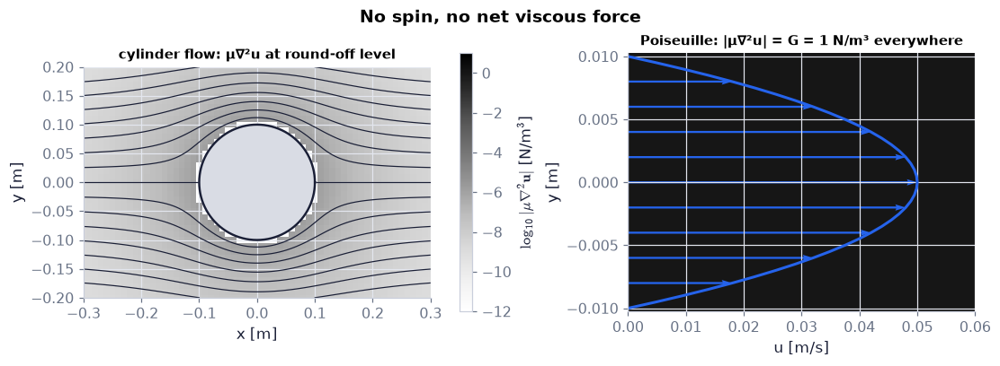

In [7]:
nx, ny = (61, 41) if not FAST else (41, 27)               # probe grid (fewer points in FAST mode)
xs, ys = np.linspace(-0.3, 0.3, nx), np.linspace(-0.2, 0.2, ny)   # region round the cylinder [m]
VF = np.full((ny, nx), np.nan)                            # |μ∇²u| at each probe [N/m³]; NaN inside the body
for j, y in enumerate(ys):                                # loop over rows (y) …
    for i, x in enumerate(xs):                            # … and columns (x)
        if np.hypot(x, y) > 0.105:                        # outside the cylinder (a = 0.1 m) plus a stencil margin
            VF[j, i] = np.linalg.norm(ch06.ideal_flow_residuals("cylinder", x=(x, y))["viscous_force"])
fig, (a1, a2) = plt.subplots(1, 2, figsize=(10, 3.6))     # two panels: potential flow | Poiseuille flow
im = a1.pcolormesh(xs, ys, np.log10(VF + 1e-16), cmap="Greys", vmin=-12, vmax=1, shading="auto")   # log₁₀ of the force
flow_net(a1, pf.cylinder(1.0, 0.1), xlim=(-0.3, 0.3), ylim=(-0.2, 0.2), n=161, n_levels=15,
         body=circle(0.1))                                # streamlines and the body on top
a1.set_title("cylinder flow: μ∇²u at round-off level", fontsize=10)
fig.colorbar(im, ax=a1, label=r"$\log_{10}|\mu\nabla^2\mathbf{u}|$ [N/m$^3$]")
yp = np.linspace(-0.01, 0.01, 41)                         # across the 2 cm Poiseuille gap [m]
up = 1.0/(2e-3)*(0.01**2 - yp**2)                         # u(y) = G(h0² − y²)/2μ [m/s]
vfp = [np.linalg.norm(ch06.ideal_flow_residuals("poiseuille", x=(0.0, y))["viscous_force"]) for y in yp]   # |μ∇²u| [N/m³]
a2.pcolormesh([0, 0.06], yp, np.log10(np.array(vfp))[:, None]*np.ones((1, 2)), cmap="Greys", vmin=-12, vmax=1, shading="auto")
a2.quiver(0*yp[::4], yp[::4], up[::4], 0*yp[::4], color=COLORS["blue"], angles="xy", scale_units="xy", scale=1.0, width=0.006)
a2.plot(up, yp, color=COLORS["blue"], lw=2)               # the parabolic profile
a2.set_xlim(0, 0.06); a2.set_xlabel("u [m/s]"); a2.set_ylabel("y [m]")   # axes with units
a2.set_title("Poiseuille: |μ∇²u| = G = 1 N/m³ everywhere", fontsize=10)
fig.suptitle("No spin, no net viscous force", fontweight="bold")
savefig(fig, "ch06", "c01_viscous_force"); plt.show()    # save the PNG to outputs/ch06, then draw

**What you see.** Left, streamlines round the cylinder over a grey background: log₁₀ of the viscous force is round-off (about −12 … −8) far away and ≈ −6 … −4 right next to the body (the stencil's truncation error there, still ~10⁸ times smaller than the inertia term); right, the parabolic Poiseuille profile over a uniformly dark strip (log₁₀ 1 = 0).

**How to read it.** A potential flow has $\mu\nabla^2\mathbf u=-\mu\nabla\times\boldsymbol\omega=0$ everywhere, although the fluid is viscous; Poiseuille flow is all spin, and its viscous force is the same G at every height.

**What would change if…** …μ multiplied by 100: the right panel's force stays G (the profile flattens 100 times so that μ∇²u still balances G), the left panel stays at round-off — no μ can create a net viscous force where ω = 0.

📝 **Note.** **Separation breaks the limit** `N03` — As Re grows, an attached boundary layer thins toward zero and real flow approaches ideal flow. But where the layer
separates (behind a cylinder, off a sharp corner) a wake of spinning fluid forms whose size does not shrink with Re: the
limit μ → 0 of real flow is then *not* the flow with μ = 0. Ch. 9 explains separation; C06 shows its pressure signature
on a cylinder.

📝 **Note.** **In and out** `N04` — Excluded: fluids of varying density, high subsonic and supersonic speeds, boundary layers, wakes, flows inside pipes,
any region where elements spin. Included: flight (Ch. 14), water waves (Ch. 7), flow round vehicles and structures.

> ⚠️ **Common confusion:** "ideal flow = inviscid fluid". The fluid can be as viscous as honey; what matters is ω = 0. D01 shows the viscous
*stress* survives (step 5 of the tiny example: 0.004 Pa); only its net force vanishes. What ideal flow gives up is the
*no-slip* condition.

**What would change if…** …the fluid were stratified (density varying with height)? Then the baroclinic torque $\nabla\rho\times\nabla p/\rho^2$
(Ch. 5 §5.2) creates vorticity in the interior and Kelvin's theorem fails: the outer flow is no longer irrotational. That
is the everyday case in the atmosphere and ocean — which is why Ch. 13 needs potential *vorticity*, not a potential.

---

## 6.2 Two-Dimensional Stream Function and Velocity Potential

**What is this section about?** In a plane flow two scalar functions carry the whole velocity field: the stream
function ψ (its contours are streamlines) and the velocity potential φ (its gradient is the velocity). Irrotational flow
turns both into solutions of Laplace's equation, which is *linear* — and that is the key to the whole chapter.

> 🔁 **Recap — Plane continuity** (Ch. 4 §4.2). For constant density in two dimensions, $\partial u/\partial x+\partial v/\partial y=0$ *(Eq. 6.2)* — the plane form of
$\nabla\cdot\mathbf u=0$ *(Eq. 4.10)*.

> 🔁 **Recap — The stream function** (Ch. 4 §4.3). Define $u\equiv\partial\psi/\partial y$, $v\equiv-\partial\psi/\partial x$ *(Eq. 6.3)*; then
$\partial u/\partial x+\partial v/\partial y=0$ holds for any smooth ψ, because mixed partial derivatives commute. Along a
curve ψ = const the **total differential** vanishes, $0=d\psi=\frac{\partial\psi}{\partial x}dx+\frac{\partial\psi}{\partial y}dy
=-v\,dx+u\,dy$, so $(dy/dx)_\psi=v/u$ — the slope of a streamline. The difference of ψ between two streamlines is the
volume flow between them per unit depth [m²/s]. Ch. 4's `velocity_from_streamfunction_2d` differentiates a ψ function
numerically.

In [8]:
from fluidpy.core import streamfunction as sf           # Ch. 4's stream-function tools
print(sf.velocity_from_streamfunction_2d(lambda x, y: 2.0*y, 0.3, 0.7))   # ψ = Uy with U = 2 m/s → (u, v) = (2, 0) m/s

(1.9999999999908977, -0.0)


> 🔁 **Recap — Plane irrotationality** (Ch. 3 §3.4). A 2-D flow has no spin when $\partial v/\partial x-\partial u/\partial y=0$ *(Eq. 6.9)* — the third component of the
vorticity, $\omega_3=\frac{\partial u_2}{\partial x_1}-\frac{\partial u_1}{\partial x_2}$ *(Eq. 3.16)*, set to zero. When
$\boldsymbol\omega=0$ *(Eq. 3.17)* the velocity is a gradient, $\mathbf u=\nabla\phi$ — and in a **simply connected**
region (one without holes, where every loop can be shrunk to a point inside the fluid) φ is single-valued.

> 🔁 **Recap — Polar continuity** (App. B; operators recapped in Ch. 4). $\frac1r\frac{\partial}{\partial r}(ru_r)+\frac1r\frac{\partial u_\theta}{\partial\theta}=0$ *(Eq. 6.19)* — the divergence
in polar coordinates (Appendix B).

> 🔁 **Recap — Polar irrotationality** (Ch. 3 §3.4). $\frac1r\frac{\partial}{\partial r}(ru_\theta)-\frac1r\frac{\partial u_r}{\partial\theta}=0$ *(Eq. 6.20)*.

> 🔁 **Recap — Polar Laplacian of ψ** (App. B; operators recapped in Ch. 4). $\nabla^2\psi=\frac1r\frac{\partial}{\partial r}\Big(r\frac{\partial\psi}{\partial r}\Big)+\frac1{r^2}\frac{\partial^2\psi}{\partial\theta^2}=0$
*(Eq. 6.23a)* — used in D03.

> 🔁 **Recap — Polar Laplacian of φ** (App. B; operators recapped in Ch. 4). The same operator on φ, $\nabla^2\phi=\frac1r\frac{\partial}{\partial r}\Big(r\frac{\partial\phi}{\partial r}\Big)+\frac1{r^2}\frac{\partial^2\phi}{\partial\theta^2}=0$
*(Eq. 6.23b)*. Below, sympy applies this polar Laplacian to four functions we will meet as flows.

> 🔁 **Tools from earlier chapters used here** (see `knowledge/primers.md`)

- **sympy diff, simplify, symbols** — `sp.symbols` makes symbols, `sp.diff` differentiates, `sp.simplify` tidies an expression (Ch. 1 P40).

In [9]:
r, th = sp.symbols("r theta", positive=True)            # polar coordinates as symbols (r > 0)
lap = lambda f: sp.diff(r*sp.diff(f, r), r)/r + sp.diff(f, th, 2)/r**2   # the polar Laplacian of (6.23a, b)
print([sp.simplify(lap(f)) for f in (r*sp.sin(th), sp.log(r), sp.cos(th)/r, r**2*sp.sin(2*th))])   # [0, 0, 0, 0]

[0, 0, 0, 0]


**What does the code above do?**

The four functions are the ψ of a uniform stream ($r\sin\theta=y$), the ψ or φ of a vortex or source (ln r), the φ of a
doublet (cos θ/r, C04) and the ψ of a corner flow ($r^2\sin2\theta=2xy$, C04). All four have zero Laplacian for r > 0:
they are **harmonic**.

### 🧩 Vorticity is minus the Laplacian of ψ — and vortices and sources are point sources of Laplace's equation `C02`

*The question:* Every irrotational plane flow obeys one equation. Which — and what makes a whirlpool or a spring different from the flow
around them?

*In one line:* $\omega_z=\frac{\partial v}{\partial x}-\frac{\partial u}{\partial y}=-\nabla^2\psi$ *(6.4)*

#### The problem in plain words

Look down at a bath draining (a whirlpool) and at a garden sprinkler lying flat (a spring). Around both the water moves
without spinning; yet one stirs the water round and the other pushes it out. We want one equation for all such flows,
and a way to say exactly how strong the whirl or the spring is.

#### The idea

| | stream function ψ | potential φ |
|---|---|---|
| defined by | $u=\partial\psi/\partial y$, $v=-\partial\psi/\partial x$ | $u=\partial\phi/\partial x$, $v=\partial\phi/\partial y$ |
| automatic | continuity | irrotationality |
| the other law gives | $\nabla^2\psi=-\omega_z$ | $\nabla^2\phi=q$ (sources) |
| point singularity | vortex: $-\Gamma\delta$ | source: $m\delta$ |

**Away from a few special points both ψ and φ are harmonic: ∇² = 0. The special points carry all the information.**

> 🔁 **Tools from earlier chapters used here** (see `knowledge/primers.md`) — the Laplacian itself is Ch. 2 §2.9; the Dirac delta as a concentrated total is Ch. 2 and Ch. 5 P139

- **natural logarithm, d(ln r)/dr = 1/r** — $\ln$ is the inverse of $e^x$, and $\frac{d}{dr}\ln r=\frac1r$ (Ch. 1 P36).

#### 🧮 Derivation — Vorticity is minus the Laplacian of the stream function `D02` (Eq. 6.4: $\omega_z=\frac{\partial v}{\partial x}-\frac{\partial u}{\partial y}=-\nabla^2\psi$)

**What we want to show.** Express the vorticity of a plane flow through its stream function, and conclude which equation ψ satisfies in irrotational flow.

**Assumptions.** ψ twice continuously differentiable (steps 1–2); irrotational except at isolated points (steps 4–5).

**The plan.**

1. Substitute (6.3), $u\equiv\partial\psi/\partial y,\ v\equiv-\partial\psi/\partial x$ into each derivative.
2. Collect the second derivatives.
3. Set ω_z = 0, then allow a point of concentrated vorticity.

**Tools we use** (each explained before this point): ψ (R03) · the plane vorticity (R04, Ch. 3 §3.4) · the Laplacian (Ch. 2 §2.9) · the 2-D delta (C02 primer "2-D divergence theorem and the Dirac delta in the plane", placed before D03 — this derivation only names it).

**We start from**

$$ \omega_z=\frac{\partial v}{\partial x}-\frac{\partial u}{\partial y}\ \text{with}\ u\equiv\partial\psi/\partial y\ \text{,}\ v\equiv-\partial\psi/\partial x\ \text{(6.3)} $$

*In words:* vorticity is the local spin; ψ gives the velocity.

---

**Step 1 of 5 — Substitute v = −∂ψ/∂x.**

$$ \frac{\partial v}{\partial x}=\frac{\partial}{\partial x}\Big(-\frac{\partial\psi}{\partial x}\Big)=-\frac{\partial^2\psi}{\partial x^2} $$

- *Why we can do this:* (6.3), $u\equiv\partial\psi/\partial y,\ v\equiv-\partial\psi/\partial x$ defines v through ψ; differentiating it once more in x is allowed for a smooth ψ. The minus sign comes from the definition of v.
- *In words:* How fast v changes across x is minus the curvature of ψ in x.

---

**Step 2 of 5 — Substitute u = ∂ψ/∂y.**

$$ \frac{\partial u}{\partial y}=\frac{\partial}{\partial y}\Big(\frac{\partial\psi}{\partial y}\Big)=\frac{\partial^2\psi}{\partial y^2} $$

- *Why we can do this:* Same move for the other term of ω_z, using u = ∂ψ/∂y from (6.3), $u\equiv\partial\psi/\partial y,\ v\equiv-\partial\psi/\partial x$.
- *In words:* How fast u changes up the page is the curvature of ψ in y.

---

**Step 3 of 5 — Subtract: ω_z = step 1 − step 2.**

$$ \omega_z=-\frac{\partial^2\psi}{\partial x^2}-\frac{\partial^2\psi}{\partial y^2}=-\nabla^2\psi $$

- *Why we can do this:* The definition ω_z = ∂v/∂x − ∂u/∂y; both terms carry a minus, so they combine into minus the Laplacian. This is (6.4), $\omega_z=\frac{\partial v}{\partial x}-\frac{\partial u}{\partial y}=-\nabla^2\psi$ — the line above.
- *In words:* The spin of a plane flow is minus the Laplacian of its stream function.

---

**Step 4 of 5 — Set the vorticity to zero.**

$$ \nabla^2\psi=0 $$

- *Why we can do this:* In irrotational flow ω_z = 0 everywhere in the region; (6.4), $\omega_z=\frac{\partial v}{\partial x}-\frac{\partial u}{\partial y}=-\nabla^2\psi$ then gives Laplace's equation, (6.5), $\nabla^2\psi=0$.
- *In words:* An irrotational stream function is harmonic.

---

**Step 5 of 5 — Concentrate vorticity Γ at one point.**

$$ \omega_z=\Gamma\,\delta(x-x')\delta(y-y')\ \Rightarrow\ \nabla^2\psi=-\Gamma\,\delta(x-x')\delta(y-y') $$

- *Why we can do this:* A point vortex has zero vorticity everywhere except at x′, with total ∫ω_z dA = Γ (Stokes: the circulation); a delta of weight Γ is exactly that. Substitute into (6.4), $\omega_z=\frac{\partial v}{\partial x}-\frac{\partial u}{\partial y}=-\nabla^2\psi$. This is (6.6), $\nabla^2\psi=-\Gamma\,\delta(x-x')\,\delta(y-y')$ — the line above.
- *In words:* A point vortex is a point source of ψ's Laplacian, with strength −Γ.

---

**Result**

$$ \omega_z=-\nabla^2\psi\ \text{(6.4); irrotational flow:}\ \nabla^2\psi=0\ \text{(6.5); a point vortex:}\ \nabla^2\psi=-\Gamma\,\delta(x-x')\delta(y-y') $$

*In words:* away from vortices ψ is harmonic; each vortex is a point singularity of strength −Γ.

**What it means.** Ch. 10's vorticity–stream-function method and Ch. 13's potential-vorticity inversion start here: knowing ω, solve a Poisson equation for ψ.

**Check it.** Units: ω_z [1/s], ψ [m²/s], ∇² [1/m²] ✓; Γδδ [m²/s × 1/m²] = 1/s ✓. Example: ψ = −(r²)Γ/(4πa²) inside a Rankine core gives −∇²ψ = Γ/πa² (the uniform core vorticity, 31.8 s⁻¹ for Γ = 1, a = 0.1) ✓.

> ⚠️ **Common confusion (traps in `D02`):** The sign: the minus appears because v = −∂ψ/∂x. "Irrotational" in a region with a vortex means "except at the vortex".

📝 **Note.** **Laplace for ψ** `N05` — In irrotational flow the vorticity equation becomes Laplace's equation for ψ; its solutions are called *harmonic*:

$$ \nabla^2\psi=0 \qquad \text{(6.5)} $$

📝 **Note.** **A point vortex** `N06` — A point (ideal) vortex of strength Γ at (x′, y′) is all its vorticity squeezed into one point — a delta function. D03
below shows that $\psi=-\frac{\Gamma}{2\pi}\ln r$ does exactly this, although the book never writes it out:

$$ \nabla^2\psi=-\Gamma\,\delta(x-x')\,\delta(y-y') \qquad \text{(6.6)} $$

> 📎 **Primer — 2-D divergence theorem and the Dirac delta in the plane.** `P149` · In the plane, Gauss' theorem says the total of ∇²f over a region equals the outward flux of ∇f through its edge:
$\int_A\nabla^2 f\,dA=\oint_C\nabla f\cdot\mathbf n\,ds$. A 2-D delta $\delta(x)\delta(y)$ is zero everywhere except at
the origin, with total 1 over any region that contains it. So a function whose Laplacian is zero away from the origin
but whose flux through every circle round it is the same number F has $\nabla^2 f=F\,\delta(x)\delta(y)$. Demo: the flux
of ∇ ln r (which is $\mathbf e_r/r$) through a circle of radius R.

In [10]:
th = np.linspace(0, 2*np.pi, 400, endpoint=False)       # 400 equally spaced angles on a circle [rad]
R = 3.0                                                  # the circle's radius [m]
integrand = np.full(th.size, 1/R) * R                    # ∇ln r · n = 1/R times the arc element ds = R dθ
flux = np.sum(integrand) * (2*np.pi/400)                 # periodic trapezoid sum over the full turn
print(flux, 2*np.pi)                                     # 6.283185… both: the flux of ∇ln r is 2π for any R

6.283185307179587 6.283185307179586


#### 🧮 Derivation — ln r is harmonic, yet its flux through every circle is 2π: the vortex and source as deltas `D03` (Eq. 6.6: $\nabla^2\psi=-\Gamma\,\delta(x-x')\,\delta(y-y')$)

**What we want to show.** Show that ψ = −(Γ/2π) ln r and φ = (m/2π) ln r really solve (6.6), $\nabla^2\psi=-\Gamma\,\delta(x-x')\,\delta(y-y')$ and (6.13), $\nabla^2\phi=m\,\delta(x-x')\,\delta(y-y')$ — Laplace everywhere except at the origin, with the right strength there. The book leaves this to Exercises 6.1b and 6.3b; we write it out.

**Assumptions.** r > 0 for steps 1–2; distributions (deltas) for steps 5–6.

**The plan.**

1. Compute ∇² ln r away from the origin (zero).
2. Compute the flux of ∇ ln r through a circle (2π, any radius).
3. Use the 2-D divergence theorem to identify a delta.
4. Multiply by the elements' constants.

**Tools we use** (each explained before this point): polar Laplacian (6.23a), $\nabla^2\psi=\frac1r\frac{\partial}{\partial r}\Big(r\frac{\partial\psi}{\partial r}\Big)+\frac1{r^2}\frac{\partial^2\psi}{\partial\theta^2}=0$ (R08) · 2-D divergence theorem and the Dirac delta in the plane (primer, in C02) · d(ln r)/dr = 1/r (ch01 P36, reminder).

**We start from**

$$ \psi=-\frac{\Gamma}{2\pi}\ln r\ \text{(6.8) and}\ \phi=\frac{m}{2\pi}\ln r\ \text{(6.15),}\ r=\sqrt{x^2+y^2} $$

*In words:* both elements are multiples of ln r.

---

**Step 1 of 9 — Use the polar Laplacian for f(r).**

$$ \nabla^2\ln r=\frac1r\frac{d}{dr}\Big(r\frac{d\ln r}{dr}\Big) $$

- *Why we can do this:* (6.23a), $\nabla^2\psi=\frac1r\frac{\partial}{\partial r}\Big(r\frac{\partial\psi}{\partial r}\Big)+\frac1{r^2}\frac{\partial^2\psi}{\partial\theta^2}=0$ with no θ-dependence drops the θ-term; ln r depends on r only.
- *In words:* For a function of distance alone, only the radial part of the Laplacian remains.

---

**Step 2 of 9 — Differentiate: d(ln r)/dr = 1/r.**

$$ \frac1r\frac{d}{dr}\Big(r\cdot\frac1r\Big)=\frac1r\frac{d}{dr}(1)=0\quad(r>0) $$

- *Why we can do this:* r × (1/r) = 1 is constant, so its derivative vanishes; valid wherever r ≠ 0.
- *In words:* Away from the origin ln r is harmonic.

---

**Step 3 of 9 — Take the gradient of ln r.**

$$ \nabla\ln r=\frac{1}{r}\mathbf e_r $$

- *Why we can do this:* The gradient of a function of r alone points along e_r with size d/dr (polar gradient); we need it to compute a flux.
- *In words:* ln r increases outward, by 1/r per metre.

---

**Step 4 of 9 — Integrate its flux over a circle R.**

$$ \oint_{r=R}\nabla\ln r\cdot\mathbf n\,ds=\int_0^{2\pi}\frac1R\,R\,d\theta=2\pi $$

- *Why we can do this:* On the circle n = e_r and ds = R dθ; the 1/R and the R cancel. The book skips this move.
- *In words:* The outward flux is 2π for every circle — it does not depend on R.

---

**Step 5 of 9 — Apply the 2-D divergence theorem.**

$$ \int_{r<R}\nabla^2\ln r\,dA=\oint_{r=R}\nabla\ln r\cdot\mathbf n\,ds=2\pi $$

- *Why we can do this:* Gauss in the plane turns the area total of a Laplacian into the boundary flux of the gradient (primer); step 4 gives the value.
- *In words:* The total Laplacian inside any disc round the origin is 2π.

---

**Step 6 of 9 — Recognise a delta of weight 2π.**

$$ \nabla^2\ln r=2\pi\,\delta(x)\delta(y) $$

- *Why we can do this:* Zero everywhere except at the origin (step 2), yet 2π in total over any disc containing it (step 5): that is the definition of 2π times the delta.
- *In words:* ln r is harmonic except at one point, which carries all of its Laplacian.

---

**Step 7 of 9 — Multiply by −Γ/2π and shift to x′.**

$$ \nabla^2\Big(-\frac{\Gamma}{2\pi}\ln\lvert\mathbf x-\mathbf x'\rvert\Big)=-\Gamma\,\delta(x-x')\delta(y-y') $$

- *Why we can do this:* ∇² is linear and does not care where the origin is; the constant −Γ/2π multiplies the delta's weight 2π. This is (6.6), $\nabla^2\psi=-\Gamma\,\delta(x-x')\,\delta(y-y')$ — the line above for (6.8), $\psi=-\frac{\Gamma}{2\pi}\ln\sqrt{(x-x')^2+(y-y')^2}$.
- *In words:* The vortex potential has exactly the point vorticity Γ.

---

**Step 8 of 9 — Multiply by m/2π for the source.**

$$ \nabla^2\Big(\frac{m}{2\pi}\ln\lvert\mathbf x-\mathbf x'\rvert\Big)=m\,\delta(x-x')\delta(y-y') $$

- *Why we can do this:* Same move with the source's constant from (6.15), $\phi=\frac{m}{2\pi}\ln\sqrt{(x-x')^2+(y-y')^2}$; this is (6.13), $\nabla^2\phi=m\,\delta(x-x')\,\delta(y-y')$.
- *In words:* The source is a point where volume m is created per second per metre of depth.

---

**Step 9 of 9 — Read m as a volume flux.**

$$ \oint\mathbf u\cdot\mathbf n\,ds=\oint\nabla\phi\cdot\mathbf n\,ds=\frac{m}{2\pi}\cdot2\pi=m $$

- *Why we can do this:* u = ∇φ, and step 4 gives the flux of ∇ ln r; so the flow out of any circle round the source is m [m²/s].
- *In words:* m is the volume leaving the source per second per metre of depth.

---

**Result**

$$ \begin{array}{l}\nabla^2\ln r=2\pi\delta(x)\delta(y)\ \text{, so}\ \psi=-\frac{\Gamma}{2\pi}\ln r\ \text{solves}\ \nabla^2\psi=-\Gamma\delta\delta\ \text{(6.6) and}\ \phi=\frac m{2\pi}\ln r\ \text{solves} \\ \nabla^2\phi=m\delta\delta\end{array} $$

*In words:* the elements are harmonic everywhere but at their centres, and a loop anywhere round a centre measures its strength.

**What it means.** The whole information of a vortex or a source sits in one point; that is why superposing a few points can build bodies (C03–C05) and why a numerical flux loop can measure circulation (Ch. 14).

**Check it.** Units: flux of ∇ψ [m²/s] = Γ ✓. Numbers: Γ = 2π, ∂ψ/∂r = −1/r; at r = 2: −0.5 × 4π = −2π = −Γ ✓ (C02 tiny example). `delta_flux_check` (the code cell after that example) gives −Γ on radii 0.01…100 m and 0 on a circle that misses the centre.

> ⚠️ **Common confusion (traps in `D03`):** "∇² ln r = 0" is true only for r > 0 — the total is not zero. m is flux per unit depth, not per radian. The sign of the vortex term follows from ψ = −(Γ/2π) ln r with Γ counterclockwise.

📝 **Note.** **Uniform flow in any direction** `N07` — U = 2, V = 1 m/s: ψ(1, 1) = −1 + 2 = 1 m²/s. Its twin (note `N13`) is $\phi=Ux+Vy$ *(Eq. 6.14)*.

$$ \psi=-Vx+Uy \qquad \text{(6.7)} $$

📝 **Note.** **The ideal vortex at (x′, y′)** `N08` — It spins the fluid round at $u_\theta=\frac{\Gamma}{2\pi r}$ *(Eq. 5.2)* (Ch. 3 §3.5, Ch. 5 §5.1).
> ⚠️ Γ is **counterclockwise positive** here and in all our code; the cylinder with circulation (C07) will use the
> book's clockwise Γ.

$$ \psi=-\frac{\Gamma}{2\pi}\ln\sqrt{(x-x')^2+(y-y')^2} \qquad \text{(6.8)} $$

📝 **Note.** **The point source (m > 0) or sink (m < 0)** `N14` — m is the volume flow out per unit depth [m²/s]: with m = 2π m²/s, $u_r=m/2\pi r=1/r$ — 1 m/s at 1 m, 0.5 m/s at 2 m.

$$ \phi=\frac{m}{2\pi}\ln\sqrt{(x-x')^2+(y-y')^2} \qquad \text{(6.15)} $$

> 🔁 **Tools from earlier chapters used here** (see `knowledge/primers.md`)

- **Poisson equation (6.11), $\nabla^2\phi=q(x,y)$** — $\nabla^2 f=$ a given source term; Ch. 5 P139 solved it in 3-D with a Green's function.

📝 **Note.** **Continuity with φ is Poisson's equation** `N10` — with a source density q [1/s] (the φ-twin of $\omega_z=-\nabla^2\psi$):

$$ \frac{\partial u}{\partial x}+\frac{\partial v}{\partial y}=\nabla^2\phi=q(x,y) \qquad \text{(6.11)} $$

📝 **Note.** **Laplace for φ** `N11` — without sources (note `N12`: with a point source, $\nabla^2\phi=m\,\delta(x-x')\,\delta(y-y')$ *(Eq. 6.13)*, which D03
step 8 derived):

$$ \nabla^2\phi=0 \qquad \text{(6.12)} $$

#### ✏️ Tiny example: a whirlpool and a spring with round numbers

1. Vortex, Γ = 2π m²/s at the origin: $\psi=-\ln r$ [m²/s]; $u_\theta=-\partial\psi/\partial r=1/r$ → 1 m/s at r = 1 m.
2. Flux of ∇ψ out of the circle r = 2 m: $\partial\psi/\partial r=-1/2$ m/s, times the length 2π × 2 = 4π m → −2π m²/s
   $=-\Gamma$ ✓ (the delta weight of (6.6), $\nabla^2\psi=-\Gamma\,\delta(x-x')\,\delta(y-y')$), for **any** radius (try r = 5: −1/5 × 10π = −2π).
3. Source, m = 2π m²/s: $u_r=1/r$; flow out of the circle r = 2: 0.5 × 4π = 2π m²/s = m ✓ (6.13), $\nabla^2\phi=m\,\delta(x-x')\,\delta(y-y')$.
4. Away from the centres, $\nabla^2\ln r=\frac1r\frac{d}{dr}(r\cdot\frac1r)=0$ (6.23a).

> 🔁 **Tools from earlier chapters used here** (see `knowledge/primers.md`)

- **dataclasses and named results** — fluidpy's elements are small frozen objects with methods: `pf.Vortex(G).psi(x, y)` (Ch. 4 P111).
- **periodic trapezoid rule on a closed loop** — on a closed loop the plain sum × Δθ is spectrally accurate — the demo in the primer above (Ch. 5 P136).

In [11]:
els = {"uniform": pf.Uniform(2.0, 1.0), "source": pf.Source(2*np.pi), "vortex": pf.Vortex(2*np.pi)}   # three elements
pts = (np.array([0.7, -1.2, 2.0]), np.array([0.4, 0.9, -1.5]))            # three ordinary points (x, y) [m]
for k, e in els.items():                                                  # the Laplacian of ψ and φ of each element
    print(f"{k:8s} max|∇²ψ| = {np.max(np.abs(pf.laplacian_residual(e.psi, *pts))):.1e}",
          f"max|∇²φ| = {np.max(np.abs(pf.laplacian_residual(e.phi, *pts))):.1e}")   # ≈ 0: harmonic away from centres
print("vortex, flux of ∇ψ on r = 0.01…100 m:", ch06.delta_flux_check("vortex", Gamma=2*np.pi))           # −Γ every time
print("source, flux of ∇φ on r = 0.01…100 m:", ch06.delta_flux_check("source", kind="phi", m=2*np.pi))    # +m every time
print("vortex, circle that misses the centre:", ch06.delta_flux_check("vortex", center=(5.0, 0.0), radii=(1.0,), Gamma=2*np.pi))   # 0

uniform  max|∇²ψ| = 8.1e-10 max|∇²φ| = 1.0e-09
source   max|∇²ψ| = 4.1e-10 max|∇²φ| = 2.1e-10
vortex   max|∇²ψ| = 2.1e-10 max|∇²φ| = 4.1e-10
vortex, flux of ∇ψ on r = 0.01…100 m: [-6.2832 -6.2832 -6.2832 -6.2832 -6.2832]
source, flux of ∇φ on r = 0.01…100 m: [6.2832 6.2832 6.2832 6.2832 6.2832]
vortex, circle that misses the centre: [0.]


**What does the code above do?**

1. Three elements as objects with `psi(x, y)` and `phi(x, y)` methods: a uniform stream (U, V) = (2, 1) m/s, a source
   m = 2π m²/s and a vortex Γ = 2π m²/s, both at the origin.
2. `laplacian_residual` applies a 4th-order 9-point stencil at three ordinary points: every element is harmonic there
   (the ~10⁻⁹ is round-off).
3. `delta_flux_check` sums ∇ψ·n (or ∇φ·n) round circles of radius 0.01 … 100 m by the periodic trapezoid rule: −Γ for
   the vortex and +m for the source on every circle — the delta weights of (6.6), $\nabla^2\psi=-\Gamma\,\delta(x-x')\,\delta(y-y')$ and (6.13), $\nabla^2\phi=m\,\delta(x-x')\,\delta(y-y')$.
4. A circle centred at (5, 0) with radius 1 m does not enclose the centre: its flux is 0.

In [12]:
x = np.linspace(-0.3, 0.3, 121)                         # a 121 × 121 grid across a Rankine vortex [m]
X, Y = np.meshgrid(x, x)                                # all grid points (rows = y, columns = x)
om = ch06.vorticity_from_psi("rankine", X, Y, Gamma=1.0, a=0.1)   # ω_z = −∇²ψ of a Rankine vortex, Γ = 1 m²/s, core a = 0.1 m
print(f"centre {om[60, 60]:.3f} 1/s, at r = 0.2 m {om[60, 100]:.1e} 1/s")   # Γ/πa² = 31.831 inside, 0 outside

centre 31.831 1/s, at r = 0.2 m -8.8e-11 1/s


**What does the code above do?**

A **Rankine vortex** (Ch. 3 §3.5) has a core of radius a turning like a solid body and an ideal vortex outside;
`rankine_vortex_psi` gives its ψ, $-\Gamma r^2/(4\pi a^2)$ inside and $-\frac{\Gamma}{2\pi}[\ln(r/a)+\tfrac12]$ outside.
`vorticity_from_psi` takes $-\nabla^2\psi$ by a stencil: the uniform core vorticity $\Gamma/\pi a^2=1/(\pi\cdot0.01)=31.83$
s⁻¹ inside and zero outside — Poisson inside, Laplace outside.

> 🔁 **Tools from earlier chapters used here** (see `knowledge/primers.md`)

- **numpy slicing for stencils** — `psi[1:-1, 2:]` is the whole grid shifted one column right; neighbour sums are shifted slices, no loops (Ch. 2 P77).

**From scratch — our own five-point −∇²ψ and our own loop sum of ∂ψ/∂n:**

In [13]:
psi = ch06.rankine_vortex_psi(X, Y, Gamma=1.0, a=0.1)    # ψ of the Rankine vortex on the grid [m²/s]
h = x[1] - x[0]                                          # grid spacing [m]
lap = (psi[1:-1, 2:] + psi[1:-1, :-2] + psi[2:, 1:-1] + psi[:-2, 1:-1] - 4*psi[1:-1, 1:-1])/h**2   # five-point ∇²ψ [1/s]
rr = np.hypot(X, Y)[1:-1, 1:-1]                          # distance of each interior node from the centre [m]
ok = np.abs(rr - 0.1) > 2*h                              # skip the core edge, where ψ'' jumps
dev = np.max(np.abs(-lap[ok] - om[1:-1, 1:-1][ok]))    # largest difference from the library's 4th-order vorticity [1/s]
print(f"largest difference {dev:.1e} 1/s (core vorticity 31.83 1/s)")   # the five-point stencil's h² error, near the core
assert dev < 0.01*31.83                                 # −∇²ψ by hand = the library's vorticity, to better than 1 %
th = np.linspace(0, 2*np.pi, 512, endpoint=False)        # 512 points on a circle [rad]
R = 0.7                                                  # its radius [m]
u, v = pf.Vortex(1.0).velocity(R*np.cos(th), R*np.sin(th))   # the vortex's velocity there, Γ = 1 m²/s
dpsidn = -(u*(-np.sin(th)) + v*np.cos(th))               # ∂ψ/∂n = ∂ψ/∂r = −u_θ, from (6.22)
mine = np.sum(dpsidn)*R*2*np.pi/512                      # ∮ ∂ψ/∂n ds with ds = R dθ
print(mine)                                              # −1.0 = −Γ
assert np.isclose(mine, ch06.delta_flux_check("vortex", radii=(0.7,), Gamma=1.0)[0])   # = the library's flux

largest difference 2.7e-02 1/s (core vorticity 31.83 1/s)
-0.9999999999999997


Our own stencil and our own loop sum agree with the library.

> 🔁 **Tools from earlier chapters used here** (see `knowledge/primers.md`) — before D04: the total differential dψ is recap R03; the dot product and perpendicular vectors are Ch. 2 §2.2

- **level sets** — a curve f = const is a level set; ∇f is perpendicular to it (Ch. 2 P75).

#### 🧮 Derivation — Equipotentials cross streamlines at right angles `D04` (Eq. 6.10: $u\equiv\partial\phi/\partial x,\ v\equiv\partial\phi/\partial y$)

**What we want to show.** Show that the lines φ = const and ψ = const are perpendicular wherever the flow moves, and find how ∇φ and ∇ψ are related.

**Assumptions.** u and v not both zero at the point (step 3): stagnation points excluded.

**The plan.**

1. Slopes of both families.
2. Their product.
3. The vector form.

**Tools we use** (each explained before this point): total differential (R03) · level sets (ch02 P75, reminder) · dot product and perpendicular vectors (Ch. 2 §2.2).

**We start from**

$$ u=\frac{\partial\phi}{\partial x}=\frac{\partial\psi}{\partial y},\ v=\frac{\partial\phi}{\partial y}=-\frac{\partial\psi}{\partial x}\ \text{(6.10) and (6.3)} $$

*In words:* one velocity, two ways to write it.

---

**Step 1 of 5 — Slope of a streamline.**

$$ d\psi=-v\,dx+u\,dy=0\ \Rightarrow\ \Big(\frac{dy}{dx}\Big)_\psi=\frac vu $$

- *Why we can do this:* Along a streamline ψ does not change; the total differential with (6.3), $u\equiv\partial\psi/\partial y,\ v\equiv-\partial\psi/\partial x$ gives the slope (R03).
- *In words:* Streamlines point along the velocity.

---

**Step 2 of 5 — Slope of an equipotential.**

$$ d\phi=u\,dx+v\,dy=0\ \Rightarrow\ \Big(\frac{dy}{dx}\Big)_\phi=-\frac uv $$

- *Why we can do this:* Same move for φ with (6.10), $u\equiv\partial\phi/\partial x,\ v\equiv\partial\phi/\partial y$: along an equipotential φ does not change.
- *In words:* Equipotentials run across the velocity.

---

**Step 3 of 5 — Multiply the two slopes.**

$$ \frac vu\cdot\Big(-\frac uv\Big)=-1 $$

- *Why we can do this:* Two lines are perpendicular exactly when their slopes multiply to −1; valid when u, v ≠ 0 (otherwise one slope is 0 and the other infinite — still perpendicular).
- *In words:* The two families meet at right angles.

---

**Step 4 of 5 — Write both gradients as vectors.**

$$ \nabla\phi=(u,v),\quad\nabla\psi=(-v,u)\ \Rightarrow\ \nabla\phi\cdot\nabla\psi=-uv+vu=0 $$

- *Why we can do this:* The components come from (6.10), $u\equiv\partial\phi/\partial x,\ v\equiv\partial\phi/\partial y$ and (6.3), $u\equiv\partial\psi/\partial y,\ v\equiv-\partial\psi/\partial x$; a zero dot product means perpendicular gradients, the vector version of step 3.
- *In words:* The gradients of φ and ψ are perpendicular and equally long, |∇φ| = |∇ψ| = speed.

---

**Step 5 of 5 — Recognise a quarter turn.**

$$ \nabla\psi=\mathbf e_z\times\nabla\phi,\qquad\nabla\phi=\nabla\psi\times\mathbf e_z $$

- *Why we can do this:* e_z × (u, v, 0) = (−v, u, 0) = ∇ψ: turning ∇φ by +90° gives ∇ψ. (The analysis writes ∇φ = e_z × ∇ψ; that has the wrong sign.)
- *In words:* ∇ψ is the velocity turned a quarter turn counterclockwise.

---

**Result**

$$ \nabla\phi\cdot\nabla\psi=0\ \text{,}\ \lvert\nabla\phi\rvert=\lvert\nabla\psi\rvert=\lvert\mathbf u\rvert\ \text{,}\ \nabla\psi=\mathbf e_z\times\nabla\phi $$

*In words:* the flow net is a grid of small squares, streamlines along the flow, equipotentials across it.

**What it means.** Crowded streamlines (fast flow) come with crowded equipotentials; conformal maps (C11) keep this square grid square.

**Check it.** Corner flow ψ = 2xy, φ = x² − y² at (1, 1): ∇φ = (2, −2), ∇ψ = (2, 2), dot 4 − 4 = 0 ✓, both lengths 2.83 ✓, e_z × (2, −2) = (2, 2) ✓. `orthogonality_check` ≲ 1e-9 on the cylinder with circulation (the code cell after note N09).

> ⚠️ **Common confusion (traps in `D04`):** At stagnation points both gradients vanish and "perpendicular" loses meaning. ∇ψ is u turned by +90°, not −90°.

📝 **Note.** **The potential** `N09` — (in any irrotational flow; single-valued if the region is simply connected, recap R04). D04 showed the lines of constant
φ cross the streamlines at right angles, and ∇ψ is ∇φ turned by +90°:

$$ u\equiv\partial\phi/\partial x,\ v\equiv\partial\phi/\partial y;\qquad (dy/dx)_{\phi=\text{const}}=-u/v \qquad \text{(6.10)} $$

In [14]:
flow = pf.cylinder(1.0, 1.0, Gamma_cw=2.0)               # the cylinder with circulation of C07 (U = 1 m/s, a = 1 m)
pts = (np.array([1.5, -2, 0.3]), np.array([0.4, 1.1, -1.8]))   # three points in the fluid [m]
print(ch06.orthogonality_check(flow, pts))               # max |∇φ·∇ψ|/|u|² ≈ 0: equipotentials ⟂ streamlines

1.4918944380887472e-10


> 🔁 **Tools from earlier chapters used here** (see `knowledge/primers.md`)

- **chain rule** — $\frac{d}{dt}f(x(t))=f'(x)\,x'(t)$; in polar coordinates it turns ∂/∂x, ∂/∂y into ∂/∂r, ∂/∂θ (Ch. 1 P49).

📝 **Note.** **Polar velocities** `N18` — (note `N19` is the θ-part; a chain-rule exercise the book gives "for quick reference"):

$$ u_r=\frac{\partial\phi}{\partial r}=\frac1r\frac{\partial\psi}{\partial\theta}\ \ (6.21),\qquad u_\theta=\frac1r\frac{\partial\phi}{\partial\theta}=-\frac{\partial\psi}{\partial r}\ \ (6.22)  $$

In [15]:
rs, ts = sp.symbols("r theta", positive=True)           # fresh polar symbols (th was reused for numbers above)
print(pf.polar_velocity_sym(-sp.log(rs), rs, ts, kind="psi"))   # the vortex with Γ = 2π: ψ = −ln r → (u_r, u_θ) = (0, 1/r)

(0, 1/r)


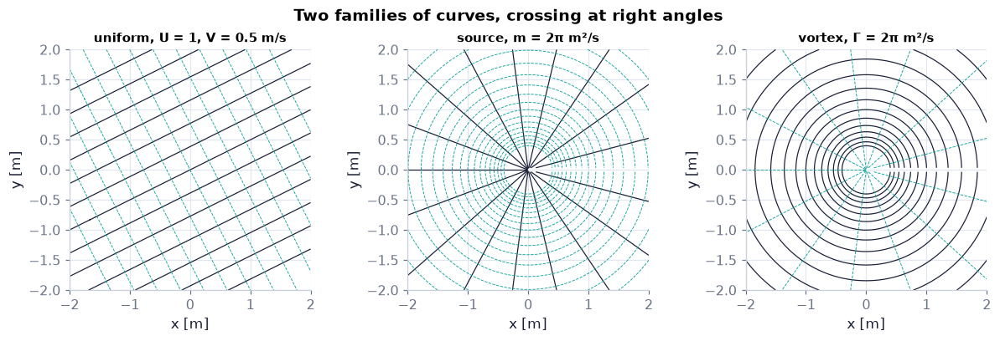

In [16]:
n = 241 if not FAST else 161                             # grid points per side of each flow net
fig, axs = plt.subplots(1, 3, figsize=(11, 3.6))         # three panels
flow_net(axs[0], pf.Uniform(1.0, 0.5), xlim=(-2, 2), ylim=(-2, 2), n=n, n_levels=13, phi=True, title="uniform, U = 1, V = 0.5 m/s")
flow_net(axs[1], pf.Source(2*np.pi, cut_angle=0.0), xlim=(-2, 2), ylim=(-2, 2), n=n, n_levels=17, phi=True,
         cut_ray=True, title="source, m = 2π m²/s")      # the branch cut of θ put along +x and blanked
flow_net(axs[2], pf.Vortex(2*np.pi, cut_angle=0.0), xlim=(-2, 2), ylim=(-2, 2), n=n, n_levels=13, phi=True,
         cut_ray=True, title="vortex, Γ = 2π m²/s")      # ψ circles, φ rays
fig.suptitle("Two families of curves, crossing at right angles", fontweight="bold")
savefig(fig, "ch06", "c02_flow_nets"); plt.show()        # save, then draw

**What you see.** In each panel two families of curves crossing at right angles: straight lines for the stream; rays (ψ) and circles (φ) for the source; circles (ψ) and rays (φ) for the vortex.

**How to read it.** Solid lines are streamlines (equal Δψ, so crowded lines mean fast flow); dashed teal lines are equipotentials (equal Δφ); D04's right angles hold everywhere except at the centres. A source is a vortex with ψ and φ swapped.

**What would change if…** …the vortex strength doubled: the same circles, twice as crowded — the velocity doubles (spacing = speed, the Ch. 4 `stream_function_spacing` explainer).

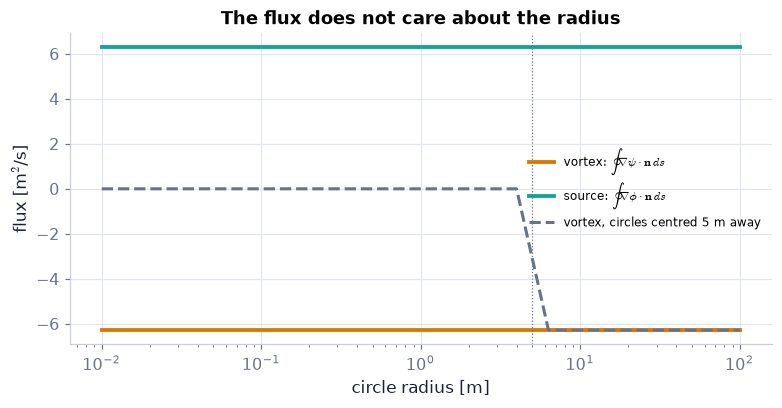

In [17]:
radii = np.logspace(-2, 2, 41)                           # circle radii from 0.01 to 100 m
fv = ch06.delta_flux_check("vortex", radii=radii, Gamma=2*np.pi)              # ∮∇ψ·n ds of the vortex [m²/s]
fs = ch06.delta_flux_check("source", radii=radii, kind="phi", m=2*np.pi)      # ∮∇φ·n ds of the source [m²/s]
ro = radii[np.abs(radii - 5.0) > 0.5]                   # skip circles that pass right through the vortex
fo = ch06.delta_flux_check("vortex", center=(5.0, 0.0), radii=ro, Gamma=2*np.pi)   # vortex at origin, circles round (5, 0)
fig, ax = plt.subplots(figsize=(7, 3.6))                 # one panel
ax.semilogx(radii, fv, color=COLORS["amber"], lw=2.5, label=r"vortex: $\oint\nabla\psi\cdot\mathbf{n}\,ds$")
ax.semilogx(radii, fs, color=COLORS["teal"], lw=2.5, label=r"source: $\oint\nabla\phi\cdot\mathbf{n}\,ds$")
ax.semilogx(ro, fo, color=COLORS["muted"], lw=2, ls="--", label="vortex, circles centred 5 m away")
ax.axvline(5.0, color=COLORS["muted"], lw=0.8, ls=":")   # where the off-centre circles start to enclose the vortex
ax.set_xlabel("circle radius [m]"); ax.set_ylabel("flux [m$^2$/s]")   # axes with units
ax.set_title("The flux does not care about the radius"); ax.legend(fontsize=8)
savefig(fig, "ch06", "c02_flux_vs_radius"); plt.show()   # save, then draw

**What you see.** Two flat lines at −2π (amber) and +2π (teal); the grey dashed line is 0 until the radius passes 5 m, then −2π.

**How to read it.** The whole Laplacian of the vortex and the source sits at one point — the delta of (6.6), $\nabla^2\psi=-\Gamma\,\delta(x-x')\,\delta(y-y')$ and (6.13), $\nabla^2\phi=m\,\delta(x-x')\,\delta(y-y')$: any circle round it measures the same strength, a circle that misses it measures nothing.

**What would change if…** …a Rankine core of radius 0.1 m: the amber line would rise from 0 at r = 0 to −Γ at r = 0.1 m and stay flat — the delta is smeared into a disc.

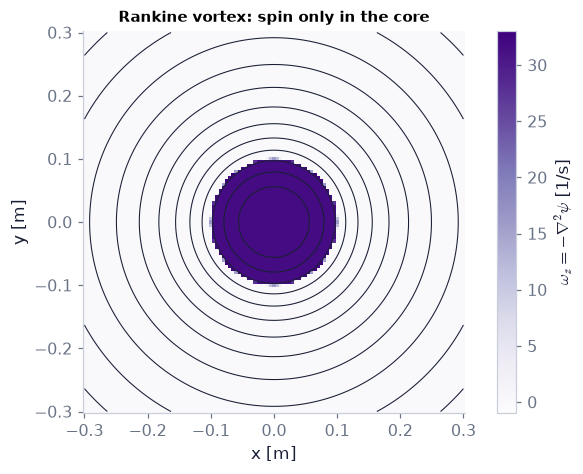

In [18]:
fig, ax = plt.subplots(figsize=(5.2, 4.2))               # one panel
im = ax.pcolormesh(x, x, om, cmap="Purples", shading="auto")   # ω_z = −∇²ψ [1/s]
ax.contour(X, Y, psi, levels=14, colors=COLORS["ink"], linewidths=0.7)   # streamlines (circles)
fig.colorbar(im, ax=ax, label=r"$\omega_z=-\nabla^2\psi$ [1/s]")
ax.set_aspect("equal"); ax.set_xlabel("x [m]"); ax.set_ylabel("y [m]")   # axes with units
ax.grid(False)                                           # no grid lines over the core
ax.set_title("Rankine vortex: spin only in the core", fontsize=10)
savefig(fig, "ch06", "c02_rankine_vorticity"); plt.show()   # save, then draw

**What you see.** A uniformly coloured disc of radius 0.1 m (31.8 s⁻¹) on a white background, with circular streamlines inside and outside.

**How to read it.** Outside the core ψ is harmonic and the flow is irrotational although it goes round; inside, ∇²ψ = −ω_z is a Poisson equation with a uniform right-hand side.

**What would change if…** …a shrunk with Γ fixed: the disc gets smaller and darker (Γ/πa²) — in the limit the point vortex of (6.6), $\nabla^2\psi=-\Gamma\,\delta(x-x')\,\delta(y-y')$.

📝 **Note.** **Two descriptions, one flow** `N15` — ψ and φ each describe the same plane ideal flow and will fuse into one complex potential $w=\phi+i\psi$ in C09. ψ also
works for rotational plane flow (the Rankine core above); φ works for unsteady and 3-D flow (C13, C15).

**What would change if…** …the vorticity were spread out (a smooth vortex)? Then $\nabla^2\psi=-\omega_z$ is a Poisson equation with a smooth
right-hand side, solved by the Green's-function sum of Ch. 5 §5.5 or on a grid (`ls.solve_poisson`, C12's method with a
source term). That is exactly how ocean and atmosphere models recover the stream function from the vorticity (Ch. 13's
potential-vorticity inversion).

> 🔁 **Recap — Bernoulli everywhere in irrotational flow** (Ch. 4 §4.9). Steady, constant density, irrotational: the Bernoulli constant is the same on every streamline,
$p+\tfrac12\rho\lvert\nabla\phi\rvert^2=p+\tfrac12\rho\lvert\nabla\psi\rvert^2=\text{const}$ *(Eq. 6.18, from 4.72), $\tfrac12u_i^2+\int_{p_o}^{p}\frac{dp'}{\rho(p')}+gz=\text{const everywhere}$*;
$\lvert\nabla\psi\rvert=\lvert\nabla\phi\rvert$ by D04. Unsteady flow adds ρ∂φ/∂t:
$\frac{\partial\phi}{\partial t}+\tfrac12\lvert\nabla\phi\rvert^2+\int\frac{dp}{\rho}+gz=\text{const}$ *(Eq. 4.75)*. So once ψ or
φ is known, the pressure is free — the nonlinear momentum equation is solved by one algebraic line. Symbols: ρ is the
density [kg/m³], p∞ the pressure far upstream [Pa]. Below, `bernoulli_function` (Ch. 4) returns ½|u|² + p/ρ + gz at
four points on different streamlines of the half-body of C05.

In [19]:
from fluidpy.core import bernoulli as be                 # Ch. 4's Bernoulli tools
f = pf.half_body(1.0, 2*np.pi)                           # a stream U = 1 m/s plus a source m = 2π m²/s (C05)
X = np.array([-3.0, 0.5, 2.0, -1.0]); Y = np.array([2.0, 3.5, -4.0, 1.5])   # four points on different streamlines [m]
p = f.pressure(X, Y, rho=1000.0, p_inf=0.0, U=1.0)       # p − p∞ from (6.18) [Pa], water
print(be.bernoulli_function(f.speed(X, Y), p, 0.0, rho=1000.0, g=0.0))   # ½|u|² + p/ρ: the same 0.5 J/kg at all four

[0.5 0.5 0.5 0.5]


### 🧩 Superposition — and any streamline can be a wall `C03`

*The question:* If every element solves Laplace's equation, where does the body come from — and who imposes its boundary condition?

*In one line:* $\nabla^2(\phi_1+\phi_2)=\nabla^2\phi_1+\nabla^2\phi_2=0$, and on a stationary wall
$\partial\phi/\partial n=0$ or $\partial\psi/\partial s=0$ *(Eq. 6.16)*.

#### The problem in plain words

Dye streaks in a river bend round a stone you cannot see. Could we produce that pattern without ever drawing the stone —
by adding flows we already know and then *declaring* one of the streamlines to be a wall?

#### The idea

```
uniform stream  +  source  =  a flow with a stagnation point S
                                   |
     the streamline through S -----+---> call it a wall: no flow crosses a streamline,
                                          so the no-through-flow condition (6.16) already holds there
```

*The numbered equations in the sketch:* $\mathbf n\cdot\mathbf U_s=(\mathbf n\cdot\mathbf u)_{\text{surface}};\ \partial\phi/\partial n=0\ \text{or}\ \partial\psi/\partial s=0\ \text{(stationary)}$ *(6.16)*

**Laplace's equation is linear, so solutions add; the boundary condition is met by choosing which streamline is the
body.** A *stagnation point* is a point where the fluid is at rest, u = v = 0 (Ch. 3 §3.3).

> 🔁 **Tools from earlier chapters used here** (see `knowledge/primers.md`)

- **directional derivative ∂φ/∂n** — $\partial\phi/\partial n=\mathbf n\cdot\nabla\phi$ is the rate of change of φ along the unit vector n (Ch. 2 P75).
- **unit normal and tangent of a curve** — a curve's unit tangent t points along it; turning t by 90° gives the unit normal n (Ch. 3 P92).
- **complex numbers as points x + iy in code (`-1+0j`)** — fluidpy stores a point (x, y) as the complex number
     x + iy, written `-1+0j` for (−1, 0), and returns stagnation points the same way (i² = −1 was met in Ch. 1 P45;
     C09 explains complex numbers properly, primer P153) — here read x + iy simply as the pair of coordinates.

#### 🧮 Derivation — No flow through a wall ⇔ the wall is a streamline `D05` (Eq. 6.16: $\mathbf n\cdot\mathbf U_s=(\mathbf n\cdot\mathbf u)_{\text{surface}};\ \partial\phi/\partial n=0\ \text{or}\ \partial\psi/\partial s=0\ \text{(stationary)}$)

**What we want to show.** Show that the no-through-flow condition on a stationary wall is the same as saying ψ is constant along the wall — so any streamline of any flow can be turned into a solid wall.

**Assumptions.** The wall does not move (step 1); a plane flow (step 3).

**The plan.**

1. Stationary wall.
2. Write n·u with φ.
3. Write it with ψ via the tangent.
4. Conclude.

**Tools we use** (each explained before this point): directional derivative ∂f/∂n = n·∇f (ch02 P75, reminder) · unit tangent and normal (ch03 P92, reminder) · D04's ∇ψ = e_z × ∇φ.

**We start from**

$$ \mathbf n\cdot\mathbf U_s=(\mathbf n\cdot\mathbf u)_{\text{on the surface}}\ \text{(6.16)} $$

*In words:* the fluid's normal velocity matches the wall's.

---

**Step 1 of 5 — Hold the wall still.**

$$ \mathbf U_s=0\ \Rightarrow\ \mathbf n\cdot\mathbf u=0\ \text{on the wall} $$

- *Why we can do this:* (6.16), $\mathbf n\cdot\mathbf U_s=(\mathbf n\cdot\mathbf u)_{\text{surface}};\ \partial\phi/\partial n=0\ \text{or}\ \partial\psi/\partial s=0\ \text{(stationary)}$ with a wall at rest; this is the only condition ideal flow keeps (D01 step 8).
- *In words:* No fluid crosses the wall.

---

**Step 2 of 5 — Express n·u through φ.**

$$ \mathbf n\cdot\mathbf u=\mathbf n\cdot\nabla\phi=\frac{\partial\phi}{\partial n}=0 $$

- *Why we can do this:* u = ∇φ, and n·∇φ is the rate of change of φ along n (directional derivative).
- *In words:* φ does not change across the wall.

---

**Step 3 of 5 — Take the tangent t = e_z × n.**

$$ \frac{\partial\psi}{\partial s}=\mathbf t\cdot\nabla\psi=(\mathbf e_z\times\mathbf n)\cdot(\mathbf e_z\times\nabla\phi) $$

- *Why we can do this:* ∂ψ/∂s is the directional derivative along the wall's tangent; D04 step 5 gives ∇ψ = e_z × ∇φ. The sign of t depends on the walking direction.
- *In words:* The change of ψ along the wall is a quarter-turned version of the flow through it.

---

**Step 4 of 5 — Remove the double quarter turn.**

$$ (\mathbf e_z\times\mathbf n)\cdot(\mathbf e_z\times\nabla\phi)=\mathbf n\cdot\nabla\phi=\mathbf n\cdot\mathbf u $$

- *Why we can do this:* Turning two in-plane vectors by the same angle keeps their dot product (a rotation preserves angles and lengths).
- *In words:* How fast ψ changes along the wall equals the flow through the wall.

---

**Step 5 of 5 — Combine steps 2 and 4.**

$$ \frac{\partial\phi}{\partial n}=0\iff\frac{\partial\psi}{\partial s}=0\iff\psi=\text{const on the wall} $$

- *Why we can do this:* Both derivatives equal n·u; a function whose derivative along a curve vanishes is constant on it. This is the second half of (6.16), $\mathbf n\cdot\mathbf U_s=(\mathbf n\cdot\mathbf u)_{\text{surface}};\ \partial\phi/\partial n=0\ \text{or}\ \partial\psi/\partial s=0\ \text{(stationary)}$.
- *In words:* A stationary wall is a streamline, and any streamline may be replaced by a wall.

---

**Result**

$$ \partial\phi/\partial n=0\ \text{or}\ \partial\psi/\partial s=0\ \text{on a stationary surface} $$

*In words:* walls and streamlines are interchangeable in ideal flow.

**What it means.** The construction method of the chapter: add elements, pick the streamline you like, call it a body. A moving body needs n·u = n·U_s instead (D28).

**Check it.** Half-body: ψ = m/2 on the dividing streamline and `normal_velocity_on` ≲ 1e-10 there (the code cell after the tiny example of C03); cylinder: ψ = 0 on r = a, u_r(a, θ) = 0 ✓.

> ⚠️ **Common confusion (traps in `D05`):** ∂ψ/∂s = ±n·u — the sign flips with the walking direction, not the physics. Only a *stationary* wall is a streamline.

📝 **Note.** **No flow through a solid surface** `N16` — in its general and its stationary form. A stationary wall is a streamline, and any streamline may be replaced by a wall:

$$ \mathbf n\cdot\mathbf U_s=(\mathbf n\cdot\mathbf u)_{\text{surface}};\qquad \partial\phi/\partial n=0\ \text{or}\ \partial\psi/\partial s=0\ \text{on a stationary surface} \qquad \text{(6.16)} $$

> 🔁 **Tools from earlier chapters used here** (see `knowledge/primers.md`)

- **observed order from a log–log slope** — if an error behaves like C·hᵖ, the slope of log(error) against log(h) is p (Ch. 1 P13).

📝 **Note.** **The far field** `N17` — Far away the flow must return to the given stream (U along x; U = 0 is still fluid). How fast? For a closed body the
disturbance dies like 1/R² (a doublet, C04); for a half-body with a net source like 1/R:

$$ \partial\phi/\partial x=U,\quad\text{or}\quad\partial\psi/\partial y=U \qquad \text{(6.17)} $$

In [20]:
Rs = np.array([10.0, 20.0, 40.0, 80.0])                  # radii of four far circles [m]
e_cyl = [pf.far_field_check(pf.cylinder(1.0, 1.0), R) for R in Rs]        # max |(u − iv) − U| on |z| = R: closed body
e_half = [pf.far_field_check(pf.half_body(1.0, 2*np.pi), R) for R in Rs]  # the same for the open half-body
print(f"closed cylinder: slope {observed_order(Rs, e_cyl):.2f}   half-body: slope {observed_order(Rs, e_half):.2f}")   # −2 and −1

closed cylinder: slope -2.00   half-body: slope -1.00


#### ✏️ Tiny example: a stagnation point from two elements

Stream U = 1 m/s plus a source m = 2π m²/s at (−1, 0) m. At the point (−2, 0): the source is 1 m away, straight downstream
of the point, so it pushes the fluid there **upstream** at
$u=\frac{m}{2\pi}\frac{x-x'}{(x-x')^2+(y-y')^2}=\frac{2\pi}{2\pi}\cdot\frac{-1}{1}=-1$ m/s.

1. Sum: $u=1+(-1)=0$.
2. On the axis y = 0 the source adds no v, so $v=0$.
3. The fluid stops: a stagnation point, 1 m in front of the source — the nose of a body that nobody drew (C05 finds its
   whole shape).

In [21]:
f = pf.Flow([pf.Uniform(1.0), pf.Source(2*np.pi, -1+0j, cut_angle=2*np.pi)])   # stream U = 1 m/s + source m = 2π m²/s at (−1, 0)
print("velocity at (−2, 0):", f.velocity(-2.0, 0.0))     # (0, 0): a stagnation point
print("stagnation points:", f.stagnation_points())       # found by Newton's method on dw/dz: [-2+0j]
print("ψ there:", f.psi(-2.0, 0.0))                      # m/2 = π m²/s names the dividing streamline
th = np.linspace(0.05, 2*np.pi - 0.05, 4000)             # polar angles along the body (C05's shape) [rad]
xb, yb = ch06.half_body_shape(1.0, 2*np.pi, th)          # the dividing streamline of a source at the origin [m]
body = (xb - 1.0) + 1j*yb                                # shifted to the source at x = −1, as complex points
print("spread of ψ along it:", np.ptp(f.psi(body.real, body.imag)))   # np.ptp = max − min ≈ 0: one streamline
print("max normal velocity:", pf.normal_velocity_on(f, body, closed=False))   # ≈ 0: no flow crosses it

velocity at (−2, 0): (0.0, -0.0)
stagnation points: [-2.+0.j]
ψ there: 3.141592653589793
spread of ψ along it: 1.7763568394002505e-15
max normal velocity: 2.4964977632101833e-05


**What does the code above do?**

1. A flow is a list of elements; its velocity, ψ and φ are the sums of theirs. The source's ψ contains its polar angle
   θ′, which must jump by 2π somewhere; `cut_angle=2*np.pi` puts that jump along +x behind the source, *inside* the
   body, and counts θ′ from 0 to 2π, so ψ is smooth everywhere in the fluid (C05 says more about choosing the angle's range).
2. `stagnation_points` solves u − iv = 0 by Newton's method from several starting points (the method is primer P152 in
   C07) and checks each root.
3. The streamline through the stagnation point has ψ = m/2 (D07 will show why).
4. Along that curve ψ is constant to round-off, and the velocity component normal to the curve (normals from the 4000
   points of the polyline) is tiny — the small remainder is the error of approximating the curve by straight pieces. So
   no flow crosses the curve: by D05 it can be a wall.

**From scratch — the two velocities added by hand at one point:**

In [22]:
x, y = 0.5, 1.5                                          # a point in the flow [m]
u_hand = 1.0 + (2*np.pi/(2*np.pi))*(x + 1)/((x + 1)**2 + y**2)   # stream + source x-velocity (source at x = −1) [m/s]
v_hand = (2*np.pi/(2*np.pi))*y/((x + 1)**2 + y**2)       # the source's y-velocity [m/s]
print(u_hand, v_hand)                                    # our numbers
assert np.allclose((u_hand, v_hand), f.velocity(x, y))   # the library does nothing more than add

1.3333333333333333 0.3333333333333333


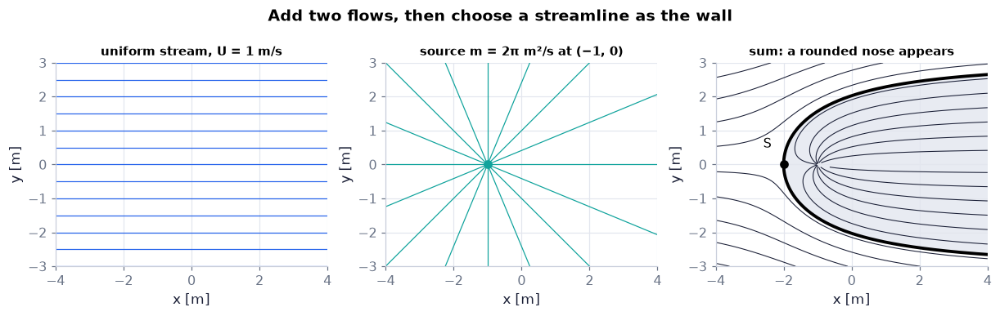

In [23]:
n = 241 if not FAST else 161                             # grid points per side
fig, axs = plt.subplots(1, 3, figsize=(11, 3.4))         # stream | source | sum
for yl in np.linspace(-3, 3, 13):                        # panel 1: streamlines of the stream are horizontal lines
    axs[0].axhline(yl, color=COLORS["blue"], lw=0.8)     # ψ = Uy = const
for ang in np.linspace(0, 2*np.pi, 16, endpoint=False):  # panel 2: streamlines of the source are rays
    axs[1].plot([-1, -1 + 8*np.cos(ang)], [0, 8*np.sin(ang)], color=COLORS["teal"], lw=0.8)   # ψ = mθ′/2π = const
axs[1].plot([-1], [0], "o", color=COLORS["teal"], ms=6)  # the source itself
for a_, t_ in zip(axs[:2], ("uniform stream, U = 1 m/s", "source m = 2π m²/s at (−1, 0)")):
    a_.set_xlim(-4, 4); a_.set_ylim(-3, 3); a_.set_aspect("equal"); a_.set_title(t_, fontsize=10)   # same frame
    a_.set_xlabel("x [m]"); a_.set_ylabel("y [m]")       # axes with units
xs_, ys_ = np.meshgrid(np.linspace(-4, 4, n), np.linspace(-3, 3, n))   # grid for the sum [m]
P3 = f.psi(xs_, ys_)                                     # ψ of the sum [m²/s]
P3 = np.where((np.abs(ys_) < 0.05) & (xs_ > -1), np.nan, P3)   # blank the source's cut, which lies inside the body
tb = np.linspace(0.02, 2*np.pi - 0.02, 800)              # angles along the body [rad]
xb2, yb2 = ch06.half_body_shape(1.0, 2*np.pi, tb)        # the body ψ = m/2 of a source at the origin [m]
axs[2].fill(xb2 - 1.0, yb2, color="#e8ebf2", zorder=0)   # shade the source's fluid (the body is shifted to x = −1)
axs[2].contour(xs_, ys_, P3, levels=np.arange(-3.0, 9.5, 0.5), colors=COLORS["ink"], linewidths=0.7)   # streamlines, Δψ = 0.5 m²/s
axs[2].plot(xb2 - 1.0, yb2, color="k", lw=2.5)           # the dividing streamline ψ = m/2, bold
axs[2].plot([-2], [0], "o", color="k", ms=6)             # the stagnation point S
axs[2].annotate("S", (-2, 0), (-2.6, 0.5)); axs[2].set_aspect("equal")
axs[2].set_xlim(-4, 4); axs[2].set_ylim(-3, 3); axs[2].set_xlabel("x [m]"); axs[2].set_ylabel("y [m]")
axs[2].set_title("sum: a rounded nose appears", fontsize=10)
fig.suptitle("Add two flows, then choose a streamline as the wall", fontweight="bold")
savefig(fig, "ch06", "c03_stream_plus_source"); plt.show()   # save, then draw

**What you see.** Straight blue lines, teal rays, and their sum: the streamlines part round a rounded nose; the bold black curve through S encloses the grey region filled by the source's fluid.

**How to read it.** No element knows about a body; the bold line is simply the streamline through S (ψ = m/2) — by D05 it is a wall, and everything outside it is the flow past a blunt body.

**What would change if…** …a sink of equal strength added 3 m downstream: the bold curve closes into an oval (the Rankine oval — try it in the superposition explainer after C05).

**What would change if…** …we added a vortex instead of a source? A vortex alone in a uniform stream makes a stagnation point off to one side but
no closed dividing streamline; combined with a closed body it produces lift (C07). The rule stays the same: add, then
find the streamline that can be a wall.

---

## 6.3 Construction of Elementary Flows in Two Dimensions

**What is this section about?** A kit of elementary flows — stream, source, vortex, corner, doublet — and what you get
by adding them: a blunt half-body, a cylinder with zero drag (d'Alembert's paradox), a spinning cylinder with lift, and
walls made by mirror images. Every body here is a streamline of a sum.

> 🔁 **Recap — The stagnation (corner) flow** (Ch. 3 §3.4). The simplest quadratic stream function, $\psi=2Axy$ *(Eq. 6.24)* (A in 1/s), gives u = 2Ax, v = −2Ay: fluid comes down
the y-axis, stops at the origin and leaves along the x-axis; streamlines are the hyperbolae xy = const. It is Ch. 3's
irrotational strain and the Ch. 4 "stagnation" preset. ⚠️ In Ch. 13 the same field is the deformation flow that sharpens
weather fronts. In code it is `pf.Corner(A, n=2)` (the n is explained in C09).

In [24]:
c = pf.Corner(1.0, n=2)                                  # the corner flow with A = 1 1/s
print(c.velocity(1.0, 0.5), c.psi(1.0, 0.5))             # (u, v) = (2Ax, −2Ay) = (2, −1) m/s and ψ = 2Axy = 1 m²/s

(2.0, -1.0) 1.0


> 🔁 **Recap — The vortex velocity** (Ch. 5 §5.1). Differentiating $\psi=-\frac{\Gamma}{2\pi}\ln\sqrt{(x-x')^2+(y-y')^2}$ *(Eq. 6.8)* gives $u=-\frac{\Gamma}{2\pi}\frac{y}{x^2+y^2}$,
$v=\frac{\Gamma}{2\pi}\frac{x}{x^2+y^2}$, i.e. $u_\theta=\frac{\Gamma}{2\pi r}$ *(Eq. 5.2)*: circles round the centre,
irrotational everywhere else. Ch. 5's Biot–Savart tool gives the same velocity.

In [25]:
from fluidpy.core import biot_savart as bs               # Ch. 5's point-vortex tools
print(pf.Vortex(1.0).velocity(0.3, 0.4))                 # our vortex, Γ = 1 m²/s at the origin, seen from (0.3, 0.4) m
print(bs.point_vortex_velocity(np.array([0.3, 0.4]), np.array([[0.0], [0.0]]), np.array([1.0])))   # Ch. 5: the same

(-0.25464790894703254, 0.1909859317102744)
[-0.2546  0.191 ]


### 🧩 The element kit, and the doublet as a merged source–sink pair `C04`

*The question:* What is left when a source and a sink merge — and why is that the piece that makes closed bodies?

*In one line:* $\phi=\frac{m\varepsilon}{\pi}\frac{x}{r^2}=-\frac{\mathbf d\cdot\mathbf x}{2\pi r^2}=\frac{\lvert\mathbf d\rvert}{2\pi}\frac{\cos\theta}{r}$ *(6.29)*

#### The problem in plain words

Hold two garden hoses nose to nose, one blowing water out, one sucking the same amount in. From far away the water just
loops from one to the other. Push them closer while turning both up so the loops do not vanish: the limit is a new
element, the doublet — the only one that disturbs the flow without adding or removing water or circulation. It is what
turns a stream into flow round a cylinder, a sphere, an airship.

#### The idea

```
source +m at (-eps, 0)   sink -m at (+eps, 0)        eps -> 0 with 2*m*eps = |d| fixed
      *---------------------o             ---->      (.)  doublet: streamlines are circles tangent to the x-axis
dipole vector d = sum of x_i m_i = -2*m*eps e_x  (it points from the sink to the source)
```

> 🔁 **Tools from earlier chapters used here** (see `knowledge/primers.md`) — log rules used below: $\ln\sqrt s=\tfrac12\ln s$, $\ln(ab)=\ln a+\ln b$, $\frac{\partial}{\partial x}\ln r=x/r^2$

- **first-order Taylor expansion, ln(1 + s) ≈ s** — for small s, $\ln(1+s)=s-s^2/2+\dots\approx s$ (Ch. 1 P26).
- **limits and orders of smallness O(ε²)** — O(ε²) means "shrinks at least as fast as ε²" — halving ε quarters it (Ch. 2 P68).

📝 **Note.** **Harmonic polynomials** `N20` — A constant (no flow), the linear stream $\psi=-Vx+Uy$ *(Eq. 6.7)* / $\phi=Ux+Vy$ *(Eq. 6.14)*, and two quadratic families
solve Laplace; in general the real and imaginary parts of $z^n=(x+iy)^n$ do (C09). Higher powers make sharper corners,
fractional powers wider ones.

In [26]:
for d in (2, 3):                                         # degree of the polynomial
    print(d, ch06.harmonic_polynomials(d)[-1])           # (Re zⁿ, Im zⁿ): each is harmonic (sympy checks ∇² = 0)

2 (x**2 - y**2, 2*x*y)
3 (x**3 - 3*x*y**2, 3*x**2*y - y**3)


**What does the code above do?**

sympy splits $z^n=(x+iy)^n$ into its real and imaginary parts; each is asserted harmonic inside the function (a preview
of D14 in C09): $x^2-y^2$ and $2xy$ for n = 2, $x^3-3xy^2$ and $3x^2y-y^3$ for n = 3.

📝 **Note.** **The corner family (notes `N22`, `N23` too)** `N21` — Swapping which function is which, or turning the axes by 45°, gives the relatives of $\psi=2Axy$ *(Eq. 6.24)*:
$\phi=2Axy$ *(6.25)*, $\psi=A(x^2-y^2)$ *(6.26)*, $\phi=A(x^2-y^2)$ *(6.27)*. (6.25) is the (6.24) flow turned by 45°
(x² − y² in axes turned by 45° becomes 2x′y′); (6.27) *is* (6.24): both are parts of the one function Az².

$$ \phi=2Axy\ \ (6.25),\qquad \psi=A(x^2-y^2)\ \ (6.26),\qquad \phi=A(x^2-y^2)\ \ (6.27)  $$

In [27]:
x, y = 0.7, 0.3                                          # a point [m]
print(pf.Corner(1.0, n=2).phi(x, y), x**2 - y**2)        # (6.27) is the φ of the (6.24) flow: 0.4 both
c45 = pf.Corner(1.0, n=2, rotate=np.pi/4)                # the same corner turned by 45°: w = A(z e^{−iπ/4})² = −iAz²
print(c45.phi(x, y), 2*x*y, c45.psi(x, y), -(x**2 - y**2))   # φ = 2Axy is (6.25); ψ = −A(x² − y²) is (6.26) with A → −A

0.3999999999999999 0.3999999999999999
0.42000000000000004 0.42 -0.4000000000000001 -0.3999999999999999


📝 **Note.** **Source velocities** `N24` — Differentiating the source potential $\phi=\frac{m}{2\pi}\ln\sqrt{x^2+y^2}$ *(Eq. 6.15)* gives $u=\frac{m}{2\pi}\frac{x}{x^2+y^2}$,
$v=\frac{m}{2\pi}\frac{y}{x^2+y^2}$, so $u_r=m/2\pi r$, $u_\theta=0$. ⚠️ The book says "differentiation of (6.8), $\psi=-\frac{\Gamma}{2\pi}\ln\sqrt{(x-x')^2+(y-y')^2}$" here; it
means (6.15), $\phi=\frac{m}{2\pi}\ln\sqrt{(x-x')^2+(y-y')^2}$. ∇·u = 0 except at r = 0, where all m m²/s come out (D03).

📝 **Note.** **The pair** `N25` — A source +m at (−ε, 0) and a sink −m at (+ε, 0). The dipole vector points from the sink to the source:

$$ \phi=\frac{m}{2\pi}\ln\sqrt{(x+\varepsilon)^2+y^2}-\frac{m}{2\pi}\ln\sqrt{(x-\varepsilon)^2+y^2},\qquad\mathbf d=\sum_i\mathbf x_im_i=-2m\varepsilon\,\mathbf e_x \qquad \text{(6.28)} $$

> 📎 **Primer — a limit with a product held fixed.** `P150` · Sometimes two quantities go to extremes together: here the gap ε → 0 while the strength m → ∞, with the product 2mε
held at a fixed value |d|. Either limit alone gives nothing useful (ε → 0 at fixed m cancels the pair; m → ∞ at fixed ε
blows up). Held together, the leading term survives and the rest shrinks like ε².

In [28]:
d = 2.0                                                  # fixed dipole strength |d| = 2mε [m³/s]
for eps in (0.2, 0.02, 0.002):                           # shrink the gap …
    m = d/(2*eps)                                        # … and raise the strength to keep 2mε = d [m²/s]
    phi = m/(2*np.pi)*np.log((1 + eps)/(1 - eps))        # the pair's potential at (1, 0) m [m²/s]
    print(eps, phi, d/(2*np.pi))                         # → 0.31831 (the doublet value); the gap shrinks like ε²

0.2 0.32265888103352036 0.3183098861837907
0.02 0.31835233769077637 0.3183098861837907
0.002 0.3183103105979912 0.3183098861837907


#### 🧮 Derivation — The doublet as the limit of a source–sink pair `D06` (Eq. 6.29: $\phi=\frac{m\varepsilon}{\pi}\frac{x}{r^2}=-\frac{\mathbf d\cdot\mathbf x}{2\pi r^2}=\frac{\lvert\mathbf d\rvert}{2\pi}\frac{\cos\theta}{r}$)

**What we want to show.** Find the potential left when a source and a sink of equal strength are pushed together while their strength grows so that 2mε stays fixed — the doublet — and see how fast the pair approaches it.

**Assumptions.** ε ≪ r, i.e. we look at points far from the pair compared with its size (steps 3–4); the order of limits: ε → 0 and m → ∞ together (step 7).

**The plan.**

1. Factor r² out of each square.
2. Expand each logarithm for small ε/r.
3. Subtract.
4. Take the limit with 2mε = |d| fixed and write it with the dipole vector.

**Tools we use** (each explained before this point): first-order Taylor ln(1 + s) ≈ s (ch01 P26, reminder) · log rules ln√s = ½ ln s, ln(ab) = ln a + ln b (gloss) · a limit with a product held fixed (primer, in C04) · the dipole vector d = Σx_i m_i (N25).

**We start from**

$$ \phi=\frac{m}{2\pi}\ln\sqrt{(x+\varepsilon)^2+y^2}-\frac{m}{2\pi}\ln\sqrt{(x-\varepsilon)^2+y^2}\ \text{(6.28)} $$

*In words:* a source +m at (−ε, 0) and a sink −m at (+ε, 0).

---

**Step 1 of 9 — Factor r² out of the square.**

$$ (x\pm\varepsilon)^2+y^2=r^2\Big(1\pm\frac{2\varepsilon x}{r^2}+\frac{\varepsilon^2}{r^2}\Big) $$

- *Why we can do this:* Expand the square and use r² = x² + y²; we want a "1 + small" form that a Taylor series can handle.
- *In words:* Seen from far away, moving a point by ε changes its distance only slightly.

---

**Step 2 of 9 — Split the logarithm.**

$$ \ln\sqrt{(x\pm\varepsilon)^2+y^2}=\ln r+\tfrac12\ln\Big(1\pm\frac{2\varepsilon x}{r^2}+\frac{\varepsilon^2}{r^2}\Big) $$

- *Why we can do this:* ln√(ab) = ½ln a + ½ln b and ½ ln r² = ln r (log rules). The book writes this with the square root kept; we halve explicitly.
- *In words:* Each element's potential is the centred one plus a small correction.

---

**Step 3 of 9 — Expand ln(1 + s) to first order.**

$$ \tfrac12\ln(1+s)\approx\tfrac12s,\quad s=\pm\frac{2\varepsilon x}{r^2}+\frac{\varepsilon^2}{r^2} $$

- *Why we can do this:* Taylor ln(1 + s) = s − s²/2 + … for small s (P26); ε ≪ r makes s small.
- *In words:* A small correction to a log is just the small quantity itself.

---

**Step 4 of 9 — Keep the order-ε part.**

$$ \ln\sqrt{(x\pm\varepsilon)^2+y^2}\cong\ln r\pm\frac{\varepsilon x}{r^2} $$

- *Why we can do this:* The ½ cancels the 2 of 2εx/r²; terms of order ε² are the same for both signs (step 9 shows they cancel in the difference). This is the book's first displayed line.
- *In words:* Moving the source by ε changes ln r by ±εx/r².

---

**Step 5 of 9 — Subtract sink from source.**

$$ \phi\cong\frac{m}{2\pi}\Big[\Big(\ln r+\frac{\varepsilon x}{r^2}\Big)-\Big(\ln r-\frac{\varepsilon x}{r^2}\Big)\Big]=\frac{m\varepsilon}{\pi}\frac{x}{r^2} $$

- *Why we can do this:* Substitute step 4 into (6.28), $\phi=\frac{m}{2\pi}\ln\sqrt{(x+\varepsilon)^2+y^2}-\frac{m}{2\pi}\ln\sqrt{(x-\varepsilon)^2+y^2}$; the ln r terms cancel exactly because the strengths are equal and opposite.
- *In words:* What is left is a small term proportional to mε.

---

**Step 6 of 9 — Name the dipole vector.**

$$ \mathbf d=\sum_i\mathbf x_im_i=(-\varepsilon)(m)\mathbf e_x+(\varepsilon)(-m)\mathbf e_x=-2m\varepsilon\,\mathbf e_x $$

- *Why we can do this:* The dipole moment weights each position by its strength (N25); it points from the sink to the source (−x here).
- *In words:* The pair's strength and orientation fit into one vector of size 2mε.

---

**Step 7 of 9 — Let ε → 0 with 2mε fixed.**

$$ \lim_{\varepsilon\to0,\ 2m\varepsilon=\lvert\mathbf d\rvert}\frac{m\varepsilon}{\pi}\frac{x}{r^2}=\frac{\lvert\mathbf d\rvert}{2\pi}\frac{x}{r^2} $$

- *Why we can do this:* mε = |d|/2 stays constant by construction (primer: a limit with a product held fixed); ε → 0 alone would give 0, m → ∞ alone infinity.
- *In words:* Squeezing the pair while strengthening it leaves a finite flow.

---

**Step 8 of 9 — Write it with d and in polar form.**

$$ \phi=-\frac{\mathbf d\cdot\mathbf x}{2\pi r^2}=\frac{\lvert\mathbf d\rvert}{2\pi}\frac{\cos\theta}{r} $$

- *Why we can do this:* With d = −|d| e_x, −d·x = |d| x; and x/r² = cos θ/r. This is (6.29), $\phi=\frac{m\varepsilon}{\pi}\frac{x}{r^2}=-\frac{\mathbf d\cdot\mathbf x}{2\pi r^2}=\frac{\lvert\mathbf d\rvert}{2\pi}\frac{\cos\theta}{r}$ — the line above.
- *In words:* The doublet's potential falls off like 1/r and depends on the direction through cos θ.

---

**Step 9 of 9 — Check what was dropped.**

$$ \phi_{\text{pair}}-\phi_{\text{doublet}}=O\Big(\frac{\lvert\mathbf d\rvert\,\varepsilon^2}{r^3}\Big) $$

- *Why we can do this:* The order-ε² terms of step 3 are even in ±ε and cancel in the difference; the first surviving correction is order mε³, i.e. |d| ε². Our addition.
- *In words:* The pair differs from the doublet by a relative error of about ε²/r² — it vanishes quickly.

---

**Result**

$$ \phi=\frac{m\varepsilon}{\pi}\frac{x}{r^2}=-\frac{\mathbf d\cdot\mathbf x}{2\pi r^2}=\frac{\lvert\mathbf d\rvert}{2\pi}\frac{\cos\theta}{r} $$

*In words:* a merged source–sink pair is a doublet, whose streamlines are circles tangent to the dipole's axis at the centre.

**What it means.** The doublet is the element that disturbs a stream without adding fluid or circulation: stream + doublet is a closed body (C06, C13). Its 1/r potential is the far field of every closed 2-D body (C10).

**Check it.** Units: d [m³/s], φ [m³/s × 1/m] = m²/s ✓. Numbers (C04 tiny example): m = 50, ε = 0.02, at (1, 0): pair 0.318352, doublet 0.318310, relative gap 1.33×10⁻⁴ ≈ ε²/3 ✓. `doublet_limit_error` has observed order 2.0 (the code cell after that example).

> ⚠️ **Common confusion (traps in `D06`):** ln√(1 + s) = ½ ln(1 + s): forgetting the ½ doubles the answer. d points from sink to source, so φ = −d·x/2πr² has a minus sign. The limit needs m → ∞ as ε → 0.

#### ✏️ Tiny example: a strong pair, 4 cm apart

m = 50 m²/s, ε = 0.02 m, so $\lvert\mathbf d\rvert=2m\varepsilon=2$ m³/s. At (1, 0) m:

1. pair, (6.28): $\phi=\frac{50}{2\pi}[\ln1.02-\ln0.98]=7.9577\times0.0400053=0.318352$ m²/s.
2. doublet, (6.29): $\phi=\frac{\lvert\mathbf d\rvert}{2\pi}\frac{\cos0}{1}=0.318310$ m²/s.
3. relative difference 1.33×10⁻⁴ ≈ ε²/3 — the dropped terms of D06 step 9.

In [29]:
eps = np.array([0.2, 0.1, 0.05, 0.025, 0.0125])          # five gaps, each half the last [m]
err = ch06.doublet_limit_error(eps, d=2.0)               # max relative |φ_pair − φ_doublet| at three points, 2mε = 2 m³/s
print(err, f"observed order {observed_order(eps, err):.2f}")   # errors fall ×4 per halving: order 2
D = pf.Doublet((-2.0, 0.0))                              # the doublet with dipole vector d = −2 e_x [m³/s], as the pair
print(D.phi(1.0, 0.0), D.psi(0.0, 1.0))                  # φ = |d|cosθ/2πr = 0.31831; ψ = −|d| y/2πr² = −0.31831 [m²/s]
print(pf.Doublet.from_book_scalar(2.0).phi(1.0, 0.0))    # (6.49)'s scalar d = 2 means the same dipole −2 e_x

[0.0137 0.0034 0.0008 0.0002 0.0001] observed order 2.01
0.3183098861837907 -0.3183098861837907
0.3183098861837907


**What does the code above do?**

1. `doublet_limit_error` compares the pair's φ (6.28), $\phi=\frac{m}{2\pi}\ln\sqrt{(x+\varepsilon)^2+y^2}-\frac{m}{2\pi}\ln\sqrt{(x-\varepsilon)^2+y^2}$ with the doublet's (6.29), $\phi=\frac{m\varepsilon}{\pi}\frac{x}{r^2}=-\frac{\mathbf d\cdot\mathbf x}{2\pi r^2}=\frac{\lvert\mathbf d\rvert}{2\pi}\frac{\cos\theta}{r}$ at three points for five gaps, holding
   2mε = 2 m³/s.
2. The log–log slope is 2: the error ∝ ε², as D06 step 9 predicted.
3. `pf.Doublet` stores the dipole *vector* d; the one made by our pair points along −x.
4. The book's complex-potential form (6.49), $w=\frac{d}{2\pi(z-z')}$ uses a scalar d that means the dipole −d e_x (conventions cell);
   `from_book_scalar` converts it.

**From scratch — the pair formula at shrinking ε, by hand, against `pf.Doublet`:**

In [30]:
for e in eps:                                            # the five gaps [m]
    m = 2.0/(2*e)                                        # strength that keeps 2mε = 2 m³/s [m²/s]
    pair = m/(2*np.pi)*(np.log(np.hypot(0.6 + e, 0.8)) - np.log(np.hypot(0.6 - e, 0.8)))   # (6.28) at (0.6, 0.8) m
    print(f"ε = {e:.4f}: pair {pair:.7f}, doublet {D.phi(0.6, 0.8):.7f}")   # the pair closes in on the doublet
    assert np.isclose(pair, D.phi(0.6, 0.8), rtol=e**2)  # relative error below ε²

ε = 0.2000: pair 0.1870085, doublet 0.1909859
ε = 0.1000: pair 0.1899924, doublet 0.1909859
ε = 0.0500: pair 0.1907376, doublet 0.1909859
ε = 0.0250: pair 0.1909239, doublet 0.1909859
ε = 0.0125: pair 0.1909704, doublet 0.1909859


The pair tends to the doublet with an error that falls like ε², as D06 predicted.

📝 **Note.** **Where elements are singular** `N26` — (6.7), $\psi=-Vx+Uy$, (6.14), $\phi=Ux+Vy$ and (6.24), $\psi=2Axy$–(6.27), $\phi=A(x^2-y^2)$ are harmonic everywhere; (6.8), $\psi=-\frac{\Gamma}{2\pi}\ln\sqrt{(x-x')^2+(y-y')^2}$, (6.15), $\phi=\frac{m}{2\pi}\ln\sqrt{(x-x')^2+(y-y')^2}$ and (6.29), $\phi=\frac{m\varepsilon}{\pi}\frac{x}{r^2}=-\frac{\mathbf d\cdot\mathbf x}{2\pi r^2}=\frac{\lvert\mathbf d\rvert}{2\pi}\frac{\cos\theta}{r}$ are harmonic for r > 0 only — their
centres are where the flow's "information" sits (C02). `laplacian_residual` returns NaN within five stencil steps of a
centre on purpose.

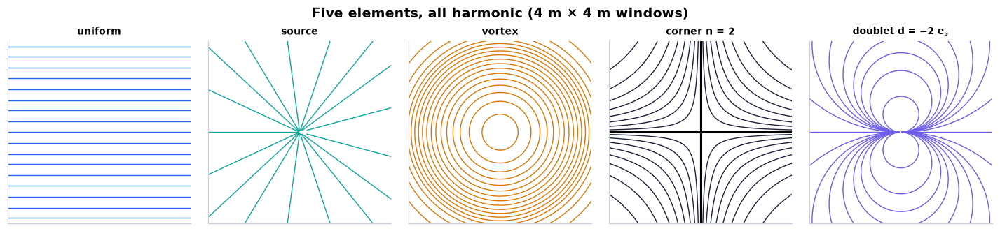

In [31]:
n = 201 if not FAST else 141                             # grid points per side
fig, axs = plt.subplots(1, 5, figsize=(13, 2.9))         # five elements side by side
kit = [("uniform", pf.Uniform(1.0), False), ("source", pf.Source(2*np.pi, cut_angle=0.0), True),
       ("vortex", pf.Vortex(2*np.pi), False), ("corner n = 2", pf.Corner(1.0, n=2), False),
       ("doublet d = −2 e$_x$", pf.Doublet((-2.0, 0.0)), False)]   # (title, element, blank its cut?)
cols = [COLORS["blue"], COLORS["teal"], COLORS["amber"], COLORS["ink"], COLORS["accent"]]   # one colour per element
for ax, (name, el, cut), col in zip(axs, kit, cols):
    X_, Y_ = np.meshgrid(np.linspace(-2, 2, n), np.linspace(-2, 2, n))   # grid [m]
    Pk = np.asarray(el.psi(X_, Y_), float)               # ψ of the element [m²/s]
    if cut:
        Pk = np.where((np.abs(Y_) < 0.03) & (X_ > 0), np.nan, Pk)   # blank the source's branch cut (+x axis)
    lv = np.nanpercentile(Pk, np.linspace(3, 97, 17))    # equally spaced levels between the 3rd and 97th percentiles
    ax.contour(X_, Y_, Pk, levels=np.unique(lv), colors=col, linewidths=0.9)   # streamlines
    ax.set_aspect("equal"); ax.set_title(name, fontsize=9); ax.set_xticks([]); ax.set_yticks([])
axs[3].axhline(0, color="k", lw=2); axs[3].axvline(0, color="k", lw=2)   # the corner's walls (the axes)
fig.suptitle("Five elements, all harmonic (4 m × 4 m windows)", fontweight="bold")
savefig(fig, "ch06", "c04_element_kit"); plt.show()      # save, then draw

**What you see.** Five streamline patterns: parallel lines, rays, circles, hyperbolae in a right-angle corner, and circles that all touch the x-axis at the origin.

**How to read it.** Every panel solves Laplace; only the singular centres differ. The doublet's circles are the loops between a source (left) and a sink (right) squeezed to a point.

**What would change if…** …the doublet turned to point along +y: its circles turn by 90° and touch the y-axis.

> 🔁 **Tools from earlier chapters used here** (see `knowledge/primers.md`)

- **animate and show_animation** — `animate(update, frames, fig)` calls `update(i)` once per frame; `show_animation(anim, player="frames")` embeds it with step buttons (Ch. 1 P16).

In [32]:
eps_list = tuple(np.geomspace(0.5, 0.02, 12 if not FAST else 8))   # gaps from 0.5 m down to 2 cm
frames = ch06.doublet_limit_frames(eps_list, d=2.0, n=161 if not FAST else 121)   # ψ of the pair on a grid, per gap
fig, ax = plt.subplots(figsize=(4.8, 3.7))               # one panel
def update(i):                                           # draw frame i
    fr = frames[i]                                       # the i-th gap
    ax.clear()                                           # contours are redrawn each frame
    ax.contour(fr["X"], fr["Y"], fr["psi"], levels=np.linspace(-1.5, 1.5, 25), colors=COLORS["accent"], linewidths=0.8)
    ax.plot([-fr["eps"]], [0], "o", color=COLORS["teal"], ms=7)   # the source (+m) at (−ε, 0)
    ax.plot([fr["eps"]], [0], "o", color=COLORS["rose"], ms=7)    # the sink (−m) at (+ε, 0)
    ax.set_xlim(-1.5, 1.5); ax.set_ylim(-1.2, 1.2); ax.set_aspect("equal")   # fixed frame
    ax.set_xlabel("x [m]"); ax.set_ylabel("y [m]")
    ax.set_title(f"ε = {fr['eps']:.3f} m, 2mε = 2 m³/s: relative error {fr['err']:.1e}", fontsize=9)
show_animation(animate(update, frames=len(frames), fig=fig), player="frames")   # step through with the buttons

**What you see.** A teal source and a rose sink moving together; the loops between them tighten into circles tangent to the x-axis.

**How to read it.** The title's error (pair against doublet) falls by about 4 each time ε halves — the ε² of D06 step 9.

**What would change if…** …m held fixed instead of 2mε: the loops would fade away as the pair cancels itself.

**What would change if…** …the pair were a vortex pair (+Γ at (0, ε), −Γ at (0, −ε)) squeezed with 2Γε fixed? You get a doublet again, turned by
90° — the same element (an exercise-style check, see the S02 pointer in §6.10).

### 🧩 The half-body: a stream plus a source `C05`

*The question:* A stream meets a source. Where does the fluid stop, what shape is the body, and how wide does it get?

*In one line:* $\psi=Uy+\frac{m}{2\pi}\tan^{-1}\frac yx=Ur\sin\theta+\frac{m}{2\pi}\theta$ *(6.31)*

#### The problem in plain words

River water parts round the rounded nose of a bridge pier; wind parts round the leading edge of a wing or a cliff top.
The simplest model of such a nose is a uniform stream plus one source: the source's fluid fills a body, the stream's
fluid flows round it. We want the stagnation point, the shape, the width — and the pressure along the surface.

#### The idea

```
stream U  -->              psi = m/2 (dividing streamline, bold)
             S *-- a --* source m     ______________________  h --> h_max = m/2U
stagnation where the source's push m/2*pi*a equals U     inside: all the source's fluid, carried off at speed U
```

> 🔁 **Tools from earlier chapters used here** (see `knowledge/primers.md`) — **choosing the angle's range** — ψ contains θ itself, which jumps by 2π across a cut. We take θ ∈ [0, 2π)
(`np.mod(np.arctan2(y, x), 2*np.pi)`), so the jump lies along +x behind the source, *inside* the body, and ψ is smooth
everywhere in the fluid; polar coordinates are Ch. 3 P105

- **np.arctan2** — `np.arctan2(y, x)` returns the polar angle of (x, y) in (−π, π], quadrant-correct (Ch. 2 P70).
- **scipy.optimize.brentq** — `brentq(f, a, b)` finds a root of f between a and b where f changes sign (Ch. 3 P108).

📝 **Note.** **The same flow in φ** `N27`

$$ \phi=Ux+\frac{m}{2\pi}\ln\sqrt{x^2+y^2}=Ur\cos\theta+\frac{m}{2\pi}\ln r \qquad \text{(6.30)} $$

#### 🧮 Derivation — The half-body: stagnation point, dividing streamline, width `D07` (Eq. 6.31: $\psi=Uy+\frac{m}{2\pi}\tan^{-1}\frac yx=Ur\sin\theta+\frac{m}{2\pi}\theta$)

**What we want to show.** For a uniform stream plus a source, find where the fluid stops, which streamline forms the body, how wide the body is at each angle, and how wide it becomes far downstream — and check the last result by a mass balance.

**Assumptions.** Steady, plane, ideal (all steps); θ ∈ [0, 2π) so the cut lies inside the body (step 4).

**The plan.**

1. Velocity.
2. Stagnation point on the axis.
3. ψ there.
4. The body ψ = m/2 and its half-width.
5. The far-downstream width, then the mass-balance check.

**Tools we use** (each explained before this point): superposition (C03) · source velocities (N24) · `np.arctan2` and the angle range (ch02 P70, reminder; gloss in C05) · mass conservation (Ch. 4 §4.2).

**We start from**

$$ \phi=Ux+\frac{m}{2\pi}\ln\sqrt{x^2+y^2}\ \text{(6.30),}\ \psi=Uy+\frac{m}{2\pi}\tan^{-1}\frac yx=Ur\sin\theta+\frac{m}{2\pi}\theta\ \text{(6.31), θ ∈ [0, 2π)} $$

*In words:* a stream from the left and a source at the origin.

---

**Step 1 of 10 — Differentiate φ for the velocity.**

$$ u=U+\frac{m}{2\pi}\frac{x}{x^2+y^2},\qquad v=\frac{m}{2\pi}\frac{y}{x^2+y^2} $$

- *Why we can do this:* u = ∂φ/∂x, v = ∂φ/∂y (6.10), $u\equiv\partial\phi/\partial x,\ v\equiv\partial\phi/\partial y$, with ∂(ln r)/∂x = x/r² (N24).
- *In words:* The stream's velocity plus the source's outward push.

---

**Step 2 of 10 — Look on the axis y = 0.**

$$ v(x,0)=0 $$

- *Why we can do this:* The source pushes straight out along the axis and the stream is horizontal, so only u can vanish there; we search the axis first because symmetry puts S on it.
- *In words:* On the axis the flow is purely horizontal.

---

**Step 3 of 10 — Solve u = 0 on the axis.**

$$ U+\frac{m}{2\pi x}=0\ \Rightarrow\ x=-\frac{m}{2\pi U}\equiv-a $$

- *Why we can do this:* At y = 0, x/(x² + y²) = 1/x; a negative x (upstream) lets the source's push cancel the stream.
- *In words:* The fluid stops a distance a = m/2πU in front of the source.

---

**Step 4 of 10 — Evaluate ψ at the stagnation point.**

$$ \psi_S=U\cdot0+\frac{m}{2\pi}\cdot\pi=\frac m2 $$

- *Why we can do this:* At S, y = 0 and θ = π (upstream on the axis); the streamline through S is the dividing streamline, so its ψ value names the body.
- *In words:* The body is the streamline ψ = m/2.

---

**Step 5 of 10 — Set ψ = m/2 in (6.31).**

$$ Ur\sin\theta+\frac{m}{2\pi}\theta=\frac m2 $$

- *Why we can do this:* Every point on the body has the same ψ as S (D05).
- *In words:* This one equation describes the whole body.

---

**Step 6 of 10 — Solve for the half-width y.**

$$ h=y=\frac{m(\pi-\theta)}{2\pi U} $$

- *Why we can do this:* Move the θ-term to the right and divide by U: m/2 − mθ/2π = m(π − θ)/2π.
- *In words:* The body's half-width at polar angle θ grows as θ decreases from π.

---

**Step 7 of 10 — Go far downstream, θ → 0.**

$$ h_{\max}=\lim_{\theta\to0}\frac{m(\pi-\theta)}{2\pi U}=\frac{m}{2U} $$

- *Why we can do this:* Far downstream on the body the angle seen from the source tends to 0 while y stays finite.
- *In words:* The body widens to a total width m/U.

---

**Step 8 of 10 — Check the nose, θ → π.**

$$ r=\frac{h}{\sin\theta}=\frac{m}{2\pi U}\frac{\pi-\theta}{\sin\theta}\ \to\ \frac{m}{2\pi U}=a $$

- *Why we can do this:* sin θ ≈ π − θ near θ = π (small-angle, ch03 P100), so the ratio tends to 1 and the body passes through S.
- *In words:* The body's nose is the stagnation point, as it must be.

---

**Step 9 of 10 — Balance mass far downstream.**

$$ 2h_{\max}\,U=m $$

- *Why we can do this:* All the source's fluid (m per second per metre) stays inside the body (it cannot cross ψ = m/2) and far away moves at U across the width 2h_max. The book leaves this to Exercise 6.12.
- *In words:* The body is exactly wide enough to carry the source's output away.

---

**Step 10 of 10 — Compare the two routes.**

$$ h_{\max}=\frac{m}{2U}\quad\text{(steps 7 and 9)} $$

- *Why we can do this:* Two independent arguments — geometry of ψ and conservation of mass — must agree; they do.
- *In words:* The width far downstream is m/2U either way.

---

**Result**

$$ a=\frac{m}{2\pi U}\ \text{, body}\ \psi=\frac m2\ \text{,}\ h(\theta)=\frac{m(\pi-\theta)}{2\pi U}\ \text{,}\ h_{\max}=\frac{m}{2U} $$

*In words:* the source's fluid fills a blunt, open body whose nose sits m/2πU upstream and whose width tends to m/U.

**What it means.** The blunt noses of piers, wing leading edges and cliff tops look like this; the body is open because the source never stops adding fluid (compare the closed Rankine oval).

**Check it.** Units: m/U [m²/s ÷ m/s] = m ✓. Numbers: U = 1, m = 2π → a = 1 m, h(90°) = 1.571 m, h_max = 3.142 m, mass 2 × 3.142 × 1 = 6.283 = m ✓. Limit: m → 0 gives a vanishing body.

> ⚠️ **Common confusion (traps in `D07`):** ψ at S is m/2, not m (θ = π, not 2π). Only u = 0 needs solving on the axis. With the principal `arctan2` range the lower half of the body shows ψ = −m/2 — choose θ ∈ [0, 2π) so the cut lies inside the body.

#### ✏️ Tiny example: a pier nose with round numbers

U = 1 m/s, m = 2π m²/s.

1. $a=m/2\pi U=1$ m: the stagnation point is at (−1, 0) m.
2. The dividing streamline has ψ = m/2 = π m²/s.
3. Right above the source (θ = 90°): $h=m(\pi-\theta)/2\pi U=2\pi\cdot(\pi/2)/(2\pi)=\pi/2\approx1.571$ m.
4. Far downstream $h_{\max}=m/2U=\pi\approx3.142$ m.
5. Mass check: 2 × 3.142 m × 1 m/s = 6.283 m²/s = m ✓.

In [33]:
f = pf.half_body(1.0, 2*np.pi)                           # stream U = 1 m/s + source m = 2π m²/s at the origin (θ ∈ [0, 2π))
print(ch06.half_body_numbers(1.0, 2*np.pi))              # a = m/2πU, the nose x, ψ on the body = m/2, h_max = m/2U
print(f.stagnation_points())                             # Newton finds the nose: [-1+0j]
th = np.array([np.pi/2, np.pi/4, 0.05, 3*np.pi/2])       # four polar angles, two above and one below the axis [rad]
xb, yb = ch06.half_body_shape(1.0, 2*np.pi, th)          # body points from D07 step 6 [m]
print(np.round(yb, 4), f.psi(xb, yb))                    # y = 1.5708, 2.3562, 3.0916, −1.5708; ψ = π at all four

{'a': 1.0, 'x_stag': -1.0, 'psi_body': 3.141592653589793, 'h_max': 3.141592653589793}
[-1.+0.j]
[ 1.5708  2.3562  3.0916 -1.5708] [3.1416 3.1416 3.1416 3.1416]


**What does the code above do?**

1. `half_body` is the stream plus the source, with θ ∈ [0, 2π) so that ψ = m/2 on both halves of the body.
2. Its three numbers: a = 1 m, ψ_body = π m²/s, h_max = π m.
3. Newton's method finds the stagnation point (−1, 0).
4. Points on the body from D07 step 6 lie on ψ = m/2, above **and below** the axis (with numpy's principal angle range
   the lower half would show −m/2 — the trap of D07).

📝 **Note.** **Pressure coefficient** `N28` — Bernoulli $p+\tfrac12\rho\lvert\nabla\phi\rvert^2=\text{const}$ *(Eq. 6.18)* with the constant set far upstream, p∞ + ½ρU².
It is the Euler number of $C_p\equiv\frac{p-p_\infty}{\tfrac12\rho U^2}$ *(Eq. 4.106)* (Ch. 4 §4.11): C_p = 1 at every
stagnation point, 0 where the speed equals U, negative (suction) where the flow is faster than the stream.

$$ C_p=\frac{p-p_\infty}{\frac12\rho U^2}=1-\frac{\lvert\mathbf u\rvert^2}{U^2} \qquad \text{(6.32)} $$

#### 🧮 Derivation — The half-body's surface pressure and where it crosses zero `D08` (Eq. 6.32: $C_p=\frac{p-p_\infty}{\frac12\rho U^2}=1-\frac{\lvert\mathbf u\rvert^2}{U^2}$)

**What we want to show.** Find the pressure coefficient along the half-body's surface as a function of the polar angle, and the angle where the surface pressure equals the free-stream pressure. The book only plots this (Fig. 6.8); we derive it.

**Assumptions.** Points on the body only (step 3 onward); θ in radians inside formulas.

**The plan.**

1. Write the velocity in polar pieces.
2. Put the point on the body.
3. Compute |u|²/U².
4. Read C_p, its limits, and its zero.

**Tools we use** (each explained before this point): C_p (N28) · D07's body shape · `brentq` (ch03 P108, reminder).

**We start from**

$$ C_p=1-\frac{\lvert\mathbf u\rvert^2}{U^2}\ \text{(6.32) and the body}\ r=\frac{m(\pi-\theta)}{2\pi U\sin\theta}\ \text{(D07 step 6 with y = r sin θ)} $$

*In words:* the pressure follows the speed, and we know where the body is.

---

**Step 1 of 8 — Define the shorthand k(θ).**

$$ k\equiv\frac{\sin\theta}{\pi-\theta} $$

- *Why we can do this:* The body shape contains this ratio; naming it keeps the algebra short.
- *In words:* k measures how close a body point is to the source, relative to the stream.

---

**Step 2 of 8 — Evaluate the source's push on the body.**

$$ \frac{m}{2\pi r}=\frac{m}{2\pi}\cdot\frac{2\pi U\sin\theta}{m(\pi-\theta)}=Uk $$

- *Why we can do this:* Substitute the body's r from D07; the m and 2π cancel.
- *In words:* On the body, the source's speed m/2πr is U times k.

---

**Step 3 of 8 — Write u and v in polar pieces.**

$$ u=U+\frac{m}{2\pi r}\cos\theta,\qquad v=\frac{m}{2\pi r}\sin\theta $$

- *Why we can do this:* D07 step 1 with x/r² = cos θ/r and y/r² = sin θ/r.
- *In words:* The source adds a radial push of size m/2πr.

---

**Step 4 of 8 — Insert step 2.**

$$ u=U(1+k\cos\theta),\qquad v=Uk\sin\theta $$

- *Why we can do this:* Replace m/2πr by Uk — allowed only on the body.
- *In words:* On the body both velocity components are U times simple functions of θ.

---

**Step 5 of 8 — Square and add.**

$$ \frac{\lvert\mathbf u\rvert^2}{U^2}=(1+k\cos\theta)^2+k^2\sin^2\theta=1+2k\cos\theta+k^2 $$

- *Why we can do this:* Expand the square and use cos² + sin² = 1.
- *In words:* The surface speed squared, relative to the stream.

---

**Step 6 of 8 — Insert into (6.32).**

$$ C_p=-(2k\cos\theta+k^2) $$

- *Why we can do this:* C_p = 1 − |u|²/U²; the 1s cancel.
- *In words:* The surface pressure coefficient as a function of θ alone.

---

**Step 7 of 8 — Check the nose, θ → π.**

$$ k\to1,\ \cos\theta\to-1\ \Rightarrow\ C_p\to-(-2+1)=1 $$

- *Why we can do this:* sin θ ≈ π − θ near π, so k → 1; C_p = 1 is the stagnation value — a consistency check.
- *In words:* Full stagnation pressure at the nose, as expected.

---

**Step 8 of 8 — Find the zero.**

$$ C_p=0\iff2\cos\theta+k=0\iff\tan\theta=-2(\pi-\theta) $$

- *Why we can do this:* Factor C_p = −k(2cos θ + k), k ≠ 0 on the body; divide by cos θ(π − θ). Solved by `brentq` on (π/2, π) where tan changes sign.
- *In words:* The surface pressure equals p∞ at θ ≈ 113.2° from +x.

---

**Result**

$$ C_p=-(2k\cos\theta+k^2)\ \text{,}\ k=\frac{\sin\theta}{\pi-\theta}\ \text{, with}\ C_p=0\ \text{where}\ \tan\theta=-2(\pi-\theta)\ \text{(θ ≈ 113.2°)} $$

*In words:* over-pressure at the nose, zero at 113°, suction on the shoulder (minimum −0.587 near 63°), back to zero far downstream.

**What it means.** Because C_p → 0 downstream, the infinitely long body still feels no net pressure force: the suction on the shoulders balances the nose's push (Exercise 6.13; `half_body_net_force` → 0).

**Check it.** Units: C_p dimensionless ✓. Numbers: θ = 90° → k = 0.6366, C_p = −0.405 ✓ (the code cell after note N29 prints −0.4053). Limit θ → 0: k → 0, C_p → 0 — far downstream the body is parallel to the stream at speed U.

> ⚠️ **Common confusion (traps in `D08`):** Using the field formula off the body (step 4 holds only on it). Degrees vs radians in tan θ = −2(π − θ).

📝 **Note.** **Along the body** `N29` — C_p starts at +1 at the nose, crosses zero where tan θ = −2(π − θ) — our root 113.2° from +x (the curve the book plots
agrees; its printed value stays in the private test file) — has its lowest value −0.587 near θ = 63°, and returns to 0
far downstream. The net pressure force on the whole (infinitely long) body is zero: the tail contributes nothing because
C_p → 0 there.

In [34]:
print(f"C_p = 0 at θ = {np.degrees(ch06.half_body_cp_zero_angle()):.3f}°")   # the root of tan θ = −2(π − θ): 113.218°
print(ch06.half_body_surface_cp(np.radians([179.0, 120.0, 90.0, 63.0, 10.0])))   # D08's C_p at five body angles
for xe in (10.0, 100.0, 1000.0):                         # integrate the body pressure from the nose to x = x_end [m]
    print(xe, ch06.half_body_net_force(1.0, 2*np.pi, xe, rho=1.0))   # drag D → 0 (about ∝ 1/x_end²), lift L = 0 [N/m]

C_p = 0 at θ = 113.218°
[ 0.9997  0.1431 -0.4053 -0.5866 -0.1187]
10.0 {'D': 0.026459203348102922, 'L': 3.1086244689504383e-15}
100.0 {'D': 0.0003106831363358653, 'L': 4.440892098500626e-15}
1000.0 {'D': 3.0729092757586507e-06, 'L': 2.0161650127192843e-13}


**What does the code above do?**

1. `half_body_cp_zero_angle` solves D08 step 8 with `brentq` on (π/2, π).
2. `half_body_surface_cp` evaluates $C_p=-(2k\cos\theta+k^2)$, $k=\sin\theta/(\pi-\theta)$: +0.9997 near the nose,
   −0.4053 at 90°, −0.5865 at 63°.
3. `half_body_net_force` integrates −(p − p∞)n over the body from the nose to x_end: the drag shrinks toward zero as the
   body is lengthened (ρ = 1 kg/m³, U = 1 m/s).

**From scratch — our own bracket and our own function for the zero of C_p:**

In [35]:
from scipy.optimize import brentq                        # root finder with a sign-change bracket (P108)
f_root = lambda t: np.tan(t) + 2*(np.pi - t)             # C_p = 0 on the body (D08 step 8), t in radians
t0 = brentq(f_root, np.pi/2 + 1e-9, np.pi - 1e-9)        # tan changes sign between 90° and 180°
print(np.degrees(t0))                                    # 113.218°
assert np.isclose(t0, ch06.half_body_cp_zero_angle())    # = the library's angle

113.21826332336072


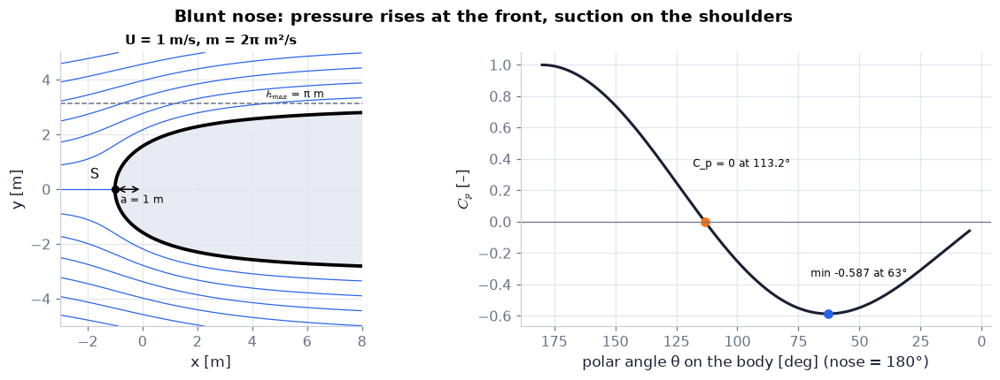

In [36]:
n = 241 if not FAST else 161                             # grid points per side
X_, Y_ = np.meshgrid(np.linspace(-3, 8, n), np.linspace(-5, 5, n))   # grid [m]
Ph = f.psi(X_, Y_)                                       # ψ of the half-body [m²/s]
Ph = np.where((np.abs(Y_) < 0.06) & (X_ > 0), np.nan, Ph)   # blank the cut along +x (inside the body)
tb = np.linspace(0.02, 2*np.pi - 0.02, 800)              # angles along the body [rad]
xb_, yb_ = ch06.half_body_shape(1.0, 2*np.pi, tb)        # the body ψ = m/2 [m]
fig, (a1, a2) = plt.subplots(1, 2, figsize=(10.5, 3.8))  # shape | pressure
a1.fill(xb_, yb_, color="#e8ebf2", zorder=0)             # the source's fluid
a1.contour(X_, Y_, Ph, levels=np.pi + np.arange(-8, 9)*0.6, colors=COLORS["blue"], linewidths=0.8)   # equal Δψ streamlines
a1.plot(xb_, yb_, "k", lw=2.5)                           # the dividing streamline ψ = m/2
a1.plot([-1], [0], "ko", ms=5); a1.annotate("S", (-1, 0), (-1.9, 0.4))   # the stagnation point
a1.annotate("", (0, 0), (-1, 0), arrowprops=dict(arrowstyle="<->")); a1.text(-0.8, -0.5, "a = 1 m", fontsize=8)
a1.axhline(np.pi, color=COLORS["muted"], ls="--", lw=1); a1.text(4.5, np.pi + 0.2, "$h_{max}$ = π m", fontsize=8)
a1.set_xlim(-3, 8); a1.set_ylim(-5, 5); a1.set_aspect("equal"); a1.set_xlabel("x [m]"); a1.set_ylabel("y [m]")
a1.set_title("U = 1 m/s, m = 2π m²/s", fontsize=10)
tt = np.radians(np.linspace(179.9, 5, 400))              # body angles from the nose (180°) to far downstream [rad]
cp = ch06.half_body_surface_cp(tt)                       # C_p on the body (D08)
a2.plot(np.degrees(tt), cp, color=COLORS["ink"], lw=2)   # the pressure curve
t0d = np.degrees(ch06.half_body_cp_zero_angle())         # zero crossing [deg]
a2.plot([t0d], [0], "o", color=COLORS["orange"]); a2.annotate(f"C_p = 0 at {t0d:.1f}°", (t0d, 0), (t0d + 5, 0.35), fontsize=8)
imin = np.argmin(cp); a2.plot(np.degrees(tt[imin]), cp[imin], "o", color=COLORS["blue"])   # the suction minimum
a2.annotate(f"min {cp[imin]:.3f} at {np.degrees(tt[imin]):.0f}°", (np.degrees(tt[imin]), cp[imin]), (70, -0.35), fontsize=8)
a2.axhline(0, color=COLORS["muted"], lw=0.8); a2.invert_xaxis()   # nose on the left, as in the flow picture
a2.set_xlabel("polar angle θ on the body [deg] (nose = 180°)"); a2.set_ylabel("$C_p$ [–]")
fig.suptitle("Blunt nose: pressure rises at the front, suction on the shoulders", fontweight="bold")
savefig(fig, "ch06", "c05_half_body"); plt.show()        # save, then draw

**What you see.** Left, a rounded nose opening to a width 2h_max with streamlines crowding over its shoulders; right, C_p falling from +1 at the nose through zero at 113° to a suction dip of −0.587 and back toward zero downstream.

**How to read it.** High pressure where the stream is stopped (the nose), low where it is fastest (the shoulder), recovery downstream; streamline spacing is speed.

**What would change if…** …m doubled: every length (a, h, h_max) doubles, the C_p curve against θ is unchanged — only m/U sets the size.

> 🔁 **Tools from earlier chapters used here** (see `knowledge/primers.md`)

- **slider_figure** — `slider_figure(fn, name, values, …)` computes a plotly figure for every slider position up front, so it works on the web page (Ch. 1 P17).

In [37]:
def half_body_traces(mU):                                # all curves for one value of m/U [m], with U = 1 m/s
    m = mU                                               # source strength [m²/s]
    tb = np.linspace(0.01, 2*np.pi - 0.01, 150)          # body angles [rad]
    xb, yb = ch06.half_body_shape(1.0, m, tb)            # the body ψ = m/2
    xs, ys = [], []                                      # four outer streamlines, joined with NaN gaps
    for c in (m/2 + 1.0, m/2 + 2.5, m/2 - 1.0, m/2 - 2.5):   # ψ values outside the body [m²/s]
        t = np.linspace(0.01, np.pi - 0.01, 90) if c > m/2 else np.linspace(np.pi + 0.01, 2*np.pi - 0.01, 90)
        rr = (c - m*t/(2*np.pi))/np.sin(t)               # r(θ) from Ur sinθ + mθ/2π = c (6.31)
        xs += list(rr*np.cos(t)) + [np.nan]; ys += list(rr*np.sin(t)) + [np.nan]
    a = m/(2*np.pi)                                      # stagnation distance [m]
    return {"body ψ = m/2": (xb, yb), "streamlines": (np.array(xs), np.array(ys)),
            "stagnation point": (np.array([-a]), np.array([0.0]))}
vals = np.linspace(0.5, 5.0, 20 if not FAST else 10)     # slider values of m/U [m]
fig = slider_figure(half_body_traces, "m/U", vals, unit="m", xlabel="x [m]", ylabel="y [m]",
                    title="The half-body scales with m/U", xrange=[-3, 8], yrange=[-6, 6],
                    modes={"stagnation point": "markers"})
recolor(fig, {"body ψ = m/2": COLORS["ink"], "streamlines": COLORS["blue"], "stagnation point": COLORS["ink"]})
step_titles(fig, [f"The half-body scales with m/U: a = {v/(2*np.pi):.2f} m, h_max = {v/2:.2f} m" for v in vals])
fig.show()                                               # draw it (works on the web page too)

**What you see.** A body that grows as you drag the slider: its nose moves upstream, its far width grows, the outer streamlines are pushed aside.

**How to read it.** Every length is proportional to m/U: a = m/2πU and h_max = m/2U (the title), so the shape is the same, only scaled.

**What would change if…** …U doubled at fixed m: the same as halving m/U — a body half as big.

> 🔁 **Tools from earlier chapters used here** (see `knowledge/primers.md`) — explainers have a Walkthrough, Explore with presets, Explain, Derivation, Equations, Code and Check tabs (Ch. 1 §1.4 explainer guide)

- **show_viz** — `show_viz("ch06", slug)` embeds an interactive explainer; on the web page it fills the window (Ch. 1 P18).

#### 🎮 Interactive: Where does the body come from?

**Why interactive rather than a static figure:** a static figure shows a finished sum. Here you build it: toggle elements, slide their strengths and watch the stagnation points and the dividing streamline appear, move and close; click a point to see each element's velocity add up.

**What to try:**
- Preset 'half-body': read a = 1 m and h_max = 3.14 m in the Explain tab, then halve U — both double.
- Add the sink (preset 'Rankine oval'): the body closes and the status says so: Σm = 0.
- Preset 'source–sink → doublet': press ▶ and watch the pair collapse into the doublet's circles.
- Click a point in the flow: the term bars show the stream's and the source's velocities adding to the total.

In [38]:
show_viz("ch06", "superposition_sandbox")   # full-width explainer; ⤢ Full screen for more room

[explainer ch06/superposition_sandbox]

**What would change if…** …a sink of the same strength sat 2 m downstream of the source? The source's fluid would be swallowed again, the dividing
streamline would close behind the body, and the drag of this closed body would be exactly zero — the **Rankine oval**
(an exercise idea; `ch06.rankine_oval(1.0, 2*np.pi, 1.0)` gives a half-length $\sqrt3\approx1.732$ m and a half-width 1.307 m).
Closing the body is the step from C05 to C06.

> 🔁 **Recap — The cylinder = stream + doublet** (Ch. 3 §3.3). A uniform stream U plus a doublet $\mathbf d=-2\pi Ua^2\mathbf e_x$ at the origin gives
$\phi=U\big(r+\frac{a^2}{r}\big)\cos\theta,\ \psi=U\big(r-\frac{a^2}{r}\big)\sin\theta$ *(Eq. 6.33)*; ψ = 0 on r = a for every θ,
so the circle is a streamline, and the body closes because the doublet adds no net source. You met this flow in Ch. 3
(Fig. 3.2); D09 builds it. Our `pf.cylinder(U, a)` and Ch. 3's `cylinder_flow` give the same velocity.

In [39]:
print(pf.cylinder(2.0, 0.5).velocity(0.3, 0.8), ch03.cylinder_flow(0.3, 0.8, U=2.0, a=0.5))   # U = 2 m/s, a = 0.5 m: equal

(2.516044285982361, -0.4503659223118783) (2.5160442859823604, -0.4503659223118783)


> 🔁 **Recap — The cylinder's velocity** (Ch. 3 §3.3). $u_r=U\big(1-\frac{a^2}{r^2}\big)\cos\theta,\ u_\theta=-U\big(1+\frac{a^2}{r^2}\big)\sin\theta$ *(Eq. 6.34)*: on r = a the
radial part vanishes and the fluid slides round at $\lvert u_\theta\rvert=2U\lvert\sin\theta\rvert$.

> 🔁 **Recap — A cylinder moving through still fluid** (Ch. 3 §3.3). Seen from the fluid far away, the moving cylinder's flow is the cylinder flow minus the stream:
$w=U(z+a^2/z)-Uz=Ua^2/z$ — the instantaneous streamlines of a doublet (Ch. 3's `galilean_frames_cylinder` explainer shows
both frames; open it from the Ch. 3 page). (The complex notation w(z) is C09's; here read it as "the cylinder flow minus
the uniform stream".)

In [40]:
print(ch03.cylinder_flow(0.3, 0.8, U=2.0, a=0.5, frame="fluid"),   # Ch. 3: the cylinder seen from the fluid far away
      pf.Doublet((-2*np.pi*2.0*0.25, 0.0)).velocity(0.3, 0.8))     # = a doublet with d = −2πUa² e_x alone

(0.5160442859823604, -0.4503659223118783) (0.5160442859823607, -0.4503659223118783)


### 🧩 The circular cylinder and d'Alembert's paradox `C06`

*The question:* Wind presses hard on the front of a chimney. Why does ideal flow predict no net push at all?

*In one line:* $C_p(r=a,\theta)=1-4\sin^2\theta$ *(6.35)*

#### The problem in plain words

Stand behind a chimney on a windy day and you are sheltered; the chimney itself feels a strong push downwind. Yet the
ideal-flow solution for a circular cylinder — a flow you have already drawn in Ch. 3 — predicts that the push is exactly
zero. This is d'Alembert's paradox (1752), and understanding why the prediction fails is the reason Ch. 9 exists.

#### The idea

```
     suction (-3q)               pressure on the surface, q = rho U^2 / 2:
+q  (  O  )  +q     --->         front +q, shoulders -3q, back +q
     suction (-3q)               the back pushes forward exactly as hard as the front pushes back
```

**The pattern is the same front and back, top and bottom — so every push is cancelled.** D is the drag (the force along
the stream) and L the lift (across it), both per metre of cylinder [N/m].

> 🔁 **Tools from earlier chapters used here** (see `knowledge/primers.md`) — the polar velocities are notes N18, N19 of C02

- **net pressure force −∮p n dA** — a pressure p pushes on a surface element along −n (n points out of the body); the net force is −∮p n dA (Ch. 1 P28).
- **trapezoid rule, np.trapezoid** — `np.trapezoid(f, x)` integrates sampled values; on a closed loop the plain sum × Δθ is the periodic version (Ch. 1 P37).

#### 🧮 Derivation — The circular cylinder: why d = −2πUa² e_x, and C_p = 1 − 4 sin²θ `D09` (Eq. 6.35: $C_p(r=a,\theta)=1-4\sin^2\theta$)

**What we want to show.** Choose the doublet that turns a uniform stream into flow round a circle of radius a, and find the velocity and pressure on its surface.

**Assumptions.** Steady, plane, no circulation (added in D10).

**The plan.**

1. Demand ψ = 0 on r = a.
2. Read off D.
3. Velocities by (6.21), $u_r=\frac{\partial\phi}{\partial r}=\frac1r\frac{\partial\psi}{\partial\theta}$–(6.22), $u_\theta=\frac1r\frac{\partial\phi}{\partial\theta}=-\frac{\partial\psi}{\partial r}$.
4. Surface speed and C_p.

**Tools we use** (each explained before this point): superposition (C03) · doublet (C04) · polar velocities (N18, N19) · C_p (N28).

**We start from**

$$ \begin{array}{l}\psi=Ur\sin\theta-\frac{D}{2\pi}\frac{\sin\theta}{r}\ \text{— stream (6.7) plus a doublet of strength D pointing} \\ \text{upstream,}\ \mathbf d=-D\mathbf e_x\ \text{(from the imaginary part of }w=\frac{d}{2\pi(z-z')}\ \text{(6.49))}\end{array} $$

*In words:* a stream and an unknown doublet.

---

**Step 1 of 6 — Require ψ = 0 on the circle.**

$$ \psi(a,\theta)=\Big(Ua-\frac{D}{2\pi a}\Big)\sin\theta=0\ \ \text{for all }\theta $$

- *Why we can do this:* D05: the circle is a body if it is a streamline; the value 0 is the one the x-axis already has, so the axis and circle join.
- *In words:* The circle must be one streamline, for every angle.

---

**Step 2 of 6 — Solve for the doublet strength.**

$$ D=2\pi Ua^2\ \Rightarrow\ \mathbf d=-2\pi Ua^2\,\mathbf e_x $$

- *Why we can do this:* The bracket must vanish, since sin θ does not; the doublet points upstream, opposing the stream.
- *In words:* The right doublet has strength 2πUa².

---

**Step 3 of 6 — Substitute back.**

$$ \psi=U\Big(r-\frac{a^2}{r}\Big)\sin\theta,\qquad\phi=U\Big(r+\frac{a^2}{r}\Big)\cos\theta $$

- *Why we can do this:* Insert D into the start; φ follows the same way from (6.29), $\phi=\frac{m\varepsilon}{\pi}\frac{x}{r^2}=-\frac{\mathbf d\cdot\mathbf x}{2\pi r^2}=\frac{\lvert\mathbf d\rvert}{2\pi}\frac{\cos\theta}{r}$ with the same d. This is (6.33), $\phi=U\Big(r+\frac{a^2}{r}\Big)\cos\theta,\ \psi=U\Big(r-\frac{a^2}{r}\Big)\sin\theta$ — the line above.
- *In words:* The cylinder's stream function and potential.

---

**Step 4 of 6 — Differentiate for the velocity.**

$$ u_r=\frac1r\frac{\partial\psi}{\partial\theta}=U\Big(1-\frac{a^2}{r^2}\Big)\cos\theta,\quad u_\theta=-\frac{\partial\psi}{\partial r}=-U\Big(1+\frac{a^2}{r^2}\Big)\sin\theta $$

- *Why we can do this:* The polar forms (6.21), $u_r=\frac{\partial\phi}{\partial r}=\frac1r\frac{\partial\psi}{\partial\theta}$–(6.22), $u_\theta=\frac1r\frac{\partial\phi}{\partial\theta}=-\frac{\partial\psi}{\partial r}$. This is (6.34), $u_r=U\Big(1-\frac{a^2}{r^2}\Big)\cos\theta,\ u_\theta=-U\Big(1+\frac{a^2}{r^2}\Big)\sin\theta$ — the line above.
- *In words:* Far away the stream; near the body the flow bends round it.

---

**Step 5 of 6 — Evaluate on the surface r = a.**

$$ u_r(a,\theta)=0,\qquad u_\theta(a,\theta)=-2U\sin\theta $$

- *Why we can do this:* a²/r² = 1 on the surface: u_r = 0 confirms no flow through the body (6.16), $\mathbf n\cdot\mathbf U_s=(\mathbf n\cdot\mathbf u)_{\text{surface}};\ \partial\phi/\partial n=0\ \text{or}\ \partial\psi/\partial s=0\ \text{(stationary)}$.
- *In words:* On the surface the fluid slides round at 2U|sin θ| — twice the stream at the shoulders.

---

**Step 6 of 6 — Insert the surface speed in (6.32).**

$$ C_p(a,\theta)=1-\frac{4U^2\sin^2\theta}{U^2}=1-4\sin^2\theta $$

- *Why we can do this:* C_p = 1 − |u|²/U² with |u| = 2U|sin θ|. This is (6.35), $C_p(r=a,\theta)=1-4\sin^2\theta$ — the line above.
- *In words:* +1 at the front and back, −3 at the shoulders.

---

**Result**

$$ \psi=U(r-a^2/r)\sin\theta\ \text{(6.33),}\ u_\theta(a,\theta)=-2U\sin\theta\ \text{,}\ C_p=1-4\sin^2\theta $$

*In words:* a doublet 2πUa² pointing upstream turns the stream into flow round a cylinder; the surface pressure is symmetric front–back and top–bottom.

**What it means.** Both symmetries mean every push has a mirror push: zero drag and zero lift (C06), until circulation breaks the top–bottom symmetry (C07).

**Check it.** Units ✓ (Ua² m³/s). Numbers: air, U = 10 m/s → ½ρU² = 60 Pa, +60 Pa at θ = 0, π, −180 Pa at ±90° ✓. C_p is unchanged by θ → −θ and θ → π − θ: the symmetry behind d'Alembert.

> ⚠️ **Common confusion (traps in `D09`):** d points upstream ("opposing the stream"). The surface speed is 2U at the shoulders, not U.

📝 **Note.** **Surface pressure** `N30` — Stagnation points (C_p = 1) at θ = 0 and π; the fluid is twice as fast as the stream at the shoulders θ = ±90°, where
C_p = −3. Air (ρ = 1.2 kg/m³), U = 10 m/s: ½ρU² = 60 Pa, so +60 Pa front and back, −180 Pa at the shoulders.

$$ C_p(r=a,\theta)=1-4\sin^2\theta \qquad \text{(6.35)} $$

> 📎 **Primer — integrals of sines and cosines over a full period.** `P151` · Over one full turn, 0 ≤ θ ≤ 2π, the positive and negative halves of sin θ cancel, and so do those of sin³θ, cos θ,
sin θ cos θ and sin²θ cos θ: all integrate to zero. Squares do not cancel:
$\int_0^{2\pi}\sin^2\theta\,d\theta=\int_0^{2\pi}\cos^2\theta\,d\theta=\pi$ (their average is ½). Force integrals round a
circle pick out exactly the terms that survive.

In [41]:
th = np.linspace(0, 2*np.pi, 2001)                       # one full turn [rad]
for g in (np.sin(th), np.sin(th)**3, np.sin(th)*np.cos(th), np.sin(th)**2):   # four integrands
    print(round(np.trapezoid(g, th), 6))                 # 0, 0, 0, then π = 3.141593

0.0
0.0
0.0
3.141593


#### ✏️ Tiny example: the chimney in numbers

Air, U = 10 m/s, a = 0.1 m, q = ½ρU² = 60 Pa.

1. Front (θ = 180°): C_p = 1 − 4·0 = 1 → p − p∞ = +60 Pa.
2. Shoulder (θ = 90°): C_p = 1 − 4 = −3 → −180 Pa.
3. Back (θ = 0): +60 Pa.
4. Drag = −∮(p − p∞) cos θ a dθ: the points θ and π − θ have the same p but opposite cos θ, so they cancel in pairs → D = 0.
5. Lift: θ and −θ have the same p and opposite sin θ → L = 0.

In [42]:
f = pf.cylinder(10.0, 0.1)                               # air stream U = 10 m/s past a cylinder a = 0.1 m
print(ch06.cylinder_surface_cp(np.radians([180.0, 135.0, 90.0, 45.0, 0.0])))   # (6.35): 1, −1, −3, −1, 1
circle64 = 0.1*np.exp(1j*np.linspace(0, 2*np.pi, 64, endpoint=False))   # 64 surface points as complex numbers [m]
print(ch06.surface_pressure_force(f, circle64, rho=1.2)) # (D, L) = −∮(p − p∞) n dl by the periodic trapezoid: ≈ (0, 0) N/m
print(pf.normal_velocity_on(f, circle64))                # the surface is a streamline: u·n ≈ 0

[ 1. -1. -3. -1.  1.]
BlasiusForce(D=5.1486592766991635e-15, L=4.753142324176451e-16)
1.6653345369377348e-14


**What does the code above do?**

1. The cylinder object (stream + doublet, R12).
2. $C_p=1-4\sin^2\theta$ at five angles.
3. `surface_pressure_force` integrates the Bernoulli pressure times the outward normal over 64 surface points (air,
   ρ = 1.2 kg/m³): zero drag and lift, to round-off (compare ½ρU²a = 6 N/m).
4. No flow crosses the surface.

**From scratch — 64 pressure pushes added by hand:**

In [43]:
th = np.linspace(0, 2*np.pi, 64, endpoint=False)          # 64 angles round the cylinder [rad]
p = 0.5*1.2*10.0**2*(1 - 4*np.sin(th)**2)                 # p − p∞ from (6.35) [Pa]
D_hand = -np.sum(p*np.cos(th)*0.1)*(2*np.pi/64)           # −∮(p − p∞) n_x dl, dl = a dθ [N/m]
print(D_hand)                                             # ≈ 0
assert np.isclose(D_hand, ch06.surface_pressure_force(f, circle64, rho=1.2)[0], atol=1e-10)   # = the library's drag

2.6703993187878587e-15


Adding the 64 pressure pushes by hand gives zero drag too.

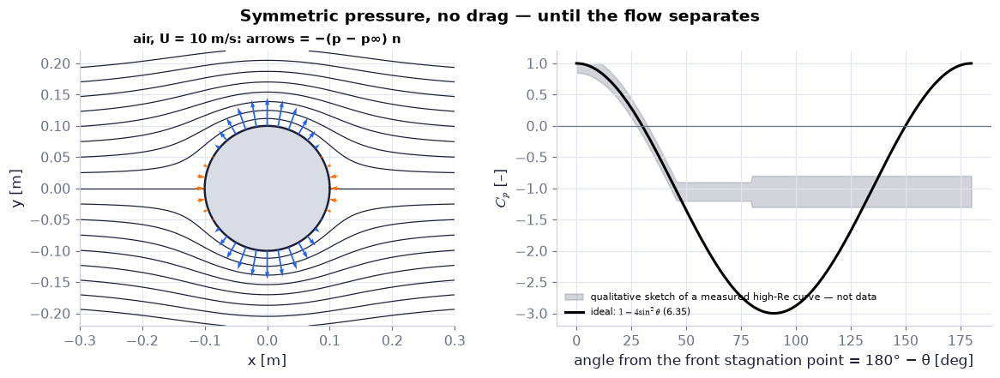

In [44]:
n = 241 if not FAST else 161                             # grid points per side
fig, (a1, a2) = plt.subplots(1, 2, figsize=(10.5, 3.9))  # flow and arrows | pressure curves
flow_net(a1, f, xlim=(-0.3, 0.3), ylim=(-0.22, 0.22), n=n, n_levels=17, body=circle(0.1),
         mask_body=lambda X, Y: np.hypot(X, Y) < 0.1)    # streamlines round the cylinder
zs = circle(0.1, 36)                                     # 36 surface points [m]
ps = f.pressure(zs.real, zs.imag, rho=1.2, U=10.0)       # p − p∞ there [Pa]
pressure_arrows(a1, zs, ps, zs/0.1, scale=2.5e-4)        # −(p − p∞) n: orange pushes in, blue pulls out
a1.set_title("air, U = 10 m/s: arrows = −(p − p∞) n", fontsize=10)
beta = np.linspace(0, 180, 361)                          # angle from the front stagnation point [deg] = 180° − θ
lo, hi = separated_cp_band(beta, sep_deg=80.0)           # QUALITATIVE band of a separated high-Re flow (not data)
a2.fill_between(beta, lo, hi, color=COLORS["muted"], alpha=0.3, label="qualitative sketch of a measured high-Re curve — not data")
a2.plot(beta, 1 - 4*np.sin(np.radians(beta))**2, color="k", lw=2, label=r"ideal: $1-4\sin^2\theta$ (6.35)")
a2.axhline(0, color=COLORS["muted"], lw=0.8)             # C_p = 0 (p = p∞)
a2.set_xlabel("angle from the front stagnation point = 180° − θ [deg]"); a2.set_ylabel("$C_p$ [–]")
a2.legend(fontsize=7, loc="lower left")
fig.suptitle("Symmetric pressure, no drag — until the flow separates", fontweight="bold")
savefig(fig, "ch06", "c06_cylinder_pressure"); plt.show()   # save, then draw

**What you see.** Left, arrows mirror-symmetric front/back and top/bottom: orange pushing in at the front and back, long blue arrows pulling out at the shoulders. Right, the ideal curve from +1 down to −3 at 90° and back to +1; the grey band follows it on the front and stays low on the back.

**How to read it.** In ideal flow the back half pushes forward as hard as the front pushes back. A real wake keeps the back at suction (the grey band is a labelled *qualitative* sketch, not measurements: it follows the ideal curve down to a shallower minimum near −1, stays there until the separation angle, 80° here, then settles on a flat low wake pressure), so the front wins: drag.

**What would change if…** …the flow separated earlier (drag the separation angle in the plotly figure below): the low-pressure plateau widens and the imbalance — the drag — grows.

In [45]:
beta = np.linspace(0, 180, 181)                          # angle from the front [deg]
b = np.radians(beta)                                     # the same in radians
def band_traces(sep):                                    # curves for one separation angle [deg]
    lo, hi = separated_cp_band(beta, sep_deg=sep)        # the qualitative band
    return {"ideal 1 − 4 sin²θ": (beta, 1 - 4*np.sin(b)**2), "band, lower edge": (beta, lo), "band, upper edge": (beta, hi)}
seps = np.linspace(60, 120, 13)                          # separation angles [deg]
fig = slider_figure(band_traces, "separation angle", seps, unit="°", xlabel="angle from the front [deg]",
                    ylabel="C_p [–]", title="Where ideal and real flow part company (qualitative)", yrange=[-3.2, 1.2])
recolor(fig, {"ideal 1 − 4 sin²θ": COLORS["ink"], "band, lower edge": COLORS["muted"], "band, upper edge": COLORS["muted"]})
cd = [np.trapezoid(0.5*sum(separated_cp_band(beta, sep_deg=s))*np.cos(b), b) for s in seps]   # sketch drag coefficient
step_titles(fig, [f"Where ideal and real flow part company (qualitative): sketch C_D = {c:.2f}, ideal C_D = 0" for c in cd])
fig.show()                                               # draw it (works on the web page too)

**What does the code above do?**

For each separation angle the band's middle curve is integrated like the drag in the tiny example:
$C_D=D/(\tfrac12\rho U^2\cdot2a)=\int_0^\pi C_p\cos\beta\,d\beta$ with β the angle from the front. The ideal curve gives
exactly 0; the sketch gives a positive drag coefficient that grows as separation moves forward. The band is a
*qualitative* sketch (no dataset is cited here), so read the numbers as an illustration of the mechanism, not a prediction.

📝 **Note.** **Ideal vs real** `N31` — A measured pressure distribution on a cylinder at high Reynolds number follows 1 − 4 sin²θ on the front, but behind the
widest point the boundary layer separates and the rear pressure stays low (the book compares with a measured curve; no
dataset is cited here, so we draw only a labelled band). ⚠️ That comparison measures the angle from the upstream
stagnation point, 180° − θ in our convention. Ch. 9 explains separation.

> ⚠️ **Common confusion:** "no drag means no pressure". The pressures are large (−180 Pa at the shoulders in the example); they just cancel in
total. Each half of the cylinder feels a big force; the halves fight each other to a draw.

**What would change if…** …we added circulation? The top would speed up and the bottom slow down; the front–back symmetry survives, the top–bottom
one does not — lift without drag (C07).

### 🧩 Circulation gives lift `C07`

*The question:* A spinning ball curves; a rotor ship sails on spinning towers. How does circulation turn into a sideways force, and how
big is it?

*In one line:* $L=\rho U\Gamma$ *(6.40)*

#### The problem in plain words

A football struck with spin bends in flight; Flettner's rotor ships used tall spinning cylinders instead of sails. In
both, the air is carried round the body on one side and held back on the other. The ideal-flow model adds a vortex to the
cylinder: the stagnation points slide round, the pressure drops on the fast side — and the net force comes out as a
strikingly simple product.

#### The idea

```
stream -->        + clockwise vortex        =  faster on top, slower below
   (  O  )             (circulation -Gamma)     stagnation points slide DOWN: sin(theta) = -Gamma/(4 pi a U)
                                                pressure lower on top  =>  force UP:  L = rho U Gamma, D = 0
```

> ⚠️ **Convention callout (numbers).** The book now names a **clockwise** circulation Γ (the flow's circulation is −Γ; its
> footnote says the sign is chosen to give the usual $L=\rho U\Gamma$ *(6.40)*). Our code keeps Γ counterclockwise in
> `pf.Vortex` and asks body functions for `Gamma_cw=` (book) or `Gamma_ccw=` (project). Γ_cw = 2 m²/s ⇔ Γ_ccw = −2 m²/s:
> stagnation points at −9.16° and −170.84° (below the axis), L = +24 N/m for U = 10 m/s, a = 0.1 m, air.

📝 **Note.** **Stream + doublet + a clockwise vortex at the centre** `N32` — The a inside the logarithm only adds a constant to ψ, so that ψ = 0 on r = a still.

$$ \psi=U\Big(r-\frac{a^2}{r}\Big)\sin\theta+\frac{\Gamma}{2\pi}\ln\Big(\frac ra\Big) \qquad \text{(6.36)} $$

> 🔁 **Tools from earlier chapters used here** (see `knowledge/primers.md`) — two solutions of sin θ = s: θ = arcsin s and θ = π − arcsin s; `brentq` is Ch. 3 P108

- **Vieta's formulas (product of roots)** — the two roots of $r^2-Br+C=0$ multiply to C (Ch. 2 P71).

#### 🧮 Derivation — The cylinder with circulation: from its stream function to the stagnation points and the free point `D10` (Eq. 6.38: $\sin\theta=-\Gamma/4\pi aU$)

**What we want to show.** Add a clockwise point vortex to the cylinder flow, keep the circle a streamline, and find where the fluid stops — on the surface for weak circulation, off it for strong circulation.

**Assumptions.** Γ ≥ 0 in the book's clockwise sense (the negative case mirrors it); steady flow.

**The plan.**

1. Write the clockwise vortex's ψ.
2. Shift it so ψ(a) = 0 → (6.36), $\psi=U\Big(r-\frac{a^2}{r}\Big)\sin\theta+\frac{\Gamma}{2\pi}\ln\Big(\frac ra\Big)$.
3. Surface speed (6.37), $u_\theta(r=a,\theta)=-2U\sin\theta-\Gamma/2\pi a$.
4. Solve u_θ = 0 on the surface (6.38), $\sin\theta=-\Gamma/4\pi aU$.
5. When that fails, solve on the negative y-axis.

**Tools we use** (each explained before this point): vortex ψ (6.8), $\psi=-\frac{\Gamma}{2\pi}\ln\sqrt{(x-x')^2+(y-y')^2}$ with the sign convention (N08, ⚠️ callout) · polar velocity (6.22), $u_\theta=\frac1r\frac{\partial\phi}{\partial\theta}=-\frac{\partial\psi}{\partial r}$ (N19) · two solutions of sin θ = s (gloss) · quadratic formula and Vieta's product (ch02 P71, reminder).

**We start from**

$$ \begin{array}{l}\psi=U\big(r-\frac{a^2}{r}\big)\sin\theta\ \text{(6.33) and a vortex at the origin whose flow circulation is −Γ} \\ \text{(the book's clockwise Γ)}\end{array} $$

*In words:* the cylinder plus a clockwise whirl.

---

**Step 1 of 9 — Write the clockwise vortex's ψ.**

$$ \psi_v=-\frac{(-\Gamma)}{2\pi}\ln r=\frac{\Gamma}{2\pi}\ln r $$

- *Why we can do this:* (6.8), $\psi=-\frac{\Gamma}{2\pi}\ln\sqrt{(x-x')^2+(y-y')^2}$ is written for a counterclockwise strength; a clockwise vortex of size Γ has counterclockwise strength −Γ. The book's footnote chooses this sign so (6.40), $L=\rho U\Gamma$ comes out +ρUΓ.
- *In words:* A clockwise whirl has ψ = +(Γ/2π) ln r.

---

**Step 2 of 9 — Shift ψ by a constant.**

$$ \psi=U\Big(r-\frac{a^2}{r}\Big)\sin\theta+\frac{\Gamma}{2\pi}\ln\Big(\frac ra\Big) $$

- *Why we can do this:* Subtracting (Γ/2π) ln a changes no velocity (only derivatives of ψ matter) and makes ψ = 0 on r = a again. This is (6.36), $\psi=U\Big(r-\frac{a^2}{r}\Big)\sin\theta+\frac{\Gamma}{2\pi}\ln\Big(\frac ra\Big)$ — the line above.
- *In words:* The circle is still the streamline ψ = 0.

---

**Step 3 of 9 — Differentiate for u_θ.**

$$ u_\theta=-\frac{\partial\psi}{\partial r}=-U\Big(1+\frac{a^2}{r^2}\Big)\sin\theta-\frac{\Gamma}{2\pi r} $$

- *Why we can do this:* (6.22), $u_\theta=\frac1r\frac{\partial\phi}{\partial\theta}=-\frac{\partial\psi}{\partial r}$; d/dr of ln(r/a) is 1/r.
- *In words:* The swirl adds a clockwise speed Γ/2πr everywhere.

---

**Step 4 of 9 — Evaluate on the surface.**

$$ u_\theta(a,\theta)=-2U\sin\theta-\frac{\Gamma}{2\pi a} $$

- *Why we can do this:* r = a in step 3; u_r = 0 there still (the vortex adds no radial velocity). This is (6.37), $u_\theta(r=a,\theta)=-2U\sin\theta-\Gamma/2\pi a$ — the line above.
- *In words:* On top (θ = 90°) the speeds add; below they subtract.

---

**Step 5 of 9 — Set the surface speed to zero.**

$$ \sin\theta=-\frac{\Gamma}{4\pi aU} $$

- *Why we can do this:* A stagnation point on the surface needs u_θ = 0; solve step 4 for sin θ. This is (6.38), $\sin\theta=-\Gamma/4\pi aU$ — the line above.
- *In words:* The stagnation points sit where sin θ equals −Γ/4πaU — below the axis.

---

**Step 6 of 9 — Take both roots for Γ < 4πaU.**

$$ \theta_1=-\arcsin\frac{\Gamma}{4\pi aU},\qquad\theta_2=-\pi+\arcsin\frac{\Gamma}{4\pi aU} $$

- *Why we can do this:* sin θ = s has two solutions in one turn, θ and π − θ (gloss); both lie in the lower half since s < 0.
- *In words:* Two stagnation points, mirror images about the vertical axis, sliding down as Γ grows.

---

**Step 7 of 9 — Let them meet at Γ = 4πaU.**

$$ \sin\theta=-1\ \Rightarrow\ \theta=-\frac\pi2 $$

- *Why we can do this:* The right-hand side of (6.38), $\sin\theta=-\Gamma/4\pi aU$ reaches −1; the two roots coincide at the bottom.
- *In words:* One stagnation point, at the bottom of the cylinder.

---

**Step 8 of 9 — For Γ > 4πaU search the −y axis.**

$$ u_\theta\Big(r,-\frac\pi2\Big)=U\Big(1+\frac{a^2}{r^2}\Big)-\frac{\Gamma}{2\pi r}=0\ \Rightarrow\ Ur^2-\frac{\Gamma}{2\pi}r+Ua^2=0 $$

- *Why we can do this:* (6.38), $\sin\theta=-\Gamma/4\pi aU$ has no solution when |sin θ| would exceed 1; on θ = −π/2, cos θ = 0 makes u_r = 0 for free, so only u_θ = 0 is needed; multiply by r².
- *In words:* The stagnation point leaves the body along the downward axis.

---

**Step 9 of 9 — Solve the quadratic, keep r > a.**

$$ r=\frac{1}{4\pi U}\Big[\Gamma\pm\sqrt{\Gamma^2-(4\pi aU)^2}\Big],\qquad r_+r_-=a^2 $$

- *Why we can do this:* Quadratic formula; Vieta's product of roots is Ua²/U = a², so one root is outside the circle and one inside — only r₊ > a is in the fluid.
- *In words:* A free stagnation point below the body at r₊.

---

**Result**

$$ \begin{array}{l}u_\theta(a,\theta)=-2U\sin\theta-\Gamma/2\pi a\ \text{(6.37), stagnation at}\ \sin\theta=-\Gamma/4\pi aU\ \text{(6.38) for Γ ≤ 4πaU, and at} \\ r=\frac{\Gamma+\sqrt{\Gamma^2-(4\pi aU)^2}}{4\pi U}\ \text{on the negative y-axis for Γ > 4πaU}\end{array} $$

*In words:* circulation slides the stagnation points down, merges them, then lifts one off the body.

**What it means.** Every Γ gives a valid flow round the same cylinder (N38); something else — viscosity at a sharp edge, the Kutta condition — must choose Γ (Ch. 14).

**Check it.** Units: Γ/(aU) dimensionless ✓. Numbers: U = 10, a = 0.1, Γ = 2 → sin θ = −0.159, θ = −9.16° and −170.84° ✓ (the code cell after the tiny example of C07); Γ = 6πaU = 18.85 → r₊ = 0.2618 m, r₋ = 0.0382 m, product 0.0100 = a² ✓. Limit Γ = 0: θ = 0 and −π (the front and back points of C06).

> ⚠️ **Common confusion (traps in `D10`):** A clockwise vortex has ψ = +(Γ/2π) ln r (the sign flip of (6.8), $\psi=-\frac{\Gamma}{2\pi}\ln\sqrt{(x-x')^2+(y-y')^2}$). Both surface roots are below the axis for Γ > 0. Of the two r-roots keep the one with r > a.

📝 **Note.** **Surface speed** `N33` — On top (θ = 90°) the fluid moves at 2U + Γ/2πa, below at 2U − Γ/2πa: 23.18 and 16.82 m/s in the example.

$$ u_\theta(r=a,\theta)=-2U\sin\theta-\Gamma/2\pi a \qquad \text{(6.37)} $$

📝 **Note.** **Stagnation points** `N34` — Two on the surface for Γ < 4πaU, one (at the bottom) when Γ = 4πaU, one off the body on the negative y-axis at
$r=\frac1{4\pi U}[\Gamma+\sqrt{\Gamma^2-(4\pi aU)^2}]$ for Γ > 4πaU. U = 10 m/s, a = 0.1 m, Γ = 2 m²/s: sin θ = −0.159,
θ = −9.16° and −170.84°; the critical circulation 4πaU = 12.57 m²/s; at Γ = 6πaU the free point sits at r = 0.2618 m
(its partner inside at 0.0382 m, product a² = 0.01 m²).

$$ \sin\theta=-\Gamma/4\pi aU \qquad \text{(6.38)} $$

> 📎 **Primer — Newton's method for complex zeros.** `P152` · To find where a complex function f(z) vanishes, start at a guess z₀ and repeat $z\leftarrow z-f(z)/f'(z)$: each step
follows the tangent line to zero, and near a simple root the number of correct digits doubles each time. Here
f = dw/dz (a stagnation point is where u − iv = 0) and f′ = d²w/dz². To find a second root, divide f by (z − z₁)
("deflation") so the first is not found again. (Complex arithmetic in numpy: `1j` is i; C09 has the full primer.)

In [46]:
f_ = lambda z: z**2 + 1                                  # zeros at ±i
fp = lambda z: 2*z                                       # its derivative
z = 0.5 + 0.5j                                           # a guess in the upper half plane
for _ in range(6):                                       # six Newton steps
    z = z - f_(z)/fp(z)                                  # follow the tangent to zero
print(z)                                                 # 1j (to machine precision)

(-8.463737877036721e-23+1j)


📝 **Note.** **Surface pressure** `N35` — from Bernoulli (6.18), $p+\tfrac12\rho\lvert\nabla\phi\rvert^2=p+\tfrac12\rho\lvert\nabla\psi\rvert^2=\text{const}$ with the constant p∞ + ½ρU² and the surface speed (6.37):

$$ p(r=a,\theta)=p_\infty+\tfrac12\rho\Big[U^2-\Big(-2U\sin\theta-\frac{\Gamma}{2\pi a}\Big)^2\Big] \qquad \text{(6.39)} $$

📝 **Note.** **The lift integral** `N36` — With the outward normal n = e_r and the arc element dl = a dθ, the upward force is (no book number; it sits between
(6.39), $p(r=a,\theta)=p_\infty+\tfrac12\rho\Big[U^2-\Big(-2U\sin\theta-\frac{\Gamma}{2\pi a}\Big)^2\Big]$ and (6.40), $L=\rho U\Gamma$) the one below. The minus sign: pressure on the upper surface, where n has an upward component, pushes
the cylinder **down**.

$$ L=-\int_0^{2\pi}p(r=a,\theta)\,\mathbf n\,dl\cdot\mathbf e_y=-\int_0^{2\pi}p(r=a,\theta)\sin\theta\,a\,d\theta  $$

#### 🧮 Derivation — The lift on the cylinder: from its surface pressure to L = ρUΓ, and D = 0 `D11` (Eq. 6.40: $L=\rho U\Gamma$)

**What we want to show.** Integrate the surface pressure of the cylinder with circulation to find the sideways force per unit length, and show that the drag is zero.

**Assumptions.** Steady ideal flow; forces per unit length of cylinder; p∞ uniform.

**The plan.**

1. Expand the square.
2. Write the force as −∮p n dl.
3. Integrate term by term over a full turn.
4. Only the cross term survives.

**Tools we use** (each explained before this point): Bernoulli (R05) · net pressure force −∮p n dA (ch01 P28, reminder) · integrals of sines and cosines over a full period (primer, in C06).

**We start from**

$$ p(r=a,\theta)=p_\infty+\tfrac12\rho\Big[U^2-\Big(-2U\sin\theta-\frac{\Gamma}{2\pi a}\Big)^2\Big]\ \text{(6.39)} $$

*In words:* Bernoulli (6.18), $p+\tfrac12\rho\lvert\nabla\phi\rvert^2=p+\tfrac12\rho\lvert\nabla\psi\rvert^2=\text{const}$ with the surface speed (6.37), $u_\theta(r=a,\theta)=-2U\sin\theta-\Gamma/2\pi a$.

---

**Step 1 of 9 — Expand the square.**

$$ \Big(2U\sin\theta+\frac{\Gamma}{2\pi a}\Big)^2=4U^2\sin^2\theta+\frac{2U\Gamma}{\pi a}\sin\theta+\frac{\Gamma^2}{4\pi^2a^2} $$

- *Why we can do this:* (A + B)² = A² + 2AB + B²; the sign inside does not matter once squared. The book skips this.
- *In words:* Three pieces: the stream's, a mixed piece, and the vortex's.

---

**Step 2 of 9 — Write the pressure term by term.**

$$ p=p_\infty+\tfrac12\rho U^2-2\rho U^2\sin^2\theta-\frac{\rho U\Gamma}{\pi a}\sin\theta-\frac{\rho\Gamma^2}{8\pi^2a^2} $$

- *Why we can do this:* Multiply step 1 by −½ρ and add to p∞ + ½ρU².
- *In words:* Four kinds of term: constants, a sin² term, a sin θ term and a constant from the vortex alone.

---

**Step 3 of 9 — Write the force on the body.**

$$ \mathbf F=-\oint p\,\mathbf n\,dl,\qquad\mathbf n=\mathbf e_r=(\cos\theta,\sin\theta),\ dl=a\,d\theta $$

- *Why we can do this:* Pressure pushes along the inward normal −n (P28); on the circle the outward normal is e_r and an arc element is a dθ.
- *In words:* Add the pushes all round the surface.

---

**Step 4 of 9 — Take the upward component.**

$$ L=-\int_0^{2\pi}p(a,\theta)\sin\theta\,a\,d\theta $$

- *Why we can do this:* n·e_y = sin θ; the minus sign because pressure on the top surface (sin θ > 0) pushes down (Fig. 6.13).
- *In words:* Lift is the upward sum of the pushes.

---

**Step 5 of 9 — Drop the constant terms.**

$$ \int_0^{2\pi}\sin\theta\,d\theta=0 $$

- *Why we can do this:* Over a full period sin θ integrates to zero (primer); p∞, ½ρU² and −ρΓ²/8π²a² are constants, so they give no force.
- *In words:* A uniform pressure pushes equally from all sides.

---

**Step 6 of 9 — Drop the sin² term.**

$$ \int_0^{2\pi}\sin^2\theta\sin\theta\,d\theta=\int_0^{2\pi}\sin^3\theta\,d\theta=0 $$

- *Why we can do this:* sin³θ is odd about θ = π (it changes sign between the upper and lower halves), so it integrates to zero (primer).
- *In words:* The stream's own pressure is the same on top and bottom — no lift from it.

---

**Step 7 of 9 — Keep the cross term.**

$$ L=-\int_0^{2\pi}\Big(-\frac{\rho U\Gamma}{\pi a}\sin\theta\Big)\sin\theta\,a\,d\theta=\frac{\rho U\Gamma}{\pi}\int_0^{2\pi}\sin^2\theta\,d\theta $$

- *Why we can do this:* The only term with a single sin θ survives against the sin θ of the lift; the a's cancel.
- *In words:* The lift comes entirely from the mixing of stream and swirl.

---

**Step 8 of 9 — Integrate sin² over a turn.**

$$ \int_0^{2\pi}\sin^2\theta\,d\theta=\pi\ \Rightarrow\ L=\rho U\Gamma $$

- *Why we can do this:* The average of sin² over a period is ½ (primer); ½ × 2π = π. This is (6.40), $L=\rho U\Gamma$ — the line above.
- *In words:* Lift per metre = density × stream speed × circulation.

---

**Step 9 of 9 — Repeat for the drag.**

$$ D=-\int_0^{2\pi}p\cos\theta\,a\,d\theta=0 $$

- *Why we can do this:* Every term of step 2 times cos θ — cos θ, sin²θ cos θ, sin θ cos θ — integrates to zero over a full period (primer): the pressure is symmetric front to back.
- *In words:* Circulation gives lift but still no drag.

---

**Result**

$$ L=\rho U\Gamma\ \text{(6.40),}\ D=0 $$

*In words:* the lift per unit length is density × speed × circulation, whatever the radius; the drag stays zero.

**What it means.** The radius dropped out — the first hint that the lift does not depend on the shape (C10 proves it for any body). The direction: clockwise circulation in a stream from the left lifts up.

**Check it.** Units: ρUΓ [kg/m³ × m/s × m²/s] = N/m ✓. Numbers: ρ = 1.2, U = 10, Γ = 2 → 24 N/m; the 64-point trapezoid gives 24.000… (the from-scratch cell of C07) ✓. Limit Γ = 0: L = 0 (C06).

> ⚠️ **Common confusion (traps in `D11`):** Forgetting the minus sign of step 4 (n·e_y = sin θ but the push is −p n). Not expanding the square fully: only the cross term 2UΓ sin θ/πa survives. Using a counterclockwise Γ in (6.40), $L=\rho U\Gamma$ flips the sign of L.

#### ✏️ Tiny example: a spinning cylinder in wind

U = 10 m/s, a = 0.1 m, Γ = 2 m²/s (clockwise), air ρ = 1.2 kg/m³.

1. Critical Γ = 4πaU = 12.57 m²/s — we are below it.
2. sin θ = −2/12.566 = −0.159 → θ = −9.16° and −170.84°.
3. Top speed 2U + Γ/2πa = 20 + 3.18, $\Gamma=\oint_C\mathbf u\cdot d\mathbf s=\int_A\boldsymbol\omega\cdot\mathbf n\,dA$ = 23.18 m/s; bottom 20 − 3.18 = 16.82 m/s.
4. Lift L = ρUΓ = 1.2 × 10 × 2 = 24 N per metre of cylinder, upward.
5. Drag 0.

In [47]:
f = pf.cylinder(10.0, 0.1, Gamma_cw=2.0)                 # the book's clockwise Γ = 2 m²/s (our Γ_ccw = −2)
print(ch06.cylinder_stagnation_points(10.0, 0.1, Gamma_cw=2.0))   # closed form (6.38): two points on |z| = 0.1 m
print(np.degrees(np.angle(f.stagnation_points())))       # Newton on dw/dz: the same angles, −170.84° and −9.16°
print(ch06.surface_pressure_force(f, circle64, rho=1.2), ch06.lift_per_span(1.2, 10.0, Gamma_cw=2.0))   # (0, 24) and ρUΓ = 24 N/m
print(f.velocity(0.0, 0.1), pf.cylinder(10.0, 0.1, Gamma_ccw=2.0).velocity(0.0, 0.1))   # top of the body, both signs of Γ

[-0.0987-0.0159j  0.0987-0.0159j]
[-170.8422   -9.1578]
BlasiusForce(D=5.585809592645319e-15, L=24.000000000000007) 24.0
(23.183098861837905, -0.0) (16.816901138162095, -0.0)


**What does the code above do?**

1. The cylinder with the book's clockwise Γ.
2. The closed-form stagnation points of (6.38), $\sin\theta=-\Gamma/4\pi aU$ and Newton's method agree.
3. The surface-pressure integral gives L = ρUΓ = 24 N/m and D = 0 (air).
4. At the top, the clockwise Γ speeds the flow up to 23.18 m/s; a counterclockwise Γ of the same size slows it to 16.82
   m/s — and gives L = −24 N/m, pushing the cylinder down.

**From scratch — the lift integral of note N36 with our own 64-point sum:**

In [48]:
U, a, G, rho = 10.0, 0.1, 2.0, 1.2                       # stream [m/s], radius [m], clockwise Γ [m²/s], air [kg/m³]
th = np.linspace(0, 2*np.pi, 64, endpoint=False)         # 64 surface angles [rad]
p = 0.5*rho*(U**2 - (-2*U*np.sin(th) - G/(2*np.pi*a))**2)   # (6.39) with p∞ = 0 [Pa]
L_hand = -np.sum(p*np.sin(th)*a)*(2*np.pi/64)            # L = −∮ p sinθ a dθ [N/m]
print(L_hand)                                            # 24.000…
assert np.isclose(L_hand, rho*U*G) and np.isclose(L_hand, ch06.lift_per_span(rho, U, Gamma_cw=G))   # ρUΓ, both ways

24.000000000000004


64 pressure pushes added by hand give 24 N/m to machine precision: ρUΓ.

📝 **Note.** **Which Γ? Uniqueness needs topology** `N38` — In a region with no holes an ideal flow is fixed by its boundary conditions. Round a cylinder the region has a hole: every
member of the family (6.36), $\psi=U\Big(r-\frac{a^2}{r}\Big)\sin\theta+\frac{\Gamma}{2\pi}\ln\Big(\frac ra\Big)$ has u·n = 0 on r = a and U far away, whatever Γ — the boundary conditions cannot choose. Real
flow chooses, through viscosity at a sharp trailing edge: the Kutta condition (Ch. 14). (Simply connected regions: recap
R04.) The circulation of any loop round the body, $\Gamma=\oint_C\mathbf u\cdot d\mathbf s$ *(Eq. 3.18)*, is the same
for every loop.

In [49]:
chk = ch06.circulation_family_check(10.0, 0.1, [0.0, 2*np.pi, 4*np.pi, 8*np.pi])   # Γ_cw = 0, 2πaU, 4πaU, 8πaU (aU = 1)
print("max |u·n| on the body :", chk["max_normal"])      # ≈ 0 for every Γ: all are valid flows round the cylinder
print("far-field error at 1000a:", chk["far_field"])     # the vortex part Γ/2πR decays like 1/R: every Γ returns to U
print("loop circulation      :", chk["circulation"])     # ∮u·ds = −Γ_cw (counterclockwise loops): 0, −6.28, −12.57, −25.13

max |u·n| on the body : [0. 0. 0. 0.]
far-field error at 1000a: [0.   0.01 0.02 0.04]
loop circulation      : [  0.      -6.2832 -12.5664 -25.1327]


**What does this show?** Every member of the family is a valid flow round the cylinder: the normal velocity on the body
is zero to round-off for all four Γ. Far away every one returns to the stream; the leftover error on r = 1000a = 100 m is
exactly the vortex's own speed Γ/2πR (0, 0.01, 0.02, 0.04 m/s). The circulation of counterclockwise loops round the body
is −Γ_cw — the book's Γ is clockwise — whatever the loop's radius. Nothing in the boundary conditions picks Γ.

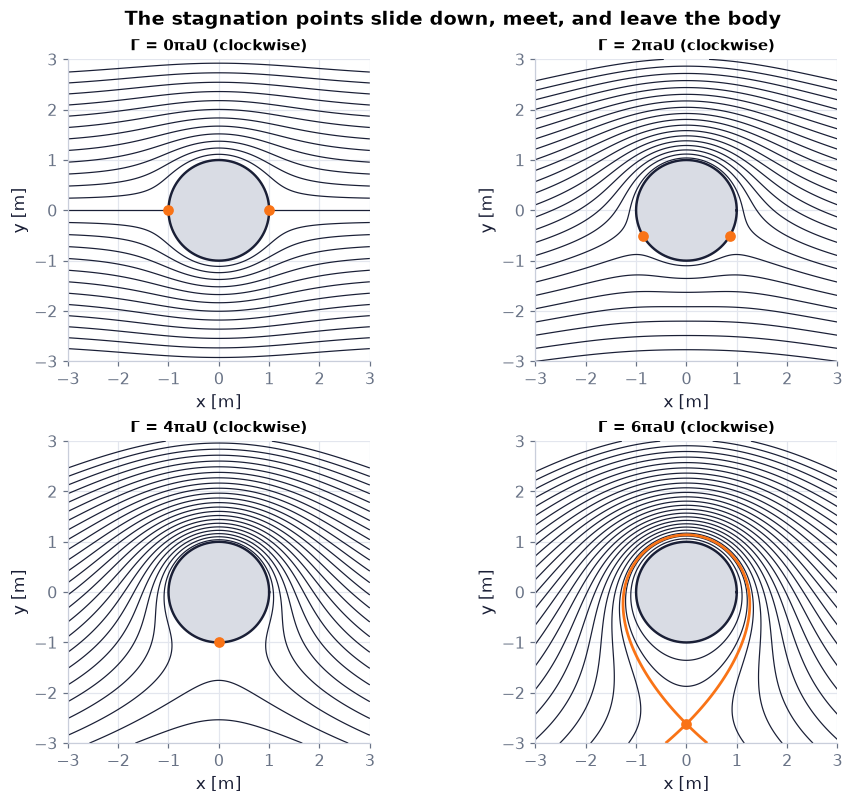

In [50]:
n = 201 if not FAST else 141                             # grid points per side
fig, axs = plt.subplots(2, 2, figsize=(8.5, 7.2))        # four regimes
for ax, k in zip(axs.ravel(), (0.0, 0.5, 1.0, 1.5)):     # Γ/(4πaU) = 0, ½, 1, 1.5
    G = k*4*np.pi                                        # clockwise Γ for U = 1 m/s, a = 1 m [m²/s]
    fl = pf.cylinder(1.0, 1.0, Gamma_cw=G)               # the flow
    st = ch06.cylinder_stagnation_points(1.0, 1.0, Gamma_cw=G)   # its stagnation points (closed form)
    flow_net(ax, fl, xlim=(-3, 3), ylim=(-3, 3), n=n, n_levels=25, body=circle(1.0), stag=st,
             mask_body=lambda X, Y: np.hypot(X, Y) < 1.0, title=f"Γ = {k*4:.0f}πaU (clockwise)")
    if k > 1:                                            # a free stagnation point: draw the streamline through it
        Xs_, Ys_ = np.meshgrid(np.linspace(-3, 3, n), np.linspace(-3, 3, n))   # grid [m]
        Ps_ = np.where(np.hypot(Xs_, Ys_) < 1.0, np.nan, fl.psi(Xs_, Ys_))   # ψ outside the body
        ax.contour(Xs_, Ys_, Ps_, levels=[float(fl.psi(st[0].real, st[0].imag))], colors=COLORS["orange"], linewidths=1.8)   # the separatrix
fig.suptitle("The stagnation points slide down, meet, and leave the body", fontweight="bold")
savefig(fig, "ch06", "c07_circulation_regimes"); plt.show()   # save, then draw

**What you see.** Two stagnation points (orange) at the sides; lower, at −30° and −150°; merged at the bottom; and a free point below the body where two streamlines cross.

**How to read it.** $\sin\theta=-\Gamma/4\pi aU$: at Γ = 2πaU they sit at −30° and −150°; at 4πaU at −90°; above that the root $r_+=[\Gamma+\sqrt{\Gamma^2-(4\pi aU)^2}]/4\pi U=2.618a$ (for Γ = 6πaU) lies in the fluid, and a ring of fluid circulates round the body forever.

**What would change if…** …U doubled at fixed Γ: the points move back up (Γ/4πaU halves) and the lift doubles (ρUΓ).

In [51]:
thd = np.linspace(-180, 180, 181)                        # surface angle θ [deg]
U_, a_ = 10.0, 0.1                                       # the air example [m/s, m]
def cp_traces(k):                                        # curves for Γ/(4πaU) = k
    G = k*4*np.pi*a_*U_                                  # clockwise Γ [m²/s]
    cp = ch06.cylinder_surface_cp(np.radians(thd), U_, a_, Gamma_cw=G)   # surface C_p from (6.39)
    st = ch06.cylinder_stagnation_points(U_, a_, Gamma_cw=G)   # stagnation points (complex)
    on = st[np.isclose(np.abs(st), a_)]                  # only those on the body
    return {"surface C_p": (thd, cp), "Γ = 0 ghost": (thd, 1 - 4*np.sin(np.radians(thd))**2),
            "stagnation points": (np.degrees(np.angle(on)) if on.size else np.array([np.nan]), np.ones(max(on.size, 1)))}
ks = np.linspace(0, 2, 21 if not FAST else 11)           # slider values of Γ/(4πaU)
fig = slider_figure(cp_traces, "Γ/4πaU", ks, xlabel="θ on the surface [deg]", ylabel="C_p [–]",
                    title="Circulation shifts the suction to the top", yrange=[-12, 1.5],
                    modes={"stagnation points": "markers"})
recolor(fig, {"surface C_p": COLORS["ink"], "Γ = 0 ghost": COLORS["muted"], "stagnation points": COLORS["orange"]},
        dashes={"Γ = 0 ghost": "dash"})
titles = []                                              # one title per slider step: lift and regime
for k in ks:
    s = ch06.cylinder_circulation_state(U_, a_, Gamma_cw=k*4*np.pi*a_*U_, rho=1.2)   # air
    titles.append(f"Circulation shifts the suction to the top: L = ρUΓ = {s['L_KJ']:.1f} N/m, D = 0 — {s['regime']}")
step_titles(fig, titles)
fig.show()                                               # draw it (works on the web page too)

**What you see.** The C_p curve against θ: as Γ grows, the dip at +90° (the top) deepens and the one at −90° (the bottom) fills in; the orange stagnation markers slide toward −90° and vanish from the body above Γ/4πaU = 1.

**How to read it.** Lower pressure on top than below gives the upward lift L = ρUΓ printed in the title; the curve stays symmetric about ±90° (front–back), which is why the drag stays zero.

**What would change if…** …the Γ sign flipped (counterclockwise): the whole picture mirrors top-to-bottom and the lift points down.

#### 🎮 Interactive: How does spin turn into lift?

**Why interactive rather than a static figure:** four snapshots sample a continuous story: dragging Γ moves the stagnation points round the body, makes them meet at 4πaU and leave it, while the pressure arrows and the force bars move with them — the lift bar lands on ρUΓ and the drag bar never leaves zero.

**What to try:**
- Drag Γ/4πaU from 0 to 1: the two stagnation points slide down and meet.
- Keep going to 1.5: a free stagnation point leaves the body — find its radius in Explain.
- Switch the convention chips to 'project Γ (ccw)': the same picture, the numbers change sign.
- Open Derivation → D11 step 7: the only term of the pressure that survives the lift integral lights up on the C_p curve.

In [52]:
show_viz("ch06", "cylinder_circulation_lift")   # full-width explainer; ⤢ Full screen for more room

[explainer ch06/cylinder_circulation_lift]

📝 **Note.** **History and spin** `N37` — Kutta and Zhukhovsky found $L=\rho U\Gamma$ independently just after 1900. A rotating cylinder develops circulation
through its boundary layer; at high spin the real flow resembles the Γ > 4πaU pattern, at low spin it separates. The
Magnus effect on spinning balls is mostly delayed separation (Ch. 9 §9.9); how a sharp edge fixes Γ is Ch. 14.

**What would change if…** …the body were an ellipse or an airfoil instead of a circle? The lift would still be ρUΓ — the shape only changes *which*
Γ nature picks. C10 proves it for any body; C11 builds the ellipse.

> 🔁 **Recap — Images for circles** (Ch. 5 §5.7). A circle can be made a streamline by more than one image (a vortex outside a cylinder needs an image vortex at the
inverse point and one at the centre), and images move when the flow is unsteady; Ch. 5's `circle_image_system` does it.
Milne-Thomson's circle theorem, $w(z)+\overline{w(a^2/\bar z)}$, is the general rule (our addition, `pf.circle_theorem`;
w is C09's complex potential).

> 🔁 **Recap — A vortex beside a wall** (Ch. 5 §5.7). A vortex of strength −Γ (clockwise) at (h, 0) beside the wall x = 0 is modelled by the vortex plus an image of the
opposite sign at (−h, 0); then u = 0 on the wall.

> 🔁 **Recap — Its drift** (Ch. 5 §5.7). The vortex moves with the velocity its image induces at its centre (its own is taken as zero): $d\xi_x/dt=0$,
$d\xi_y/dt=\Gamma/4\pi\xi_x$, so $\boldsymbol\xi(t)=(h,\ \Gamma t/4\pi h)$ — along the wall at Γ/4πh (0.0796 m/s for
Γ = 1 m²/s, h = 1 m). Ch. 5's walls are horizontal (y = 0), so we turn the picture by 90° counterclockwise: the wall
x = 0 becomes y = 0, the vortex at (h, 0) moves to (0, h), and the drift along +y becomes a drift along −x.

In [53]:
sol = bs.point_vortex_evolve(np.array([[0.0], [1.0]]), np.array([-1.0]), np.array([0.0, 10.0]), boundary="wall")   # Ch. 5
print(sol[-1].ravel())                                   # after 10 s: x = −0.7958 m (= −Γt/4πh), y = 1.0 m

[-0.7958  1.    ]


**What does the code above do?**

`point_vortex_evolve(positions, strengths, times, boundary="wall")` integrates the motion of point vortices above the
wall y = 0 with their images (Ch. 5 §5.7): a clockwise vortex (Γ = −1 m²/s in our counterclockwise sign) at height 1 m
drifts 0.7958 m in 10 s — the drift Γ/4πh = 0.0796 m/s along the wall.

### 🧩 Images, and what the wall feels as a vortex passes (Example 6.1) `C08`

*The question:* An eddy sweeps along a wall. What does a pressure sensor on the wall record as it passes?

*In one line:* $\frac{p(0,0,t)-p_\infty}{\rho}=\frac{\Gamma^2}{4\pi^2}\frac{(\Gamma t/4\pi h)^2-h^2}{\big((\Gamma t/4\pi h)^2+h^2\big)^2}$ (Example 6.1).

#### The problem in plain words

An eddy rolls along a seabed, a harbour wall or the side of a building; a pressure sensor mounted in the wall records a
blip. The wall is solid, so the flow must slide along it — and a mirror trick, the image vortex, makes that automatic.
With the image in place, unsteady Bernoulli tells us the whole pressure signal: suction as the eddy arrives, a small
over-pressure after it has passed.

#### The idea

```
image +G (ccw)  |  (cw) vortex -G       mirror images: vortex -> opposite sign, source -> same sign
  (-h, s)       |    (h, s)             the pair drifts along the wall at G/(4 pi h) (each pushes the other)
           wall x = 0                   p at the wall = -rho dphi/dt (unsteady, +) - rho v^2/2 (speed, -)
```

(G stands for Γ.)

> 🔁 **Glosses used below.** *Odd and even functions under a mirror:* $\psi(x,-y)=-\psi(x,y)$ makes ψ = 0 on y = 0; an
> even φ, $\phi(x,-y)=\phi(x,y)$, has ∂φ/∂y = 0 there. *Derivative of an arctangent with a moving argument:*
> $\frac{d}{dt}\tan^{-1}(Y/X)=\frac{X\dot Y}{X^2+Y^2}$ at fixed X (the chain rule, P49). *Unsteady Bernoulli* with
> gravity absorbed: $\frac{\partial\phi}{\partial t}+\tfrac12\lvert\nabla\phi\rvert^2+gz+\frac p\rho=\text{const}$ *(Eq. 4.83)*,
> with ∂φ/∂t at a fixed point (recap R05).

#### 🧮 Derivation — Images: vortex images flip sign, source images keep it `D12`

**What we want to show.** Turn a flow in the whole plane into a flow above a wall y = 0 by adding mirror images, and see why a vortex's image has the opposite sign while a source's has the same sign.

**Assumptions.** A straight wall y = 0; the fluid is y > 0; the images lie in y < 0 (outside the fluid).

**The plan.**

1. Build an odd ψ₂.
2. Check the wall.
3. Check the fluid's field equation.
4. Build an even φ₂.
5. Check both.

**Tools we use** (each explained before this point): odd and even functions under a mirror (gloss) · superposition (C03) · a wall is a streamline (D05) · (6.4), $\omega_z=\frac{\partial v}{\partial x}-\frac{\partial u}{\partial y}=-\nabla^2\psi$, (6.11), $\nabla^2\phi=q(x,y)$.

**We start from**

$$ \begin{array}{l}\text{An unbounded flow with stream function ψ₁(x, y) (vorticity ω₁) or potential} \\ \text{φ₁(x, y) (sources q₁), all its singularities in y > 0}\end{array} $$

*In words:* a flow that ignores the wall.

---

**Step 1 of 5 — Subtract the mirror image of ψ₁.**

$$ \psi_2(x,y)=\psi_1(x,y)-\psi_1(x,-y) $$

- *Why we can do this:* We want a ψ that vanishes on y = 0; a function minus its mirror is odd in y, and an odd function is zero on the mirror line.
- *In words:* The flow plus its upside-down, reversed copy.

---

**Step 2 of 5 — Evaluate on the wall.**

$$ \psi_2(x,0)=\psi_1(x,0)-\psi_1(x,0)=0 $$

- *Why we can do this:* Direct substitution y = 0; ψ₂ is constant along the wall, so the wall is a streamline (D05).
- *In words:* No fluid crosses the wall.

---

**Step 3 of 5 — Check the field equation in the fluid.**

$$ \nabla^2\psi_2=-\omega_1(x,y)+\omega_1(x,-y) $$

- *Why we can do this:* ∇² does not change under y → −y, so each part obeys (6.4), $\omega_z=\frac{\partial v}{\partial x}-\frac{\partial u}{\partial y}=-\nabla^2\psi$; the image's vorticity lies in y < 0, outside the fluid. A vortex Γ at (x₀, y₀) gets −Γ at (x₀, −y₀).
- *In words:* In the fluid nothing changed; behind the wall sits a vortex of opposite spin.

---

**Step 4 of 5 — Add the mirror image of φ₁.**

$$ \phi_2(x,y)=\phi_1(x,y)+\phi_1(x,-y) $$

- *Why we can do this:* For sources we control φ; an even function has zero slope across its mirror line, so v = ∂φ₂/∂y = 0 on y = 0.
- *In words:* The flow plus its upside-down copy, same sign.

---

**Step 5 of 5 — Check both conditions.**

$$ \frac{\partial\phi_2}{\partial y}\Big\rvert_{y=0}=0,\qquad\nabla^2\phi_2=q_1(x,y)+q_1(x,-y) $$

- *Why we can do this:* Differentiating an even function gives an odd one, zero on y = 0; the image source (same m) lies outside the fluid.
- *In words:* A source's image has the same sign; the wall again has no flow through it.

---

**Result**

$$ \text{Vortex images:}\ \psi_2=\psi_1(x,y)-\psi_1(x,-y)\ \text{; source images:}\ \phi_2=\phi_1(x,y)+\phi_1(x,-y) $$

*In words:* mirror the flow in the wall; vortices come back with opposite spin, sources with the same strength.

**What it means.** A wall is a symmetry line. The same trick gives the bottom condition of water waves (Ch. 7), coasts in ocean models (Ch. 13) and ground effect (Ch. 14).

**Check it.** A vortex at (0, 1) and its image: v on the wall = 0 at 1001 points (the code cell after note N39, ≤ 1e-14) ✓; with the same-sign image (the wrong variant) the wall leaks.

> ⚠️ **Common confusion (traps in `D12`):** Two different conditions (ψ₂ = 0 vs ∂φ₂/∂y = 0) give the same wall. Mirroring a counterclockwise vortex makes it clockwise — hence the sign.

📝 **Note.** **The rules** `N39` — Wall y = 0: vortex images flip sign, $\psi_2=\psi_1(x,y)-\psi_1(x,-y)$; source images keep it,
$\phi_2=\phi_1(x,y)+\phi_1(x,-y)$ — two different conditions (ψ₂ = 0, ∂φ₂/∂y = 0) that both make the wall impermeable.

In [54]:
els = pf.mirror([pf.Vortex(1.0, 0.5+1.0j), pf.Source(2.0, -1.0+0.7j)], wall="y=0")   # a vortex and a source + their images
fw = pf.Flow(els)                                        # the flow above the wall y = 0
xw = np.linspace(-5, 5, 1001)                            # 1001 points along the wall [m]
print(np.max(np.abs(fw.velocity(xw, 0*xw)[1])))          # max |v| on the wall ≈ 0: nothing crosses it

5.551115123125783e-17


📝 **Note.** **A source by a wall = two sources** `N40` — Equal sources at x = ±a. With the tangent addition formula ($\tan(A+B)=\frac{\tan A+\tan B}{1-\tan A\tan B}$) the
streamlines are $x^2-y^2-2xy\cot(2\pi\psi/m)=a^2$. The axes are streamlines and the origin a stagnation point, so the
same picture is two sources, one source beside a wall (the y-axis), or a slit flow into a right-angled corner:

$$ \psi=\frac m{2\pi}\Big[\tan^{-1}\Big(\frac y{x+a}\Big)+\tan^{-1}\Big(\frac y{x-a}\Big)\Big],\quad \phi=\frac m{2\pi}\Big[\ln\sqrt{(x+a)^2+y^2}+\ln\sqrt{(x-a)^2+y^2}\Big] \qquad \text{(6.41)} $$

In [55]:
f2 = ch06.two_sources(2*np.pi, 1.0)                      # sources m = 2π m²/s at x = ±1 m
xq = np.linspace(1.2, 4, 5)                              # five x positions [m]
yq = ch06.two_source_streamline(np.pi/2, 2*np.pi, 1.0, xq)   # y ≥ 0 on the curve x² − y² − 2xy cot(2πψ/m) = a², ψ = π/2
print(np.mod(f2.psi(xq, yq), 2*np.pi))                   # ψ = π/2 at all five points (mod m, where a branch is crossed)

[1.5708 1.5708 1.5708 1.5708 1.5708]


#### 🧮 Derivation — Example 6.1: a vortex beside a wall and the pressure it makes on the wall `D13`

**What we want to show.** For a clockwise vortex a distance h from a wall, find how it moves and the pressure at the wall point opposite its starting position, as a function of time.

**Assumptions.** The vortex's own (self-induced) velocity is zero — a real core is symmetric (step 2); fluid at rest at p∞ far away; no gravity; ∂φ/∂t at a fixed point (step 7).

**The plan.**

1. Check the wall.
2. Move the vortex with its image's velocity.
3. Build φ.
4. Unsteady Bernoulli at the origin: ∂φ/∂t and v there.
5. Combine into one fraction.

**Tools we use** (each explained before this point): wall image (R16), drift (R17) · unsteady Bernoulli (4.83), $\frac{\partial\phi}{\partial t}+\tfrac12\lvert\nabla\phi\rvert^2+gz+\frac p\rho=\text{const}$ with g = 0 (Ch. 4 §4.9, R05) · derivative of tan⁻¹(Y/X) with a moving Y (gloss) · chain rule (ch01 P49, reminder).

**We start from**

$$ \begin{array}{l}\psi=\frac{\Gamma}{2\pi}\Big[-\ln\sqrt{(x+\xi_x)^2+(y-\xi_y)^2}+\ln\sqrt{(x-\xi_x)^2+(y-\xi_y)^2}\Big]\ \text{— the vortex (strength −Γ, i.e. clockwise} \\ \text{Γ) at ξ = (ξ\_x, ξ\_y) and its image (+Γ) at (−ξ\_x, ξ\_y), wall x = 0}\end{array} $$

*In words:* D12's rule with the wall vertical.

---

**Step 1 of 11 — Check u = 0 on the wall.**

$$ u(0,y,t)=\frac{\partial\psi}{\partial y}\Big\rvert_{x=0}=0 $$

- *Why we can do this:* At x = 0 the two logarithms have the same argument and opposite signs, so ψ and its y-derivative vanish on the wall (D12).
- *In words:* No flow through the wall at any time.

---

**Step 2 of 11 — Move the vortex with its image.**

$$ \frac{d\xi_x}{dt}=0,\qquad\frac{d\xi_y}{dt}=\frac{\Gamma}{2\pi}\frac{1}{2\xi_x} $$

- *Why we can do this:* A free vortex moves with the local fluid; its own velocity is taken as zero, the image (+Γ at distance 2ξ_x) induces Γ/2π(2ξ_x) upward.
- *In words:* The eddy slides along the wall, never toward it.

---

**Step 3 of 11 — Integrate from (h, 0).**

$$ \boldsymbol\xi(t)=\Big(h,\ \frac{\Gamma t}{4\pi h}\Big) $$

- *Why we can do this:* ξ_x stays h; then dξ_y/dt = Γ/4πh is constant, integrated with ξ_y(0) = 0.
- *In words:* It climbs the wall at Γ/4πh (0.0796 m/s for Γ = 1 m²/s, h = 1 m).

---

**Step 4 of 11 — Write φ from the two vortices.**

$$ \phi=\frac{\Gamma}{2\pi}\tan^{-1}\Big(\frac{y-\Gamma t/4\pi h}{x+h}\Big)-\frac{\Gamma}{2\pi}\tan^{-1}\Big(\frac{y-\Gamma t/4\pi h}{x-h}\Big) $$

- *Why we can do this:* A counterclockwise vortex has φ = (Γ/2π) × angle (6.47), $w=-\frac{i\Gamma}{2\pi}\ln(z-z')$; the image (+Γ) and the vortex (−Γ) each contribute one. Near the origin neither arctan jumps.
- *In words:* The potential of the pair at time t.

---

**Step 5 of 11 — Write unsteady Bernoulli.**

$$ \frac{\partial\phi}{\partial t}+\frac12\lvert\nabla\phi\rvert^2+\frac p\rho=\frac{p_\infty}{\rho} $$

- *Why we can do this:* (4.83), $\frac{\partial\phi}{\partial t}+\tfrac12\lvert\nabla\phi\rvert^2+gz+\frac p\rho=\text{const}$ with g = 0; the constant is fixed far away, where the fluid is still at p∞.
- *In words:* Pressure is lowered by speed and by a growing potential.

---

**Step 6 of 11 — Evaluate at the wall origin.**

$$ \frac{p(0,0,t)-p_\infty}{\rho}=-\Big(\frac{\partial\phi}{\partial t}+\tfrac12(u^2+v^2)\Big)_{x=y=0} $$

- *Why we can do this:* Rearrange step 5 at the sensor point; u = 0 there by step 1.
- *In words:* The sensor reads two contributions.

---

**Step 7 of 11 — Differentiate φ at a fixed point.**

$$ \frac{\partial}{\partial t}\tan^{-1}\frac{Y}{X}=\frac{X\dot Y}{X^2+Y^2},\quad Y=y-\frac{\Gamma t}{4\pi h},\ \dot Y=-\frac{\Gamma}{4\pi h} $$

- *Why we can do this:* Chain rule with d(tan⁻¹s)/ds = 1/(1 + s²) (gloss); X = x ± h does not change, only Y moves with the vortex. The book skips this move.
- *In words:* The potential changes because the vortices move past.

---

**Step 8 of 11 — Put x = y = 0.**

$$ \Big(\frac{\partial\phi}{\partial t}\Big)_0=\frac{\Gamma}{2\pi}\Big(-\frac{\Gamma}{4\pi h}\Big)\Big[\frac{h}{h^2+s^2}+\frac{h}{h^2+s^2}\Big]=-\frac{\Gamma^2}{4\pi^2}\frac{1}{h^2+s^2} $$

- *Why we can do this:* With s = Γt/4πh: X = h for the first term, X = −h for the second (whose minus sign turns the second bracket positive), Y = −s in both.
- *In words:* The potential at the sensor keeps falling while the eddy passes.

---

**Step 9 of 11 — Find v at the origin.**

$$ v(0,0,t)=-\frac{\partial\psi}{\partial x}\Big\rvert_0=\frac{\Gamma h}{\pi}\frac{1}{h^2+s^2} $$

- *Why we can do this:* Differentiate ψ in x (both terms give h/(h² + s²) with the same sign at the origin) and use v = −∂ψ/∂x (6.3), $u\equiv\partial\psi/\partial y,\ v\equiv-\partial\psi/\partial x$.
- *In words:* The fluid at the sensor slides along the wall, fastest when the eddy is level with it.

---

**Step 10 of 11 — Substitute into step 6.**

$$ \frac{p-p_\infty}{\rho}=\frac{\Gamma^2}{4\pi^2}\frac{1}{h^2+s^2}-\frac{\Gamma^2h^2}{2\pi^2}\frac{1}{(h^2+s^2)^2} $$

- *Why we can do this:* −∂φ/∂t from step 8 and −½v² from step 9 (v² = Γ²h²/π²(h² + s²)², halved).
- *In words:* A positive unsteady part minus a speed part.

---

**Step 11 of 11 — Put over one denominator.**

$$ \frac{p(0,0,t)-p_\infty}{\rho}=\frac{\Gamma^2}{4\pi^2}\frac{s^2-h^2}{(s^2+h^2)^2},\quad s=\frac{\Gamma t}{4\pi h} $$

- *Why we can do this:* Multiply the first term by (h² + s²)/(h² + s²) and combine: (h² + s²) − 2h² = s² − h². This is the book's result.
- *In words:* Suction while the eddy is closer than h along the wall, over-pressure when farther.

---

**Result**

$$ \frac{p(0,0,t)-p_\infty}{\rho}=\frac{\Gamma^2}{4\pi^2}\frac{(\Gamma t/4\pi h)^2-h^2}{((\Gamma t/4\pi h)^2+h^2)^2} $$

*In words:* the sensor feels −ρΓ²/4π²h² when the eddy passes, zero at t = 4πh²/Γ and a maximum push ρΓ²/32π²h² at t = 4√3πh²/Γ (our addition: set d/ds of (s² − h²)/(s² + h²)² to zero, s = √3h).

**What it means.** A wall-mounted sensor (or an ocean-bottom recorder) sees a passing eddy as a dip flanked by small humps; the humps come from the flow changing in time, not from its speed.

**Check it.** Units: Γ²/h² [m²/s²] ✓ (p/ρ). Numbers: water, Γ = 1, h = 1: −25.33 Pa at t = 0 (= +25.33 unsteady − 50.66 speed), 0 at 12.57 s, +3.17, $\boldsymbol\omega=0$ Pa at 21.77 s ✓ (the code cell after the tiny example of C08); the numerical route (moving vortices, ∂φ/∂t by central differences) agrees to about seven digits (same cell). Limit t → ∞: p → p∞.

> ⚠️ **Common confusion (traps in `D13`):** ∂φ/∂t is at a fixed point while the vortex moves. The self-induced velocity is set to zero by a modelling argument, not by the equations. The arctan branch must not jump between the vortex and its image (it does not at the origin).

#### ✏️ Tiny example: an eddy by a harbour wall

Water ρ = 1000 kg/m³, Γ = 1 m²/s, h = 1 m.

1. Drift Γ/4πh = 1/12.566 = 0.0796 m/s.
2. At t = 0 (eddy level with the sensor): $\frac{p-p_\infty}{\rho}=\frac{1}{39.48}\cdot\frac{0-1}{1}$ → p − p∞ = −25.33 Pa:
   suction. Split: the unsteady part −ρ∂φ/∂t = +25.33 Pa, the speed part −½ρv² = −50.66 Pa.
3. The signal crosses zero when Γt/4πh = h, i.e. t = 4πh²/Γ = 12.57 s (the eddy is 1 m past the sensor, at 45°).
4. The largest over-pressure comes at Γt/4πh = √3 h, t = 21.77 s: p − p∞ = ρΓ²/(32π²h²) = +3.17, $\boldsymbol\omega=0$ Pa.
5. Then it fades as t⁻².

In [56]:
for t in (0.0, 4*np.pi, 4*np.sqrt(3)*np.pi, 60.0):       # four instants [s]
    r = ch06.example_6_1(t)                              # Example 6.1 in closed form (Γ = 1 m²/s, h = 1 m, water)
    print(f"t = {t:6.2f} s: ξ_y = {r['xi_y']:.3f} m, p − p∞ = {r['p_origin']:+.4f} Pa "
          f"(unsteady {r['unsteady']:+.3f}, speed {r['speed_part']:+.3f})")
print(ch06.example_6_1(5.0, route="numeric")["p_origin"], ch06.example_6_1(5.0)["p_origin"])   # two routes, one number [Pa]

t =   0.00 s: ξ_y = 0.000 m, p − p∞ = -25.3303 Pa (unsteady +25.330, speed -50.661)
t =  12.57 s: ξ_y = 1.000 m, p − p∞ = +0.0000 Pa (unsteady +12.665, speed -12.665)
t =  21.77 s: ξ_y = 1.732 m, p − p∞ = +3.1663 Pa (unsteady +6.333, speed -3.166)
t =  60.00 s: ξ_y = 4.775 m, p − p∞ = +0.9750 Pa (unsteady +1.064, speed -0.089)
-15.890490910842267 -15.890490882316035


**What does the code above do?**

1. The closed form of Example 6.1 and its split into the unsteady part −ρ∂φ/∂t (positive) and the speed part −½ρv²
   (negative): −25.33 Pa at t = 0, zero at 12.57 s, +3.166 Pa at 21.77 s, fading after.
2. The numeric route moves a `Vortex` and its image, takes ∂φ/∂t at the origin by a central difference in time and
   applies Bernoulli — an independent route that agrees to about seven digits.

**From scratch — Bernoulli by hand at one instant:**

In [57]:
Gm, h, rho = 1.0, 1.0, 1000.0                            # Γ [m²/s], distance from the wall [m], water [kg/m³]
phi0 = lambda t: (Gm/(2*np.pi))*(np.arctan2(0 - Gm*t/(4*np.pi*h), 0 + h) - np.arctan2(0 - Gm*t/(4*np.pi*h), 0 - h))   # φ at the origin (D13 step 4)
dt = 1e-4                                                # time step for the central difference [s]
dphidt = (phi0(5 + dt) - phi0(5 - dt))/(2*dt)            # ∂φ/∂t at t = 5 s [m²/s²]
v = Gm*h/(np.pi*(h**2 + (Gm*5/(4*np.pi*h))**2))          # the wall velocity at the origin at t = 5 s [m/s]
p = -rho*(dphidt + 0.5*v**2)                             # unsteady Bernoulli, p∞ = 0 [Pa]
print(p)                                                 # −15.89 Pa
assert np.isclose(p, ch06.example_6_1(5.0)["p_origin"], rtol=1e-6)   # = the library's pressure

-15.890490882351976


Bernoulli by hand at one instant gives the library's pressure. (`np.arctan2` keeps the angle continuous here.)

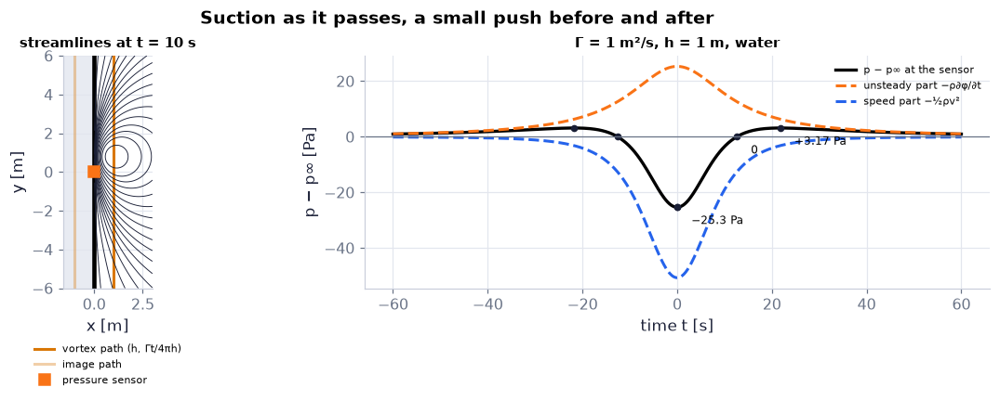

In [58]:
tt = np.linspace(-60, 60, 601)                           # time [s]; negative t = the eddy approaching from below
res = [ch06.example_6_1(t) for t in tt]                  # the closed form at every time
P0 = np.array([r["p_origin"] for r in res]); Pu = np.array([r["unsteady"] for r in res]); Ps = np.array([r["speed_part"] for r in res])   # total, unsteady and speed parts [Pa]
fig, (a1, a2) = plt.subplots(1, 2, figsize=(10.5, 3.8), gridspec_kw=dict(width_ratios=[1, 1.7]))  # geometry | signal
yv = np.linspace(-6, 6, 50)                              # the vortex path [m]
a1.plot(1 + 0*yv, yv, color=COLORS["amber"], lw=2, label="vortex path (h, Γt/4πh)")   # the vortex moves along x = h
a1.plot(-1 + 0*yv, yv, color=COLORS["amber"], lw=2, alpha=0.35, label="image path")   # its mirror image behind the wall
a1.axvline(0, color="k", lw=3); a1.fill_betweenx([-6, 6], -1.6, 0, color="#e8ebf2")   # the wall and the "other side"
tc = 10.0                                                # instant of the snapshot [s]
fv = pf.Flow(pf.mirror([pf.Vortex(-1.0, 1.0 + 1j*tc/(4*np.pi))], wall="x=0"))   # clockwise vortex + image at t = 10 s
Xg, Yg = np.meshgrid(np.linspace(0.02, 3, 121), np.linspace(-6, 6, 241))   # the fluid side x > 0 [m]
Pv = fv.psi(Xg, Yg)                                      # ψ of the vortex and its image [m²/s]
a1.contour(Xg, Yg, Pv, levels=np.nanpercentile(Pv, np.linspace(3, 97, 17)), colors=COLORS["ink"], linewidths=0.6)   # streamlines at t = 10 s
a1.plot([0], [0], "s", color=COLORS["orange"], ms=8, label="pressure sensor")   # the sensor at the origin
a1.set_xlim(-1.6, 3); a1.set_ylim(-6, 6); a1.set_aspect("equal"); a1.set_xlabel("x [m]"); a1.set_ylabel("y [m]")   # frame and axes with units
a1.legend(fontsize=7, loc="upper center", bbox_to_anchor=(0.5, -0.2), ncol=1); a1.set_title("streamlines at t = 10 s", fontsize=10)   # legend and title
a2.plot(tt, P0, color="k", lw=2.2, label="p − p∞ at the sensor")   # the sensor signal
a2.plot(tt, Pu, color=COLORS["orange"], ls="--", label="unsteady part −ρ∂φ/∂t")   # always positive here
a2.plot(tt, Ps, color=COLORS["blue"], ls="--", label="speed part −½ρv²")   # always suction
for t_, lab in ((0.0, "−25.3 Pa"), (4*np.pi, "0"), (4*np.sqrt(3)*np.pi, "+3.17 Pa")):   # marked instants
    a2.plot([t_, -t_], [ch06.example_6_1(t_)["p_origin"]]*2, "o", color=COLORS["ink"], ms=4)   # mark ±t
    a2.annotate(lab, (t_, ch06.example_6_1(t_)["p_origin"]), (t_ + 3, ch06.example_6_1(t_)["p_origin"] - 6), fontsize=8)   # its value
a2.axhline(0, color=COLORS["muted"], lw=0.8); a2.set_xlabel("time t [s]"); a2.set_ylabel("p − p∞ [Pa]")   # p = p∞ line and axes
a2.legend(fontsize=7); a2.set_title("Γ = 1 m²/s, h = 1 m, water", fontsize=10)   # legend and the case
fig.suptitle("Suction as it passes, a small push before and after", fontweight="bold")   # the message
savefig(fig, "ch06", "c08_wall_pressure"); plt.show()    # save, then draw

**What you see.** Left, the vortex path parallel to the wall, its faint image behind the wall and closed streamlines round the vortex; right, a deep negative dip at t = 0 flanked by two small positive humps.

**How to read it.** The speed part (blue) is always suction; the unsteady part (orange) is always positive here and wins when the eddy is far away — it decays like t⁻², the speed part like t⁻⁴. The formula is even in t: approach and departure look alike.

**What would change if…** …h halved: the dip deepens ×4 (the Γ²/h² scaling) and the whole signal runs 4× faster (time scale h²/Γ).

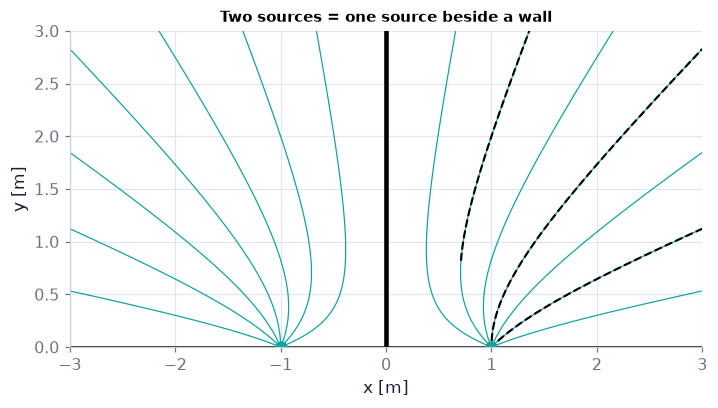

In [59]:
f2 = ch06.two_sources(2*np.pi, 1.0)                      # sources m = 2π m²/s at x = ±1 m
Xg, Yg = np.meshgrid(np.linspace(-3, 3, 241 if not FAST else 161), np.linspace(0.005, 3, 121 if not FAST else 81))   # upper half [m]
fig, ax = plt.subplots(figsize=(7, 3.6))                 # one panel
ax.contour(Xg, Yg, f2.psi(Xg, Yg), levels=np.arange(1, 16)*np.pi/8, colors=COLORS["teal"], linewidths=0.8)   # ψ = kπ/8, includes π/4, π/2, 3π/4
for psi_v in (np.pi/4, np.pi/2, 3*np.pi/4):              # three streamlines of (6.41)'s algebraic form, right half
    xq = np.linspace(0.0, 3, 600)                        # x positions [m] (NaN where the curve has no point)
    ax.plot(xq, ch06.two_source_streamline(psi_v, 2*np.pi, 1.0, xq), color="k", ls="--", lw=1.4)
ax.axvline(0, color="k", lw=3); ax.axhline(0, color="k", lw=1)   # the y-axis is a wall; the x-axis a streamline
ax.plot([-1, 1], [0, 0], "o", color=COLORS["teal"], ms=7)   # the two sources
ax.set_xlim(-3, 3); ax.set_ylim(0, 3); ax.set_aspect("equal"); ax.set_xlabel("x [m]"); ax.set_ylabel("y [m]")
ax.set_title("Two sources = one source beside a wall", fontsize=10)
savefig(fig, "ch06", "c08_two_sources"); plt.show()      # save, then draw

**What you see.** Teal streamlines leaving both sources; the dashed black curves (the algebraic form of (6.41), $\psi=\frac m{2\pi}\Big[\tan^{-1}\Big(\frac y{x+a}\Big)+\tan^{-1}\Big(\frac y{x-a}\Big)\Big]$) lie exactly on three of them; nothing crosses the y-axis.

**How to read it.** By symmetry the y-axis is a streamline, so the right half is a source beside a wall — the source's image keeps its sign. The origin is a stagnation point where the two outflows meet.

**What would change if…** …the left source made a sink: the image rule would be broken — the y-axis would no longer be a streamline (flow would cross it from the source to the sink).

In [60]:
nfr = 60 if not FAST else 30                             # number of frames
times = np.linspace(-40, 40, nfr)                        # time [s]
yw = np.linspace(-6, 6, 201)                             # wall points [m]
Pw = np.array([ch06.example_6_1_wall_pressure(yw, t) for t in times])   # p − p∞ along the wall at every time [Pa]
Pt = np.array([ch06.example_6_1(t)["p_origin"] for t in times])         # the sensor signal [Pa]
fig, (a1, a2) = plt.subplots(1, 2, figsize=(9, 3.6))     # wall | sensor trace
sc = a1.scatter(0*yw, yw, c=Pw[0], cmap="coolwarm_r", vmin=-26, vmax=26, s=18)   # blue = suction, red = over-pressure
vort, = a1.plot([1], [0], "o", color=COLORS["amber"], ms=10)   # the vortex
img, = a1.plot([-1], [0], "o", color=COLORS["amber"], ms=10, alpha=0.3)   # its image
a1.axvline(0, color="k", lw=1); a1.set_xlim(-1.6, 1.6); a1.set_ylim(-6, 6); a1.set_xlabel("x [m]"); a1.set_ylabel("y [m]")
fig.colorbar(sc, ax=a1, label="p − p∞ on the wall [Pa]")
a2.plot(times, Pt, color=COLORS["muted"], lw=1)           # the whole signal, faint
dot, = a2.plot([times[0]], [Pt[0]], "o", color="k")       # where we are now
a2.set_xlabel("t [s]"); a2.set_ylabel("p − p∞ at the sensor [Pa]"); a2.set_ylim(-28, 6)
def update(i):                                           # draw frame i
    s = times[i]/(4*np.pi)                               # vortex height ξ_y = Γt/4πh [m]
    sc.set_array(Pw[i]); vort.set_data([1], [s]); img.set_data([-1], [s])   # recolour the wall, move the pair
    dot.set_data([times[i]], [Pt[i]])                    # move the dot on the trace
    a1.set_title(f"t = {times[i]:+.0f} s", fontsize=10)
show_animation(animate(update, frames=nfr, fig=fig, interval=80), player="video")   # smooth MP4

**What you see.** The vortex and its image slide up together; a blue (suction) patch on the wall travels with them, with faint red (over-pressure) patches leading and trailing; the black dot traces the sensor signal.

**How to read it.** The sensor at the origin feels the travelling pattern as the dip-and-humps signal of the static figure.

**What would change if…** …the eddy twice as strong (Γ = 2 m²/s): it drifts twice as fast and every pressure is four times larger.

#### 🎮 Interactive: What does a wall feel as an eddy passes?

**Why interactive rather than a static figure:** the result is a time series tied to a moving vortex: scrubbing time links the vortex position to the sensor trace and to the pressure along the whole wall, and the source mode shows the other image rule on the same stage.

**What to try:**
- Press ▶ and watch the blue suction patch ride along the wall with the eddy.
- Preset 't = 4πh²/Γ': the signal crosses zero — the terms panel shows the unsteady and speed parts cancelling.
- Halve h: the dip is four times deeper and four times shorter.
- Switch to 'source by a wall': the image keeps its sign, and the wall still has no flow through it.

In [61]:
show_viz("ch06", "vortex_wall_images")   # full-width explainer; ⤢ Full screen for more room

[explainer ch06/vortex_wall_images]

**What would change if…** …the wall were the sea floor and the eddy a storm-driven vortex in the ocean? The same image model gives the
bottom-pressure signal that ocean-bottom pressure recorders see as eddies pass — a small signal (tens of pascals here)
compared with the tides, which is why it is averaged out or modelled (Ch. 13 adds rotation and stratification).

---

## 6.4 Complex Potential

**What is this section about?** φ and ψ are two halves of one complex function w(z) of the complex position z = x + iy.
If w has a derivative that does not depend on the direction you take it in, its real and imaginary parts are
automatically a potential and a stream function of an ideal flow, and the derivative is the velocity — with v flipped:
dw/dz = u − iv. Every element of §6.3 becomes one line.

### 🧩 The complex potential and the complex velocity `C09`

*The question:* Why does a single complex function carry a whole flow — and why is the velocity u − iv, not u + iv?

*In one line:* $w\equiv\phi+i\psi$ *(6.42)* · $dw/dz=u-iv$ *(6.45)*

#### The problem in plain words

So far every flow needed two functions, one for streamlines and one for equipotentials, and every new body meant new
algebra. Engineers designing wings in the 1900s found a shortcut: write the position as one complex number and the flow
as one complex function. Then any "nice" function of z is a flow, forces become a single contour integral (C10), and
maps between planes carry flows onto new shapes (C11).

#### The idea

```
z = x + iy  --->  w(z) = phi + i psi        Re w: equipotentials (dashed)    Im w: streamlines (solid)
derivative along x  =  derivative along iy   <=>   Cauchy-Riemann   <=>   phi _|_ psi and both harmonic
dw/dz = u - iv   (the velocity, mirrored in the x-axis)
```

> 🔁 **Tools from earlier chapters used here** (see `knowledge/primers.md`)

- **Euler's formula e^{iθ} = cos θ + i sin θ** — $e^{i\theta}=\cos\theta+i\sin\theta$, with $i^2=-1$ (Ch. 1 P45).
- **complex conjugate** — $z^*=\bar z=x-iy$; $zz^*=\lvert z\rvert^2$ (Ch. 2 P81).

> 📎 **Primer — the complex plane in numpy.** `P153` · A complex number z = x + iy is a point (x, y); its modulus |z| = √(x² + y²) is the distance from 0 and its argument
arg z = atan2(y, x) the angle, so $z=re^{i\theta}$ (Euler's formula). Multiplying two complex numbers multiplies their
moduli and **adds their angles** — a rotation plus a stretch. The conjugate z* = x − iy mirrors in the x-axis. numpy:
`1j`, `np.abs`, `np.angle`, `np.conj`; arrays of complex numbers work like any other array.

In [62]:
z = 1 + 1j                                               # the point (1, 1)
print(np.abs(z), np.degrees(np.angle(z)))                # modulus 1.414 and angle 45°
q = z * 2j                                               # times 2i: stretch ×2, turn +90°
print(q, np.abs(q), np.degrees(np.angle(q)), np.conj(z)) # (-2+2j) 2.828 135.0 (1-1j)

1.4142135623730951 45.0
(-2+2j) 2.8284271247461903 135.0 (1-1j)


📝 **Note.** **The complex position** `N41` — in Cartesian and polar form: r = (x² + y²)^½, θ = tan⁻¹(y/x) (numpy: `np.abs`, `np.angle`).

$$ z\equiv x+iy=re^{i\theta} \qquad \text{(6.43)} $$

> 📎 **Primer — complex derivative and analytic functions.** `P154` · The derivative of w(z) is the limit of $[w(z+\delta z)-w(z)]/\delta z$ as the small complex step δz shrinks — but δz can
point in any direction in the plane. If the limit is the same for every direction, w is **analytic** there.
Polynomials, exp, log (away from its cut) and 1/z (away from 0) are analytic; z* is not: along x its quotient is 1,
along iy it is −1.

In [63]:
w = lambda z: z**2                                       # an analytic function
z0, h = 1 + 1j, 1e-6                                     # a point and a small step
print((w(z0 + h) - w(z0))/h, (w(z0 + 1j*h) - w(z0))/(1j*h))   # both ≈ 2+2j: one derivative
s = np.conj                                              # z* is not analytic
print((s(z0 + h) - s(z0))/h, (s(z0 + 1j*h) - s(z0))/(1j*h))   # 1 and −1: no derivative

(2.0000009999243673+1.9999999998354667j) (1.9999999998354667+2.0000009999243673j)
(0.9999999999177334+0j) (-0.9999999999177334-0j)


> 🔁 **Tools from earlier chapters used here** (see `knowledge/primers.md`)

- **Schwarz's theorem** — mixed partial derivatives of a smooth function commute: $\partial^2\psi/\partial x\partial y=\partial^2\psi/\partial y\partial x$ (Ch. 4 P121).

#### 🧮 Derivation — Cauchy–Riemann and the complex velocity dw/dz = u − iv `D14` (Eq. 6.44: $\frac{\partial\phi}{\partial x}=\frac{\partial\psi}{\partial y},\ \frac{\partial\phi}{\partial y}=-\frac{\partial\psi}{\partial x}$)

**What we want to show.** Show that if w(z) = φ + iψ has a derivative independent of direction, then φ and ψ satisfy the Cauchy–Riemann equations, the derivative is u − iv, and both φ and ψ are harmonic — so every analytic function is a flow.

**Assumptions.** φ, ψ twice continuously differentiable (steps 6–8).

**The plan.**

1. Take the limit along x.
2. Take it along iy.
3. Equate.
4. Read off u − iv.
5. Differentiate once more for Laplace and orthogonality.

**Tools we use** (each explained before this point): complex derivative and analytic functions (primer, in C09) · 1/i = −i · Schwarz's theorem (ch04 P121, reminder) · ψ and φ (R03, N09).

**We start from**

$$ w(z)=\phi(x,y)+i\psi(x,y)\ \text{(6.42),}\ \frac{dw}{dz}=\lim_{\delta z\to0}\frac{w(z+\delta z)-w(z)}{\delta z}\ \text{the same for every direction of δz} $$

*In words:* w is analytic.

---

**Step 1 of 8 — Step along x: δz = δx.**

$$ \frac{dw}{dz}=\frac{\partial\phi}{\partial x}+i\frac{\partial\psi}{\partial x} $$

- *Why we can do this:* With δz real, the quotient is the ordinary partial derivative of φ + iψ in x.
- *In words:* The derivative seen walking east.

---

**Step 2 of 8 — Step along iy: δz = iδy.**

$$ \frac{dw}{dz}=\frac{1}{i}\Big(\frac{\partial\phi}{\partial y}+i\frac{\partial\psi}{\partial y}\Big) $$

- *Why we can do this:* Now the step is i times δy, so we divide the change in w by iδy.
- *In words:* The derivative seen walking north.

---

**Step 3 of 8 — Use 1/i = −i.**

$$ \frac{dw}{dz}=\frac{\partial\psi}{\partial y}-i\frac{\partial\phi}{\partial y} $$

- *Why we can do this:* 1/i = −i since i × (−i) = 1; multiply out. The book skips this move.
- *In words:* Walking north, the roles of φ and ψ swap.

---

**Step 4 of 8 — Equate real and imaginary parts.**

$$ \frac{\partial\phi}{\partial x}=\frac{\partial\psi}{\partial y},\qquad\frac{\partial\phi}{\partial y}=-\frac{\partial\psi}{\partial x} $$

- *Why we can do this:* Analytic means steps 1 and 3 are the same complex number; two complex numbers are equal when both parts are. This is (6.44), $\frac{\partial\phi}{\partial x}=\frac{\partial\psi}{\partial y},\ \frac{\partial\phi}{\partial y}=-\frac{\partial\psi}{\partial x}$ — the line above.
- *In words:* The Cauchy–Riemann equations: φ and ψ are locked together.

---

**Step 5 of 8 — Read the velocity from step 1.**

$$ \frac{dw}{dz}=u-iv $$

- *Why we can do this:* ∂φ/∂x = u by (6.10), $u\equiv\partial\phi/\partial x,\ v\equiv\partial\phi/\partial y$ and ∂ψ/∂x = −v by (6.3), $u\equiv\partial\psi/\partial y,\ v\equiv-\partial\psi/\partial x$. This is (6.45), $dw/dz=u-iv$ — the line above.
- *In words:* The complex derivative is the velocity with v flipped.

---

**Step 6 of 8 — Differentiate the first CR equation in x.**

$$ \frac{\partial^2\phi}{\partial x^2}=\frac{\partial^2\psi}{\partial x\partial y} $$

- *Why we can do this:* Differentiate both sides of the first equation of (6.44), $\frac{\partial\phi}{\partial x}=\frac{\partial\psi}{\partial y},\ \frac{\partial\phi}{\partial y}=-\frac{\partial\psi}{\partial x}$ once more; allowed for smooth φ, ψ.
- *In words:* φ's curvature in x equals a mixed derivative of ψ.

---

**Step 7 of 8 — Add the second, differentiated in y.**

$$ \frac{\partial^2\phi}{\partial x^2}+\frac{\partial^2\phi}{\partial y^2}=\frac{\partial^2\psi}{\partial x\partial y}-\frac{\partial^2\psi}{\partial y\partial x}=0 $$

- *Why we can do this:* The second equation of (6.44), $\frac{\partial\phi}{\partial x}=\frac{\partial\psi}{\partial y},\ \frac{\partial\phi}{\partial y}=-\frac{\partial\psi}{\partial x}$ differentiated in y gives φ_yy = −ψ_xy; mixed partials commute (Schwarz), so they cancel. The same move with the roles swapped gives ∇²ψ = 0.
- *In words:* Both φ and ψ are harmonic — irrotational and incompressible automatically.

---

**Step 8 of 8 — Check orthogonality with CR.**

$$ \nabla\phi\cdot\nabla\psi=\phi_x\psi_x+\phi_y\psi_y=\phi_x(-\phi_y)+\phi_y\phi_x=0 $$

- *Why we can do this:* Replace ψ_x by −φ_y and ψ_y by φ_x from (6.44), $\frac{\partial\phi}{\partial x}=\frac{\partial\psi}{\partial y},\ \frac{\partial\phi}{\partial y}=-\frac{\partial\psi}{\partial x}$.
- *In words:* Equipotentials and streamlines of any analytic w cross at right angles (D04 again).

---

**Result**

$$ \frac{\partial\phi}{\partial x}=\frac{\partial\psi}{\partial y},\ \frac{\partial\phi}{\partial y}=-\frac{\partial\psi}{\partial x}\ \text{(6.44),}\ \frac{dw}{dz}=u-iv\ \text{(6.45),}\ \nabla^2\phi=\nabla^2\psi=0 $$

*In words:* every analytic function of z is a plane ideal flow, and its derivative is the mirrored velocity.

**What it means.** One complex function replaces two real ones; complex analysis (residues, maps) now works for flows (C10, C11). ⚠️ The book writes "(6.5), $\nabla^2\psi=0$ and (6.12), $\nabla^2\phi=0$, respectively" for φ and ψ — the other way round.

**Check it.** w = z² at z = 1 + i: dw/dz = 2 + 2i ⇒ u = 2, v = −2 m/s; ψ = 2xy gives u = 2x = 2, v = −2y = −2 ✓. Control: f = z* gives 1 along x and −1 along iy — no derivative, not a flow ✓.

> ⚠️ **Common confusion (traps in `D14`):** Along iy the quotient divides by i. The velocity arrow is conj(dw/dz), not dw/dz.

📝 **Note.** **Cauchy–Riemann** `N42` — They make the φ- and ψ-lines cross at right angles — except where w or dw/dz is zero or infinite (stagnation points and
singular points).

$$ \frac{\partial\phi}{\partial x}=\frac{\partial\psi}{\partial y},\ \frac{\partial\phi}{\partial y}=-\frac{\partial\psi}{\partial x} \qquad \text{(6.44)} $$

📝 **Note.** **The complex velocity** `N43` — Applying the Cauchy–Riemann conditions to it gives back continuity $\partial u/\partial x+\partial v/\partial y=0$
*(6.2)* and irrotationality $\partial v/\partial x-\partial u/\partial y=0$ *(6.9)*, and Laplace's equation for both φ and
ψ: *any analytic function of z is a plane ideal flow.* ⚠️ The book writes "Laplace equations for φ and ψ, (6.5), $\nabla^2\psi=0$ and
(6.12), $\nabla^2\phi=0$, respectively" — it is the other way round ((6.5) is ψ's, (6.12) is φ's); and "(6.43), $z\equiv x+iy=re^{i\theta}$ ensures the equality of the
u, v components" means the Cauchy–Riemann conditions (6.44), $\frac{\partial\phi}{\partial x}=\frac{\partial\psi}{\partial y},\ \frac{\partial\phi}{\partial y}=-\frac{\partial\psi}{\partial x}$.

$$ dw/dz=u-iv \qquad \text{(6.45)} $$

#### ✏️ Tiny example: w = z² at z = 1 + i

1. $dw/dz=2z=2+2i$.
2. So $u-iv=2+2i$: u = 2 m/s and **v = −2 m/s** (the sign flips).
3. Check with ψ = Im z² = 2xy (the corner flow (6.24), $\psi=2Axy$ with A = 1): $u=\partial\psi/\partial y=2x=2$ ✓,
   $v=-\partial\psi/\partial x=-2y=-2$ ✓.
4. Cauchy–Riemann: φ = x² − y², $\partial\phi/\partial x=2x=2=\partial\psi/\partial y$ ✓,
   $\partial\phi/\partial y=-2y=-2=-\partial\psi/\partial x$ ✓.

> 📎 **Primer — complex logarithm, powers and branch cuts.** `P155` · Because θ is only defined up to multiples of 2π, $\ln z=\ln r+i\theta$ has many values; a program picks θ in a range
(numpy: (−π, π]), so ln z jumps by 2πi across a **branch cut** (numpy's runs along the negative real axis). Powers inherit
it: $z^n=e^{n\ln z}=r^ne^{in\theta}$. In a flow we rotate the cut so it lies inside a body or outside the fluid we draw —
then every quantity we look at is smooth (the `cut_angle` of C03 and C05).

In [64]:
z = np.array([-1 + 1e-9j, -1 - 1e-9j])                   # just above and below the negative real axis
print(np.log(z).imag)                                    # +π and −π: a jump of 2π across the cut
print(np.sqrt(z))                                        # ±i: the square root jumps too
print(np.log(z*np.exp(-1j*np.pi/2)).imag + np.pi/2)      # cut turned to the −y axis: no jump at z = −1

[ 3.1416 -3.1416]
[0.+1.j 0.-1.j]
[3.1416 3.1416]


#### 🧮 Derivation — Flow in a corner, w = Azⁿ: walls and the speed at the tip `D15` (Eq. 6.46: $w(z)=Az^n=Ar^n(\cos n\theta+i\sin n\theta)$)

**What we want to show.** Show that w = Azⁿ is the flow in a corner of angle α = π/n, and find how the speed behaves at the corner's tip.

**Assumptions.** 0 ≤ θ ≤ π/n inside the corner; the branch cut of zⁿ placed outside it (step 7).

**The plan.**

1. Polar form of zⁿ.
2. Read ψ.
3. Find the walls.
4. Recover n = 2.
5. Speed near the tip.
6. The plate.

**Tools we use** (each explained before this point): complex logarithm, powers and branch cuts (primer, in C09) · polar form (N41) · D14's dw/dz = u − iv.

**We start from**

$$ w(z)=Az^n\ \text{, A real,}\ z=re^{i\theta}\ \text{(6.43)} $$

*In words:* a power of z.

---

**Step 1 of 7 — Raise the polar form to the n-th power.**

$$ z^n=r^ne^{in\theta} $$

- *Why we can do this:* zⁿ = e^{n ln z} and ln z = ln r + iθ (primer), valid on the branch where θ runs across the corner.
- *In words:* The distance is raised to the power n, the angle multiplied by n.

---

**Step 2 of 7 — Split into φ and ψ.**

$$ w=Ar^n\cos n\theta+i\,Ar^n\sin n\theta\ \Rightarrow\ \psi=Ar^n\sin n\theta $$

- *Why we can do this:* Euler's formula (ch01 P45) and w = φ + iψ (6.42), $w\equiv\phi+i\psi$. This is (6.46), $w(z)=Az^n=Ar^n(\cos n\theta+i\sin n\theta)$ — the line above.
- *In words:* The stream function of the corner flow.

---

**Step 3 of 7 — Find where ψ = 0.**

$$ \sin n\theta=0\ \Rightarrow\ \theta=0\ \text{and}\ \theta=\frac{\pi}{n}\equiv\alpha $$

- *Why we can do this:* Walls are streamlines (D05); ψ = 0 on these two rays, which bound the region between them.
- *In words:* A corner of angle α = π/n.

---

**Step 4 of 7 — Check n = 2.**

$$ w=Az^2=A(x^2-y^2)+i\,2Axy $$

- *Why we can do this:* Expand (x + iy)²; Re is (6.27), $\phi=A(x^2-y^2)$, Im is (6.24), $\psi=2Axy$, walls at 0 and 90°.
- *In words:* The right-angle stagnation flow is the case n = 2.

---

**Step 5 of 7 — Differentiate.**

$$ \frac{dw}{dz}=nAz^{n-1}=\frac{A\pi}{\alpha}z^{(\pi-\alpha)/\alpha} $$

- *Why we can do this:* Power rule for an analytic function; n = π/α rewrites the exponent n − 1 as (π − α)/α.
- *In words:* The complex velocity of the corner flow.

---

**Step 6 of 7 — Read the speed at the tip.**

$$ \lvert\mathbf u\rvert=nAr^{n-1}\ \to\ \begin{cases}0,&\alpha<\pi\\ \infty,&\alpha>\pi\end{cases}\quad(r\to0) $$

- *Why we can do this:* |dw/dz| = |u − iv| = speed; r^{n−1} vanishes for n > 1 and blows up for n < 1.
- *In words:* Narrow corners are calm (a stagnation point); corners wider than a straight wall are violent.

---

**Step 7 of 7 — Take n = ½: the flat plate.**

$$ w=Az^{1/2},\quad\alpha=2\pi $$

- *Why we can do this:* The walls θ = 0 and θ = 2π are both the positive x-axis: a plate; z^{1/2} needs its cut along the plate itself so the fluid round it is smooth.
- *In words:* Flow round the edge of a thin plate, with infinite speed at the edge.

---

**Result**

$$ w=Az^n\ \text{(6.46) is flow in a corner of angle α = π/n with}\ dw/dz=(A\pi/\alpha)z^{(\pi-\alpha)/\alpha} $$

*In words:* the corner's angle alone decides whether the tip is a stagnation point (α < π) or a point of infinite speed (α > π).

**What it means.** Example 6.2's re-entrant 270° step (C12) has α = 3π/2, speed ∝ r^{−1/3} — why grids converge slowly there; Ch. 9's wedge flows U ∝ x^m grow from this outer flow; a sharp trailing edge (α = 2π) needs the Kutta condition (Ch. 14).

**Check it.** n = 2 gives (6.24), $\psi=2Axy$/(6.27), $\phi=A(x^2-y^2)$ ✓; log–log slopes of |dw/dz| vs r equal n − 1 for n = 2, 1, ⅔, ½ (the log–log figure of C09) ✓. Units: A [m^{2−n}/s] so that w is m²/s ✓.

> ⚠️ **Common confusion (traps in `D15`):** ψ = Arⁿ sin nθ vanishes on θ = π/n, not on θ = π. n < 1 means infinite speed at the tip. The branch cut must lie outside the fluid.

📝 **Note.** **Flow in a corner of angle α = π/n** `N44` — Its velocity $dw/dz=nAz^{n-1}=(A\pi/\alpha)z^{(\pi-\alpha)/\alpha}$ is zero at the corner when α < π (a stagnation point)
and infinite when α > π. n = 2 is $\psi=2Axy$ *(6.24)* / $\phi=A(x^2-y^2)$ *(6.27)*; n = ½ is the flow round the edge of
a flat plate. ⚠️ Ch. 9's wedge flows U ∝ x^m start from exactly this outer flow.

$$ w(z)=Az^n=A(re^{i\theta})^n=Ar^n(\cos n\theta+i\sin n\theta),\quad n\ge\tfrac12 \qquad \text{(6.46)} $$

In [65]:
for n in (4, 2, 1, 2/3, 0.5):                            # corner exponents
    print(f"n = {n:.3f}: corner angle α = π/n = {np.degrees(np.pi/n):5.0f}°, speed ∝ r^{ch06.corner_speed_exponent(n):+.3f}")

n = 4.000: corner angle α = π/n =    45°, speed ∝ r^+3.000
n = 2.000: corner angle α = π/n =    90°, speed ∝ r^+1.000
n = 1.000: corner angle α = π/n =   180°, speed ∝ r^+0.000
n = 0.667: corner angle α = π/n =   270°, speed ∝ r^-0.333
n = 0.500: corner angle α = π/n =   360°, speed ∝ r^-0.500


📝 **Note.** **Every element in one line** `N45` `N46` `N47` `N48` `N49` `N50` `N51` — each row is one line of algebra
with $\ln(z-z')=\ln r'+i\theta'$ and $\frac1{z-z'}=\frac{(x-x')-i(y-y')}{r'^2}$:

| element | complex potential | its imaginary part |
|---|---|---|
| vortex (⚠️ counterclockwise Γ; φ = Γθ′/2π jumps by Γ across the cut — the circulation) | $w=-\frac{i\Gamma}{2\pi}\ln(z-z')=\frac{\Gamma}{2\pi}\theta'-i\frac{\Gamma}{2\pi}\ln r'$ *(6.47)* | $\psi=-\frac{\Gamma}{2\pi}\ln r'$, the ψ of (6.8), $\psi=-\frac{\Gamma}{2\pi}\ln\sqrt{(x-x')^2+(y-y')^2}$ |
| source | $w=\frac m{2\pi}\ln(z-z')=\frac m{2\pi}\ln r'+i\frac{m\theta'}{2\pi}$ *(6.48)* | $\psi=m\theta'/2\pi$ |
| doublet (⚠️ scalar d = the dipole −d e_x) | $w=\frac{d}{2\pi(z-z')}$ *(6.49)* | Re w is the φ of (6.29), $\phi=\frac{m\varepsilon}{\pi}\frac{x}{r^2}=-\frac{\mathbf d\cdot\mathbf x}{2\pi r^2}=\frac{\lvert\mathbf d\rvert}{2\pi}\frac{\cos\theta}{r}$ |
| half-body | $w=Uz+\frac m{2\pi}\ln z$ *(6.50)* | $\psi=Uy+\frac m{2\pi}\theta$, the ψ of (6.31), $\psi=Uy+\frac{m}{2\pi}\tan^{-1}\frac yx=Ur\sin\theta+\frac{m}{2\pi}\theta$ |
| cylinder | $w=U\big(z+\frac{a^2}z\big)$ *(6.51)* | $\psi=U(r-a^2/r)\sin\theta$ of (6.33), $\phi=U\Big(r+\frac{a^2}{r}\Big)\cos\theta,\ \psi=U\Big(r-\frac{a^2}{r}\Big)\sin\theta$ |
| cylinder with a **clockwise** Γ | $w=U\big(z+\frac{a^2}z\big)+\frac{i\Gamma}{2\pi}\ln(z/a)$ *(6.52)* | ψ of (6.36), $\psi=U\Big(r-\frac{a^2}{r}\Big)\sin\theta+\frac{\Gamma}{2\pi}\ln\Big(\frac ra\Big)$ |
| two sources | $w=\frac m{2\pi}\ln\big(\frac{z^2-a^2}{a^2}\big)$ *(6.53)* (ln A + ln B = ln AB up to 2πi) | ψ of (6.41), $\psi=\frac m{2\pi}\Big[\tan^{-1}\Big(\frac y{x+a}\Big)+\tan^{-1}\Big(\frac y{x-a}\Big)\Big]$, mod m |

In [66]:
zp = np.array([1+1j, -0.5+2j, 2-0.3j])                   # three points as complex numbers [m]
flows = {"z²": pf.Corner(1.0, n=2), "vortex": pf.Vortex(2*np.pi), "source": pf.Source(2*np.pi),
         "doublet": pf.Doublet.from_book_scalar(2*np.pi), "cylinder": pf.cylinder(1.0, 1.0, Gamma_cw=2.0)}   # five flows
for k, e in flows.items():                               # for each flow …
    cr = max(np.max(np.abs(ch06.cauchy_riemann_residual(e.w, z0))) for z0 in zp)   # (φ_x − ψ_y, φ_y + ψ_x) by differences
    u, v = e.velocity(zp.real, zp.imag)                  # the element's own velocity [m/s]
    print(f"{k:9s} Cauchy–Riemann residual {cr:.1e}   max|dw/dz − (u − iv)| = {np.max(np.abs(e.dwdz(zp) - (u - 1j*v))):.1e}")
print("z* (not a flow):", ch06.cauchy_riemann_residual("conj", 1 + 1j))   # (2, 0): φ_x − ψ_y = 1 − (−1)

z²        Cauchy–Riemann residual 1.1e-09   max|dw/dz − (u − iv)| = 0.0e+00
vortex    Cauchy–Riemann residual 1.1e-10   max|dw/dz − (u − iv)| = 0.0e+00
source    Cauchy–Riemann residual 1.1e-10   max|dw/dz − (u − iv)| = 0.0e+00
doublet   Cauchy–Riemann residual 5.6e-11   max|dw/dz − (u − iv)| = 0.0e+00
cylinder  Cauchy–Riemann residual 1.7e-10   max|dw/dz − (u − iv)| = 0.0e+00
z* (not a flow): (1.999999999946489, 0.0)


**What does the code above do?**

1. Five flows written as complex functions (`w`, `dwdz` methods).
2. `cauchy_riemann_residual` measures $\phi_x-\psi_y$ and $\phi_y+\psi_x$ by difference quotients along x and along iy:
   zero to difference-quotient accuracy for every flow.
3. dw/dz equals u − iv computed from the element's own velocity (to round-off).
4. z* fails: its first residual is 2 — it is not analytic, so it is not a flow.

**From scratch — the two difference quotients by hand:**

In [67]:
c = pf.Corner(1.0, n=2)                                  # w = z²
z0, h = 1 + 1j, 1e-6                                     # a point and a small step
qx = (c.w(z0 + h) - c.w(z0))/h                           # quotient along x
qy = (c.w(z0 + 1j*h) - c.w(z0))/(1j*h)                   # quotient along iy
print(qx, qy, c.dwdz(z0))                                # all ≈ 2+2j
assert np.allclose([qx, qy], c.dwdz(z0), atol=1e-5)      # one derivative, whatever the direction
qx_c = (np.conj(z0 + h) - np.conj(z0))/h                 # the same for z*: along x …
qy_c = (np.conj(z0 + 1j*h) - np.conj(z0))/(1j*h)         # … and along iy
assert not np.isclose(qx_c, qy_c)                        # 1 ≠ −1: no derivative

(2.0000009997462316+1.9999999993913775j) (1.9999999993913775+2.000000999746232j) (2.0000000000000004+2.0000000000000004j)


Two directions, one derivative — that is what "analytic" means; z* gives two different answers.

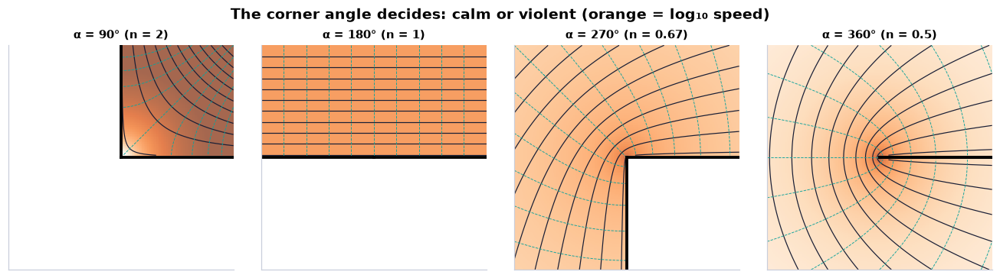

In [68]:
n = 201 if not FAST else 141                             # grid points per side
fig, axs = plt.subplots(1, 4, figsize=(12, 3.2))         # four corners
for ax, nn in zip(axs, (2.0, 1.0, 2/3, 0.5)):            # corner exponents
    el = pf.Corner(1.0, n=nn)                            # w = z^n with its cut outside the wedge
    X_, Y_ = np.meshgrid(np.linspace(-2, 2, n), np.linspace(-2, 2, n))   # grid [m]
    Z = X_ + 1j*Y_                                       # as complex numbers
    th_ = np.mod(np.angle(Z), 2*np.pi)                   # polar angle in [0, 2π)
    out = (th_ > np.pi/nn + 1e-9) | ((np.abs(Y_) < 0.03) & (X_ > 0))   # outside the wedge, or on the lower wall
    Pc = np.where(out, np.nan, el.psi(X_, Y_)); Fc = np.where(out, np.nan, el.phi(X_, Y_))   # ψ and φ in the fluid
    sp_ = np.where(out, np.nan, np.abs(el.dwdz(Z)))      # speed |dw/dz| [m/s]
    ax.pcolormesh(X_, Y_, np.log10(sp_ + 1e-9), cmap="Oranges", vmin=-0.7, vmax=0.5, shading="auto", alpha=0.7)   # dark = fast
    ax.contour(X_, Y_, Pc, levels=np.linspace(0.05, np.nanmax(Pc)*0.9, 10), colors=COLORS["ink"], linewidths=0.8)
    ax.contour(X_, Y_, Fc, levels=12, colors=COLORS["teal"], linewidths=0.6, linestyles="--")
    ax.plot([0, 2], [0, 0], "k", lw=2.5)                 # the wall θ = 0
    ax.plot([0, 2.8*np.cos(np.pi/nn)], [0, 2.8*np.sin(np.pi/nn)], "k", lw=2.5)   # the wall θ = π/n
    ax.set_xlim(-2, 2); ax.set_ylim(-2, 2); ax.set_aspect("equal"); ax.set_xticks([]); ax.set_yticks([])
    ax.set_title(f"α = {np.degrees(np.pi/nn):.0f}° (n = {nn:.2g})", fontsize=10)
fig.suptitle("The corner angle decides: calm or violent (orange = log₁₀ speed)", fontweight="bold")
savefig(fig, "ch06", "c09_corners"); plt.show()          # save, then draw

**What you see.** A right-angle corner, a flat wall, a re-entrant 270° corner and the edge of a plate, each with streamlines (solid), equipotentials (dashed teal) and the speed as a faint orange shade.

**How to read it.** Crowded streamlines near the corner mean fast flow: none in the 90° corner (a stagnation point, pale), uniform for the flat wall, and a dark orange spot at the tip of the 270° and 360° corners (the speed grows without bound).

**What would change if…** …α = 60° (n = 3): the fluid near the corner is even calmer, speed ∝ r².

> 🔁 **Tools from earlier chapters used here** (see `knowledge/primers.md`)

- **np.polyfit for a slope** — `np.polyfit(np.log(r), np.log(q), 1)[0]` is the slope of the log–log line, i.e. the power p in q ∝ rᵖ (Ch. 1 P13).

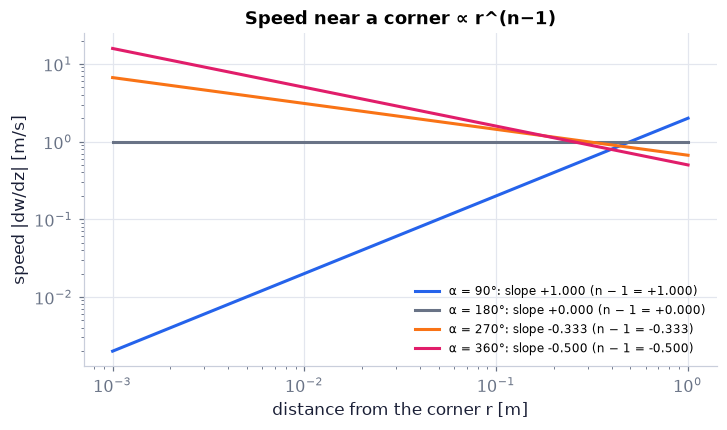

In [69]:
r = np.logspace(-3, 0, 40)                               # distance from the corner along its bisector [m]
fig, ax = plt.subplots(figsize=(6.5, 3.8))               # one panel
for nn, col in zip((2.0, 1.0, 2/3, 0.5), (COLORS["blue"], COLORS["muted"], COLORS["orange"], COLORS["rose"])):
    zb = r*np.exp(1j*np.pi/(2*nn))                       # points on the bisector θ = π/2n
    sp_ = np.abs(pf.Corner(1.0, n=nn).dwdz(zb))          # speed |dw/dz| [m/s]
    slope = np.polyfit(np.log(r), np.log(sp_), 1)[0]     # fitted power
    ax.loglog(r, sp_, color=col, lw=2, label=f"α = {np.degrees(np.pi/nn):.0f}°: slope {slope:+.3f} (n − 1 = {nn - 1:+.3f})")
ax.set_xlabel("distance from the corner r [m]"); ax.set_ylabel("speed |dw/dz| [m/s]")
ax.set_title("Speed near a corner ∝ r^(n−1)"); ax.legend(fontsize=8)
savefig(fig, "ch06", "c09_corner_speed"); plt.show()     # save, then draw

**What you see.** Four straight lines on log–log axes: rising (90°), flat (180°), falling (270° and 360°).

**How to read it.** The slopes are $n-1=(\pi-\alpha)/\alpha$ (D15): the speed vanishes at a convex corner and blows up at a re-entrant one. The 270° corner is the step of Example 6.2 (C12), where the grid solution will struggle.

**What would change if…** …a rounded corner instead of a sharp one: the lines would bend over to a finite speed below the rounding radius — real corners are never perfectly sharp.

In [70]:
def corner_traces(nn):                                   # walls and five streamlines of w = z^n
    al = np.pi/nn                                        # corner angle [rad]
    walls = (np.array([2.5, 0, 2.5*np.cos(al)]), np.array([0, 0, 2.5*np.sin(al)]))   # two rays from the origin
    t = np.linspace(1e-3, al - 1e-3, 90)                 # angles inside the wedge [rad]
    xs, ys = [], []                                      # streamlines ψ = r^n sin(nθ) = c, joined with NaN gaps
    for c in (0.1, 0.3, 0.6, 1.0, 1.5):                  # five ψ values [m²/s]
        rr = (c/np.sin(nn*t))**(1/nn)                    # r(θ) on the streamline [m]
        rr = np.where(rr < 3, rr, np.nan)                # clip far pieces
        xs += list(rr*np.cos(t)) + [np.nan]; ys += list(rr*np.sin(t)) + [np.nan]
    return {"walls": walls, "streamlines": (np.array(xs), np.array(ys))}
ns = np.linspace(0.5, 4.0, 22 if not FAST else 11)       # corner exponents n
fig = slider_figure(corner_traces, "n", ns, xlabel="x [m]", ylabel="y [m]", title="One exponent, every corner",
                    xrange=[-2.6, 2.6], yrange=[-2.6, 2.6], height=520)
recolor(fig, {"walls": COLORS["ink"], "streamlines": COLORS["accent"]})
step_titles(fig, [f"One exponent, every corner: α = π/n = {180/v:.0f}°, speed ∝ r^{v - 1:+.2f}" for v in ns])
fig.show()                                               # draw it (works on the web page too)

**What you see.** Two black walls opening from a narrow 45° wedge (n = 4) to a full plate (n = ½) as you drag n, with five streamlines filling the wedge.

**How to read it.** The streamlines hug the walls far out and turn smoothly near a convex corner; near a re-entrant corner (n < 1) they bunch round the tip, where the speed grows like r^(n−1) (the title).

**What would change if…** …n = 1: the walls become one straight wall and the streamlines straight lines — the uniform stream.

📝 **Note.** **Next: forces** `N52` — Complex variables also turn force calculations into one contour integral (§6.5, C10).

#### 🎮 Interactive: Why is the velocity u − iv?

**Why interactive rather than a static figure:** click a point and watch the two difference quotients — along x and along iy — converge to the same dw/dz, with the velocity drawn as its mirror image; drag n and the walls bend from a 45° wedge to a flat plate while the speed at the corner flips from zero to infinite.

**What to try:**
- Click near the corner with n = 2: dw/dz → 0 (stagnation).
- Preset 'n = ⅔ (270°)': the speed readout explodes as you click closer to the tip.
- Preset 'z* — not a flow': the two quotients disagree and the Cauchy–Riemann bars do not match.
- Watch the purple dw/dz arrow and the teal velocity arrow: mirror images in the horizontal.

In [71]:
show_viz("ch06", "complex_potential_corners")   # full-width explainer; ⤢ Full screen for more room

[explainer ch06/complex_potential_corners]

> ⚠️ **Common confusion:** plotting dw/dz as the velocity. It is the velocity *mirrored*: u − iv. Use `np.conj(dwdz)` (or
`(dwdz.real, -dwdz.imag)`) for arrows. A wrong sign sends every arrow the wrong way in y.

**What would change if…** …w were not analytic somewhere inside the region — a source or a vortex? Then w has a singular point there, the flow has
a source of mass or of circulation, and contour integrals round it pick up exactly that strength (C10's residues).

---

## 6.5 Forces on a Two-Dimensional Body

**What is this section about?** The pressure round any 2-D body, written with complex numbers, becomes one contour
integral of (dw/dz)² — Blasius's theorem — and that integral can be moved away from the body to a large circle, where
every body looks alike: a uniform stream, its circulation and a doublet. Only the product of the stream and the
circulation survives: no drag, and lift ρUΓ for every shape.

> 🔁 **Recap — Momentum balance on a control volume** (Ch. 4 §4.4). For a stationary control volume in steady flow, the momentum carried out through the surface equals the pressure force
on the surface plus the other forces F:
$\int_{A^*}\rho\mathbf u(\mathbf u\cdot\mathbf n)\,dA=-\int_{A^*}p\,\mathbf n\,dA+\mathbf F$ *(Eq. 6.54, from 4.17), $\frac{d}{dt}\int_{V^*}\rho\mathbf u\,dV+\int_{A^*}\rho\mathbf u(\mathbf u-\mathbf b)\cdot\mathbf n\,dA=\int_{V^*}\rho\mathbf g\,dV+\int_{A^*}\mathbf f\,dA$*.
`cv_force_on_body` applies it on a large circle round the cylinder of C07 (an exercise idea).

In [72]:
print(ch06.cv_force_on_body(pf.cylinder(10.0, 0.1, Gamma_cw=2.0), R_outer=1.0, rho=1.2))   # (D, L) = (0, 24) N/m, air

BlasiusForce(D=2.2322358387255243e-14, L=24.000000000000004)


**What does the code above do?**

The momentum-flux route on a far circle already gives L = ρUΓ; we now derive the short route.

### 🧩 Blasius's theorem and Kutta–Zhukhovsky lift for any body `C10`

*The question:* A round tube and a flat ellipse with the same circulation feel exactly the same lift. Why does the shape not matter?

*In one line:* $D-iL=\frac{i\rho}{2}\oint_C\Big(\frac{dw}{dz}\Big)^2dz$ *(6.60)* · $D-iL=\frac{i\rho}{2}2\pi i\Big(\frac{iU\Gamma}{\pi}\Big)=-i\rho U\Gamma,\ D=0,\ L=\rho U\Gamma$ *(6.62)*

#### The problem in plain words

C07 found L = ρUΓ for a circle by integrating its surface pressure. Is that a coincidence of the circle? Aircraft wings,
turbine blades and sails are not circles, and integrating their surface pressure by hand is hopeless. We want a proof
that works for *any* cross-section — and it comes from moving the integral off the body.

#### The idea

```
pressure on the body --complex form--> (i rho/2) closed-integral of (dw/dz)^2 dz on the body   (Blasius, (6.60))
      analytic between body and a big circle --> the same integral on the big circle (Cauchy)
far away every body = U + i G/(2 pi z) - d/(2 pi z^2) + ...  --square-->  only U * (i G/pi z) has a 1/z --> L = rho U G, D = 0
```

*The numbered equations in the sketch:* $D-iL=\frac{i\rho}{2}\oint_C\Big(\frac{dw}{dz}\Big)^2dz$ *(6.60)*

(G stands for Γ.)

> 📎 **Primer — Cauchy's integral theorem.** `P156` · If f(z) is analytic everywhere inside and on a closed curve C, then ∮_C f dz = 0. Consequence: for two curves round the
same singular region, ∮ over one equals ∮ over the other when f is analytic in the ring between them — a contour can be
squeezed or stretched freely, as long as it does not cross a singularity. On a circle z = Re^{iθ}, dz = iz dθ.

In [73]:
f_ = lambda z: (1 + 0.3j/z - 0.2/z**2)**2                # analytic except at z = 0
for R in (0.5, 1.0, 4.0):                                # three different circles round 0
    th = np.linspace(0, 2*np.pi, 256, endpoint=False)    # angles [rad]
    z = R*np.exp(1j*th)                                  # points on the circle
    print(R, np.sum(f_(z)*1j*z)*(2*np.pi/256))           # ∮ f dz with dz = iz dθ: the same number each time

0.5 (-3.769911184307752-4.35983562251079e-17j)
1.0 (-3.769911184307752-2.615901373506474e-16j)
4.0 (-3.769911184307752-1.3951473992034527e-15j)


The printed number is $2\pi i\times$ (the coefficient of 1/z) $=2\pi i\times0.6i=-1.2\pi\approx-3.770$ on all three
circles — the residue idea of primer P157 below.

📝 **Note.** **The setting** `N53` — A body of span B at rest in a steady stream; D (along x) and L (along y) are the forces per unit depth **on the body**;
the body pushes the fluid with F = −B(De_x + Le_y) (Newton's third law). ⚠️ B here is a length, not Ch. 4's Bernoulli
function; "Section 3" in the book means §6.3.

> 🔁 **Tools from earlier chapters used here** (see `knowledge/primers.md`) — **orientation and the outward normal:** walking a closed curve counterclockwise, the body is on your left; the
tangent (dx, dy)/ds turned clockwise by 90°, (dy, −dx)/ds, points out of the body (check at the rightmost point, where
dy > 0 and the normal is +x); parametric curves are Ch. 3 P92

- **momentum flux through a surface** — $\rho\mathbf u(\mathbf u\cdot\mathbf n)\,dA$ is the momentum carried through dA per second (Ch. 4 P114).

#### 🧮 Derivation — The force on a body from its surface pressure `D16` (Eq. 6.56: $D=-\oint_Cp\,dy,\ L=\oint_Cp\,dx$)

**What we want to show.** Write the drag and lift per unit depth on a stationary 2-D body as contour integrals of the pressure round its cross-section — the starting point of Blasius's theorem.

**Assumptions.** Steady flow; stationary body (step 2); span B large, forces per unit depth (step 4).

**The plan.**

1. Put A* on the body.
2. The flux term vanishes.
3. Newton's third law gives the force on the body.
4. Parametrise the contour and its outward normal.
5. Split into components.

**Tools we use** (each explained before this point): CV momentum (R18) · momentum flux (ch04 P114, reminder) · outward normal of a counterclockwise contour (gloss in C10) · net pressure force −∮p n dA (ch01 P28, reminder).

**We start from**

$$ \int_{A^*}\rho\mathbf u(\mathbf u\cdot\mathbf n)dA=-\int_{A^*}p\mathbf n\,dA+\mathbf F\ \text{(6.54)} $$

*In words:* steady momentum balance for a stationary control surface A* (R18).

---

**Step 1 of 8 — Let A* hug the body.**

$$ \mathbf u\cdot\mathbf n=0\ \text{on the body} $$

- *Why we can do this:* A stationary body is a streamline (D05), so no fluid crosses a control surface lying on it.
- *In words:* Nothing flows through the body's skin.

---

**Step 2 of 8 — Drop the momentum-flux term.**

$$ \int_{A^*}\rho\mathbf u(\mathbf u\cdot\mathbf n)dA=0 $$

- *Why we can do this:* The integrand contains u·n = 0; with no flux, only pressure transmits force between fluid and body.
- *In words:* Across the body's skin the fluid pushes only by pressure.

---

**Step 3 of 8 — Write the force on the body.**

$$ B(D\mathbf e_x+L\mathbf e_y)=-\int_{A^*}p\,\mathbf n\,dA $$

- *Why we can do this:* Pressure pushes on the body along −n, n the body's outward normal (P28); by Newton's third law this is minus the force the body applies to the fluid, F = −B(De_x + Le_y).
- *In words:* Drag and lift are the sum of the pressure pushes on the skin.

---

**Step 4 of 8 — Divide by the span B.**

$$ D\mathbf e_x+L\mathbf e_y=-\frac1B\int_{A^*}p\,\mathbf n\,dA,\qquad dA=B\,ds $$

- *Why we can do this:* The body does not vary along its span, so each strip of length B contributes equally; this is (6.55), $D\mathbf e_x+L\mathbf e_y=-\frac1B\int_{A^*}p\,\mathbf n\,dA$.
- *In words:* Forces per metre of span come from a line integral round the cross-section.

---

**Step 5 of 8 — Walk the contour counterclockwise.**

$$ d\mathbf s=\mathbf e_xdx+\mathbf e_ydy,\qquad\mathbf n=\frac{\mathbf e_xdy-\mathbf e_ydx}{ds} $$

- *Why we can do this:* The tangent (dx, dy)/ds turned clockwise by 90° is (dy, −dx)/ds, which points out of the body when the body is on the left (at its rightmost point dy > 0, so n = +e_x ✓).
- *In words:* The outward normal from the contour's steps.

---

**Step 6 of 8 — Substitute n and dA.**

$$ D\mathbf e_x+L\mathbf e_y=-\oint_Cp\,(\mathbf e_xdy-\mathbf e_ydx) $$

- *Why we can do this:* B ds × (e_x dy − e_y dx)/ds / B: the B's and ds's cancel.
- *In words:* Only the steps dx and dy along the contour remain.

---

**Step 7 of 8 — Split into components.**

$$ D=-\oint_Cp\,dy,\qquad L=\oint_Cp\,dx $$

- *Why we can do this:* Match the e_x and e_y parts; the minus of −e_y dx turns positive. This is (6.56), $D=-\oint_Cp\,dy,\ L=\oint_Cp\,dx$ — the line above.
- *In words:* Drag collects pressure against vertical steps, lift against horizontal ones.

---

**Step 8 of 8 — Check on a circle.**

$$ x=a\cos\theta\ \Rightarrow\ dx=-a\sin\theta\,d\theta,\quad L=-\int_0^{2\pi}p\sin\theta\,a\,d\theta $$

- *Why we can do this:* The counterclockwise circle; the lift formula becomes D11 step 4 exactly — a consistency check.
- *In words:* The general formula contains the cylinder calculation.

---

**Result**

$$ D\mathbf e_x+L\mathbf e_y=-\frac1B\int_{A^*}p\mathbf n\,dA\ \text{(6.55),}\ D=-\oint_Cp\,dy\ \text{,}\ L=\oint_Cp\,dx $$

*In words:* on a counterclockwise contour round the body, drag and lift per unit depth are the pressure integrated against dy and dx.

**What it means.** (6.56), $D=-\oint_Cp\,dy,\ L=\oint_Cp\,dx$ needs the pressure on the body; the next step (D17) rewrites it so the body surface is no longer needed.

**Check it.** Uniform pressure: ∮dy = ∮dx = 0 on a closed curve ⇒ no force ✓. A clockwise contour flips both signs (the code rejects it). Cylinder: 24 N/m by (6.56), $D=-\oint_Cp\,dy,\ L=\oint_Cp\,dx$ (`contour_force` in the code cell after the tiny example of C10) ✓.

> ⚠️ **Common confusion (traps in `D16`):** n is outward only for counterclockwise traversal. F in (6.54), $\int_{A^*}\rho\mathbf u(\mathbf u\cdot\mathbf n)\,dA=-\int_{A^*}p\,\mathbf n\,dA+\mathbf F$ is the force on the fluid; D and L are on the body. The flux term vanishes only because u·n = 0 on a stationary body.

📝 **Note.** **The force components (note `N55`)** `N54` — On the body u·n = 0 kills the momentum flux, leaving the pressure force $D\mathbf e_x+L\mathbf e_y=-\frac1B\int_{A^*}p\,\mathbf n\,dA$
*(6.55)*, and with $\mathbf n=(\mathbf e_xdy-\mathbf e_ydx)/ds$ on a counterclockwise contour:

$$ D=-\oint_Cp\,dy,\ L=\oint_Cp\,dx \qquad \text{(6.56)} $$

#### 🧮 Derivation — Blasius's theorem: $D-iL=\frac{i\rho}{2}\oint_C(dw/dz)^2dz$ `D17` (Eq. 6.60: $D-iL=\frac{i\rho}{2}\oint_C\Big(\frac{dw}{dz}\Big)^2dz$)

**What we want to show.** Turn the pressure integrals (6.56), $D=-\oint_Cp\,dy,\ L=\oint_Cp\,dx$ into one complex contour integral of (dw/dz)², and show the contour can then be moved off the body.

**Assumptions.** Steady plane ideal flow; the body is a streamline (step 7); (dw/dz)² analytic between the body and the new contour (step 11).

**The plan.**

1. Combine D and L into one complex number and use dz* = dx − i dy.
2. Insert Bernoulli with |q|² = qq*.
3. Drop the constant.
4. Use that the velocity is tangent to the body.
5. Use Cauchy's theorem to move the contour.

**Tools we use** (each explained before this point): complex conjugate (ch02 P81, reminder) · Bernoulli (R05) · complex velocity (6.45), $dw/dz=u-iv$ (C09) · Cauchy's integral theorem (primer, in C10) · the complex plane in numpy (primer, in C09).

**We start from**

$$ D=-\oint_Cp\,dy,\quad L=\oint_Cp\,dx\ \text{(6.56)} $$

*In words:* drag and lift from the surface pressure.

---

**Step 1 of 12 — Combine into D − iL.**

$$ D-iL=-\oint_Cp\,dy-i\oint_Cp\,dx $$

- *Why we can do this:* One complex number carries both components; the minus on L is chosen so the result is compact.
- *In words:* Drag in the real part, minus lift in the imaginary part.

---

**Step 2 of 12 — Factor out −i.**

$$ D-iL=-i\oint_Cp\,(dx-i\,dy) $$

- *Why we can do this:* −i(dx − i dy) = −i dx + i² dy = −i dx − dy, which reproduces step 1 term by term.
- *In words:* The two integrals become one.

---

**Step 3 of 12 — Recognise dz*.**

$$ D-iL=-i\oint_Cp\,dz^* $$

- *Why we can do this:* dz = dx + i dy, so its conjugate is dx − i dy. This is (6.57), $D-iL=-i\oint_Cp\,dz^*$ — the line above.
- *In words:* The force is the pressure integrated against the conjugate step.

---

**Step 4 of 12 — Insert Bernoulli with the far-field constant.**

$$ p=p_\infty+\tfrac12\rho U^2-\tfrac12\rho(u^2+v^2) $$

- *Why we can do this:* (6.18), $p+\tfrac12\rho\lvert\nabla\phi\rvert^2=p+\tfrac12\rho\lvert\nabla\psi\rvert^2=\text{const}$ with the constant evaluated far upstream (R05).
- *In words:* Pressure is high where the fluid is slow.

---

**Step 5 of 12 — Write the speed squared as a product.**

$$ u^2+v^2=(u-iv)(u+iv) $$

- *Why we can do this:* |q|² = q q* for any complex q = u − iv (P81); this lets dw/dz appear.
- *In words:* Speed squared is the complex velocity times its conjugate.

---

**Step 6 of 12 — Integrate the constant to zero.**

$$ \oint_C\big(p_\infty+\tfrac12\rho U^2\big)dz^*=\big(p_\infty+\tfrac12\rho U^2\big)\Big(\oint_Cdz\Big)^*=0 $$

- *Why we can do this:* The integral of dz round a closed curve is the end point minus the start, zero; the constant comes out. The book says this without the reason.
- *In words:* A uniform pressure gives no force.

---

**Step 7 of 12 — Keep the velocity term, fix the sign.**

$$ D-iL=-i\oint_C\Big(-\tfrac12\rho\Big)(u-iv)(u+iv)\,dz^*=\frac{i\rho}{2}\oint_C(u-iv)(u+iv)\,dz^* $$

- *Why we can do this:* Steps 3–6 combined (this is (6.58), $D-iL=-i\oint_C\big[p_\infty+\tfrac12\rho U^2-\tfrac12\rho(u-iv)(u+iv)\big]dz^*$ with the constant removed); −i × (−½ρ) = +iρ/2.
- *In words:* Only the velocity term is left.

---

**Step 8 of 12 — Use that the velocity is tangent.**

$$ u+iv=\pm\lvert q\rvert e^{i\vartheta},\quad dz=\lvert dz\rvert e^{i\vartheta} $$

- *Why we can do this:* On the body the velocity is tangent to the surface (D05), so it points along dz or exactly against it: the same direction angle ϑ up to a sign ± (against dz where the flow runs clockwise round the body, e.g. the top of a cylinder in a stream from the left).
- *In words:* On the body, flow and surface point along the same line — forwards or backwards.

---

**Step 9 of 12 — Swap the conjugate.**

$$ (u+iv)\,dz^*=\pm\lvert q\rvert\lvert dz\rvert=(u-iv)\,dz $$

- *Why we can do this:* The phases e^{iϑ} and e^{−iϑ} cancel either way round, and the same sign ± appears on both sides, so it cancels too; this is (6.59), $(u+iv)\,dz^*=(u-iv)\,dz=(dw/dz)\,dz$.
- *In words:* On the body the conjugate can move from the step to the velocity.

---

**Step 10 of 12 — Use dw/dz = u − iv.**

$$ D-iL=\frac{i\rho}{2}\oint_C\Big(\frac{dw}{dz}\Big)^2dz $$

- *Why we can do this:* Substitute step 9 into step 7 and (6.45), $dw/dz=u-iv$. This is (6.60), $D-iL=\frac{i\rho}{2}\oint_C\Big(\frac{dw}{dz}\Big)^2dz$ — the line above, Blasius's theorem.
- *In words:* The force is a contour integral of the complex velocity squared.

---

**Step 11 of 12 — Apply Cauchy between two contours.**

$$ \oint_C\Big(\frac{dw}{dz}\Big)^2dz-\oint_{C'}\Big(\frac{dw}{dz}\Big)^2dz=0 $$

- *Why we can do this:* (dw/dz)² is analytic in the fluid between the body C and a larger curve C′ (no singularity there); Cauchy's theorem (primer) makes the integral round the ring zero.
- *In words:* The same number on any curve round the body.

---

**Step 12 of 12 — Note what was needed.**

$$ D-iL=\frac{i\rho}{2}\oint_{C'}\Big(\frac{dw}{dz}\Big)^2dz\quad\text{for any }C'\text{ enclosing the body} $$

- *Why we can do this:* Step 9 held only on the body, but the final integrand is analytic, so step 11 carries it anywhere outside — provided C′ encloses every singularity of (dw/dz)² and crosses none. What counts is the singularities, not the outline: the cylinder's all sit at its centre, so even a circle that cuts the body gives ρUΓ; for the Zhukhovsky ellipse such a circle crosses the map's branch cut and gives a wrong number (R = 0.07 m: 8.13 N/m instead of 24).
- *In words:* We may compute the force far away.

---

**Result**

$$ D-iL=\frac{i\rho}{2}\oint_C\Big(\frac{dw}{dz}\Big)^2dz\ \text{(6.60), on any contour enclosing the body} $$

*In words:* the force on a 2-D body is a single contour integral of the squared complex velocity, and the contour may be moved freely through the fluid.

**What it means.** The body's shape enters only through dw/dz; on a large circle every body looks alike, which D18 exploits. Blasius's theorem is the complex-variable form of a momentum balance (Exercise 6.27's control-volume proof gives the same number, `cv_force_on_body`).

**Check it.** Units: ρ (dw/dz)² dz [kg/m³ × m²/s² × m] = N/m ✓. Cylinder with Γ_cw = 2, U = 10, ρ = 1.2: (0, 24) N/m on R = a, 2a, 10a (the code cell after the tiny example of C10) ✓; the trapezoid on a circle is exact for the cylinder with 4 or more points (its (dw/dz)² ends at z⁻⁴) and converges exponentially for bodies with an infinite Laurent series, such as the ellipse.

In [74]:
import sympy as sp                                       # symbolic algebra
th = sp.symbols("theta", real=True)                      # angle round the contour (real)
U, a, G, rho = sp.symbols("U a Gamma rho", positive=True)   # stream, radius, clockwise Γ, density (positive)
z = a*sp.exp(sp.I*th)                                    # a point on the body r = a
dwdz = U*(1 - a**2/z**2) + sp.I*G/(2*sp.pi*z)            # (6.52) differentiated: the cylinder with clockwise Γ
u_minus_iv = dwdz                                        # the complex velocity u − iv (6.45)
u_plus_iv = sp.conjugate(dwdz)                           # its conjugate u + iv
dz = sp.diff(z, th)                                      # the step along the circle (times dθ)
print("step 9 on the body:", sp.simplify(sp.expand_complex(u_plus_iv*sp.conjugate(dz) - u_minus_iv*dz)))   # → 0: (6.59)
print("step 6, ∮dz*:", sp.integrate(sp.conjugate(dz), (th, 0, 2*sp.pi)))   # → 0: a uniform pressure gives no force
I_body = sp.integrate(sp.expand(dwdz**2*dz), (th, 0, 2*sp.pi))   # Blasius's integral ∮(dw/dz)² dz on the body
F = sp.simplify(sp.I*rho/2*I_body)                       # D − iL from (6.60)
print("D − iL on r = a :", F)                            # → −I*Gamma*U*rho: D = 0, L = ρUΓ
z2 = 2*a*sp.exp(sp.I*th)                                 # a bigger contour, r = 2a (step 11)
dwdz2 = U*(1 - a**2/z2**2) + sp.I*G/(2*sp.pi*z2)         # the same dw/dz evaluated there
I_big = sp.integrate(sp.expand(dwdz2**2*sp.diff(z2, th)), (th, 0, 2*sp.pi))   # the integral on r = 2a
print("D − iL on r = 2a:", sp.simplify(sp.I*rho/2*I_big))   # the same value: the contour may move (Cauchy)

step 9 on the body: 0
step 6, ∮dz*: 0


D − iL on r = a : -I*Gamma*U*rho


D − iL on r = 2a: -I*Gamma*U*rho


> ⚠️ **Common confusion (traps in `D17`):** −i(dx − i dy) = −i dx − dy (a sign slip here flips D). −i × (−½ρ) = +iρ/2. Step 9 holds only on the body; the contour may leave the body only because the final integrand is analytic.

📝 **Note.** **From pressure to Blasius (notes `N57`–`N60`)** `N56` — The complex force $D-iL=-i\oint_Cp\,dz^*$ *(6.57)*; Bernoulli in complex form
$p_\infty+\tfrac12\rho U^2=p+\tfrac12\rho(u-iv)(u+iv)$ gives
$D-iL=-i\oint_C\big[p_\infty+\tfrac12\rho U^2-\tfrac12\rho(u-iv)(u+iv)\big]dz^*$ *(6.58)*; on the body the velocity is
tangent, $(u+iv)\,dz^*=(u-iv)\,dz=(dw/dz)\,dz$ *(6.59)*; so we get Blasius's theorem below. The contour may be any curve
round the body with no singularity of (dw/dz)² in between. The cell checks (6.59) pointwise on the body.

$$ D-iL=\frac{i\rho}{2}\oint_C\Big(\frac{dw}{dz}\Big)^2dz \qquad \text{(6.60)} $$

In [75]:
thb = np.linspace(0, 2*np.pi, 16, endpoint=False)        # 16 angles on the body [rad]
zb = 0.1*np.exp(1j*thb)                                  # body points of the cylinder a = 0.1 m
fc = pf.cylinder(10.0, 0.1, Gamma_cw=2.0)                # C07's spinning cylinder
u, v = fc.velocity(zb.real, zb.imag)                     # the velocity on the body [m/s]
dz = 1j*zb                                               # the direction of dz along the circle
print(np.max(np.abs((u + 1j*v)*np.conj(dz) - (u - 1j*v)*dz)))   # ≈ 0: (6.59) holds point by point on the body

4.264452434854769e-16


> 🔁 **Tools from earlier chapters used here** (see `knowledge/primers.md`)

- **FFT of samples on a circle** — the FFT turns N equally spaced samples into the coefficients of e^{ikθ} (Ch. 5 P142); on a circle z = Re^{iθ} these are the c_k R^k of a power series.

> 📎 **Primer — Laurent series and residues.** `P157` · Outside a disc that contains all the singular points, an analytic function is a sum of powers of z including negative
ones: $f(z)=\sum_k c_kz^k$ (a Laurent series). Integrating term by term round a circle, every power gives zero
**except** $z^{-1}$, which gives 2πi — so ∮f dz = 2πi c₋₁, and c₋₁ is called the **residue**. Sampling f on a circle
and taking an FFT reads off all the c_k at once.

In [76]:
R, n = 2.0, 64                                           # a circle and the number of samples
z = R*np.exp(2j*np.pi*np.arange(n)/n)                    # n points on it
f_ = 3 + 0.5/z - 2/z**2                                  # c0 = 3, c−1 = 0.5, c−2 = −2
ck = np.fft.fft(f_)/n                                    # FFT coefficient of e^{ikθ} …
print(ck[0], ck[-1]*R, ck[-2]*R**2)                      # … rescaled by R^k: 3, 0.5, −2

(3-3.2592500175730775e-18j) (0.5+1.0816979114612065e-16j) (-2-6.427751644348262e-16j)


📝 **Note.** **The residue theorem on a circle** `N63` — With z = Re^{iθ}, dz = iRe^{iθ}dθ (no book number). Only n = 1 survives: the integral round any closed curve is 2πi times
the sum of the residues inside.

$$ \oint z^{-n}dz=iR^{1-n}\int_0^{2\pi}e^{i(1-n)\theta}d\theta=2\pi i\,\delta_{n1}  $$

In [77]:
th = np.linspace(0, 2*np.pi, 64, endpoint=False)         # 64 angles [rad]
z = 1.5*np.exp(1j*th)                                    # a circle of radius 1.5
for n in (0, 1, 2, 3):                                   # powers z^(−n)
    print(n, np.round(np.sum(z**(-n)*1j*z)*(2*np.pi/64), 12))   # ∮ z^(−n) dz: 0, 2πi, 0, 0

0 -0j
1 6.28318530718j
2 -0j
3 (-0+0j)


📝 **Note.** **Every body from far away** `N61` — Outside a circle round the body, $w=Uz+\frac{m}{2\pi}\ln z+\frac{i\Gamma}{2\pi}\ln z+\frac{d}{2\pi z}+\dots$ (stream, net
source, clockwise vortex, doublet); a closed body has m = 0. The cell reads the coefficients of dw/dz for C07's
cylinder by FFT.

In [78]:
c = pf.laurent_coefficients(pf.cylinder(10.0, 0.1, Gamma_cw=2.0).dwdz, R=0.3)   # c_k of dw/dz on |z| = 0.3 m
print(np.round(c[0], 10), np.round(c[-1], 10), 1j*2.0/(2*np.pi), np.round(c[-2], 10))   # U, iΓ/2π (twice), −Ua²

(10-0j) (-0+0.3183098862j) 0.3183098861837907j (-0.1-0j)


**What does the code above do?**

$c_0=U=10$ m/s (the stream), $c_{-1}=i\Gamma/2\pi=0.3183i$ m²/s (the clockwise vortex — matched by the third number),
$c_{-2}=-Ua^2=-0.1$ m³/s $=-d/2\pi$ with $d=2\pi Ua^2$ — the cylinder's doublet.

> 📎 **Primer — sympy for complex series and residues.** `P158` · sympy handles the algebra of D18: `sp.I` is i, `sp.expand` multiplies out a squared series, `.coeff(z, -1)` reads a
coefficient, and `sp.residue(f, z, 0)` returns the coefficient of 1/z directly.

In [79]:
z, U, G, d = sp.symbols("z U Gamma d")                   # symbols
f_ = sp.expand((U + sp.I*G/(2*sp.pi*z) - d/(2*sp.pi*z**2))**2)   # the squared far field
print(f_.coeff(z, -1), "|", f_.coeff(z, -2))             # I*Gamma*U/pi | −Gamma²/(4π²) − U d/π
print(sp.residue(f_, z, 0))                              # I*Gamma*U/pi

I*Gamma*U/pi | -Gamma**2/(4*pi**2) - U*d/pi
I*Gamma*U/pi


#### 🧮 Derivation — Kutta–Zhukhovsky for any body: D = 0, L = ρUΓ `D18` (Eq. 6.62: $D-iL=\frac{i\rho}{2}2\pi i\Big(\frac{iU\Gamma}{\pi}\Big)=-i\rho U\Gamma,\ D=0,\ L=\rho U\Gamma$)

**What we want to show.** Evaluate Blasius's integral for an arbitrary 2-D body with circulation, using only what the flow looks like far away.

**Assumptions.** Closed body (step 4); all singularities inside the body; clockwise Γ (book sign).

**The plan.**

1. Write dw/dz outside the body as a Laurent series.
2. Identify its first coefficients physically.
3. Square it.
4. Integrate term by term with the residue rule.

**Tools we use** (each explained before this point): Laurent series and residues (primer, in C10) · residue theorem on a circle (N63) · sympy for complex series and residues (primer, in C10) · the element potentials (6.47), $w=-\frac{i\Gamma}{2\pi}\ln(z-z')$–(6.49), $w=\frac{d}{2\pi(z-z')}$ (N45–N47).

**We start from**

$$ D-iL=\frac{i\rho}{2}\oint_C\Big(\frac{dw}{dz}\Big)^2dz\ \text{(6.60) on a large circle} $$

*In words:* D17's result with the contour moved far out.

---

**Step 1 of 11 — Expand dw/dz outside the body.**

$$ \frac{dw}{dz}=c_0+\frac{c_{-1}}{z}+\frac{c_{-2}}{z^2}+\dots $$

- *Why we can do this:* dw/dz is analytic outside a circle containing the body, so it has a Laurent series there (primer); no positive powers, because the velocity stays finite far away. The book asserts this form.
- *In words:* Far away, the velocity is a sum of decaying powers.

---

**Step 2 of 11 — Match the uniform stream.**

$$ c_0=U $$

- *Why we can do this:* As |z| → ∞, dw/dz → u − iv = U (a stream along x).
- *In words:* The leading term is the free stream.

---

**Step 3 of 11 — Integrate to w and name the terms.**

$$ w=Uz+\frac{m}{2\pi}\ln z+\frac{i\Gamma}{2\pi}\ln z+\frac{d}{2\pi z}+\dots,\quad c_{-1}=\frac{m+i\Gamma}{2\pi},\ c_{-2}=-\frac{d}{2\pi} $$

- *Why we can do this:* The antiderivative of c₋₁/z is c₋₁ ln z; its real part is a source (6.48), $w=\frac m{2\pi}\ln(z-z')$, its imaginary part a clockwise vortex ((6.47), $w=-\frac{i\Gamma}{2\pi}\ln(z-z')$ with −Γ); c₋₂/z² integrates to a doublet (6.49), $w=\frac{d}{2\pi(z-z')}$.
- *In words:* From far away any body is a stream, a source, a vortex and a doublet.

---

**Step 4 of 11 — Close the body: m = 0.**

$$ c_{-1}=\frac{i\Gamma}{2\pi} $$

- *Why we can do this:* A closed body emits no net fluid: the flux of u out of a large circle is m, and it must vanish.
- *In words:* Only the circulation survives in the 1/z term.

---

**Step 5 of 11 — Write the far-field velocity.**

$$ \frac{dw}{dz}=U+\frac{i\Gamma}{2\pi z}-\frac{d}{2\pi z^2}+\dots $$

- *Why we can do this:* Substitute steps 2–4 into the series of step 1; the doublet term −d/2πz² is c₋₂/z².
- *In words:* Stream + circulation + doublet, in powers of 1/z.

---

**Step 6 of 11 — Square the series.**

$$ \Big(\frac{dw}{dz}\Big)^2=U^2+\frac{iU\Gamma}{\pi}\frac1z-\Big(\frac{Ud}{\pi}+\frac{\Gamma^2}{4\pi^2}\Big)\frac1{z^2}+\dots $$

- *Why we can do this:* Multiply out: 2 × U × iΓ/2πz, and (iΓ/2πz)² + 2U(−d/2πz²). ⚠️ The book prints the 1/z² coefficient as (Ud/π − Γ²/4π²) inside an extra square; this is the correct one (the sympy cell prints both).
- *In words:* The square has a 1/z term made of U times Γ.

---

**Step 7 of 11 — Integrate powers round a circle.**

$$ \oint z^{-n}dz=iR^{1-n}\int_0^{2\pi}e^{i(1-n)\theta}d\theta=2\pi i\,\delta_{n1} $$

- *Why we can do this:* z = Re^{iθ}, dz = iz dθ (N63); the exponential integrates to zero unless its exponent is zero.
- *In words:* Only the 1/z term gives anything.

---

**Step 8 of 11 — Keep the residue.**

$$ \oint_C\Big(\frac{dw}{dz}\Big)^2dz=2\pi i\cdot\frac{iU\Gamma}{\pi} $$

- *Why we can do this:* By step 7 the constant, 1/z², … terms vanish; the coefficient of 1/z is the residue.
- *In words:* The integral is 2πi times the residue.

---

**Step 9 of 11 — Multiply out.**

$$ 2\pi i\cdot\frac{iU\Gamma}{\pi}=-2U\Gamma $$

- *Why we can do this:* i × i = −1 and the π cancels.
- *In words:* A real number: −2UΓ.

---

**Step 10 of 11 — Insert into Blasius.**

$$ D-iL=\frac{i\rho}{2}(-2U\Gamma)=-i\rho U\Gamma $$

- *Why we can do this:* (6.60), $D-iL=\frac{i\rho}{2}\oint_C\Big(\frac{dw}{dz}\Big)^2dz$ with step 9. This is the first form of (6.62), $D-iL=\frac{i\rho}{2}2\pi i\Big(\frac{iU\Gamma}{\pi}\Big)=-i\rho U\Gamma,\ D=0,\ L=\rho U\Gamma$.
- *In words:* The force is purely imaginary.

---

**Step 11 of 11 — Read off drag and lift.**

$$ D=0,\qquad L=\rho U\Gamma $$

- *Why we can do this:* The real part is D, the imaginary part is −L; compare both sides. This is (6.62), $D-iL=\frac{i\rho}{2}2\pi i\Big(\frac{iU\Gamma}{\pi}\Big)=-i\rho U\Gamma,\ D=0,\ L=\rho U\Gamma$ — the line above.
- *In words:* No drag, and lift ρUΓ, for any shape.

---

**Result**

$$ D-iL=\frac{i\rho}{2}2\pi i\Big(\frac{iU\Gamma}{\pi}\Big)=-i\rho U\Gamma\ \text{, so}\ D=0\ \text{and}\ L=\rho U\Gamma $$

*In words:* the Kutta–Zhukhovsky theorem: every 2-D body with circulation Γ in a stream U feels lift ρUΓ and no drag.

**What it means.** Lift depends only on U and Γ; the shape decides which Γ nature chooses (Ch. 14's Kutta condition). The 2-D d'Alembert paradox holds for every body.

**Check it.** Units ✓. The body's doublet d dropped out — the shape does not matter. Numbers: Γ = 2, U = 10, ρ = 1.2 → 24 N/m for the cylinder and the Zhukhovsky ellipse (the same cell) ✓. Open body (m ≠ 0): the 1/z coefficient becomes U(m + iΓ)/π and D = −ρUm (a thrust) — the held-source force.

In [80]:
import sympy as sp                                       # symbolic algebra
z = sp.symbols("z")                                      # the complex position
U, G, d, rho = sp.symbols("U Gamma d rho", real=True)    # stream, clockwise Γ, doublet strength, density (real)
f = U + sp.I*G/(2*sp.pi*z) - d/(2*sp.pi*z**2)            # step 5: the far-field dw/dz
sq = sp.expand(f**2)                                     # step 6: its square
print("1/z coefficient:", sq.coeff(z, -1))               # → I*Gamma*U/pi
true_c2 = sq.coeff(z, -2)                                # the true 1/z² coefficient
printed_c2 = U*d/sp.pi - G**2/(4*sp.pi**2)               # the coefficient the book prints
print(sp.simplify(true_c2 - (-(U*d/sp.pi + G**2/(4*sp.pi**2)))),   # → 0: the correct form −(Ud/π + Γ²/4π²)
      "|", sp.simplify(true_c2 - printed_c2))            # → −2Ud/π ≠ 0: the printed coefficient is wrong
res = sp.residue(sq, z, 0)                               # step 8: the residue
F = sp.I*rho/2*2*sp.pi*sp.I*res                          # steps 9–10: D − iL = (iρ/2) 2πi × residue
print("D =", sp.simplify(sp.re(F)), "| L =", sp.simplify(-sp.im(F)))   # → 0 and Gamma*U*rho
print(ch06.kutta_zhukhovsky_sym()["L"])                  # the library's sympy route: the same Gamma*U*rho

1/z coefficient: I*Gamma*U/pi
0 | -2*U*d/pi
D = 0 | L = Gamma*U*rho
Gamma*U*rho


> ⚠️ **Common confusion (traps in `D18`):** The ln z term's real coefficient is a source, the imaginary one a vortex; m = 0 only for a closed body. The book's 1/z² coefficient and outer square are misprints — only 1/z matters. The clockwise Γ sign gives L = +ρUΓ.

📝 **Note.** **Blasius with the far field** `N62` — ⚠️ The book prints the squared series with the 1/z² coefficient $(Ud/\pi-\Gamma^2/4\pi^2)$ and an extra outer square;
expanding gives $-(Ud/\pi+\Gamma^2/4\pi^2)$ (D18 step 6 and its sympy cell). Nothing depends on it: only the 1/z term,
$iU\Gamma/\pi$, has a residue.

$$ D-iL=\frac{i\rho}{2}\oint_C\Big(U+\frac{i\Gamma}{2\pi z}-\frac{d}{2\pi z^2}+\dots\Big)^2dz \qquad \text{(6.61)} $$

#### ✏️ Tiny example: the same spinning cylinder, by residues

U = 10 m/s, Γ = 2 m²/s (clockwise), ρ = 1.2 kg/m³.

1. Residue of (dw/dz)² at 0: $iU\Gamma/\pi=i\times20/\pi=6.366i$ m³/s².
2. $\oint(dw/dz)^2dz=2\pi i\times6.366i=-40$ m⁴/s² (= −2UΓ).
3. $D-iL=\frac{i\rho}{2}\times(-40)=-24i$ N/m.
4. D = 0, L = 24 N/m — the same as C07's pressure integral.

In [81]:
fc = pf.cylinder(10.0, 0.1, Gamma_cw=2.0)                # C07's spinning cylinder (a = 0.1 m)
for R in (0.1, 0.2, 1.0):                                # three contour radii [m]
    print("cylinder, R =", R, pf.blasius_force(fc.dwdz, R=R, rho=1.2))   # (D, L) = (0, 24) N/m on every circle
e = ch06.elliptic_cylinder_flow(10.0, 0.12, 0.1, Gamma_cw=2.0)   # a Zhukhovsky ellipse (C11), same U and Γ
for R in (0.5, 1.0):                                     # circles that enclose the ellipse (semi-major axis 0.2033 m)
    print("ellipse,  R =", R, pf.blasius_force(e.dwdz, R=R, rho=1.2))   # the same lift: the shape does not matter
kz = ch06.kutta_zhukhovsky_sym()                         # the sympy route of D18
print(kz["residue"], "|", kz["coeff_z2"], "vs printed", kz["coeff_z2_printed"], "|", kz["L"])
print(ch06.contour_force(lambda zz: fc.pressure(zz.real, zz.imag, rho=1.2, U=10.0),
                         0.1*np.exp(1j*np.linspace(0, 2*np.pi, 128, endpoint=False))))   # (6.56) on the body: (0, 24)

cylinder, R = 0.1 BlasiusForce(D=-2.1316282072803005e-15, L=24.0)
cylinder, R = 0.2 BlasiusForce(D=1.0658141036401502e-15, L=24.00000000000001)
cylinder, R = 1.0 BlasiusForce(D=1.7053025658242404e-14, L=23.999999999999982)
ellipse,  R = 0.5 BlasiusForce(D=4.263256414560601e-15, L=24.000000000000018)
ellipse,  R = 1.0 BlasiusForce(D=2.5579538487363604e-14, L=24.0)
I*Gamma*U/pi | (-Gamma**2/4 - pi*U*d)/pi**2 vs printed -Gamma**2/(4*pi**2) + U*d/pi | Gamma*U*rho
BlasiusForce(D=1.0269562977782698e-15, L=23.990362875592297)


**What does the code above do?**

1. Blasius (6.60), $D-iL=\frac{i\rho}{2}\oint_C\Big(\frac{dw}{dz}\Big)^2dz$ on three circles round the cylinder: the same force (Cauchy lets the contour move).
2. A different body — the Zhukhovsky ellipse of C11 with the same U and Γ — gives the same lift on two contours.
3. sympy: the residue $iU\Gamma/\pi$ and the true 1/z² coefficient next to the printed one (the book slip of N62).
4. The surface-pressure route (6.56), $D=-\oint_Cp\,dy,\ L=\oint_Cp\,dx$ on 128 body points agrees (to the accuracy of its 128-segment polygon).

**From scratch — Blasius's integral as our own periodic trapezoid sum:**

In [82]:
R, nq = 0.3, 128                                         # contour radius [m] and number of points
th = np.linspace(0, 2*np.pi, nq, endpoint=False)         # angles [rad]
z = R*np.exp(1j*th)                                      # contour points
integral = np.sum(fc.dwdz(z)**2*1j*z)*(2*np.pi/nq)       # ∮(dw/dz)² dz with dz = iz dθ
F = 1j*1.2/2*integral                                    # D − iL from (6.60), air
print(F)                                                 # ≈ −24j
assert np.allclose([F.real, -F.imag], pf.blasius_force(fc.dwdz, R=R, rho=1.2))   # = the library's (D, L)

(1.98808504386492e-15-24j)


The periodic trapezoid round a circle is Blasius's integral (Ch. 5 P136). For the cylinder it is even exact with 4 or more points, because its (dw/dz)² is a finite sum of powers of z down to z⁻⁴; for a body like the Zhukhovsky ellipse the series is infinite and the error falls exponentially with the number of points.

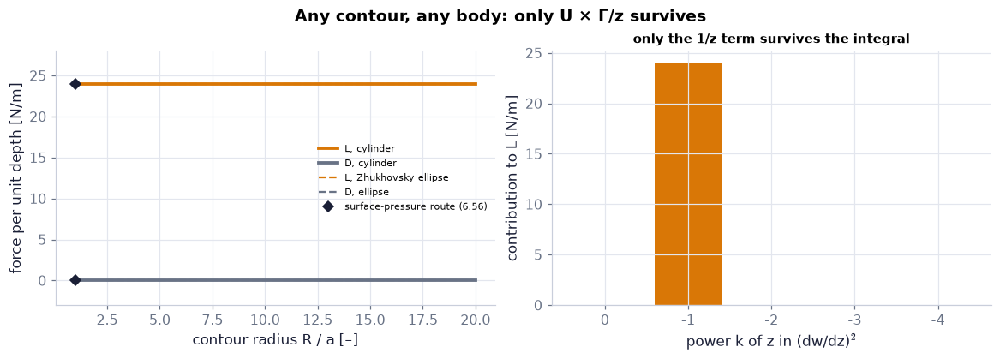

In [83]:
Ra = np.linspace(1.0, 20.0, 40)                          # contour radius / cylinder radius
cyl = np.array([pf.blasius_force(fc.dwdz, R=0.1*k, rho=1.2) for k in Ra])   # (D, L) for the cylinder [N/m]
Re_ = Ra[Ra > 2.1]                                       # contours that enclose the ellipse (semi-major 0.2033 m)
ell = np.array([pf.blasius_force(e.dwdz, R=0.1*k, rho=1.2) for k in Re_])   # (D, L) for the ellipse [N/m]
Dp, Lp = ch06.contour_force(lambda zz: fc.pressure(zz.real, zz.imag, rho=1.2, U=10.0), 0.1*np.exp(1j*np.linspace(0, 2*np.pi, 256, endpoint=False)))   # (6.56) on the body
lc = ch06.laurent_contributions("cylinder", R=0.2, Gamma_cw=2.0, U=10.0, a=0.1, rho=1.2)   # share of each power z^k
fig, (a1, a2) = plt.subplots(1, 2, figsize=(10.5, 3.7))  # force vs contour | Laurent bars
a1.plot(Ra, cyl[:, 1], color=COLORS["amber"], lw=2.5, label="L, cylinder")   # lift: amber
a1.plot(Ra, cyl[:, 0], color=COLORS["muted"], lw=2.5, label="D, cylinder")   # drag: grey
a1.plot(Re_, ell[:, 1], color=COLORS["amber"], ls="--", lw=1.5, label="L, Zhukhovsky ellipse")   # another body, same Γ
a1.plot(Re_, ell[:, 0], color=COLORS["muted"], ls="--", lw=1.5, label="D, ellipse")   # its drag
a1.plot([1.0, 1.0], [Dp, Lp], "D", color=COLORS["ink"], label="surface-pressure route (6.56)")   # the independent route at R = a
a1.set_xlabel("contour radius R / a [–]"); a1.set_ylabel("force per unit depth [N/m]"); a1.legend(fontsize=7)   # axes with units
a1.set_ylim(-3, 28)   # fixed range: 0 and ρUΓ = 24 N/m in view
a2.bar([str(k) for k in lc["powers"]], lc["contrib_im"], color=[COLORS["amber"] if k == -1 else COLORS["muted"] for k in lc["powers"]])   # one bar per power
a2.set_xlabel("power k of z in (dw/dz)$^2$"); a2.set_ylabel("contribution to L [N/m]")   # axes with units
a2.set_title("only the 1/z term survives the integral", fontsize=10)   # the message of the bars
fig.suptitle("Any contour, any body: only U × Γ/z survives", fontweight="bold")   # the message
savefig(fig, "ch06", "c10_blasius"); plt.show()          # save, then draw

**What you see.** Left, flat lines: L = 24 N/m and D = 0 for every contour radius and for both bodies, with the surface-pressure diamond on top at R = a; right, one tall bar at k = −1 and nothing elsewhere.

**How to read it.** Cauchy lets the contour move; the residue picks the 1/z term; its coefficient is $iU\Gamma/\pi$ whatever the body's doublet d — so the lift is ρUΓ for any shape.

**What would change if…** …a source hidden in the body (an open body, m ≠ 0): the 1/z coefficient gains Um/π and the drag becomes D = −ρUm — a thrust, pushing upstream (the held-source force of the S03 exercises).

#### 🎮 Interactive: Why doesn't lift depend on the shape?

**Why interactive rather than a static figure:** a proof cannot show invariance under deformation; here you drag the contour — radius, offset, shape — and watch the integral stay pinned while the integrand changes completely; the Laurent bars show which single term survives.

**What to try:**
- Drag the contour outward: the lift readout stays at ρUΓ.
- Switch the body to the ellipse with the same Γ: the same lift.
- Preset 'contour cuts the body' with the ellipse: the number jumps (R = 0.07 m gives about 8 N/m) because the contour crosses the map's branch cut. With the cylinder it does not: all its singularities sit at the centre, which a cutting circle still encloses — what matters is the singularities, not the outline.
- Tilt the ellipse: the force stays ρUΓ in size and perpendicular to the stream (its x and y parts change).
- Preset 'few quadrature points': exact for the cylinder already with 4 points; for the ellipse the error falls exponentially as you add points.

In [84]:
show_viz("ch06", "blasius_kutta_contour")   # full-width explainer; ⤢ Full screen for more room

[explainer ch06/blasius_kutta_contour]

**What would change if…** …the flow were three-dimensional (a finite wing)? The 2-D proof no longer applies: the trailing vortices of a finite wing
induce a downwash and a drag even in ideal flow — induced drag, Ch. 14. In 2-D there is no such escape: D = 0 always.

---

## 6.6 Conformal Mapping

**What is this section about?** An analytic function maps one plane to another, turning and stretching every small
figure but keeping its angles. A flow net — streamlines crossing equipotentials at right angles — therefore maps to
another flow net. Solve the easy problem, flow round a circle, and let a map carry it: the Zhukhovsky map turns the circle
into an ellipse (and, in Ch. 14, an airfoil).

### 🧩 Conformal maps keep angles, and the Zhukhovsky map carries the circle's flow onto an ellipse `C11`

*The question:* We can solve the flow round a circle. How can that one solution give the flow round other shapes?

*In one line:* $\delta w=\frac{dw}{dz}\delta z$ *(6.63)* · $z=\zeta+\frac{b^2}{\zeta}$ *(6.65)*

#### The problem in plain words

Draw a circle on a rubber sheet with a fine square grid, and stretch the sheet smoothly without tearing: the circle
becomes an oval, but where you look closely the little squares are still little squares, just turned and resized. A
conformal map is such a stretch done by an analytic function. Because streamlines and equipotentials form a grid of
little squares, the map carries a flow into a flow.

#### The idea

```
zeta-plane: circle |zeta| = a, flow (6.68) known  --z = zeta + b^2/zeta-->  z-plane: ellipse (6.67), flow = the same w at zeta(z)
small cross at zeta0  --x f'(zeta0) = |f'| e^{i chi}-->  turned by chi, stretched by |f'|, right angle kept
inverse: two roots zeta, b^2/zeta  --  keep the one OUTSIDE the circle
```

*The numbered equations in the sketch:* $w=U\Big(\zeta+\frac{a^2}{\zeta}\Big)+\frac{i\Gamma}{2\pi}\ln(\zeta/a)$ *(6.68)* · $\frac{x^2}{(a+b^2/a)^2}+\frac{y^2}{(a-b^2/a)^2}=1$ *(6.67)*

🔁 Reminder (primer P153 in C09): multiplying complex numbers multiplies their moduli and adds their angles.

📝 **Note.** **A small step δz at z₀ becomes** `N64`

$$ \delta w=\frac{dw}{dz}\delta z \qquad \text{(6.63)} $$

#### 🧮 Derivation — Conformal maps keep angles `D19` (Eq. 6.64: $\delta'w=\frac{dw}{dz}\delta'z,\ \alpha=\beta$)

**What we want to show.** Show that an analytic map turns and stretches every small figure at a point by the same amount, so angles between small line elements are preserved — except where the derivative is zero or infinite.

**Assumptions.** w = f(z) analytic at z₀ with f′(z₀) ≠ 0, ∞ (steps 1–4); small elements (first order in δz).

**The plan.**

1. Write the derivative in polar form.
2. See what it does to one element.
3. And to a second.
4. Subtract the angles.
5. Find where it fails.

**Tools we use** (each explained before this point): the complex plane in numpy: multiplying adds angles (primer, in C09) · polar form (N41).

**We start from**

$$ \delta w=\frac{dw}{dz}\delta z\ \text{(6.63)} $$

*In words:* near a point, a small step in z maps to a small step in w by multiplication with the derivative.

---

**Step 1 of 6 — Write f′ in polar form.**

$$ \frac{dw}{dz}=\Big\lvert\frac{dw}{dz}\Big\rvert e^{i\chi} $$

- *Why we can do this:* Any non-zero complex number has a modulus and an argument (P153); χ = arg f′(z₀).
- *In words:* The derivative is a stretch and a turn.

---

**Step 2 of 6 — Apply it to one element.**

$$ \delta w=\Big\lvert\frac{dw}{dz}\Big\rvert\lvert\delta z\rvert e^{i(\chi+\arg\delta z)} $$

- *Why we can do this:* Multiplying complex numbers multiplies moduli and adds arguments.
- *In words:* The small step is stretched by |f′| and turned by χ.

---

**Step 3 of 6 — Apply it to a second element.**

$$ \delta'w=\frac{dw}{dz}\delta'z $$

- *Why we can do this:* The same point, the same derivative — (6.64), $\delta'w=\frac{dw}{dz}\delta'z,\ \alpha=\beta$; a second direction δ′z from z₀.
- *In words:* Every small step at z₀ gets the same stretch and turn.

---

**Step 4 of 6 — Subtract the two angles.**

$$ \arg\delta'w-\arg\delta w=(\chi+\arg\delta'z)-(\chi+\arg\delta z)=\arg\delta'z-\arg\delta z $$

- *Why we can do this:* χ appears in both and cancels. So α = β: the angle between the images equals the angle between the originals.
- *In words:* Small crosses stay crosses.

---

**Step 5 of 6 — Look where f′ = 0.**

$$ w=z^2:\ \arg w=2\arg z\ \text{near }0 $$

- *Why we can do this:* At a critical point χ is undefined and the first-order argument fails; for z² the next term doubles every angle at the origin.
- *In words:* At a critical point angles are multiplied, not kept.

---

**Step 6 of 6 — Apply to a flow net.**

$$ \phi=\text{const}\ \perp\ \psi=\text{const}\ \text{in }w\ \Rightarrow\ \text{also in }z $$

- *Why we can do this:* A uniform grid of φ- and ψ-lines crosses at right angles in the w-plane; by step 4 their images still do (N66).
- *In words:* A map carries a flow net to a flow net.

---

**Result**

$$ \delta'w/\delta w=\delta'z/\delta z\ \text{in angle, i.e. α = β (6.64), wherever}\ 0<\lvert dw/dz\rvert<\infty $$

*In words:* an analytic map is locally a rotation plus a scaling, so it keeps angles between small elements.

**What it means.** Streamlines and equipotentials, perpendicular in any flow, stay perpendicular under an analytic map: a solved flow becomes a new solved flow (D20, D21).

**Check it.** f = z² at z₀ = 1 + 0.5i: two perpendicular steps stay perpendicular (90° → 90°); at z₀ = 0: 45° → 90° (the code cell after note N65) ✓. Large figures distort (the ellipse is not a scaled circle).

> ⚠️ **Common confusion (traps in `D19`):** The statement is local: only small figures keep their shape. At f′ = 0 or ∞ (ζ = ±b for Zhukhovsky) angles are not kept — those are the plate's ends.

📝 **Note.** **Two elements at one point** `N65` — A second step δ′z at the same point becomes $\delta'w=\frac{dw}{dz}\delta'z$ *(Eq. 6.64)*, turned by the same angle
arg(dw/dz), so the angle between the two is kept (α = β). It fails where dw/dz = 0 or ∞, and only *small* figures keep
their shape.

In [85]:
f_, fp = (lambda z: z**2), (lambda z: 2*z)               # the map w = z² and its derivative
print(np.degrees(cm.angle_preservation(f_, fp, 1+0.5j, 1e-3, 1e-3j)))   # (before, after) = (90°, 90°): kept
print(np.degrees(cm.angle_preservation(f_, fp, 0j, 1e-3, 1e-3*np.exp(1j*np.pi/4))))   # (45°, 90°): doubled at z = 0

[90. 90.]
[45. 90.]


📝 **Note.** **Flow nets as images of a grid** `N66` — A rectangular grid of φ = const and ψ = const lines in the w-plane is uniform flow; its image in the z-plane is the flow
net of w = f(z). Chains of maps work too: w = ln ζ with ζ = sin z gives
$u-iv=\frac{dw}{d\zeta}\frac{d\zeta}{dz}=\frac1\zeta\cos z=\cot z$; w = z² gives the 90° corner (the hyperbolae of
$\psi=2Axy$ *(6.24)* — ⚠️ the book's "(see Figure 6.5)" means Figure 6.3).

In [86]:
r_ = ch06.cot_flow(0.7 + 0.2j)                           # w = ln(sin z) at z = 0.7 + 0.2i
print(r_["dwdz_chain"], 1/np.tan(0.7 + 0.2j))            # (dw/dζ)(dζ/dz) = cot z: equal

(1.0815981499051281-0.4508286340113526j) (1.0815981499051281-0.4508286340113526j)


#### 🧮 Derivation — The Zhukhovsky map sends circles to a slit and to ellipses `D20` (Eq. 6.67: $\frac{x^2}{(a+b^2/a)^2}+\frac{y^2}{(a-b^2/a)^2}=1$)

**What we want to show.** Find the images of circles centred at the origin under z = ζ + b²/ζ: the circle of radius b and a larger one of radius a.

**Assumptions.** b > 0 real; a > b for the ellipse (steps 3–6).

**The plan.**

1. Far away.
2. The circle of radius b.
3. A circle of radius a.
4. Separate x and y, eliminate θ.
5. Foci, critical points, two-to-one.

**Tools we use** (each explained before this point): Euler's formula (ch01 P45) · e^{iθ} + e^{−iθ} = 2 cos θ, cos² + sin² = 1 (gloss) · ellipse foci c² = A² − B² (gloss).

**We start from**

$$ z=\zeta+\frac{b^2}{\zeta}\ \text{(6.65)} $$

*In words:* the Zhukhovsky transformation.

---

**Step 1 of 8 — Look far from the origin.**

$$ \lvert\zeta\rvert\gg b\ \Rightarrow\ z\approx\zeta $$

- *Why we can do this:* b²/ζ → 0 as |ζ| grows; the map leaves the far field — the free stream — unchanged.
- *In words:* Far away the two planes coincide.

---

**Step 2 of 8 — Map the circle ζ = b e^{iθ}.**

$$ z=be^{i\theta}+be^{-i\theta}=2b\cos\theta $$

- *Why we can do this:* b²/(b e^{iθ}) = b e^{−iθ}; the sum of the two exponentials is twice the cosine.
- *In words:* The circle of radius b becomes the segment from −2b to 2b, traced twice.

---

**Step 3 of 8 — Map a circle of radius a > b.**

$$ z=ae^{i\theta}+\frac{b^2}{a}e^{-i\theta} $$

- *Why we can do this:* Substitute ζ = a e^{iθ} in (6.65), $z=\zeta+\frac{b^2}{\zeta}$. This is (6.66), $z=ae^{i\theta}+\frac{b^2}{a}e^{-i\theta}$ — the line above.
- *In words:* A larger circle maps to a closed curve.

---

**Step 4 of 8 — Separate real and imaginary parts.**

$$ x=\Big(a+\frac{b^2}{a}\Big)\cos\theta,\qquad y=\Big(a-\frac{b^2}{a}\Big)\sin\theta $$

- *Why we can do this:* Euler's formula on each exponential; e^{−iθ} has sine of the opposite sign.
- *In words:* x and y oscillate with different amplitudes.

---

**Step 5 of 8 — Eliminate θ.**

$$ \frac{x^2}{(a+b^2/a)^2}+\frac{y^2}{(a-b^2/a)^2}=\cos^2\theta+\sin^2\theta=1 $$

- *Why we can do this:* Divide each by its amplitude, square and add (gloss). This is (6.67), $\frac{x^2}{(a+b^2/a)^2}+\frac{y^2}{(a-b^2/a)^2}=1$ — the line above.
- *In words:* The image is an ellipse with semi-axes a + b²/a and a − b²/a.

---

**Step 6 of 8 — Locate the foci.**

$$ c^2=\Big(a+\frac{b^2}{a}\Big)^2-\Big(a-\frac{b^2}{a}\Big)^2=4b^2\ \Rightarrow\ c=2b $$

- *Why we can do this:* For an ellipse c² = A² − B² (gloss); the cross terms ±2b² differ by 4b².
- *In words:* Every ellipse of the family has its foci at ±2b — the slit's ends.

---

**Step 7 of 8 — Find the critical points.**

$$ \frac{dz}{d\zeta}=1-\frac{b^2}{\zeta^2}=0\ \Rightarrow\ \zeta=\pm b $$

- *Why we can do this:* Angles are not kept where the derivative vanishes (D19 step 5); these points lie on the circle of radius b, inside or on our circle a ≥ b.
- *In words:* The slit's ends are where the map pinches.

---

**Step 8 of 8 — Notice the map is two-to-one.**

$$ z(\zeta)=z\Big(\frac{b^2}{\zeta}\Big) $$

- *Why we can do this:* Replacing ζ by b²/ζ swaps the two terms of (6.65), $z=\zeta+\frac{b^2}{\zeta}$; a point outside the circle |ζ| = b and its inverse point inside give the same z.
- *In words:* Inside and outside the circle each cover the whole z-plane — we use only the outside.

---

**Result**

$$ \begin{array}{l}z=2b\cos\theta\ \text{for |ζ| = b (a slit of length 4b);}\ \frac{x^2}{(a+b^2/a)^2}+\frac{y^2}{(a-b^2/a)^2}=1\ \text{(6.67) for |ζ| = a,} \\ \text{foci ±2b}\end{array} $$

*In words:* the Zhukhovsky map flattens circles into ellipses sharing the same foci, and the critical circle into a flat plate.

**What it means.** Any flow round a circle becomes flow round an ellipse (D21); an off-centre circle becomes an airfoil (Ch. 14).

**Check it.** b = 1, a = 1.2: A = 2.033, B = 0.367, c² = 4.134 − 0.134 = 4 ✓. a → ∞: A/a, B/a → 1 (a circle again).

> ⚠️ **Common confusion (traps in `D20`):** The map is two-to-one; we keep the exterior of the circle. ζ = ±b are critical points: the plate's ends, where the speed will blow up unless the Kutta condition holds.

📝 **Note.** **The circle of radius a > b maps to an ellipse (note `N68`)** `N67` — $z=ae^{i\theta}+\frac{b^2}{a}e^{-i\theta}$ *(6.66)* is the ellipse below, with foci at ±2b. b = 1 m, a = 1.2 m:
semi-axes 2.033 m and 0.367 m, foci ±2 m.

$$ \frac{x^2}{(a+b^2/a)^2}+\frac{y^2}{(a-b^2/a)^2}=1 \qquad \text{(6.67)} $$

In [87]:
print(ch06.joukowski_ellipse(1.2, 1.0))                  # semi-axes A = a + b²/a, B = a − b²/a and the focal distance 2b [m]

{'A': 2.033333333333333, 'B': 0.3666666666666666, 'foci': 1.9999999999999998, 'thickness_ratio': 0.180327868852459}


📝 **Note.** **The circle flow in the ζ-plane** `N69` — The circle of radius a in a stream U with a clockwise circulation Γ — $w=U\big(z+\frac{a^2}z\big)+\frac{i\Gamma}{2\pi}\ln(z/a)$
*(Eq. 6.52)* with z replaced by ζ:

$$ w=U\Big(\zeta+\frac{a^2}{\zeta}\Big)+\frac{i\Gamma}{2\pi}\ln(\zeta/a) \qquad \text{(6.68)} $$

> 📎 **Primer — complex square roots and the quadratic formula.** `P159` · A quadratic $\zeta^2-z\zeta+b^2=0$ has two roots $\zeta=\tfrac12[z\pm(z^2-4b^2)^{1/2}]$, and in the complex plane "the"
square root is a choice: numpy's `np.sqrt` returns the principal root (real part ≥ 0), whose cut lies where the argument
is a negative real number. The two roots here multiply to b² (Vieta, P71), so one is outside the circle |ζ| = b and one
inside — and the principal root does **not** always pick the outside one.

In [88]:
b, z = 1.0, -3 + 0.5j                                    # a point to the left of the slit
r = np.sqrt(z**2 - 4*b**2)                               # numpy's principal root
print(abs(0.5*(z + r)), abs(0.5*(z - r)))                # 0.370 and 2.701: '+' gives the INSIDE root here
print(abs(0.5*(z + np.sqrt(z - 2*b)*np.sqrt(z + 2*b))))  # 2.701: the product form picks the outside root

0.3701931190845438 2.701292780570626
2.701292780570627


#### 🧮 Derivation — Back from z to ζ: the right square root, and the flow round an elliptic cylinder `D21` (Eq. 6.69: $\zeta=\tfrac12z+\tfrac12(z^2-4b^2)^{1/2}$)

**What we want to show.** Invert the Zhukhovsky map so that each point z outside the ellipse is sent to the point ζ outside the circle, and compute the velocity round the elliptic cylinder with circulation by the chain rule.

**Assumptions.** a > b (the ellipse encloses the slit); points z outside the ellipse; a stream along x (the explainer adds an angle by rotating U).

**The plan.**

1. Solve the quadratic for ζ.
2. Pick the outside root.
3. See numpy fail and fix it.
4. Chain rule for the velocity.

**Tools we use** (each explained before this point): complex square roots and the quadratic formula (primer, in C11) · Vieta's formulas (ch02 P71, reminder) · chain rule (ch01 P49, reminder) · derivative of an inverse function (gloss in step 10).

**We start from**

$$ z=\zeta+\frac{b^2}{\zeta}\ \text{(6.65) and the circle flow}\ w=U\Big(\zeta+\frac{a^2}{\zeta}\Big)+\frac{i\Gamma}{2\pi}\ln(\zeta/a)\ \text{(6.68)} $$

*In words:* the map and the flow we know in the ζ-plane.

---

**Step 1 of 11 — Multiply the map by ζ.**

$$ \zeta^2-z\zeta+b^2=0 $$

- *Why we can do this:* ζ ≠ 0 outside the circle; multiplying (6.65), $z=\zeta+\frac{b^2}{\zeta}$ by ζ gives a quadratic in ζ for each z.
- *In words:* Each z has two candidate ζ's.

---

**Step 2 of 11 — Apply the quadratic formula.**

$$ \zeta=\tfrac12\big[z\pm(z^2-4b^2)^{1/2}\big] $$

- *Why we can do this:* ζ = [z ± √(z² − 4b²)]/2 for a monic quadratic (primer).
- *In words:* Two roots, differing in the sign of a square root.

---

**Step 3 of 11 — Multiply the two roots.**

$$ \zeta_+\zeta_-=b^2\ \Rightarrow\ \lvert\zeta_+\rvert\,\lvert\zeta_-\rvert=b^2 $$

- *Why we can do this:* Vieta: the product of the roots is the constant term (P71). So unless both lie on |ζ| = b, one is outside the circle and one inside.
- *In words:* One root is the physical point, the other its inverse inside the circle.

---

**Step 4 of 11 — Choose the root outside.**

$$ \zeta(z)=\text{the root with }\lvert\zeta\rvert\ge b $$

- *Why we can do this:* The flow (6.68), $w=U\Big(\zeta+\frac{a^2}{\zeta}\Big)+\frac{i\Gamma}{2\pi}\ln(\zeta/a)$ lives outside the circle; the inside root is excluded (the book's "the negative root … has been excluded"). This gives (6.69), $\zeta=\tfrac12z+\tfrac12(z^2-4b^2)^{1/2}$.
- *In words:* Keep the root that lands in the fluid.

---

**Step 5 of 11 — Test numpy's principal root.**

$$ z=-3+0.5i,\ b=1:\ \tfrac12\big[z+\sqrt{z^2-4b^2}\big]_{\text{principal}}=-0.362-0.079i,\ \lvert\zeta\rvert=0.37 $$

- *Why we can do this:* `np.sqrt` returns the root with non-negative real part; for Re z < 0 that makes '+' give the inside root. Our check, not the book's.
- *In words:* The textbook formula with numpy's square root sends left-half points inside the cylinder.

---

**Step 6 of 11 — Split the root into two factors.**

$$ (z^2-4b^2)^{1/2}=\sqrt{z-2b}\,\sqrt{z+2b} $$

- *Why we can do this:* Each principal factor has its cut along the real axis to the left of ±2b; in the product the two cuts cancel beyond −2b, leaving a cut only on the slit [−2b, 2b].
- *In words:* A square root whose only jump is hidden inside the body.

---

**Step 7 of 11 — Check that it behaves like z far away.**

$$ \sqrt{z-2b}\sqrt{z+2b}\approx z\ \Rightarrow\ \zeta\approx z\quad(\lvert z\rvert\to\infty) $$

- *Why we can do this:* Both factors tend to √z, whose product is z on every side, so '+' gives ζ ≈ z, the outside root, in all four quadrants (z = −3 + 0.5i: |ζ| = 2.70 ✓).
- *In words:* The product form picks the outside root everywhere.

---

**Step 8 of 11 — Compose the flow.**

$$ w(z)=W(\zeta(z)),\quad W(\zeta)=U\Big(\zeta+\frac{a^2}{\zeta}\Big)+\frac{i\Gamma}{2\pi}\ln\frac\zeta a $$

- *Why we can do this:* A map carries a flow net to a flow net (D19); the same w value at a point and at its image means the same φ and ψ.
- *In words:* The flow round the ellipse is the circle flow read at ζ(z).

---

**Step 9 of 11 — Apply the chain rule.**

$$ u-iv=\frac{dw}{dz}=\frac{dW}{d\zeta}\frac{d\zeta}{dz} $$

- *Why we can do this:* Derivative of a composition of analytic functions (the book's last line).
- *In words:* Velocity = circle velocity × the map's local stretch.

---

**Step 10 of 11 — Invert the map's derivative.**

$$ \frac{d\zeta}{dz}=\frac{1}{dz/d\zeta}=\frac{1}{1-b^2/\zeta^2} $$

- *Why we can do this:* The derivative of an inverse function is the reciprocal of the derivative (gloss), from (6.65), $z=\zeta+\frac{b^2}{\zeta}$.
- *In words:* Where the map squeezes, the flow speeds up.

---

**Step 11 of 11 — Write the velocity round the ellipse.**

$$ u-iv=\frac{U(1-a^2/\zeta^2)+i\Gamma/2\pi\zeta}{1-b^2/\zeta^2} $$

- *Why we can do this:* dW/dζ from (6.68), $w=U\Big(\zeta+\frac{a^2}{\zeta}\Big)+\frac{i\Gamma}{2\pi}\ln(\zeta/a)$ differentiated, times step 10; for a > b the denominator vanishes only at ζ = ±b, inside the circle.
- *In words:* A finite velocity everywhere round the ellipse.

---

**Result**

$$ \begin{array}{l}\zeta=\tfrac12z+\tfrac12(z^2-4b^2)^{1/2}\ \text{with the root outside the circle (6.69), coded as} \\ \zeta=\tfrac12\big[z+\sqrt{z-2b}\sqrt{z+2b}\big]\ \text{, and}\ u-iv=\frac{dW}{d\zeta}\frac{d\zeta}{dz}\end{array} $$

*In words:* invert the map with the square root cut along the slit, and the circle's flow gives the flow round the ellipse.

**What it means.** Conformal maps turn one solved flow into a family; the one numerical trap is the branch of the inverse. With a = b and Γ chosen to cancel the numerator at the trailing edge, this becomes the flat-plate airfoil of Ch. 14.

**Check it.** `joukowski_inverse(joukowski(ζ)) = ζ` for 10⁴ random ζ outside the circle in all four quadrants (in `tests/test_ch06.py`); normal velocity on the ellipse ≲ 1e-12 (the code cell after the tiny example of C11) and Blasius lift ρUΓ (the code cell after the tiny example of C10) ✓. a = b: the denominator vanishes at the plate's ends — infinite speed unless the numerator also vanishes there.

In [89]:
import sympy as sp                                       # symbolic algebra
zeta, zs, bs_ = sp.symbols("zeta z b")                   # the unknown ζ, the given z and the constant b
roots = sp.solve(zeta**2 - zs*zeta + bs_**2, zeta)       # step 2: the two roots of ζ² − zζ + b² = 0
print(roots)                                             # ½[z ± √(z² − 4b²)]
print("product of the roots:", sp.simplify(roots[0]*roots[1]))   # step 3: → b**2 (Vieta)
xg = np.linspace(-4, -0.5, 41)                           # numeric part: a grid in the left half-plane …
yg = np.linspace(-2, 2, 41)                              # … x < 0, all y
zz = (xg[:, None] + 1j*yg[None, :]).ravel()              # 1681 points z = x + iy
zz = zz[~((np.abs(zz.imag) < 1e-12) & (np.abs(zz.real) <= 2.0))]   # drop the slit [−2b, 2b] itself: there both roots have |ζ| = b
zz = zz[np.abs(cm.joukowski_inverse(zz, 1.0)) > 1.0]    # keep points outside the circle's image (all of them here)
bad = np.abs(0.5*(zz + np.sqrt(zz**2 - 4))) < 1          # the principal-root variant lands INSIDE the circle
print("fraction where the principal root fails:", bad.mean())   # → 1.0 at every left-half point off the slit
good = cm.joukowski_inverse(zz, 1.0)                     # the library's outside branch (product form, step 6)
assert np.allclose(cm.joukowski(good, 1.0), zz)          # it really inverts the map z = ζ + b²/ζ …
assert np.all(np.abs(good) >= 1)                         # … and always lands outside the circle |ζ| = b
U_, a_, G_ = sp.symbols("U a Gamma", positive=True)      # stream, circle radius, clockwise Γ
W = U_*(zeta + a_**2/zeta) + sp.I*G_/(2*sp.pi)*sp.log(zeta/a_)   # (6.68): the circle flow
zfun = zeta + bs_**2/zeta                                # (6.65): z as a function of ζ
dWdz_chain = sp.diff(W, zeta)/sp.diff(zfun, zeta)        # steps 9–10: dW/dz = (dW/dζ)/(dz/dζ) (implicit differentiation)
step11 = (U_*(1 - a_**2/zeta**2) + sp.I*G_/(2*sp.pi*zeta))/(1 - bs_**2/zeta**2)   # the velocity u − iv of step 11
print("step 11 − chain rule:", sp.simplify(dWdz_chain - step11))   # → 0

[z/2 - sqrt(-4*b**2 + z**2)/2, z/2 + sqrt(-4*b**2 + z**2)/2]
product of the roots: b**2
fraction where the principal root fails: 1.0
step 11 − chain rule: 0


> ⚠️ **Common confusion (traps in `D21`):** The two roots multiply to b² — one inside, one outside. numpy's principal √(z² − 4b²) returns the inside root for Re z < 0. dζ/dz blows up at the slit ends when a = b.

📝 **Note.** **The inverse and the velocity** `N70` — with the root that falls outside the circle, and $u-iv=\frac{dw}{dz}=\frac{dw}{d\zeta}\frac{d\zeta}{dz}$. ⚠️ Coded as
$\zeta=\tfrac12[z+\sqrt{z-2b}\sqrt{z+2b}]$: at z = −3 + 0.5i (b = 1) it gives |ζ| = 2.70, while numpy's principal
√(z² − 4b²) gives 0.37 — a point inside the cylinder, and a flow that makes no sense.

$$ \zeta=\tfrac12z+\tfrac12(z^2-4b^2)^{1/2} \qquad \text{(6.69)} $$

#### ✏️ Tiny example: an ellipse from a circle

b = 1 m, a = 1.2 m.

1. The circle $\zeta=1.2e^{i\theta}$ maps to $x=(1.2+1/1.2)\cos\theta=2.033\cos\theta$, $y=(1.2-0.833)\sin\theta=0.367\sin\theta$.
2. Foci: c² = 2.033² − 0.367² = 4.134 − 0.134 = 4 → c = 2 = 2b.
3. At θ = 0 the map's derivative dz/dζ = 1 − b²/ζ² = 1 − 1/1.44 = 0.306: lengths along the circle near its right end
   shrink to 31 % — the ellipse's sharp ends.
4. Inverse at z = −3 + 0.5i: the product form gives ζ = −2.638 + 0.579i (|ζ| = 2.70 > 1.2, outside ✓).

In [90]:
b, a = 1.0, 1.2                                          # Zhukhovsky constant and circle radius [m]
th = np.linspace(0, 2*np.pi, 400, endpoint=False)        # angles on the circle [rad]
zc = cm.joukowski(a*np.exp(1j*th), b)                    # the circle's image z = ζ + b²/ζ (6.65)
A_, B_ = a + b**2/a, a - b**2/a                          # semi-axes [m]
print(np.max(np.abs(zc.real**2/A_**2 + zc.imag**2/B_**2 - 1)))   # ≈ 0: the image satisfies (6.67)
zz = np.array([-3+0.5j, -3-0.5j, 3+0.5j, 0.1+2j])         # four points, left and right of the slit
print(np.abs(cm.joukowski_inverse(zz, b)))               # outside branch: every |ζ| > 1
print(np.abs(cm.joukowski_inverse(zz, b, branch="principal")))   # numpy's principal root: 0.37 on the left — WRONG
e = ch06.elliptic_cylinder_flow(1.0, a, b, Gamma_cw=1.0) # the circle flow (6.68) carried to the ellipse, U = 1 m/s, Γ = 1 m²/s
print(pf.normal_velocity_on(e, zc), pf.far_field_check(e, 200.0))   # no flow through the ellipse; far field → U (error ~Γ/2πR)

1.3322676295501878e-15
[2.7013 2.7013 2.7013 2.4153]
[0.3702 0.3702 2.7013 2.4153]
2.656208586415687e-14 0.0008067341047763854


**What does the code above do?**

1. The circle's image satisfies the ellipse equation (6.67), $\frac{x^2}{(a+b^2/a)^2}+\frac{y^2}{(a-b^2/a)^2}=1$ to round-off.
2. The two inverses compared in all four quadrants: the outside branch always lands outside the circle; the principal
   root sends the two left points inside (|ζ| = 0.37).
3. The mapped flow (`elliptic_cylinder_flow`, the chain rule of D21) has no flow through the ellipse and returns to the
   stream far away (the remaining 8×10⁻⁴ m/s at R = 200 m is the vortex's Γ/2πR).

**From scratch — pick the root outside the circle by hand:**

In [91]:
r1 = 0.5*(zz + np.sqrt(zz**2 - 4*b**2))                  # numpy's principal '+' root
r2 = b**2/r1                                             # the other root: the two multiply to b² (Vieta)
mine = np.where(np.abs(r1) >= b, r1, r2)                 # keep the root outside the circle |ζ| = b
print(np.abs(mine))                                      # all > 1
assert np.allclose(mine, cm.joukowski_inverse(zz, b))    # = the library's branch everywhere

[2.7013 2.7013 2.7013 2.4153]


Picking the root with |ζ| ≥ b by hand gives the library's branch everywhere.

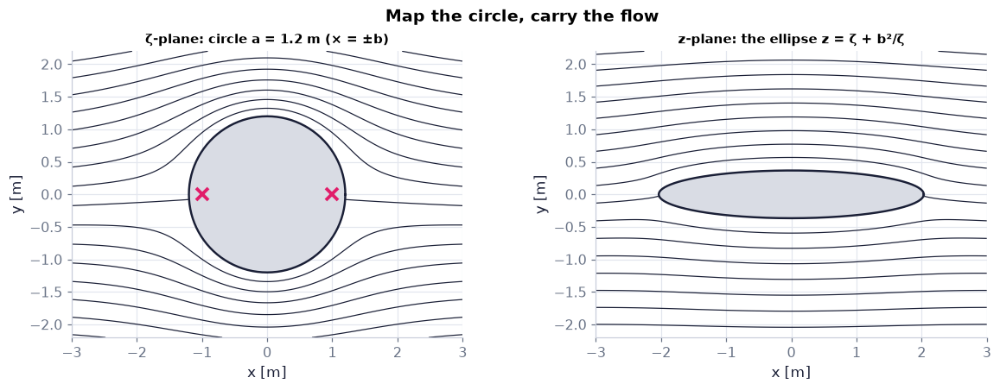

In [92]:
n = 241 if not FAST else 161                             # grid points per side
W, dW = cm.circle_flow_zeta(1.0, 1.2, Gamma_cw=1.0)      # the ζ-plane flow (6.68): U = 1 m/s, a = 1.2 m, Γ = 1 m²/s
Xs, Ys = np.meshgrid(np.linspace(-3, 3, n), np.linspace(-2.2, 2.2, n))   # grid [m]
Zs = Xs + 1j*Ys                                          # as complex numbers
Pz = np.where(np.abs(Zs) < 1.2, np.nan, W(Zs).imag)      # ψ in the ζ-plane, blank inside the circle
Pe = np.asarray(e.psi(Xs, Ys), float)                    # ψ of the mapped flow in the z-plane
Pe = np.where(Xs**2/A_**2 + Ys**2/B_**2 < 1, np.nan, Pe) # blank inside the ellipse
lv = np.linspace(-2.5, 2.5, 21)                          # the SAME ψ levels in both planes [m²/s]
fig, (a1, a2) = plt.subplots(1, 2, figsize=(11, 4.0))    # ζ-plane | z-plane
a1.contour(Xs, Ys, Pz, levels=lv, colors=COLORS["ink"], linewidths=0.8)   # circle-flow streamlines
draw_body(a1, circle(1.2)); a1.plot([-1, 1], [0, 0], "x", color=COLORS["rose"], ms=9, mew=2.5, zorder=10)   # the circle and the points ±b
a1.set_title("ζ-plane: circle a = 1.2 m (× = ±b)", fontsize=10)
a2.contour(Xs, Ys, Pe, levels=lv, colors=COLORS["ink"], linewidths=0.8)   # the same streamlines, mapped
draw_body(a2, zc); a2.plot([-2, 2], [0, 0], "--", color=COLORS["muted"])   # the ellipse and the slit [−2b, 2b] inside it
a2.set_title("z-plane: the ellipse z = ζ + b²/ζ", fontsize=10)
for ax in (a1, a2):
    ax.set_xlim(-3, 3); ax.set_ylim(-2.2, 2.2); ax.set_aspect("equal"); ax.set_xlabel("x [m]"); ax.set_ylabel("y [m]")
fig.suptitle("Map the circle, carry the flow", fontweight="bold")
savefig(fig, "ch06", "c11_two_planes"); plt.show()       # save, then draw

**What you see.** The same streamline pattern twice: bent round a circle on the left and round a flat ellipse on the right, slightly asymmetric top/bottom because of the clockwise circulation.

**How to read it.** ψ is the same number at a point ζ and at its image z, so a streamline maps to a streamline and the circle maps to the ellipse; angles between streamlines and the body are kept.

**What would change if…** …a → b: the ellipse flattens to the plate [−2, 2]; the speed at its ends blows up unless Γ is chosen to cancel it (the Kutta condition, Ch. 14).

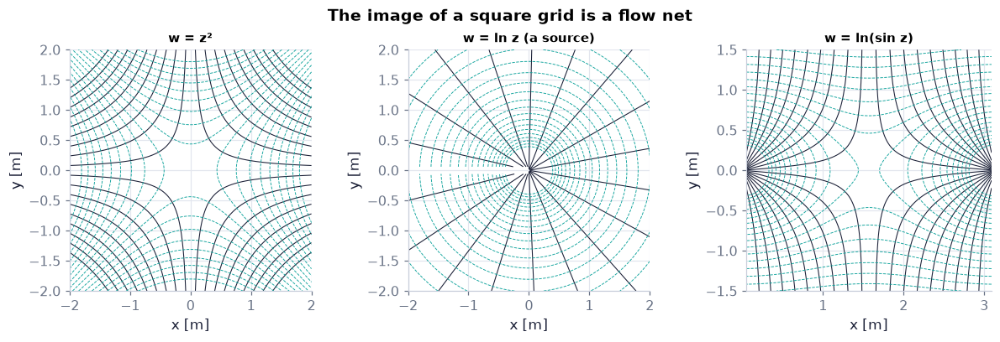

In [93]:
ng = 201 if not FAST else 141                            # grid points per side
maps = [("w = z²", lambda z: z**2, (-2, 2), (-2, 2)), ("w = ln z (a source)", np.log, (-2, 2), (-2, 2)),
        ("w = ln(sin z)", lambda z: np.log(np.sin(z)), (0.05, np.pi - 0.05), (-1.5, 1.5))]   # three flows
fig, axs = plt.subplots(1, 3, figsize=(11, 3.6))         # one panel per map
for ax, (name, wf, xl, yl) in zip(axs, maps):
    g = cm.grid_image(wf, xlim=xl, ylim=yl, n=ng, levels=18)   # Re w and Im w on a grid, cuts masked
    if name.startswith("w = ln z"):                      # ln z: blank a strip along its branch cut (the negative x-axis)
        cut = (np.abs(g["Y"]) < 0.05) & (g["X"] < 0)
        g["psi"] = np.where(cut, np.nan, g["psi"]); g["phi"] = np.where(cut, np.nan, g["phi"])
    ax.contour(g["X"], g["Y"], g["psi"], levels=g["psi_levels"], colors=COLORS["ink"], linewidths=0.7)   # ψ = const
    ax.contour(g["X"], g["Y"], g["phi"], levels=g["phi_levels"], colors=COLORS["teal"], linewidths=0.6, linestyles="--")   # φ = const
    ax.set_aspect("equal"); ax.set_title(name, fontsize=10); ax.set_xlabel("x [m]"); ax.set_ylabel("y [m]")
fig.suptitle("The image of a square grid is a flow net", fontweight="bold")
savefig(fig, "ch06", "c11_grid_images"); plt.show()      # save, then draw

**What you see.** Hyperbolae crossing hyperbolae (z²), rays crossing circles (ln z: the flow net of a source), and the cot-flow net in a strip (ln sin z).

**How to read it.** Every crossing is a right angle except at critical points where dw/dz = 0 — the origin for z² — where angles are doubled.

**What would change if…** …w = z³: the pattern repeats three times round the origin, and the angles there are tripled.

In [94]:
bq = 1.0                                                 # Zhukhovsky constant [m]
def joukowski_traces(ab):                                # body and five mapped streamlines for a/b = ab (Γ = 0, U = 1 m/s)
    aq = ab*bq                                           # circle radius [m]
    th = np.linspace(0, 2*np.pi, 120)                    # angles [rad]
    body = cm.joukowski(aq*np.exp(1j*th), bq)            # the ellipse (a plate when a = b)
    t = np.linspace(0.005, np.pi - 0.005, 90)            # angles in the upper half [rad]
    xs, ys = [], []                                      # streamlines, joined with NaN gaps
    for c in (0.25, 0.6, 1.0, 1.6, 2.4):                 # ψ values [m²/s]
        rr = (c + np.sqrt(c**2 + 4*aq**2*np.sin(t)**2))/(2*np.sin(t))   # r(θ) on ψ = (r − a²/r) sinθ = c
        zm = cm.joukowski(rr*np.exp(1j*t), bq)           # carried to the z-plane
        xs += list(zm.real) + [np.nan] + list(zm.real) + [np.nan]; ys += list(zm.imag) + [np.nan] + list(-zm.imag) + [np.nan]
    return {"body": (body.real, body.imag), "streamlines": (np.array(xs), np.array(ys))}
abs_ = np.linspace(1.0, 3.0, 21 if not FAST else 11)     # a/b values
fig = slider_figure(joukowski_traces, "a/b", abs_, xlabel="x [m]", ylabel="y [m]",
                    title="One map, a family of bodies", xrange=[-5, 5], yrange=[-3.2, 3.2], height=460)
recolor(fig, {"body": COLORS["ink"], "streamlines": COLORS["accent"]})
step_titles(fig, [f"One map, a family of bodies: semi-axes {v + 1/v:.2f} m × {v - 1/v:.2f} m, foci ±2 m" for v in abs_])
fig.show()                                               # draw it (works on the web page too)

**What you see.** At a/b = 1 a flat plate from −2 to 2 m with streamlines sliding past it; dragging a/b up fattens it into an ellipse and then almost a circle.

**How to read it.** Every body of the family shares the foci ±2b (the plate's ends); the streamlines are the circle's, carried through the map.

**What would change if…** …a/b → ∞: z ≈ ζ everywhere near the body (b²/ζ becomes negligible) and the body is simply the circle.

#### 🎮 Interactive: How does a map carry a flow?

**Why interactive rather than a static figure:** two linked planes on one state is the natural interactive form: drag a small cross in the ζ-plane and watch its image stay a right angle (and fail at ζ = ±b), slide a/b from a plate to a circle, and toggle numpy's square root to see half the streamlines jump inside the body.

**What to try:**
- Drag the cross toward ζ = +b: the image angle opens toward 180°.
- Slide a/b to 1: the ellipse becomes a plate.
- Switch the branch chips to 'numpy principal': streamlines on the left jump inside — the status turns ⚠️.
- Mode 'z²' at 0: angles doubled.

In [95]:
show_viz("ch06", "conformal_joukowski")   # full-width explainer; ⤢ Full screen for more room

[explainer ch06/conformal_joukowski]

**What would change if…** …the circle were shifted off-centre (up and a little left) before mapping? The image would be a cambered, round-nosed,
sharp-tailed shape — a Zhukhovsky airfoil. Ch. 14 does exactly this, and fixes Γ so the flow leaves the sharp tail
smoothly.

---

## 6.7 Numerical Solution Techniques in Two Dimensions

**What is this section about?** Exact solutions exist only for simple shapes. On a grid, Laplace's equation becomes a
rule — every value is the average of its four neighbours — and a sweep that keeps enforcing the rule converges to the
solution. This is the book's first numerical PDE solver, and the ancestor of every elliptic solver in Ch. 10 and of
bounded-domain stream-function inversion in ocean and atmosphere models.

> 🔁 **Recap — Grids and half-point differences** (Ch. 2 §2.9). Store ψ at grid points, $\psi_{i,j}=\psi(i\Delta x,j\Delta y)$, and approximate a first derivative by the difference
across a cell centred on the point, $(\partial\psi/\partial x)_{i,j}\simeq(\psi_{i+\frac12,j}-\psi_{i-\frac12,j})/\Delta x$
(Ch. 2 §2.9 did central differences). ⚠️ The book calls these "first-order" differences: they approximate a *first
derivative* and are **second-order accurate** (error ∝ Δx², D22 step 3).

> 🔁 **Recap — Second difference in x** (Ch. 2 §2.9). Differencing twice: $\big(\frac{\partial^2\psi}{\partial x^2}\big)_{i,j}\simeq\frac{\psi_{i+1,j}-2\psi_{i,j}+\psi_{i-1,j}}{\Delta x^2}$ *(Eq. 6.70)*.

> 🔁 **Recap — Second difference in y** (Ch. 2 §2.9). $\big(\frac{\partial^2\psi}{\partial y^2}\big)_{i,j}\simeq\frac{\psi_{i,j+1}-2\psi_{i,j}+\psi_{i,j-1}}{\Delta y^2}$ *(Eq. 6.71)*.
Below, `ls.laplacian_5pt` adds the two on three grids for the harmonic function sin(πx) sinh(πy), whose exact
Laplacian is 0 — so whatever the stencil returns is pure error.

In [96]:
hs = np.array([0.025, 0.0125, 0.00625])                 # three grid spacings [m]
err = []                                                 # max |discrete ∇²ψ| on each grid
for h in hs:
    xg = np.arange(0.0, 1.0 + h/2, h)                    # grid points on [0, 1] [m]
    Xg, Yg = np.meshgrid(xg, xg)                         # all nodes (rows = y, columns = x)
    psi = np.sin(np.pi*Xg)*np.sinh(np.pi*Yg)             # a harmonic function: its exact ∇² is 0
    lap = ls.laplacian_5pt(psi, h, h)                    # (6.70) + (6.71) at interior nodes
    err.append(np.max(np.abs(lap[1:-1, 1:-1])))          # the stencil's error
print(np.array(err), "pairwise orders", np.log2(np.array(err[:-1])/np.array(err[1:])))   # ÷≈4 per halving: order → 2

[0.1083 0.0282 0.0072] pairwise orders [1.9431 1.9716]


### 🧩 On a grid, Laplace says "be the average of your neighbours" — and Gauss–Seidel relaxes to it `C12`

*The question:* How does a grid of numbers solve Laplace's equation — and how do we know when it has?

*In one line:* $\psi_{i,j}=\tfrac14\big[\psi_{i-1,j}+\psi_{i+1,j}+\psi_{i,j-1}+\psi_{i,j+1}\big]$ *(6.72)*

#### The problem in plain words

Water flows through a channel that narrows abruptly. No formula gives its streamlines — but ψ must be constant on each
wall and harmonic in between. Stretch a rubber membrane over a wire frame bent to the boundary values: every point
settles at the average height of its neighbours. A computer can do the settling one point at a time.

#### The idea

```
          psi(i, j+1)
psi(i-1, j)  psi(i, j)  psi(i+1, j)       psi(i, j) = 1/4 (sum of the four)          <-- (6.72)
          psi(i, j-1)                     sweep: replace every value by the average of its neighbours, repeat
Jacobi: use last sweep's values  .  Gauss-Seidel: use the newest  .  SOR: overshoot by omega
```

*The numbered equations in the sketch:* $\psi_{i,j}=\tfrac14\big[\psi_{i-1,j}+\psi_{i+1,j}+\psi_{i,j-1}+\psi_{i,j+1}\big]$ *(6.72)*

> 🔁 **Tools from earlier chapters used here** (see `knowledge/primers.md`) — Taylor series is Ch. 1 P26; log axes are Ch. 1 P13

- **np.linalg.solve** — `np.linalg.solve(A, b)` solves the linear system Aψ = b directly (Ch. 1 P57).
- **spectral radius** — the largest |eigenvalue| of a matrix G; repeated multiplication by G shrinks a vector by about that factor each time (eigenvalues: Ch. 2 P80).

📝 **Note.** **Other routes for complicated shapes** `N71` — distributions of sources and sinks (C14, and N90's panels), thin-body perturbation theory (Ch. 14), and numerical
solution of Laplace's equation (here; Ch. 10).

#### 🧮 Derivation — Laplace on a grid: the five-point average rule `D22` (Eq. 6.72: $\psi_{i,j}=\tfrac14\big[\psi_{i-1,j}+\psi_{i+1,j}+\psi_{i,j-1}+\psi_{i,j+1}\big]$)

**What we want to show.** Replace Laplace's equation by an algebraic rule on a square grid, and find how accurate the rule is.

**Assumptions.** ψ smooth (four derivatives, step 3); uniform square grid (step 5).

**The plan.**

1. Difference the difference in x.
2. Estimate the error by Taylor series.
3. Same in y and add.
4. Take Δx = Δy.

**Tools we use** (each explained before this point): grid values (R19) · Taylor series (ch01 P26, reminder) · Laplace (6.5), $\nabla^2\psi=0$.

**We start from**

$$ \Big(\frac{\partial\psi}{\partial x}\Big)_{i,j}\simeq\frac{\psi_{i+\frac12,j}-\psi_{i-\frac12,j}}{\Delta x}\ \text{(the half-point difference of R19)} $$

*In words:* a slope from values half a cell to each side.

---

**Step 1 of 6 — Difference the first differences.**

$$ \Big(\frac{\partial^2\psi}{\partial x^2}\Big)_{i,j}\simeq\frac1{\Delta x}\Big[\Big(\frac{\partial\psi}{\partial x}\Big)_{i+\frac12,j}-\Big(\frac{\partial\psi}{\partial x}\Big)_{i-\frac12,j}\Big] $$

- *Why we can do this:* A second derivative is the rate of change of the first; apply the half-point rule to it.
- *In words:* Curvature = change of slope across a cell.

---

**Step 2 of 6 — Use whole-point values for each slope.**

$$ \Big(\frac{\partial^2\psi}{\partial x^2}\Big)_{i,j}\simeq\frac{\psi_{i+1,j}-2\psi_{i,j}+\psi_{i-1,j}}{\Delta x^2} $$

- *Why we can do this:* The slope at i + ½ uses ψ_{i+1} and ψ_i; the slope at i − ½ uses ψ_i and ψ_{i−1}; the half points never need values. This is (6.70), $\Big(\frac{\partial^2\psi}{\partial x^2}\Big)_{i,j}\simeq\frac{\psi_{i+1,j}-2\psi_{i,j}+\psi_{i-1,j}}{\Delta x^2}$ — the line above.
- *In words:* Left, centre twice, right.

---

**Step 3 of 6 — Measure the error with Taylor.**

$$ \psi_{i+1,j}+\psi_{i-1,j}-2\psi_{i,j}=\Delta x^2\psi_{xx}+\frac{\Delta x^4}{12}\psi_{xxxx}+\dots $$

- *Why we can do this:* Expand ψ(x ± Δx) to fourth order; the odd powers cancel in the sum. So the error of (6.70), $\Big(\frac{\partial^2\psi}{\partial x^2}\Big)_{i,j}\simeq\frac{\psi_{i+1,j}-2\psi_{i,j}+\psi_{i-1,j}}{\Delta x^2}$ is (Δx²/12)ψ_xxxx: second-order accurate (the book's "first-order" means first-derivative).
- *In words:* Halving the grid spacing cuts the error by four.

---

**Step 4 of 6 — Do the same in y and add.**

$$ \frac{\psi_{i+1,j}-2\psi_{i,j}+\psi_{i-1,j}}{\Delta x^2}+\frac{\psi_{i,j+1}-2\psi_{i,j}+\psi_{i,j-1}}{\Delta y^2}=0 $$

- *Why we can do this:* (6.71), $\Big(\frac{\partial^2\psi}{\partial y^2}\Big)_{i,j}\simeq\frac{\psi_{i,j+1}-2\psi_{i,j}+\psi_{i,j-1}}{\Delta y^2}$ is (6.70), $\Big(\frac{\partial^2\psi}{\partial x^2}\Big)_{i,j}\simeq\frac{\psi_{i+1,j}-2\psi_{i,j}+\psi_{i-1,j}}{\Delta x^2}$ in y; their sum approximates ∇²ψ, which is zero by (6.5), $\nabla^2\psi=0$.
- *In words:* The grid version of Laplace's equation.

---

**Step 5 of 6 — Take Δx = Δy and solve for ψ_{i,j}.**

$$ \psi_{i,j}=\tfrac14\big[\psi_{i-1,j}+\psi_{i+1,j}+\psi_{i,j-1}+\psi_{i,j+1}\big] $$

- *Why we can do this:* Multiply by Δx², move the −4ψ_{i,j} to the other side, divide by 4. This is (6.72), $\psi_{i,j}=\tfrac14\big[\psi_{i-1,j}+\psi_{i+1,j}+\psi_{i,j-1}+\psi_{i,j+1}\big]$ — the line above.
- *In words:* Every value is the average of its four neighbours.

---

**Step 6 of 6 — Read off a consequence.**

$$ \min(\text{neighbours})\le\psi_{i,j}\le\max(\text{neighbours}) $$

- *Why we can do this:* An average lies between the smallest and largest of the values averaged; so no interior node can be a strict maximum or minimum (discrete maximum principle).
- *In words:* A harmonic grid function takes its extremes on the boundary, like a stretched membrane.

---

**Result**

$$ \psi_{i,j}=\tfrac14[\psi_{i-1,j}+\psi_{i+1,j}+\psi_{i,j-1}+\psi_{i,j+1}]\ \text{(6.72), with truncation error}\ (\Delta x^2/12)(\psi_{xxxx}+\psi_{yyyy}) $$

*In words:* on a square grid Laplace's equation says "be the average of your neighbours", to second-order accuracy.

**What it means.** A PDE has become one linear equation per node; solving them is D23. The same stencil with a source term solves Poisson problems (Ch. 10, Ch. 13).

**Check it.** Observed order ≈ 2 on sin(πx) sinh(πy) (1.94, then 1.97 as the grid is halved again: the code cell under recap R21) ✓. ψ = xy has zero fourth derivatives, so it satisfies (6.72), $\psi_{i,j}=\tfrac14\big[\psi_{i-1,j}+\psi_{i+1,j}+\psi_{i,j-1}+\psi_{i,j+1}\big]$ exactly: ψ₂₂ = ¼(0 + 2 + 0 + 2) = 1 ✓.

> ⚠️ **Common confusion (traps in `D22`):** The average rule needs Δx = Δy. "First-order central differences" in the book means first-derivative, not first-order accurate.

#### ✏️ Tiny example: four unknowns with ψ = xy on the boundary

Put the 4 × 4 grid of Fig. 6.23 on the points x, y ∈ {0, 1, 2, 3} (node (i, j) at x = i − 1, y = j − 1) and give the 12
boundary nodes the values of ψ = xy (a harmonic polynomial).

1. ψ₂₂ = ¼(ψ₁₂ + ψ₃₂ + ψ₂₁ + ψ₂₃) = ¼(0 + 2 + 0 + 2) = 1 = 1·1 ✓.
2. ψ₃₂ = ¼(ψ₂₂ + ψ₄₂ + ψ₃₁ + ψ₃₃) = ¼(1 + 3 + 0 + 4) = 2 ✓.
3. Likewise ψ₂₃ = 2, ψ₃₃ = 4. xy satisfies the average rule **exactly** (its fourth derivatives vanish, D22 step 3).

📝 **Note.** **The 16-point grid** `N72` — 12 known boundary values ψ^B and four unknowns give four linear equations —

$$ \begin{aligned}\psi_{2,2}&=\tfrac14[\psi^B_{1,2}+\psi_{3,2}+\psi^B_{2,1}+\psi_{2,3}],\\ \psi_{3,2}&=\tfrac14[\psi_{2,2}+\psi^B_{4,2}+\psi^B_{3,1}+\psi_{3,3}],\\ \psi_{2,3}&=\tfrac14[\psi^B_{1,3}+\psi_{3,3}+\psi_{2,2}+\psi^B_{2,4}],\\ \psi_{3,3}&=\tfrac14[\psi_{2,3}+\psi^B_{4,3}+\psi_{3,2}+\psi^B_{3,4}]\end{aligned} \qquad \text{(6.73)} $$

In [97]:
sysm = ch06.four_point_system("xy")                      # (6.73) with ψ^B = xy, unknowns ordered ψ22, ψ32, ψ23, ψ33
print(4*sysm["A"], 4*sysm["b"])                          # stored divided by 4; ×4 gives D23's A (4 on the diagonal) and b = (0, 3, 3, 12)
print(np.linalg.solve(sysm["A"], sysm["b"]))             # [1. 2. 2. 4.]: the values of xy

[[ 4. -1. -1.  0.]
 [-1.  4.  0. -1.]
 [-1.  0.  4. -1.]
 [ 0. -1. -1.  4.]] [ 0.  3.  3. 12.]
[1. 2. 2. 4.]


> 🔁 **Reminder:** `A @ x` is the matrix–vector product Ax in numpy (Ch. 2 P63).

> 📎 **Primer — iterative solvers: Jacobi, Gauss–Seidel, SOR.** `P160` · A big linear system Aψ = b from a stencil is solved by repeated sweeps instead of elimination. **Jacobi** updates every
unknown from the *previous* sweep's values; **Gauss–Seidel** uses each new value as soon as it exists; **SOR**
(successive over-relaxation) takes the Gauss–Seidel change and multiplies it by ω (1 < ω < 2). The error shrinks each
sweep by a factor ρ < 1 (the spectral radius of the sweep's matrix): the closer ρ is to 1, the slower. Stop when the
**residual** b − Aψ (how badly the equations are violated) is small — and make the tolerance tight: when ρ is
close to 1 both the residual and the change sit far below the true error.

In [98]:
A = np.array([[4., -1], [-1, 4]]); b = np.array([3., 3])   # a 2 × 2 toy system, answer (1, 1)
x = np.zeros(2)                                          # start from zero
for k in range(4):                                       # four Gauss–Seidel sweeps
    x[0] = (b[0] + x[1])/4; x[1] = (b[1] + x[0])/4       # x[1] already uses the new x[0]
    print(k, x, np.max(np.abs(b - A @ x)))               # residual falls ×16 per sweep

0 [0.75   0.9375] 0.9375
1 [0.9844 0.9961] 0.05859375
2 [0.999  0.9998] 0.003662109375
3 [0.9999 1.    ] 0.0002288818359375


#### 🧮 Derivation — The four-point system as Aψ = b, and why Gauss–Seidel converges `D23` (Eq. 6.73: $\psi_{2,2}=\tfrac14\big[\psi^B_{1,2}+\psi_{3,2}+\psi^B_{2,1}+\psi_{2,3}\big],\ \dots$)

**What we want to show.** Write the four interior equations of the 16-point grid as a matrix system, and understand why the book's sweep ("always use the latest value") converges and how fast.

**Assumptions.** Dirichlet data (all boundary values given); the ordering ψ₂₂, ψ₃₂, ψ₂₃, ψ₃₃.

**The plan.**

1. Matrix form.
2. Diagonal dominance.
3. Jacobi vs Gauss–Seidel.
4. Error per sweep: the spectral radius.
5. When to stop.

**Tools we use** (each explained before this point): iterative solvers: Jacobi, Gauss–Seidel, SOR (primer, in C12) · eigenvalues (ch02 P80, reminder) · `np.linalg.solve` (ch01 P57, reminder).

**We start from**

$$ \begin{array}{l}\text{(6.72) at the nodes (2,2), (3,2), (2,3), (3,3), i.e.}\ \psi_{2,2}=\tfrac14[\psi^B_{1,2}+\psi_{3,2}+\psi^B_{2,1}+\psi_{2,3}]\ \text{,} \\ \text{… (6.73)}\end{array} $$

*In words:* four averages, twelve known boundary values.

---

**Step 1 of 9 — Move the unknowns to the left.**

$$ 4\psi_{2,2}-\psi_{3,2}-\psi_{2,3}=\psi^B_{1,2}+\psi^B_{2,1}\ \text{(and three more)} $$

- *Why we can do this:* Multiply (6.73), $\psi_{2,2}=\tfrac14\big[\psi^B_{1,2}+\psi_{3,2}+\psi^B_{2,1}+\psi_{2,3}\big],\ \dots$ by 4 and collect unknowns on one side, knowns on the other.
- *In words:* Each node: four times itself minus its unknown neighbours equals its known neighbours.

---

**Step 2 of 9 — Write it as Aψ = b.**

$$ A=\begin{pmatrix}4&-1&-1&0\\-1&4&0&-1\\-1&0&4&-1\\0&-1&-1&4\end{pmatrix},\quad\boldsymbol\psi=(\psi_{22},\psi_{32},\psi_{23},\psi_{33}) $$

- *Why we can do this:* Each row is one node's equation; the −1s mark neighbours that are unknowns.
- *In words:* A small linear system, solvable directly (np.linalg.solve).

---

**Step 3 of 9 — Note the diagonal dominance.**

$$ \lvert a_{ii}\rvert=4>\sum_{j\ne i}\lvert a_{ij}\rvert=2 $$

- *Why we can do this:* Each row's diagonal beats the sum of its other entries; such a matrix is invertible and simple sweeps converge on it.
- *In words:* Each node listens mostly to itself: the system is well behaved.

---

**Step 4 of 9 — Jacobi: update from the old sweep.**

$$ \boldsymbol\psi^{(k+1)}=\tfrac14\big(\mathbf b+N\boldsymbol\psi^{(k)}\big),\quad N=4I-A $$

- *Why we can do this:* Solve each row for its diagonal unknown using last sweep's values; N holds the neighbour links.
- *In words:* Everybody updates at once from the old picture.

---

**Step 5 of 9 — Gauss–Seidel: use new values at once.**

$$ \psi^{(k+1)}_{3,2}=\tfrac14\big[\psi^{(k+1)}_{2,2}+\psi^B_{4,2}+\psi^B_{3,1}+\psi^{(k)}_{3,3}\big] $$

- *Why we can do this:* The book's rule "always use the latest available value": ψ₂₂ was just updated, so it is used immediately.
- *In words:* Information travels further in one sweep.

---

**Step 6 of 9 — Follow the error per sweep.**

$$ \mathbf e^{(k+1)}=G\,\mathbf e^{(k)},\quad\rho_J=\tfrac14\max\lvert\lambda(N)\rvert=\tfrac24=\tfrac12,\quad\rho_{GS}=\rho_J^2=\tfrac14 $$

- *Why we can do this:* The error obeys the sweep's linear map G, so its largest eigenvalue size (spectral radius) is the factor per sweep; N has eigenvalues ±2, 0, 0, and for this matrix Gauss–Seidel squares Jacobi's factor.
- *In words:* Jacobi halves the error each sweep, Gauss–Seidel quarters it.

---

**Step 7 of 9 — Count sweeps to a tolerance.**

$$ k\approx\frac{\ln(10^{-8})}{\ln\rho}:\quad27\ \text{(Jacobi)},\ 14\ \text{(Gauss–Seidel)} $$

- *Why we can do this:* Solve ρᵏ = 10⁻⁸ for k. On an N × N grid ρ_J ≈ 1 − π²/2N², so sweeps grow like N²; SOR needs only about N.
- *In words:* Finer grids converge more slowly; a smarter sweep helps a lot.

---

**Step 8 of 9 — Test the residual, with a tight tolerance.**

$$ r=\max_{i,j}\Big\lvert\tfrac14(\text{neighbours})-\psi_{i,j}\Big\rvert $$

- *Why we can do this:* The residual measures how badly (6.72), $\psi_{i,j}=\tfrac14\big[\psi_{i-1,j}+\psi_{i+1,j}+\psi_{i,j-1}+\psi_{i,j+1}\big]$ is violated, so it is the right quantity to test. But when ρ ≈ 1 (fine grids) both the residual and the change per sweep are only about (1 − ρ) × the error: on the ×4 contraction grid after 120 Gauss–Seidel sweeps the change is 1.2e-3 and the residual 6.2, $\partial u/\partial x+\partial v/\partial y=0$e-4 while the true error is 5.6e-2. So the tolerance must be tight (10⁻¹⁰ here), far below the accuracy you want.
- *In words:* Ask "is (6.72), $\psi_{i,j}=\tfrac14\big[\psi_{i-1,j}+\psi_{i+1,j}+\psi_{i,j-1}+\psi_{i,j+1}\big]$ satisfied?" — and demand it to many more digits than you need, because a slowly converging sweep looks solved long before it is.

---

**Step 9 of 9 — Check with harmonic boundary values.**

$$ \psi^B=xy\ \Rightarrow\ \boldsymbol\psi=(1,2,2,4) $$

- *Why we can do this:* xy satisfies (6.72), $\psi_{i,j}=\tfrac14\big[\psi_{i-1,j}+\psi_{i+1,j}+\psi_{i,j-1}+\psi_{i,j+1}\big]$ exactly (D22 step 3), so the converged grid must reproduce it; np.linalg.solve and every sweep method agree.
- *In words:* A test problem whose answer we know.

---

**Result**

$$ \begin{array}{l}A\boldsymbol\psi=\mathbf b\ \text{with A diagonally dominant; Jacobi's error shrinks by ρ\_J = ½ and} \\ \text{Gauss–Seidel's by ρ\_GS = ¼ per sweep on the 16-point grid}\end{array} $$

*In words:* relaxation converges because each node is dominated by itself; using the newest values roughly halves the work, and a tight tolerance on the residual says when to stop.

**What it means.** Every elliptic solver of Ch. 10 (pressure Poisson, ω–ψ) and every bounded-basin streamfunction inversion in ocean models is this idea made faster (SOR, multigrid).

**Check it.** Sweeps to a residual of 10⁻¹⁰ from zero (the code cell after note N73): Jacobi 34, Gauss–Seidel 19, SOR (ω_opt = 1.072) 12 ✓; solution 1, 2, 2, 4 ✓.

> ⚠️ **Common confusion (traps in `D23`):** Jacobi uses only old values; Gauss–Seidel uses new ones in the same sweep. On fine grids a small residual or a small change does not mean a small error (both ≈ (1 − ρ) × error): use a tight tolerance.

📝 **Note.** **Gauss–Seidel** `N73` — sweep through the nodes, always using the latest value available (no book number). The book stops when values stop
changing; we test the residual of $\psi_{i,j}=\tfrac14[\dots]$ (6.72) with a tight tolerance, because on fine grids both it
and the change are far smaller than the true error
(D23 step 8). ω (the SOR factor) is not a vorticity here.

$$ \psi^{(k+1)}_{i,j}=\tfrac14\big[\psi^{(k+1)}_{i-1,j}+\psi^{(k)}_{i+1,j}+\psi^{(k+1)}_{i,j-1}+\psi^{(k)}_{i,j+1}\big]  $$

In [99]:
for method in ("jacobi", "gauss_seidel", "sor"):         # the three sweeps of primer P160
    psi, hist = ls.solve_laplace(*ch06.four_point_system("xy", as_grid=True), method=method, tol=1e-10)   # to a residual of 1e-10
    print(f"{method:12s} {hist['sweeps']:3d} sweeps -> ψ22, ψ32, ψ23, ψ33 =", psi[1:3, 1:3].ravel())
print("ω_opt =", ls.optimal_sor_omega(4, 4))             # the SOR factor used: 2/(1 + sin(π/N)) with N = 3 grid intervals

jacobi        34 sweeps -> ψ22, ψ32, ψ23, ψ33 = [1. 2. 2. 4.]
gauss_seidel  19 sweeps -> ψ22, ψ32, ψ23, ψ33 = [1. 2. 2. 4.]
sor           12 sweeps -> ψ22, ψ32, ψ23, ψ33 = [1. 2. 2. 4.]
ω_opt = 1.0717967697244908


**What does the code above do?**

`four_point_system("xy", as_grid=True)` returns the 4 × 4 grid as a boolean mask of unknown nodes and an array of
boundary values (primer P161 below); `solve_laplace` sweeps until the residual is below 10⁻¹⁰. Jacobi needs 34 sweeps,
Gauss–Seidel 19, SOR 12 — all end at 1, 2, 2, 4.

> 📎 **Primer — boolean masks and scipy.sparse.** `P161` · An L-shaped or stepped domain lives in a rectangular array: a boolean array `mask[j, i]` is True at the unknown nodes, and
the boundary values sit in another array. For big grids we skip iteration and hand the whole system to a sparse direct
solver: `scipy.sparse` stores only the non-zero entries (five per row here) and `scipy.sparse.linalg.spsolve` solves it.

In [100]:
import scipy.sparse as sps, scipy.sparse.linalg as spl   # sparse matrices and their direct solver
mask = np.ones((3, 4), bool); mask[0, :2] = False        # a small stepped domain: True = unknown node
print(mask.sum(), "unknowns")                            # 10
A = sps.diags([4.0, -1.0, -1.0], [0, 1, -1], shape=(4, 4), format="csr")   # a 1-D toy stencil, stored sparsely
print(spl.spsolve(A, np.ones(4)))                        # [0.3636 0.4545 0.4545 0.3636]

10 unknowns
[0.3636 0.4545 0.4545 0.3636]


📝 **Note.** **Example 6.2: a sharp contraction** `N74` — A channel narrows in one step. ψ = 0 on the lower wall and on the step, ψ = Q on the upper wall; across the inlet and the
outlet the velocity is uniform, so ψ rises linearly there (u = ∂ψ/∂y constant). The region has no holes, so the solution
is unique. At the step's corner the fluid turns through 270°: by $w(z)=Az^n$ *(6.46)* with α = 3π/2, n = ⅔, the speed
there is infinite (∝ r^{−1/3}) and ψ behaves like $r^{2/3}\sin(2\theta/3)$. That singularity **pollutes the whole grid**:
refining the grid, the solution converges at order **4/3 everywhere**, not the order 2 of a smooth problem (the refinement
cell shows it). We run it with Q = 1 m²/s and show ψ/Q (the book's flow rate and printed grid values stay in the private
test file; our Gauss–Seidel reproduces them). ⚠️ The book's FORTRAN listing loops over I where it should loop over J
(harmless there), and prints the inlet Δψ in m² — it is m²/s.

In [101]:
ex = ch06.example_6_2(Q=1.0)                             # the contraction on the book's grid, Gauss–Seidel to 1e-10
print("grid", ex["grid_shape"], "| sweeps", ex["history"]["sweeps"], "| final residual", f"{ex['history']['residual'][-1]:.1e}")
vals = []                                                # ψ/Q at one fixed interior point, on finer and finer grids
for r in (1, 2, 4, 8, 16):                               # refinement factors
    e2 = ch06.example_6_2(Q=1.0, refine=r, method="direct")   # the same problem, solved directly (spsolve)
    vals.append(e2["psi"][e2["probe"]])                  # `probe` = the same physical point at every refinement
    print(f"refine ×{r:2d}: grid {e2['grid_shape']}, ψ/Q at the probe = {vals[-1]:.6f}")
d = np.abs(np.diff(vals))                                # changes between successive grids
print("changes:", d, "| ratios:", d[:-1]/d[1:], "| pairwise orders:", np.log2(d[:-1]/d[1:]))   # → 2^(4/3) ≈ 2.52, order 4/3

grid (6, 10) | sweeps 56 | final residual 8.3e-11
refine × 1: grid (6, 10), ψ/Q at the probe = 0.354651
refine × 2: grid (11, 19), ψ/Q at the probe = 0.359658
refine × 4: grid (21, 37), ψ/Q at the probe = 0.361237
refine × 8: grid (41, 73), ψ/Q at the probe = 0.361794
refine ×16: grid (81, 145), ψ/Q at the probe = 0.362000
changes: [0.005  0.0016 0.0006 0.0002] | ratios: [3.1721 2.8361 2.7042] | pairwise orders: [1.6654 1.5039 1.4352]


**What does the code above do?**

1. `example_6_2` builds the contraction on the book's grid (inlet, step and outlet as in Fig. 6.24, with our Q = 1 m²/s)
   and relaxes it by Gauss–Seidel until the residual is below 10⁻¹⁰.
2. The same problem on grids 2, 4, 8 and 16 times finer is solved directly (primer P161).
3. The value at a fixed interior point settles, but slowly: the change shrinks by a factor falling toward 2^{4/3} ≈ 2.52
   per halving (pairwise orders 1.66, 1.50, 1.43, … → 4/3), not the factor 4 of a second-order scheme — the 270° corner's
   r^{2/3} singularity sets the accuracy of the whole grid (verified to order 1.36 at three points in
   `tests/test_ch06.py`).

**From scratch — a double-loop Gauss–Seidel on the 4-point problem:**

In [102]:
P_ = np.array([[i*j for i in range(4)] for j in range(4)], float)   # ψ = xy on the 4 × 4 grid (row j = y, column i = x)
P_[1:3, 1:3] = 0.0                                       # the four unknowns start at zero
for sweep in range(40):                                  # 40 sweeps
    for j in (1, 2):                                     # rows (y) …
        for i in (1, 2):                                 # … columns (x), i fastest: the book's order
            P_[j, i] = 0.25*(P_[j, i-1] + P_[j, i+1] + P_[j-1, i] + P_[j+1, i])   # (6.72), newest values used at once
print(P_[1:3, 1:3])                                      # [[1, 2], [2, 4]]
assert np.allclose([P_[1, 1], P_[1, 2], P_[2, 1], P_[2, 2]], np.linalg.solve(sysm["A"], sysm["b"]))   # ψ22, ψ32, ψ23, ψ33

[[1. 2.]
 [2. 4.]]


Four lines of loops do what `solve_laplace` does.

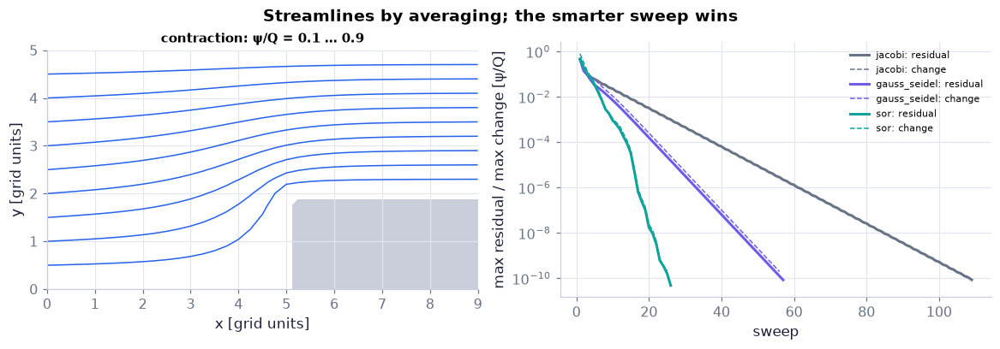

In [103]:
big = ch06.example_6_2(Q=1.0, refine=4, method="direct") # a fine grid for the picture
hists = {m: ch06.example_6_2(Q=1.0, method=m)["history"] for m in ("jacobi", "gauss_seidel", "sor")}   # book grid, three sweeps
fig, (a1, a2) = plt.subplots(1, 2, figsize=(10.5, 3.6))  # streamlines | convergence
Pm = np.where(big["mask"] | ~np.isnan(big["psi"]), big["psi"], np.nan)   # ψ/Q where it is defined
a1.contour(big["X"], big["Y"], Pm, levels=np.linspace(0.1, 0.9, 9), colors=COLORS["blue"], linewidths=1)   # ψ/Q = 0.1 … 0.9
a1.contourf(big["X"], big["Y"], np.isnan(Pm).astype(float), levels=[0.5, 1.5], colors=["#c9ceda"])   # outside the channel
a1.set_aspect("equal"); a1.set_xlabel("x [grid units]"); a1.set_ylabel("y [grid units]")
a1.set_title("contraction: ψ/Q = 0.1 … 0.9", fontsize=10)
for m, col in (("jacobi", COLORS["muted"]), ("gauss_seidel", COLORS["accent"]), ("sor", COLORS["teal"])):
    h_ = hists[m]                                        # residual and change per sweep
    a2.semilogy(np.arange(1, len(h_["residual"]) + 1), h_["residual"], color=col, lw=2, label=f"{m}: residual")
    a2.semilogy(np.arange(1, len(h_["change"]) + 1), h_["change"], color=col, lw=1, ls="--", label=f"{m}: change")
a2.set_xlabel("sweep"); a2.set_ylabel("max residual / max change [ψ/Q]"); a2.legend(fontsize=7)
fig.suptitle("Streamlines by averaging; the smarter sweep wins", fontweight="bold")
savefig(fig, "ch06", "c12_contraction"); plt.show()      # save, then draw

**What you see.** Left, streamlines squeezing from the wide inlet into the narrow outlet round the step; right, straight lines on the log axis with different slopes — solid residuals, dashed changes.

**How to read it.** A straight line on a log axis means a constant factor per sweep, the spectral radius; Gauss–Seidel's slope is about twice Jacobi's (ρ_GS ≈ ρ_J²); SOR is steeper still. Residual and change fall together, and on fine grids both sit far below the true error — hence the tight 10⁻¹⁰ tolerance.

**What would change if…** …the grid refined ×2: Jacobi and Gauss–Seidel need ≈ 4× the sweeps (∝ N²), SOR ≈ 2× (∝ N).

In [104]:
ks = list(range(1, 9)) + [12, 16, 24, 32, 48] if not FAST else [1, 2, 3, 4, 6, 8, 12, 20, 32, 48]   # sweep counts to show
snaps = [ch06.example_6_2(Q=1.0, n_iter=k)["psi"] for k in ks]   # ψ/Q after k Gauss–Seidel sweeps from zero
res = ch06.example_6_2(Q=1.0)["history"]["residual"]    # the residual after each sweep
geo = ch06.example_6_2(Q=1.0)                            # grid coordinates
fig, (a1, a2) = plt.subplots(1, 2, figsize=(8.5, 3.0))   # grid | residual
im = a1.imshow(snaps[0], origin="lower", cmap="Blues", vmin=0, vmax=1)   # ψ/Q on the nodes
a1.set_xlabel("i"); a1.set_ylabel("j"); fig.colorbar(im, ax=a1, label="ψ/Q")
a2.semilogy(np.arange(1, len(res) + 1), res, color=COLORS["muted"], lw=1)   # the whole residual history, faint
dot, = a2.semilogy([1], [res[0]], "o", color=COLORS["accent"])   # where we are
a2.set_xlabel("sweep"); a2.set_ylabel("max residual")
def update(i):                                           # frame i shows sweep ks[i]
    im.set_data(snaps[i])                                # the relaxed values
    dot.set_data([ks[i]], [res[min(ks[i], len(res)) - 1]])   # move the dot
    a1.set_title(f"after {ks[i]} Gauss–Seidel sweeps", fontsize=10)
show_animation(animate(update, frames=len(ks), fig=fig), player="frames")   # step through with the buttons

**What you see.** The grid starts almost empty; the boundary values leak inward sweep by sweep until the colours stop changing; the dot runs down the residual line.

**How to read it.** Each sweep replaces every value by the average of its neighbours (newest first); information spreads about one node per sweep, so large grids need many sweeps.

**What would change if…** …SOR with ω_opt: the colours settle in about a third of the sweeps.

*↪ §6.7 also names source panels — a boundary-only numerical method; our constant-strength source panels (note N90) are taught with the axial singularity method in C14 (§6.8).*

#### 🎮 Interactive: How does a grid solve Laplace's equation?

**Why interactive rather than a static figure:** the method is a process: stepping one node at a time, then whole sweeps, with the residual curve growing beside the grid, makes the average rule and the difference between Jacobi, Gauss–Seidel and SOR visible.

**What to try:**
- Step node by node with Gauss–Seidel on the 4-point problem: the first values are 0, 0.75, 0.75, 3.375.
- Switch to Jacobi and compare the residual slopes.
- Preset 'SOR at ω_opt' on the refined contraction: an order of magnitude fewer sweeps.
- Preset 'ψ = xy': one solve is exact — the harmonic polynomial satisfies (6.72), $\psi_{i,j}=\tfrac14\big[\psi_{i-1,j}+\psi_{i+1,j}+\psi_{i,j-1}+\psi_{i,j+1}\big]$ exactly.

In [105]:
show_viz("ch06", "laplace_relaxation")   # full-width explainer; ⤢ Full screen for more room

[explainer ch06/laplace_relaxation]

**What would change if…** …the right-hand side were not zero — the vorticity of a rotating flow, $\omega_z=-\nabla^2\psi$ *(6.4)*? The same sweeps
solve Poisson's equation with ωh²/4 added to each average (`ls.solve_poisson`). That is how Ch. 10's
vorticity–stream-function method, and ocean models that invert potential vorticity in a closed basin, recover ψ every time
step.

---

## 6.8 Axisymmetric Ideal Flow

**What is this section about?** Flow round a sphere, a bullet or an airship is the same in every plane through the axis.
One stream function — Stokes' — still describes it, but its equation is *not* Laplace's, so complex variables no longer
help; elements are built with φ and ψ in spherical coordinates instead. ⚠️ In this section the symmetry axis z is
horizontal, along the stream.

> 🔁 **Recap — Two stream functions in 3-D** (Ch. 4 §4.3). A general 3-D incompressible flow needs two stream functions, $\rho\mathbf u=\nabla\chi\times\nabla\psi$ *(Eq. 4.12)*; an
axisymmetric one needs only one.

> 🔁 **Recap — Axisymmetric continuity** (Ch. 4 §4.3). In cylindrical coordinates (R, φ, z) with no swirl and no φ-dependence:
$\frac1R\frac{\partial}{\partial R}(Ru_R)+\frac{\partial u_z}{\partial z}=0$ *(Eq. 6.74)*. ⚠️ z is now horizontal, and φ
here is the azimuth angle round the axis (the potential is also written φ — the context tells which).

> 🔁 **Recap — The Stokes stream function** (Ch. 4 §4.3). Choosing χ = −φ (the azimuth angle) in the two-stream-function form gives
$u_R=-\frac1R\frac{\partial\psi}{\partial z},\ u_z=\frac1R\frac{\partial\psi}{\partial R}$ *(Eq. 6.75)*, which satisfies
continuity identically. Same signs as Ch. 4's `velocity_from_streamfunction_axisym`.

In [106]:
print(sf.velocity_from_streamfunction_axisym(lambda R, z: 0.5*2.0*R**2, 0.3, 0.1))   # ψ = ½UR², U = 2 m/s: (u_R, u_z) = (0, 2)

(-0.0, 2.000000000002)


> 🔁 **Recap — The azimuthal vorticity** (App. B; operators recapped in Ch. 4). $\omega_\varphi=\frac{\partial u_R}{\partial z}-\frac{\partial u_z}{\partial R}$ *(Eq. 6.76)* — Appendix B's curl for an
axisymmetric field.

> 🔁 **Recap — The axisymmetric potential** (Ch. 3 §3.4). $u_R=\partial\phi/\partial R,\ u_z=\partial\phi/\partial z$ *(Eq. 6.79)* — u = ∇φ, which exists when
$\boldsymbol\omega=0$ *(Eq. 3.17)*, written in cylindrical coordinates.

> 🔁 **Recap — Cylindrical and spherical coordinates** (Ch. 3 §3.1). (R, φ, z) and (r, θ, φ) with z along the axis: $R=r\sin\theta,\ z=r\cos\theta$ *(Eq. 6.81)*, θ measured from +z
(downstream) — the table the book gives.

> 🔁 **Recap — Spherical continuity** (App. B; operators recapped in Ch. 4). $\frac1r\frac{\partial}{\partial r}(r^2u_r)+\frac1{\sin\theta}\frac{\partial}{\partial\theta}(u_\theta\sin\theta)=0$
*(Eq. 6.82)* — r times Appendix B's divergence
$\frac1{r^2}\frac{\partial}{\partial r}(r^2u_r)+\frac1{r\sin\theta}\frac{\partial}{\partial\theta}(u_\theta\sin\theta)$; the
factor r does not change "= 0".

> 🔁 **Recap — Spherical vorticity** (App. B; operators recapped in Ch. 4). $\omega_\varphi=\frac1r\Big[\frac{\partial}{\partial r}(ru_\theta)-\frac{\partial u_r}{\partial\theta}\Big]$ *(Eq. 6.84)*.

> 🔁 **Recap — Spherical axisymmetric Laplace** (App. B; operators recapped in Ch. 4). $\frac1{r^2}\frac{\partial}{\partial r}\Big(r^2\frac{\partial\phi}{\partial r}\Big)+\frac1{r^2\sin\theta}\frac{\partial}{\partial\theta}\Big(\sin\theta\frac{\partial\phi}{\partial\theta}\Big)=0$
*(Eq. 6.85)* — used in D25's check. Ch. 4's `core.curvilinear` builds this operator symbolically.

In [107]:
from fluidpy.core import curvilinear as cu               # Ch. 4's symbolic operators in curvilinear coordinates
r_, t_, ph_ = cu.coordinates("spherical")                # the module's own symbols r, θ, φ
print(cu.laplacian(r_*sp.cos(t_), "spherical"), cu.laplacian(sp.cos(t_)/r_**2, "spherical"))   # 0 0: stream and 3-D doublet φ are harmonic

0 0


### 🧩 Axisymmetric potential flow: the Stokes stream function, 3-D elements and the sphere `C13`

*The question:* Air flows round a football and round a lamp-post. What changes when the flow can also go *over* the body?

*In one line:* $u_r=U\Big[1-\Big(\frac ar\Big)^3\Big]\cos\theta,\ u_\theta=-U\Big[1+\frac12\Big(\frac ar\Big)^3\Big]\sin\theta$ *(6.90)*

#### The problem in plain words

A lamp-post is effectively 2-D: the air can only go round the sides. A football is 3-D: the air can go round, over and
under, every way at once. That extra freedom should make the disturbance smaller and the fastest speed lower. We want the
numbers — and we find along the way that the tidy complex-variable tools of §6.4–§6.6 do not carry over.

#### The idea

| | cylinder (2-D) | sphere (3-D) |
|---|---|---|
| built from | stream + 2-D doublet | stream + 3-D doublet |
| fastest surface speed | 2U | 1.5U |
| minimum C_p | −3 | −1.25 |
| disturbance decays like | (a/r)² | (a/r)³ |
| stream-function equation | Laplace | (6.77), $\frac{\partial}{\partial R}\Big(\frac1R\frac{\partial\psi}{\partial R}\Big)+\frac1R\frac{\partial^2\psi}{\partial z^2}=-\omega_\varphi=0$, not Laplace |

**The fluid escapes sideways, so it needs to speed up less.**

> 🔁 **Tools from earlier chapters used here** (see `knowledge/primers.md`) — **cylindrical cross products:** $\mathbf e_R\times\mathbf e_\varphi=\mathbf e_z$, $\mathbf e_\varphi\times\mathbf e_z=\mathbf e_R$,
$\mathbf e_z\times\mathbf e_R=\mathbf e_\varphi$ (right-handed, cyclic), so $\mathbf e_\varphi\times\mathbf e_R=-\mathbf e_z$;
**flux of a 3-D point source:** a source of Q m³/s sends Q through every sphere round it, $4\pi r^2u_r=Q$; the 3-D
Taylor series is Ch. 3 P98 and Poisson/Green in 3-D Ch. 5 P139

- **cylindrical and spherical unit vectors** — e_R, e_φ, e_z and e_r, e_θ, e_φ point along increasing coordinates; they change direction from point to point (Ch. 3 P88).

#### 🧮 Derivation — The Stokes stream function and its field equation, which is not Laplace's `D24` (Eq. 6.77: $\frac{\partial}{\partial R}\Big(\frac1R\frac{\partial\psi}{\partial R}\Big)+\frac1R\frac{\partial^2\psi}{\partial z^2}=-\omega_\varphi=0$)

**What we want to show.** Derive the velocity from the axisymmetric (Stokes) stream function and the equation it obeys in irrotational flow — and see why it is not the Laplace equation.

**Assumptions.** Axisymmetric, no swirl (u_φ = 0, nothing depends on φ); irrotational in step 7.

**The plan.**

1. ∇χ.
2. The cross product.
3. Components (6.75), $u_R=-\frac1R\frac{\partial\psi}{\partial z},\ u_z=\frac1R\frac{\partial\psi}{\partial R}$.
4. Substitute into ω_φ.
5. Compare with ∇²ψ.

**Tools we use** (each explained before this point): Stokes stream function (R24) · azimuthal vorticity (R25) · cross products of cylindrical unit vectors (gloss) · cylindrical unit vectors (ch03 P88, reminder).

**We start from**

$$ \begin{array}{l}\mathbf u=\nabla\chi\times\nabla\psi,\ \chi=-\varphi\ \text{(φ here the azimuth angle) and}\ \omega_\varphi=\frac{\partial u_R}{\partial z}-\frac{\partial u_z}{\partial R} \\ \text{(6.76)}\end{array} $$

*In words:* Ch. 4's two-stream-function form with the first chosen as the angle.

---

**Step 1 of 8 — Take the gradient of χ = −φ.**

$$ \nabla\chi=-\frac{1}{R}\mathbf e_\varphi $$

- *Why we can do this:* In cylindrical coordinates the φ-part of the gradient is (1/R)∂/∂φ e_φ, and ∂φ/∂φ = 1.
- *In words:* The first stream function points round the axis.

---

**Step 2 of 8 — Write ∇ψ for an axisymmetric ψ.**

$$ \nabla\psi=\frac{\partial\psi}{\partial R}\mathbf e_R+\frac{\partial\psi}{\partial z}\mathbf e_z $$

- *Why we can do this:* ψ does not depend on φ.
- *In words:* ψ changes only with distance from the axis and along it.

---

**Step 3 of 8 — Cross the two.**

$$ \mathbf u=-\frac1R\,\mathbf e_\varphi\times\Big(\frac{\partial\psi}{\partial R}\mathbf e_R+\frac{\partial\psi}{\partial z}\mathbf e_z\Big) $$

- *Why we can do this:* u = ∇χ × ∇ψ with steps 1–2.
- *In words:* The velocity is perpendicular to both gradients.

---

**Step 4 of 8 — Evaluate the cylindrical cross products.**

$$ u_R=-\frac1R\frac{\partial\psi}{\partial z},\qquad u_z=\frac1R\frac{\partial\psi}{\partial R} $$

- *Why we can do this:* e_φ × e_R = −e_z and e_φ × e_z = e_R because (R, φ, z) is right-handed and cyclic (gloss); the two minus signs combine. This is (6.75), $u_R=-\frac1R\frac{\partial\psi}{\partial z},\ u_z=\frac1R\frac{\partial\psi}{\partial R}$ — the line above.
- *In words:* Axial speed from how ψ grows outward, radial speed from how it changes along the axis.

---

**Step 5 of 8 — Differentiate u_R in z.**

$$ \frac{\partial u_R}{\partial z}=-\frac1R\frac{\partial^2\psi}{\partial z^2} $$

- *Why we can do this:* R is held fixed in ∂/∂z, so 1/R comes out.
- *In words:* The first half of the vorticity.

---

**Step 6 of 8 — Differentiate u_z in R.**

$$ \frac{\partial u_z}{\partial R}=\frac{\partial}{\partial R}\Big(\frac1R\frac{\partial\psi}{\partial R}\Big) $$

- *Why we can do this:* Here 1/R depends on R, so it must stay inside the derivative (product rule, P38).
- *In words:* The second half.

---

**Step 7 of 8 — Substitute into ω_φ and set it zero.**

$$ \frac{\partial}{\partial R}\Big(\frac1R\frac{\partial\psi}{\partial R}\Big)+\frac1R\frac{\partial^2\psi}{\partial z^2}=-\omega_\varphi=0 $$

- *Why we can do this:* (6.76), $\omega_\varphi=\frac{\partial u_R}{\partial z}-\frac{\partial u_z}{\partial R}$ with steps 5–6, the sign flipped; irrotational flow has ω_φ = 0. This is (6.77), $\frac{\partial}{\partial R}\Big(\frac1R\frac{\partial\psi}{\partial R}\Big)+\frac1R\frac{\partial^2\psi}{\partial z^2}=-\omega_\varphi=0$ — the line above.
- *In words:* The field equation of the Stokes stream function.

---

**Step 8 of 8 — Compare with the Laplacian.**

$$ R\times(6.77)=\psi_{RR}-\frac{\psi_R}{R}+\psi_{zz}\ \ne\ \nabla^2\psi=\psi_{RR}+\frac{\psi_R}{R}+\psi_{zz} $$

- *Why we can do this:* Expand ∂/∂R(ψ_R/R) = ψ_RR/R − ψ_R/R² and multiply by R; the first-derivative term has the opposite sign.
- *In words:* Not Laplace's equation — so ψ is not the imaginary part of an analytic function, and complex variables do not apply.

---

**Result**

$$ \begin{array}{l}u_R=-\frac1R\frac{\partial\psi}{\partial z},\ u_z=\frac1R\frac{\partial\psi}{\partial R}\ \text{(6.75) and} \\ \frac{\partial}{\partial R}\Big(\frac1R\frac{\partial\psi}{\partial R}\Big)+\frac1R\frac{\partial^2\psi}{\partial z^2}=0\end{array} $$

*In words:* one stream function still describes axisymmetric flow, but its equation is not Laplace's.

**What it means.** Axisymmetric flows are built from elements in real coordinates (D25), not from complex functions; φ, which does obey Laplace (6.80), $\frac1R\frac{\partial}{\partial R}\Big(R\frac{\partial\phi}{\partial R}\Big)+\frac{\partial^2\phi}{\partial z^2}=0$, stays useful. The zonal-mean overturning streamfunction in climate science has this Stokes geometry.

**Check it.** ψ = ½UR² (uniform stream): (6.77), $\frac{\partial}{\partial R}\Big(\frac1R\frac{\partial\psi}{\partial R}\Big)+\frac1R\frac{\partial^2\psi}{\partial z^2}=-\omega_\varphi=0$ gives ∂/∂R(U) = 0 ✓ while ∇²ψ = 2U ≠ 0. The sphere's ψ (6.89), $\psi=\tfrac12Ur^2\Big(1-\frac{a^3}{r^3}\Big)\sin^2\theta$ passes `stokes_operator_residual`; the control Rz fails it (residual −z/R²; note R²z is itself a solution — axisymmetric stagnation flow) (the code cell after note N75).

> ⚠️ **Common confusion (traps in `D24`):** u_R = −(1/R)∂ψ/∂z carries the minus. The 1/R inside ∂/∂R must not be pulled out.

📝 **Note.** **The field equation of the Stokes stream function** `N75` — in irrotational flow. It is not the Laplacian of ψ, so ψ is not the imaginary part of an analytic function: no complex
potential in axisymmetric flow.

$$ \frac{\partial}{\partial R}\Big(\frac1R\frac{\partial\psi}{\partial R}\Big)+\frac1R\frac{\partial^2\psi}{\partial z^2}=-\omega_\varphi=0 \qquad \text{(6.77)} $$

In [108]:
sph = pf.sphere(1.0, 1.0)                                # the sphere in a stream: U = 1 m/s, a = 1 m
Rq = np.array([0.5, 2.0, 1.5]); Zq = np.array([2.0, -1.0, 0.8])   # three points (R, z) in the fluid [m]
print(ch06.stokes_operator_residual(sph.psi, Rq, Zq))    # ≈ 0: the sphere's ψ satisfies (6.77)
print(ch06.stokes_operator_residual(lambda R, z: R*z, Rq, Zq))   # a control ψ = Rz: residual −z/R², clearly not 0

[-0. -0.  0.]
[-8.      0.25   -0.3556]


📝 **Note.** **Units** `N76` — The Stokes ψ is in m³/s (a volume flow), the plane ψ in m²/s (per unit depth); ψ = const is a surface of revolution.

📝 **Note.** **Flow between two stream surfaces** `N77` — ⚠️ 2π, not 1: dψ is the flow per radian round the axis. The cell compares a quadrature of 2πR u·n ds along a segment
with 2π(ψ₂ − ψ₁):

$$ dQ=2\pi R(\mathbf u\cdot\mathbf n)ds=2\pi R(-u_Rdz+u_zdR)=2\pi\,d\psi \qquad \text{(6.78)} $$

In [109]:
print(ch06.axisym_flux_between(sph.psi, (1.5, 0.0), (3.0, 0.5)))   # (quadrature, 2πΔψ): two equal numbers [m³/s]

(22.295113763074696, 22.295113761262673)


📝 **Note.** **The potential obeys the axisymmetric Laplace equation** `N78`

$$ \frac1R\frac{\partial}{\partial R}\Big(R\frac{\partial\phi}{\partial R}\Big)+\frac{\partial^2\phi}{\partial z^2}=0 \qquad \text{(6.80)} $$

📝 **Note.** **In spherical coordinates** `N79`

$$ u_r=\frac1{r^2\sin\theta}\frac{\partial\psi}{\partial\theta}=\frac{\partial\phi}{\partial r},\ u_\theta=-\frac1{r\sin\theta}\frac{\partial\psi}{\partial r}=\frac1r\frac{\partial\phi}{\partial\theta} \qquad \text{(6.83)} $$

In [110]:
print(pf.axisym_velocity_spherical_sym(sp.Rational(1, 2)*r_**2*sp.sin(t_)**2, r_, t_))   # ψ = ½r²sin²θ (U = 1): (cos θ, −sin θ)

(cos(theta), -sin(theta))


#### 🧮 Derivation — 3-D elements and the sphere: why d = 2πa³U, and C_p = 1 − (9/4) sin²θ `D25` (Eq. 6.91: $C_p=1-\frac94\sin^2\theta$)

**What we want to show.** Build the 3-D point source and doublet from mass conservation and a limit, add a doublet to a stream to make a sphere, and find its surface speed and pressure.

**Assumptions.** Axisymmetric about z (horizontal, along the stream); r > 0.

**The plan.**

1. Check the stream.
2. The point source from its flux.
3. The doublet as a merged pair.
4. Stream + doublet with ψ = 0 on r = a.
5. Surface speed and C_p.

**Tools we use** (each explained before this point): spherical velocities (N79) · flux of a 3-D point source (gloss) · multivariable Taylor (ch03 P98, reminder) · a limit with a product held fixed (primer, in C04) · C_p (N28).

**We start from**

$$ \begin{array}{l}u_r=\frac{1}{r^2\sin\theta}\frac{\partial\psi}{\partial\theta}=\frac{\partial\phi}{\partial r},\ u_\theta=-\frac{1}{r\sin\theta}\frac{\partial\psi}{\partial r}=\frac1r\frac{\partial\phi}{\partial\theta}\ \text{(6.83) and} \\ \text{the uniform stream}\ \phi=Ur\cos\theta,\ \psi=\tfrac12Ur^2\sin^2\theta\ \text{(6.86)}\end{array} $$

*In words:* spherical velocities and the simplest flow.

---

**Step 1 of 10 — Check the uniform stream.**

$$ u_z=\frac1R\frac{\partial}{\partial R}\Big(\tfrac12UR^2\Big)=U,\qquad u_R=0 $$

- *Why we can do this:* (6.75), $u_R=-\frac1R\frac{\partial\psi}{\partial z},\ u_z=\frac1R\frac{\partial\psi}{\partial R}$ with ψ = ½UR²; R = r sin θ turns it into ½Ur² sin²θ. This is (6.86), $\phi=Ur\cos\theta,\ \psi=\tfrac12Ur^2\sin^2\theta$ — the line above.
- *In words:* A stream U along the axis.

---

**Step 2 of 10 — Get the source speed from its flux.**

$$ 4\pi r^2u_r=Q\ \Rightarrow\ u_r=\frac{Q}{4\pi r^2} $$

- *Why we can do this:* All Q m³/s crosses every sphere round the source (gloss).
- *In words:* The outflow thins out over ever larger spheres.

---

**Step 3 of 10 — Integrate for φ and ψ.**

$$ \phi=-\frac{Q}{4\pi r},\qquad\frac{\partial\psi}{\partial\theta}=r^2\sin\theta\,u_r=\frac{Q}{4\pi}\sin\theta\ \Rightarrow\ \psi=-\frac{Q}{4\pi}\cos\theta $$

- *Why we can do this:* ∂φ/∂r = u_r and (6.83), $u_r=\frac1{r^2\sin\theta}\frac{\partial\psi}{\partial\theta}=\frac{\partial\phi}{\partial r},\ u_\theta=-\frac1{r\sin\theta}\frac{\partial\psi}{\partial r}=\frac1r\frac{\partial\phi}{\partial\theta}$ for ψ; constants of integration set to zero. This is (6.87), $\phi=-\frac Q{4\pi r},\ \psi=-\frac Q{4\pi}\cos\theta$ — the line above.
- *In words:* The 3-D source, in both functions.

---

**Step 4 of 10 — Merge a source and a sink along z.**

$$ \phi=-\frac{Q}{4\pi\lvert\mathbf x+\varepsilon\mathbf e_z\rvert}+\frac{Q}{4\pi\lvert\mathbf x-\varepsilon\mathbf e_z\rvert}\approx\frac{Q}{4\pi}\frac{2\varepsilon z}{r^3} $$

- *Why we can do this:* Source at −ε e_z, sink at +ε e_z; Taylor 1/|x ∓ εe_z| ≈ 1/r ± εz/r³ (P98); the 1/r terms cancel.
- *In words:* The pair's potential, to first order in ε.

---

**Step 5 of 10 — Hold d = 2εQ fixed.**

$$ \phi=\frac{d}{4\pi}\frac{z}{r^3}=\frac{d}{4\pi r^2}\cos\theta,\qquad\psi=-\frac{d}{4\pi r}\sin^2\theta $$

- *Why we can do this:* The limit with 2εQ fixed (primer); ψ from (6.83), $u_r=\frac1{r^2\sin\theta}\frac{\partial\psi}{\partial\theta}=\frac{\partial\phi}{\partial r},\ u_\theta=-\frac1{r\sin\theta}\frac{\partial\psi}{\partial r}=\frac1r\frac{\partial\phi}{\partial\theta}$: ∂ψ/∂θ = r² sin θ ∂φ/∂r = −(d/2πr) sin θ cos θ. The dipole is −d e_z. This is (6.88), $\phi=\frac d{4\pi r^2}\cos\theta,\ \psi=-\frac d{4\pi r}\sin^2\theta$ — the line above.
- *In words:* The 3-D doublet.

---

**Step 6 of 10 — Add a stream and an opposing doublet.**

$$ \psi=\tfrac12Ur^2\sin^2\theta-\frac{d}{4\pi r}\sin^2\theta $$

- *Why we can do this:* Superposition (C03); the doublet opposes the stream as for the cylinder (D09).
- *In words:* A stream disturbed by a doublet.

---

**Step 7 of 10 — Make r = a a stream surface.**

$$ \tfrac12Ua^2=\frac{d}{4\pi a}\ \Rightarrow\ d=2\pi a^3U $$

- *Why we can do this:* ψ(a, θ) = 0 for every θ requires the bracket multiplying sin²θ to vanish (D05).
- *In words:* The doublet strength that makes a sphere.

---

**Step 8 of 10 — Substitute back.**

$$ \psi=\tfrac12Ur^2\Big(1-\frac{a^3}{r^3}\Big)\sin^2\theta,\qquad\phi=Ur\Big(1+\frac{a^3}{2r^3}\Big)\cos\theta $$

- *Why we can do this:* d/4πr = ½Ua³/r. This is (6.89), $\psi=\tfrac12Ur^2\Big(1-\frac{a^3}{r^3}\Big)\sin^2\theta$ — the line above.
- *In words:* The flow round a sphere.

---

**Step 9 of 10 — Differentiate for the velocity.**

$$ u_r=U\Big[1-\Big(\frac ar\Big)^3\Big]\cos\theta,\qquad u_\theta=-U\Big[1+\frac12\Big(\frac ar\Big)^3\Big]\sin\theta $$

- *Why we can do this:* (6.83), $u_r=\frac1{r^2\sin\theta}\frac{\partial\psi}{\partial\theta}=\frac{\partial\phi}{\partial r},\ u_\theta=-\frac1{r\sin\theta}\frac{\partial\psi}{\partial r}=\frac1r\frac{\partial\phi}{\partial\theta}$ applied to step 8: ∂ψ/∂r = ½U sin²θ(2r + a³/r²). This is (6.90), $u_r=U\Big[1-\Big(\frac ar\Big)^3\Big]\cos\theta,\ u_\theta=-U\Big[1+\frac12\Big(\frac ar\Big)^3\Big]\sin\theta$ — the line above.
- *In words:* The disturbance dies like (a/r)³ — faster than the cylinder's (a/r)².

---

**Step 10 of 10 — Evaluate on the surface.**

$$ u_\theta(a,\theta)=-\tfrac32U\sin\theta\ \Rightarrow\ C_p=1-\frac94\sin^2\theta $$

- *Why we can do this:* r = a gives u_r = 0 and |u| = (3/2)U|sin θ|; C_p = 1 − |u|²/U² (6.32), $C_p=\frac{p-p_\infty}{\frac12\rho U^2}=1-\frac{\lvert\mathbf u\rvert^2}{U^2}$. This is (6.91), $C_p=1-\frac94\sin^2\theta$ — the line above.
- *In words:* The fastest surface speed is 1.5U, the lowest C_p −1.25.

---

**Result**

$$ \begin{array}{l}\text{Source}\ \phi=-Q/4\pi r\ \text{(6.87), doublet}\ \phi=\frac{d}{4\pi r^2}\cos\theta\ \text{(6.88), sphere with}\ d=2\pi a^3U\ \text{(6.89),} \\ u_\theta=-U[1+\frac12(a/r)^3]\sin\theta\ \text{(6.90),}\ C_p=1-\frac94\sin^2\theta\end{array} $$

*In words:* the 3-D flow escapes sideways, so the sphere disturbs the stream less than the cylinder does.

**What it means.** The sphere is the 3-D reference body: the Stokes-flow comparison of Ch. 8, the separation of Ch. 9, and the added mass of C15 all start here. Still no drag (fore–aft symmetric C_p).

**Check it.** Units: Stokes ψ [m/s × m²] = m³/s ✓, d [m⁴/s] ✓. Numbers: sphere max speed 1.5U, C_p min −1.25 vs cylinder 2U, −3; at r = 2a: 0.125 vs 0.25 ✓ (the code cell after note N84). Spherical Laplace (6.85), $\frac1{r^2}\frac{\partial}{\partial r}\Big(r^2\frac{\partial\phi}{\partial r}\Big)+\frac1{r^2\sin\theta}\frac{\partial}{\partial\theta}\Big(\sin\theta\frac{\partial\phi}{\partial\theta}\Big)=0$ of both potentials = 0 (the code cell under recap R30).

> ⚠️ **Common confusion (traps in `D25`):** φ = −Q/4πr (minus for a source). ψ of the source is −(Q/4π) cos θ plus any constant. The 3-D doublet's ψ has sin²θ, not sin θ.

📝 **Note.** **The 3-D elements (notes `N81`, `N82`)** `N80` — Uniform flow along z: $\phi=Uz,\ \psi=\tfrac12UR^2$ or $\phi=Ur\cos\theta,\ \psi=\tfrac12Ur^2\sin^2\theta$ *(6.86)*; point
source Q [m³/s]: $\phi=-\frac{Q}{4\pi\sqrt{R^2+z^2}},\ \psi=-\frac{Qz}{4\pi\sqrt{R^2+z^2}}$ or
$\phi=-\frac Q{4\pi r},\ \psi=-\frac Q{4\pi}\cos\theta$ *(6.87)*; doublet with dipole −d e_z [m⁴/s]:
$\phi=\frac d{4\pi}\frac{z}{(R^2+z^2)^{3/2}},\ \psi=-\frac d{4\pi}\frac{R^2}{(R^2+z^2)^{3/2}}$ or
$\phi=\frac d{4\pi r^2}\cos\theta,\ \psi=-\frac d{4\pi r}\sin^2\theta$ *(6.88)*. In a plane through the axis their
streamlines look like the 2-D ones.

📝 **Note.** **The sphere** `N83` — = stream + an opposing doublet of strength d = 2πa³U. ψ = 0 on the whole axis and on r = a. Outside, it is the flow round
Hill's spherical vortex seen from the vortex (Ch. 5 §5.4).

$$ \psi=\tfrac12Ur^2\sin^2\theta-\frac{d}{4\pi r}\sin^2\theta=\tfrac12Ur^2\Big(1-\frac{a^3}{r^3}\Big)\sin^2\theta;\quad \phi=Ur\Big(1+\frac{a^3}{2r^3}\Big)\cos\theta \qquad \text{(6.89)} $$

In [111]:
print(sph.psi(1.3, 0.4), 0.5*1.3**2*(1 - 1/np.hypot(1.3, 0.4)**3))   # U = a = 1: ψ = ½R²(1 − a³/r³) since r² sin²θ = R²

0.5091857536922878 0.5091857536922878


📝 **Note.** **Surface speed and pressure** `N84` — With $u_r=U[1-(a/r)^3]\cos\theta$, $u_\theta=-U[1+\frac12(a/r)^3]\sin\theta$ *(6.90)* the surface speed is (3/2)U sin θ,
and the pressure below follows. Fore–aft symmetric: no drag again (the 3-D d'Alembert paradox, an exercise of S06).

$$ C_p=\frac{p-p_\infty}{\frac12\rho U^2}=1-\Big(\frac{u_\theta}{U}\Big)^2=1-\frac94\sin^2\theta \qquad \text{(6.91)} $$

In [112]:
print(ch06.cylinder_vs_sphere(2.0))                      # at r = 2a: disturbance 0.25 vs 0.125; C_p min −3 vs −1.25; max speed 2U vs 1.5U

{'cyl_pert': 0.25, 'sph_pert': 0.125, 'cyl_cp_min': -3.0, 'sph_cp_min': -1.25, 'cyl_speed_max': 2.0, 'sph_speed_max': 1.5}


📝 **Note.** **Without coordinates** `N85` — With x = r e_r, cos θ = e_z·e_r, U = U e_z and d = −d e_z the potential needs no coordinates — valid for a stream in any
direction, the starting point of C15:

$$ \phi=Ur\cos\theta+\frac{d}{4\pi r^2}\cos\theta=\mathbf U\cdot\mathbf x-\frac{\mathbf d\cdot\mathbf x}{4\pi\lvert\mathbf x\rvert^3}=\Big(\mathbf U-\frac{\mathbf d}{4\pi\lvert\mathbf x\rvert^3}\Big)\cdot\mathbf x \qquad \text{(6.92)} $$

In [113]:
xv = np.array([0.3, -1.2, 0.9])                          # a point in 3-D [m]
print(pf.sphere_potential_vector(xv, [0, 0, 1.0], [0, 0, -2*np.pi]), sph.phi(np.hypot(0.3, -1.2), 0.9))   # equal (U = 1, a = 1)

1.0257154712424257 1.0257154712424257


#### ✏️ Tiny example: a football and a lamp-post, both a = 0.11 m, in wind U = 10 m/s

1. Fastest surface speed: lamp-post 2U = 20 m/s; football 1.5U = 15 m/s.
2. Lowest pressure, air ½ρU² = 60 Pa: lamp-post C_p = −3 → −180 Pa; football −1.25 → −75 Pa.
3. At twice the radius (r = 0.22 m) the stream is disturbed by (a/r)² = 25 % past the lamp-post but only (a/r)³ = 12.5 %
   past the ball.
4. Both have zero drag in ideal flow.

In [114]:
sph2 = pf.sphere(10.0, 0.11)                             # a football-sized sphere in a 10 m/s wind
th = np.radians([0, 45, 90, 135, 180])                   # five surface angles from the downstream axis [rad]
print(sph2.velocity_spherical(0.11, th))                 # (u_r, u_θ): u_r ≈ 0, u_θ = −15 sin θ m/s
print(ch06.sphere_surface_cp(th))                        # (6.91): 1, −0.125, −1.25, −0.125, 1
print(np.max(np.abs(sph2.psi(0.11*np.sin(th), 0.11*np.cos(th)))))   # ≈ 0: the sphere is the stream surface ψ = 0

(array([ 0., -0.,  0.,  0.,  0.]), array([  0.    , -10.6066, -15.    , -10.6066,  -0.    ]))
[ 1.    -0.125 -1.25  -0.125  1.   ]
6.938893903907228e-18


**What does the code above do?**

1. The sphere as an axisymmetric flow (stream + 3-D doublet).
2. On the surface the velocity is tangential, 1.5U = 15 m/s at the equator.
3. $C_p=1-\frac94\sin^2\theta$ at five angles.
4. ψ = 0 on the surface.

**From scratch — stream plus doublet, added by hand:**

In [115]:
U, a = 10.0, 0.11                                        # stream [m/s] and radius [m]
d = 2*np.pi*a**3*U                                       # the doublet that makes r = a a stream surface (D25 step 7) [m⁴/s]
r, t = 0.3, 0.7                                          # a point (r [m], θ [rad])
psi_hand = 0.5*U*r**2*np.sin(t)**2 - d/(4*np.pi*r)*np.sin(t)**2   # (6.86) + (6.88)
print(psi_hand)                                          # [m³/s]
assert np.isclose(psi_hand, sph2.psi(r*np.sin(t), r*np.cos(t)))   # = the library's sphere

0.17755094507411426


Stream plus doublet, added by hand, is the library's sphere.

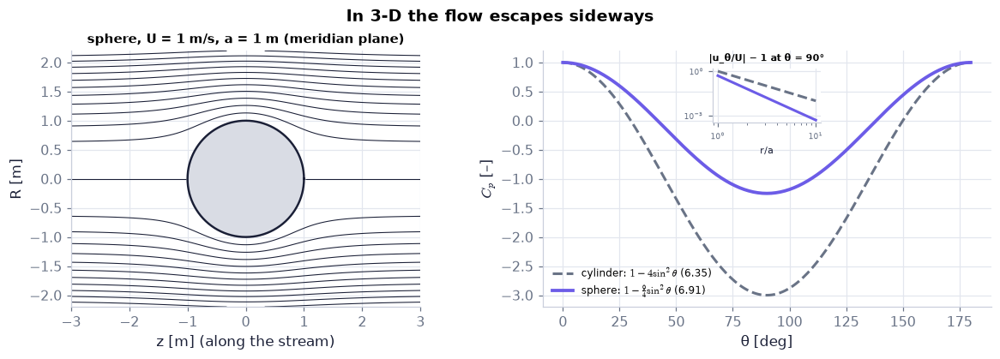

In [116]:
n = 201 if not FAST else 141                             # grid points per side
Zg, Rg = np.meshgrid(np.linspace(-3, 3, n), np.linspace(-2.2, 2.2, n))   # meridian plane: z horizontal, R vertical [m]
Ps = sph.psi(np.abs(Rg), Zg)*np.sign(Rg)                 # Stokes ψ, mirrored below the axis (U = a = 1)
Ps = np.where(np.hypot(Rg, Zg) < 1.0, np.nan, Ps)        # blank inside the sphere
fig, (a1, a2) = plt.subplots(1, 2, figsize=(10.5, 3.7))  # streamlines | pressure
a1.contour(Zg, Rg, Ps, levels=np.linspace(-2.2, 2.2, 23), colors=COLORS["ink"], linewidths=0.7)   # equal Δψ
draw_body(a1, circle(1.0)); a1.set_aspect("equal"); a1.set_xlabel("z [m] (along the stream)"); a1.set_ylabel("R [m]")
a1.set_title("sphere, U = 1 m/s, a = 1 m (meridian plane)", fontsize=10)
thd = np.linspace(0, 180, 181)                           # surface angle [deg]
a2.plot(thd, 1 - 4*np.sin(np.radians(thd))**2, "--", color=COLORS["muted"], lw=2, label=r"cylinder: $1-4\sin^2\theta$ (6.35)")
a2.plot(thd, ch06.sphere_surface_cp(np.radians(thd)), color=COLORS["accent"], lw=2.5, label=r"sphere: $1-\frac{9}{4}\sin^2\theta$ (6.91)")
a2.set_xlabel("θ [deg]"); a2.set_ylabel("$C_p$ [–]"); a2.legend(fontsize=8, loc="lower left")
ins = a2.inset_axes([0.38, 0.72, 0.24, 0.21])             # inset: disturbance at the side against r/a
ra = np.logspace(0, 1, 30)                               # r/a from 1 to 10
ins.loglog(ra, 1/ra**2, "--", color=COLORS["muted"]); ins.loglog(ra, 0.5/ra**3, color=COLORS["accent"])   # cylinder, sphere
ins.set_title("|u_θ/U| − 1 at θ = 90°", fontsize=7); ins.tick_params(labelsize=6); ins.set_xlabel("r/a", fontsize=7)
fig.suptitle("In 3-D the flow escapes sideways", fontweight="bold")
savefig(fig, "ch06", "c13_sphere"); plt.show()           # save, then draw

**What you see.** Left, fore–aft symmetric streamlines round the sphere; right, the sphere's C_p dips only to −1.25 against the cylinder's −3; the inset shows two straight lines with slopes −2 (cylinder) and −3 (sphere).

**How to read it.** The sphere's disturbance is weaker and dies faster: surface speed 1.5U vs 2U, perturbation (a/r)³ vs (a/r)².

**What would change if…** …reading speed from the spacing of equal-Δψ Stokes streamlines: the flux between two of them is 2πΔψ spread over a ring of circumference 2πR, so near the axis they crowd without the flow being fast — read speed from spacing × R, not spacing alone.

In [117]:
thd = np.linspace(0, 180, 181)                           # angle from the downstream axis [deg]
tr = np.radians(thd)                                     # the same in radians
def rel_traces(ra):                                      # |u_θ|/U round a circle / sphere of radius r = ra·a (a = 1)
    return {"cylinder |u_θ|/U": (thd, (1 + 1/ra**2)*np.abs(np.sin(tr))),        # from (6.34)
            "sphere |u_θ|/U": (thd, (1 + 0.5/ra**3)*np.abs(np.sin(tr))),        # from (6.90)
            "far stream": (thd, np.abs(np.sin(tr)))}                            # the undisturbed stream's θ-part
ras = np.linspace(1, 5, 17)                              # r/a values
fig = slider_figure(rel_traces, "r/a", ras, xlabel="θ [deg]", ylabel="|u_θ|/U [–]",
                    title="3-D relief: the sphere's disturbance dies as (a/r)³", yrange=[0, 2.1])
recolor(fig, {"cylinder |u_θ|/U": COLORS["muted"], "sphere |u_θ|/U": COLORS["accent"], "far stream": COLORS["ink"]},
        dashes={"cylinder |u_θ|/U": "dash", "far stream": "dot"})
step_titles(fig, [f"3-D relief: at r = {v:.2f}a the side speed is {1 + 1/v**2:.3f}U (cylinder) vs {1 + 0.5/v**3:.3f}U (sphere)" for v in ras])
fig.show()                                               # draw it (works on the web page too)

**What you see.** Two arches over the dotted far-stream curve: at r = a the cylinder's reaches 2, the sphere's 1.5; dragging r/a outward, the sphere's arch collapses onto the far stream much sooner.

**How to read it.** The extra speed is the disturbance of the body: (a/r)² for the cylinder, ½(a/r)³ for the sphere (the title's numbers).

**What would change if…** …a body of revolution longer than a sphere (an airship, C14): the side disturbance is smaller still.

**What would change if…** …the stream were not along the axis but across it? The flow would no longer be axisymmetric about the stream — but the
sphere is round, so $\phi=\big(\mathbf U-\frac{\mathbf d}{4\pi\lvert\mathbf x\rvert^3}\big)\cdot\mathbf x$ *(6.92)* handles
any direction of U at once. For a non-spherical body we would need the full 3-D problem (Ch. 10 methods, or the
singularity distributions of C14).

### 🧩 Bodies of revolution from axial singularities: the airship and the axial singularity method `C14`

*The question:* An airship hull is drawn on paper. Which sources and sinks, hidden on its axis, produce exactly that shape?

*In one line:* $\psi_m=-\sum_n\frac{k_n}{4\pi}(r^m_{n-1}-r^m_n)+\tfrac12UR_m^2=0$ at N body points (the book's Fig. 6.29
system).

#### The problem in plain words

So far we picked sources and found the body. A designer works the other way: the shape of a hull or a fuselage is given,
and the flow round it is wanted. Hide unknown sources and sinks along the axis, demand that the body be a stream surface
at as many points as there are unknowns, and solve — a linear system. The same "unknown strengths + one condition per
point" idea runs every panel code in aerodynamics.

#### The idea

```
point source Q at the nose + line sink k over length a + stream U   -->  closed airship when Q = ak  (6.95)
inverse: N axial segments of unknown k_n --psi = 0 at N body points--> N x N linear system --> k_n
closure check: sum of k_n * d_xi ~ 0 (sources and sinks cancel, or the body does not close)
```

*The numbered equations in the sketch:* $\psi=-\frac Q{4\pi}\cos\theta+\frac Q{4\pi a}(r-r_1)+\tfrac12Ur^2\sin^2\theta$ *(6.95)*

📝 **Note.** **Closed bodies need zero net source** `N86` — Everything the sources emit must be swallowed again, or fluid would stream out of the body forever (the half-body of C05
is open for that reason). A sink spread over a length gives a gently tapering tail.

> 🔁 **Tools from earlier chapters used here** (see `knowledge/primers.md`) — **the substitution z − ξ = R cot α** with z, R fixed: d(cot α)/dα = −1/sin²α, and this minus cancels the one from
−dξ, so dξ = R dα/sin²α and the limits keep their order (ξ = 0 → a becomes α = θ → α₁); the point-source ψ is note N81
and `brentq` Ch. 3 P108

- **substitution in an integral** — replace the variable, $d\xi=\frac{d\xi}{d\alpha}d\alpha$, and move the limits with it (Ch. 3 P106).
- **scipy.integrate.quad and dblquad** — `quad(f, a, b)` integrates a function numerically to about 1e-10 (Ch. 3 P87).

#### 🧮 Derivation — A line sink and the airship `D26` (Eq. 6.95: $\psi=-\frac Q{4\pi}\cos\theta+\frac Q{4\pi a}(r-r_1)+\tfrac12Ur^2\sin^2\theta$)

**What we want to show.** Add up a uniform line of sinks on the axis in closed form, and combine it with a point source and a stream so that the body closes — the airship.

**Assumptions.** Uniform sink density k [m²/s] on 0 ≤ ξ ≤ a; P = (z, R) off the axis; θ at O, α at the element, α₁ at A are the angles between +z and the lines to P (Fig. 6.28 geometry, our notation as the book's).

**The plan.**

1. One sink element.
2. Sum along the line (6.93), $\psi_{\text{sink}}=\frac k{4\pi}\int_0^a\cos\alpha\,d\xi$.
3. Substitute z − ξ = R cot α and integrate (6.94), $\psi_{\text{sink}}=\frac{kR}{4\pi}\Big[\frac1{\sin\theta}-\frac1{\sin\alpha_1}\Big]=\frac k{4\pi}(r-r_1)$.
4. Close the body and add the stream (6.95), $\psi=-\frac Q{4\pi}\cos\theta+\frac Q{4\pi a}(r-r_1)+\tfrac12Ur^2\sin^2\theta$.

**Tools we use** (each explained before this point): point-source ψ (N81) · substitution in an integral (ch03 P106, reminder) and the cot substitution (gloss) · superposition (C03).

**We start from**

$$ \begin{array}{l}\text{A point source Q at the origin has}\ \psi=-\frac{Q}{4\pi}\cos\theta\ \text{(6.87), θ measured at the source} \\ \text{from +z}\end{array} $$

*In words:* the stream function of one 3-D source.

---

**Step 1 of 10 — Take one sink element kdξ.**

$$ d\psi_{\text{sink}}=+\frac{k\,d\xi}{4\pi}\cos\alpha $$

- *Why we can do this:* A sink is a source of strength −kdξ; (6.87), $\phi=-\frac Q{4\pi r},\ \psi=-\frac Q{4\pi}\cos\theta$ about the element's own position, with α its angle to P, gives the plus sign.
- *In words:* Each short piece of sink contributes like a point sink.

---

**Step 2 of 10 — Add the elements from O to A.**

$$ \psi_{\text{sink}}=\frac{k}{4\pi}\int_0^a\cos\alpha\,d\xi $$

- *Why we can do this:* Superposition: the stream function of a line of sinks is the integral of the elements. This is (6.93), $\psi_{\text{sink}}=\frac k{4\pi}\int_0^a\cos\alpha\,d\xi$ — the line above.
- *In words:* The whole line's stream function, still as an integral.

---

**Step 3 of 10 — Relate ξ to α at fixed P.**

$$ z-\xi=R\cot\alpha $$

- *Why we can do this:* The line from the element (ξ, 0) to P = (z, R) has horizontal run z − ξ and height R; cot α = run/height.
- *In words:* Walking along the sink changes the angle at which P is seen.

---

**Step 4 of 10 — Differentiate at fixed P.**

$$ -d\xi=R\,d(\cot\alpha)=-\frac{R}{\sin^2\alpha}d\alpha\ \Rightarrow\ d\xi=\frac{R\,d\alpha}{\sin^2\alpha} $$

- *Why we can do this:* z and R do not change along the sink; d(cot α)/dα = −1/sin²α (gloss).
- *In words:* A step along the sink is a step in angle.

---

**Step 5 of 10 — Change the limits.**

$$ \xi=0\leftrightarrow\alpha=\theta,\qquad\xi=a\leftrightarrow\alpha=\alpha_1 $$

- *Why we can do this:* At O the angle is θ, at A it is α₁ (Fig. 6.28).
- *In words:* The integral now runs over the angles seen from P.

---

**Step 6 of 10 — Substitute.**

$$ \psi_{\text{sink}}=\frac{kR}{4\pi}\int_\theta^{\alpha_1}\frac{\cos\alpha}{\sin^2\alpha}d\alpha=\frac{kR}{4\pi}\int_\theta^{\alpha_1}\frac{d(\sin\alpha)}{\sin^2\alpha} $$

- *Why we can do this:* Steps 4–5 in (6.93), $\psi_{\text{sink}}=\frac k{4\pi}\int_0^a\cos\alpha\,d\xi$; cos α dα = d(sin α).
- *In words:* An integral we can do at sight.

---

**Step 7 of 10 — Integrate.**

$$ \psi_{\text{sink}}=\frac{kR}{4\pi}\Big[-\frac{1}{\sin\alpha}\Big]_\theta^{\alpha_1}=\frac{kR}{4\pi}\Big[\frac1{\sin\theta}-\frac1{\sin\alpha_1}\Big] $$

- *Why we can do this:* The antiderivative of 1/s² is −1/s (s = sin α); evaluate it between the two limits.
- *In words:* The line sink in closed form.

---

**Step 8 of 10 — Use the geometry R/sin = distance.**

$$ \frac{R}{\sin\theta}=r,\quad\frac{R}{\sin\alpha_1}=r_1\ \Rightarrow\ \psi_{\text{sink}}=\frac{k}{4\pi}(r-r_1) $$

- *Why we can do this:* r and r₁ are the distances from O and A to P; R is the height of P above the axis. This is (6.94), $\psi_{\text{sink}}=\frac{kR}{4\pi}\Big[\frac1{\sin\theta}-\frac1{\sin\alpha_1}\Big]=\frac k{4\pi}(r-r_1)$ — the line above.
- *In words:* The line sink's ψ is k/4π times the difference of the distances to its ends.

---

**Step 9 of 10 — Close the body: Q = ak.**

$$ Q-ak=0 $$

- *Why we can do this:* The line swallows ka m³/s; a closed body cannot emit fluid, so the source must supply exactly that (N86).
- *In words:* Source and sink balance.

---

**Step 10 of 10 — Add the source and the stream.**

$$ \psi=-\frac{Q}{4\pi}\cos\theta+\frac{Q}{4\pi a}(r-r_1)+\tfrac12Ur^2\sin^2\theta $$

- *Why we can do this:* Superposition of (6.87), $\phi=-\frac Q{4\pi r},\ \psi=-\frac Q{4\pi}\cos\theta$, (6.94), $\psi_{\text{sink}}=\frac{kR}{4\pi}\Big[\frac1{\sin\theta}-\frac1{\sin\alpha_1}\Big]=\frac k{4\pi}(r-r_1)$ with k = Q/a, and (6.86), $\phi=Ur\cos\theta,\ \psi=\tfrac12Ur^2\sin^2\theta$. This is (6.95), $\psi=-\frac Q{4\pi}\cos\theta+\frac Q{4\pi a}(r-r_1)+\tfrac12Ur^2\sin^2\theta$ — the line above.
- *In words:* The airship's stream function; its body is the stream surface through the axis stagnation points.

---

**Result**

$$ \psi_{\text{sink}}=\frac{k}{4\pi}(r-r_1)\ \text{(6.94) and}\ \psi=-\frac{Q}{4\pi}\cos\theta+\frac{Q}{4\pi a}(r-r_1)+\frac12Ur^2\sin^2\theta $$

*In words:* a point source at the nose and a uniform line sink behind it, in a stream, draw a closed streamlined hull.

**What it means.** Distributing the sink tapers the tail; a non-uniform k(ξ) would draw other shapes — which D27 turns into a design method.

**Check it.** Closed form = `quad` of (6.93), $\psi_{\text{sink}}=\frac k{4\pi}\int_0^a\cos\alpha\,d\xi$ to 1e-10 (the code cell after the tiny example of C14) ✓. Numbers: Q = 1 m³/s, a = 1 m, U = 1 m/s → k = 1 m²/s, nose at z = −0.252 m, tail at 1.070 m, length 1.322 m (`brentq` on u_z = 0 along the axis) ✓. Far from the line (r ≫ a) r − r₁ → a cos θ and ψ_sink → (ka/4π) cos θ = −ψ of a point source Q: the source is cancelled far away ✓.

> ⚠️ **Common confusion (traps in `D26`):** A sink's dψ has the opposite sign of a source's. The minus sign of d(cot α) = −dα/sin²α is cancelled by the one in −dξ: do not flip the limits (ξ = 0 → a becomes α = θ → α₁, in the same order). R/sin θ = r and R/sin α₁ = r₁ (distances, not heights).

📝 **Note.** **The line sink and the airship (notes `N88`, `N89`)** `N87` — An element k dξ of a line sink of density k [m²/s] on the axis contributes dψ = (k dξ/4π) cos α (the opposite sign of a
source (6.87), $\phi=-\frac Q{4\pi r},\ \psi=-\frac Q{4\pi}\cos\theta$), so $\psi_{\text{sink}}=\frac k{4\pi}\int_0^a\cos\alpha\,d\xi$ *(6.93)*, which the substitution turns into
$\psi_{\text{sink}}=\frac{kR}{4\pi}\Big[\frac1{\sin\theta}-\frac1{\sin\alpha_1}\Big]=\frac k{4\pi}(r-r_1)$ *(6.94)*; with a
point source Q at O, k = Q/a and the stream, the airship is the ψ below. Q = 1 m³/s, a = 1 m → k = 1 m²/s.

$$ \psi=-\frac Q{4\pi}\cos\theta+\frac Q{4\pi a}(r-r_1)+\tfrac12Ur^2\sin^2\theta \qquad \text{(6.95)} $$

#### ✏️ Tiny example: a small airship

Q = 1 m³/s, a = 1 m, U = 1 m/s.

1. Closure: k = Q/a = 1 m²/s, so the sink swallows 1 × 1 = 1 m³/s = Q ✓.
2. Nose: on the axis ahead of O the source's push Q/4πz² nearly balances U; with the line sink's pull the stagnation
   point is at z = −0.252 m (a pure source would give −√(Q/4πU) = −0.282 m).
3. Tail: just behind the sink's end, z = 1.070 m.
4. Length 1.322 m — `brentq` on u_z(z) = 0 along the axis.

In [118]:
Rq = np.array([0.1, 0.3]); Zq = np.array([0.4, -0.5])     # two points (R, z) [m]
print(ch06.line_sink_stream_function(Rq, Zq, 1.0, 1.0), ch06.line_sink_stream_function(Rq, Zq, 1.0, 1.0, method="quad"))   # (6.94) vs quad of (6.93)
A_s = ch06.airship(1.0, 1.0, 1.0)                        # U = 1 m/s, Q = 1 m³/s, a = 1 m
print(f"nose {A_s['stagnation_front']:.4f} m, tail {A_s['stagnation_rear']:.4f} m, length {A_s['length']:.4f} m, "
      f"max radius {A_s['R_max']:.4f} m, closure Q − ak = {A_s['closure']}")

[-0.0156 -0.0753] [-0.0156 -0.0753]
nose -0.2521 m, tail 1.0696 m, length 1.3217 m, max radius 0.3847 m, closure Q − ak = 0.0


**What does the code above do?**

1. The closed form (6.94), $\psi_{\text{sink}}=\frac{kR}{4\pi}\Big[\frac1{\sin\theta}-\frac1{\sin\alpha_1}\Big]=\frac k{4\pi}(r-r_1)$ against a numerical integral of (6.93), $\psi_{\text{sink}}=\frac k{4\pi}\int_0^a\cos\alpha\,d\xi$: equal.
2. The airship's nose and tail from the axis stagnation points (`brentq` on u_z = 0), its thickness from the ψ = 0
   surface, and the closure Q − ak = 0.

> 📎 **Primer — collocation and the condition number.** `P162` · To pin down N unknown strengths, demand the condition (here ψ = 0) at N chosen points: N equations, N unknowns —
**collocation**. How trustworthy the answer is depends on the matrix: `np.linalg.cond(A)` is the factor by which relative
errors in the data can grow in the solution. Around 10³ is harmless; above 10¹⁰ the digits are noise. `np.vander` below
builds a matrix of powers, famous for being ill-conditioned.

In [119]:
for N in (4, 8, 16):                                     # three sizes
    x = np.linspace(0, 1, N)                             # N collocation points
    V = np.vander(x, N)                                  # a notoriously ill-conditioned matrix (powers of x)
    print(N, f"{np.linalg.cond(V):.1e}")                 # grows explosively with N

4 9.9e+01
8 2.7e+05
16 3.1e+12


#### 🧮 Derivation — The axial singularity method: N unknown strengths from ψ = 0 at N body points `D27`

**What we want to show.** Turn the airship construction round: for a given body of revolution, find the strengths of sources and sinks on its axis that make the body a stream surface.

**Assumptions.** Body of revolution; singularities on the axis inside it; N body points ↔ N segments.

**The plan.**

1. One segment's ψ at a body point.
2. Sum and add the stream.
3. Demand ψ = 0 at N points.
4. Solve and check closure.

**Tools we use** (each explained before this point): (6.94), $\psi_{\text{sink}}=\frac{kR}{4\pi}\Big[\frac1{\sin\theta}-\frac1{\sin\alpha_1}\Big]=\frac k{4\pi}(r-r_1)$ (D26) · collocation and the condition number (primer, in C14) · `np.linalg.solve` (ch01 P57, reminder).

**We start from**

$$ (6.94)\quad \psi_{\text{sink}}=\frac{kR}{4\pi}\Big[\frac1{\sin\theta}-\frac1{\sin\alpha_1}\Big]=\frac k{4\pi}(r-r_1) $$

*In words:* D26's line, cut into N pieces with unknown strengths.

---

**Step 1 of 6 — Write one source segment's ψ.**

$$ \psi_{mn}=-\frac{k_n}{4\pi}\big(r^m_{n-1}-r^m_n\big) $$

- *Why we can do this:* (6.94), $\psi_{\text{sink}}=\frac{kR}{4\pi}\Big[\frac1{\sin\theta}-\frac1{\sin\alpha_1}\Big]=\frac k{4\pi}(r-r_1)$ is for a sink from its start to its end; a source has the opposite sign; r^m_{n−1}, r^m_n are the distances from body point m to the segment's ends.
- *In words:* Each segment's contribution at each body point.

---

**Step 2 of 6 — Superpose N segments and the stream.**

$$ \psi_m=-\sum_{n=1}^N\frac{k_n}{4\pi}\big(r^m_{n-1}-r^m_n\big)+\tfrac12UR_m^2 $$

- *Why we can do this:* Superposition (C03) with the uniform stream ψ = ½UR² (6.86), $\phi=Ur\cos\theta,\ \psi=\tfrac12Ur^2\sin^2\theta$.
- *In words:* ψ at body point m as a sum of N unknown pieces.

---

**Step 3 of 6 — Demand the body be ψ = 0.**

$$ \psi_m=0,\qquad m=1,\dots,N $$

- *Why we can do this:* The axis ahead of and behind the body has ψ = 0; the body surface joins it, so it is the same stream surface. Collocation: one condition per unknown (primer).
- *In words:* N equations for N strengths.

---

**Step 4 of 6 — Write it as a matrix system.**

$$ \sum_nA_{mn}k_n=\tfrac12UR_m^2,\qquad A_{mn}=\frac{r^m_{n-1}-r^m_n}{4\pi} $$

- *Why we can do this:* Move the stream term to the right; the geometry-only coefficients form the influence matrix A.
- *In words:* A linear system: shape in A, stream on the right.

---

**Step 5 of 6 — Solve for the strengths.**

$$ \mathbf k=A^{-1}\big(\tfrac12U\mathbf R^2\big) $$

- *Why we can do this:* A is square and (for smooth slender bodies) invertible; `np.linalg.solve` or, as the book suggests, the iteration of §6.7.
- *In words:* One solve gives every segment's strength.

---

**Step 6 of 6 — Check closure and conditioning.**

$$ \sum_nk_n\Delta\xi\approx0,\qquad\text{cond}(A) $$

- *Why we can do this:* A closed body must have zero net source (N86) — a free check, since it was not imposed; a large condition number warns that blunt bodies make the system nearly singular.
- *In words:* The strengths should cancel; if cond is huge, trust the shape, not the bars.

---

**Result**

$$ \begin{array}{l}\psi_m=-\sum_{n=1}^N\frac{k_n}{4\pi}(r^m_{n-1}-r^m_n)+\frac12UR_m^2=0\ \text{at N body points — an N × N linear system for the} \\ \text{axial strengths}\end{array} $$

*In words:* hide unknown sources on the axis, ask for a streamline at N points, solve.

**What it means.** The inverse ("design") method of the chapter and the ancestor of panel methods (N90, Ch. 14): unknown strengths + one condition per point + a linear solve.

**Check it.** Rankine-oval target (the code cell after this derivation): the body error falls (2.5e-3, 1.7e-4, 1.8e-6 for N = 10, 20, 40) and Σk_nΔξ → 0, but the individual k_n **alternate in sign** and grow (about ±5, ±10, ±19): only their sums and moments (the net source, the dipole) converge, not the bars themselves ✓. The condition number climbs from ~3×10³ to ~2×10¹², so N = 40 is the sensible ceiling here. Airship target: the fitted bars do not reproduce the point source and flat line sink of (6.95), $\psi=-\frac Q{4\pi}\cos\theta+\frac Q{4\pi a}(r-r_1)+\tfrac12Ur^2\sin^2\theta$ — many strength patterns draw almost the same surface. Sphere: small residual but cond ≈ 10¹⁸ — qualitative only.

> ⚠️ **Common confusion (traps in `D27`):** Source vs sink sign. ψ = 0 on the axis and on the body is one surface. Blunt bodies (a sphere is a point doublet) make A ill-conditioned as N grows.

In [120]:
zb, Rb = ch06.axisym_body_target("rankine_oval", N=40)   # 40 points on a target body (a 3-D Rankine oval) [m]
sol = pn.axial_singularity_solve(zb, Rb, U=1.0, N=40)    # the N × N collocation system of D27, solved
print(f"cond {sol['cond']:.1e}, net strength Σk_nΔξ = {sol['net_strength']:.1e} m³/s, max residual {np.max(np.abs(sol['residual'])):.1e}")
for N in (10, 20, 40):                                   # more segments (N = 40 is the ceiling: beyond it cond(A) > 10¹²)
    s = ch06.axial_state("rankine_oval", N=N)            # body error, net strength, condition number, strength range
    print(f"N = {N:2d}: body error {s['body_error']:.1e}, Σk_nΔξ {s['net_strength']:+.1e}, cond {s['cond']:.1e}, "
          f"k from {s['k_min']:.1f} to {s['k_max']:.1f} m²/s")
print("sphere target:", ch06.axial_state("sphere", N=40))   # a blunt body: tiny residual, but cond ≈ 1e18

cond 2.3e+12, net strength Σk_nΔξ = 3.6e-06 m³/s, max residual 5.6e-17
N = 10: body error 2.5e-03, Σk_nΔξ -2.6e-14, cond 2.7e+03, k from -5.3 to 5.3 m²/s
N = 20: body error 1.7e-04, Σk_nΔξ +1.4e-11, cond 3.3e+06, k from -9.6 to 9.6 m²/s
N = 40: body error 1.8e-06, Σk_nΔξ +3.6e-06, cond 2.3e+12, k from -18.6 to 18.6 m²/s


sphere target: {'cond': 1.8097608344291702e+18, 'net_strength': 62.80416665075131, 'body_error': 1.7516441618292689e-06, 'k_max': 20442.527182429, 'k_min': -18258.74737547084}


**What does the code above do?**

1. `axisym_body_target` samples a target body; `axial_singularity_solve` builds the influence matrix of D27 step 4 and
   solves it: the residual at the collocation points is round-off.
2. With more segments the body is drawn more accurately (the body error falls from 2.5×10⁻³ to 1.8×10⁻⁶) and the net
   strength Σk_nΔξ stays ≈ 0 — the body closes. **But** the individual strengths k_n alternate in sign and grow (about
   ±5, ±10, ±19 m²/s): only their sums and moments (net source, dipole) converge, not the bars themselves; the condition
   number climbs to ~10¹², so N = 40 is a sensible ceiling here.
3. The sphere: the residual is still small, but the condition number is ~10¹⁸ and the strengths are huge — a sphere's
   exact "source" is a point doublet, which a smooth line of sources cannot copy. Qualitative only.

**From scratch — the influence matrix by our own double loop:**

In [121]:
N = 20                                                   # number of segments
zb, Rb = ch06.axisym_body_target("rankine_oval", N=N)    # 20 body points [m]
xi = pn.axial_singularity_solve(zb, Rb, U=1.0, N=N)["z_nodes"]   # the library's segment ends (N + 1 nodes) [m]
A_ = np.zeros((N, N))                                    # influence matrix
for m_ in range(N):                                      # body point m
    for n_ in range(N):                                  # segment n
        r0 = np.hypot(zb[m_] - xi[n_], Rb[m_])           # distance to the segment's start [m]
        r1 = np.hypot(zb[m_] - xi[n_ + 1], Rb[m_])       # distance to its end [m]
        A_[m_, n_] = (r0 - r1)/(4*np.pi)                 # unit source segment, minus sign moved to the right (D27 step 4)
k = np.linalg.solve(A_, 0.5*1.0*Rb**2)                   # strengths from ψ = 0 at the 20 points, U = 1 m/s [m²/s]
assert np.allclose(k, pn.axial_singularity_solve(zb, Rb, U=1.0, z_nodes=xi)["k"])   # = the library's strengths
print(np.round(k[:6], 3))                                # the first few: alternating signs — only their sums and moments converge

[-0.165  1.132  9.593 -4.819  3.932 -3.636]


Our own N × N matrix gives the library's strengths.

📝 **Note.** **The same idea on the body surface (our extension, not in the book)** `N90` — Cover a 2-D body with N straight panels carrying unknown uniform source strengths λ_j, demand u·n = 0 at each panel's
midpoint, and solve (Hess & Smith 1967). On a **circle** these constant-strength panels are exact at every N (the midpoint
C_p equals 1 − 4 sin²θ of (6.35), $C_p(r=a,\theta)=1-4\sin^2\theta$ to round-off); on an **ellipse** the midpoint C_p converges with error ∝ 1/N² (verified
order 2.06); Σλ_j s_j = 0 (a closed body). Off the body the panel velocity converges only at first order.

In [122]:
Ns = np.array([8, 16, 32, 64])                           # numbers of panels
e_ell = [ch06.panel_cp_error(N) for N in Ns]             # max C_p error at the panel midpoints on an ellipse (axes 1 and 0.5 m)
e_cir = [ch06.panel_cp_error(N, body="circle") for N in Ns]   # the same on a circle
print("ellipse:", np.array(e_ell), f"order {observed_order(1/Ns, e_ell):.2f}")   # falls ≈ ×4 per doubling: order ≈ 2
print("circle: ", np.array(e_cir))                       # round-off at every N: exact

ellipse: [0.037  0.0142 0.003  0.0007] order 1.93
circle:  [0. 0. 0. 0.]


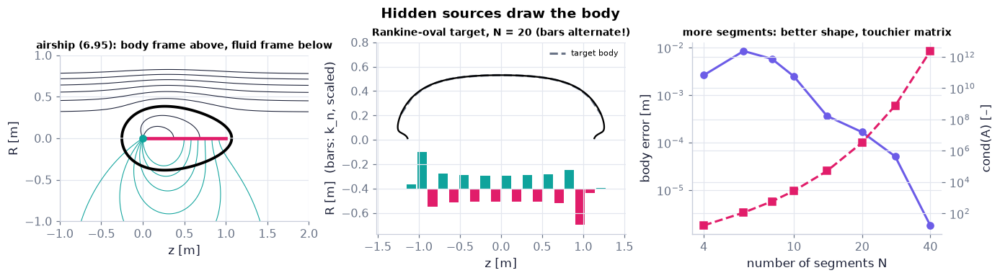

In [123]:
fig, axs = plt.subplots(1, 3, figsize=(12.5, 3.4))       # airship | target and strengths | convergence
n = 201 if not FAST else 141                             # grid points per side
Zg, Rg = np.meshgrid(np.linspace(-1.0, 2.0, n), np.linspace(0.005, 1.0, n))   # upper meridian half-plane [m]
Pa = A_s["psi_fn"](Rg, Zg)                               # airship ψ in the body frame [m³/s]
axs[0].contour(Zg, Rg, Pa, levels=np.linspace(-0.3, 0.3, 13), colors=COLORS["ink"], linewidths=0.7)   # streamlines
axs[0].contour(Zg, Rg, Pa, levels=[0.0], colors="k", linewidths=2.5)   # the body ψ = 0
Pf = A_s["psi_fluid_frame"](Rg, Zg)                      # the same body seen from still fluid (stream subtracted)
axs[0].contour(Zg, -Rg, Pf, levels=np.linspace(-0.08, 0.08, 13), colors=COLORS["teal"], linewidths=0.7)   # mirrored below
axs[0].contour(Zg, -Rg, Pa, levels=[0.0], colors="k", linewidths=2.5)
axs[0].plot([0, 1], [0, 0], color=COLORS["rose"], lw=3); axs[0].plot([0], [0], "o", color=COLORS["teal"])   # sink line, source
axs[0].set_aspect("equal"); axs[0].set_xlabel("z [m]"); axs[0].set_ylabel("R [m]")
axs[0].set_title("airship (6.95): body frame above, fluid frame below", fontsize=9)
N = 20                                                   # a clean case for the bars
zb, Rb = ch06.axisym_body_target("rankine_oval", N=N); sol = pn.axial_singularity_solve(zb, Rb, U=1.0, N=N)
axs[1].plot(zb, Rb, "--", color=COLORS["muted"], lw=2, label="target body")   # the target
Zc, Rc = np.meshgrid(np.linspace(zb.min() - 0.3, zb.max() + 0.3, n), np.linspace(0.005, 0.8, n))   # grid for the computed body
axs[1].contour(Zc, Rc, pn.axial_singularity_psi(sol, Rc, Zc), levels=[0.0], colors="k", linewidths=1.5)   # computed ψ = 0
xm = 0.5*(sol["z_nodes"][1:] + sol["z_nodes"][:-1])      # segment midpoints [m]
kk = sol["k"]/np.max(np.abs(sol["k"]))*0.3               # strengths, scaled for display
axs[1].bar(xm, kk, width=np.diff(sol["z_nodes"])*0.9, bottom=-0.4, color=[COLORS["teal"] if v > 0 else COLORS["rose"] for v in kk])
axs[1].set_xlabel("z [m]"); axs[1].set_ylabel("R [m]  (bars: k_n, scaled)"); axs[1].legend(fontsize=7)
axs[1].set_title("Rankine-oval target, N = 20 (bars alternate!)", fontsize=9)
NN = np.array([4, 6, 8, 10, 14, 20, 28, 40])             # numbers of segments
st = [ch06.axial_state("rankine_oval", N=int(k_)) for k_ in NN]   # error and conditioning for each
axs[2].loglog(NN, [s["body_error"] for s in st], "o-", color=COLORS["accent"], label="body error")
ax2b = axs[2].twinx(); ax2b.loglog(NN, [s["cond"] for s in st], "s--", color=COLORS["rose"], label="condition number")
axs[2].set_xlabel("number of segments N"); axs[2].set_ylabel("body error [m]"); ax2b.set_ylabel("cond(A) [–]")
axs[2].set_xticks([4, 10, 20, 40]); axs[2].set_xticklabels(["4", "10", "20", "40"]); axs[2].minorticks_off()   # plain tick labels
axs[2].set_title("more segments: better shape, touchier matrix", fontsize=9)
fig.suptitle("Hidden sources draw the body", fontweight="bold")
savefig(fig, "ch06", "c14_axial"); plt.show()            # save, then draw

**What you see.** Left, a streamlined hull round a teal source and a rose line sink, and below it the same body seen from still fluid: loops from nose to tail. Centre, the computed ψ = 0 surface on top of the dashed target, and bars that alternate teal/rose. Right, the body error falling while the condition number climbs.

**How to read it.** Sources push the flow out at the nose, sinks let it close at the tail; the bars sum to zero. The bars themselves zig-zag: many strength patterns draw almost the same surface, so trust the shape and the sums, not the individual bars. More segments fit the shape better but make the system touchier.

**What would change if…** …a blunter target (the sphere): the error plateaus and the condition number explodes — its exact source is a point doublet, which a smooth line of sources cannot copy.

In [124]:
Nv = np.arange(4, 42, 2) if not FAST else np.arange(4, 42, 4)   # segment numbers, capped at 40 (beyond it the matrix is too ill-conditioned)
cache = {}                                               # solve each N once
def axial_traces(Nf):                                    # target, computed body and scaled strengths for N segments
    N = int(round(Nf))
    zb, Rb = ch06.axisym_body_target("rankine_oval", N=N)   # target points
    sol = pn.axial_singularity_solve(zb, Rb, U=1.0, N=N)    # strengths
    zz = np.linspace(zb.min() - 0.05, zb.max() + 0.05, 200)   # z along the body [m]
    Rgrid = np.linspace(0.005, 0.8, 200)                 # trial radii [m]
    Pz = pn.axial_singularity_psi(sol, Rgrid[:, None], zz[None, :])   # ψ on a (R, z) grid
    Rsurf = np.array([Rgrid[np.argmax(Pz[:, j] > 0)] if np.any(Pz[:, j] > 0) else np.nan for j in range(zz.size)])   # first R with ψ > 0
    xn = sol["z_nodes"]; kstep = np.repeat(sol["k"], 2)/np.max(np.abs(sol["k"]))*0.3 - 0.4   # strengths as a step line
    cache[N] = ch06.axial_state("rankine_oval", N=N)
    return {"target": (zb, Rb), "computed ψ = 0": (zz, Rsurf), "k_n (scaled)": (np.repeat(xn, 2)[1:-1], kstep)}
fig = slider_figure(axial_traces, "N", Nv, xlabel="z [m]", ylabel="R [m]", title="The inverse method converging",
                    yrange=[-0.8, 0.8])
recolor(fig, {"target": COLORS["muted"], "computed ψ = 0": COLORS["ink"], "k_n (scaled)": COLORS["teal"]},
        dashes={"target": "dash"})
step_titles(fig, [f"The inverse method converging: N = {int(v)}, body error {cache[int(v)]['body_error']:.1e} m, "
                  f"cond {cache[int(v)]['cond']:.1e}" for v in Nv])
fig.show()                                               # draw it (works on the web page too)

**What you see.** The computed surface (black) settles onto the dashed target as N grows, while the teal step line of strengths zig-zags more and more.

**How to read it.** The shape converges; the individual strengths do not — only their net and their moments do. The title's condition number says how much the solution amplifies round-off.

**What would change if…** …N pushed beyond 40: the condition number passes 10¹² and the bars become noise (the explainer caps N there).

#### 🎮 Interactive: Given a shape, which sources draw it?

**Why interactive rather than a static figure:** convergence is a sequence, not a picture: raise N and watch the computed ψ = 0 surface snap onto the target while the k_n bars change and the condition number climbs; switch to panels to see the same idea on a 2-D body's surface.

**What to try:**
- Preset 'airship (6.95), $\psi=-\frac Q{4\pi}\cos\theta+\frac Q{4\pi a}(r-r_1)+\tfrac12Ur^2\sin^2\theta$': compare the fitted bars with the exact point source and flat line sink — the surfaces agree, the bars need not.
- Target 'Rankine oval', N from 4 to 40: the error falls, cond rises, the bars alternate in sign.
- Target 'sphere': the ⚠️ status shows why a blunt body is hard.
- Mode 'panels': on a circle C_p is exact at every N; on the ellipse it converges like 1/N².

In [125]:
show_viz("ch06", "axial_singularity_bodies")   # full-width explainer; ⤢ Full screen for more room

[explainer ch06/axial_singularity_bodies]

**What would change if…** …we used vortices on the axis or on the surface instead of sources? Sources give thickness but no lift; vortex panels add
circulation — the lifting version is how Ch. 14's panel codes compute an airfoil's lift (with the Kutta condition fixing
the total Γ).

---

## 6.9 Three-Dimensional Potential Flow and Apparent Mass

**What is this section about?** Steady ideal flow gives no drag in 3-D either. But when a body *accelerates*, the fluid
round it must be accelerated too, and the pressure field that does this pushes back on the body. For a sphere the push
is exactly that of an extra half of the displaced fluid's mass: the added (or apparent) mass.

> 🔁 **Recap — The 3-D potential** (Ch. 3 §3.4). When $\boldsymbol\omega=0$ *(Eq. 3.17)*, u = ∇φ with all three components, so the z-component is w ≡ ∂φ/∂z. ⚠️ In this
section w is a velocity component, not the complex potential of §6.4.

> 🔁 **Recap — Unsteady Bernoulli between the surface and far away** (Ch. 4 §4.9). For unsteady irrotational flow of constant density with the fluid at rest and at pressure p∞ far away:
$\Big[\frac{\partial\phi}{\partial t}+\frac12\lvert\nabla\phi\rvert^2+\frac p\rho\Big]_{\text{sphere's surface}}=\frac{p_\infty}{\rho}$
*(Eq. 6.99, from 4.75), $\frac{\partial\phi}{\partial t}+\tfrac12\lvert\nabla\phi\rvert^2+\int_{p_o}^{p}\frac{dp'}{\rho(p')}+gz=\text{const}$*. ⚠️ ∂φ/∂t is taken at a *fixed* point in space. Ch. 4's `unsteady_bernoulli_pressure` returns p
from ∂φ/∂t and the speed.

In [126]:
print(be.unsteady_bernoulli_pressure(dphi_dt=-0.05, speed=1.0, rho=1000.0, g=0.0, C=0.0))   # p = −ρ(∂φ/∂t + ½|u|²) = −450 Pa

-450.0


### 🧩 The accelerating sphere: surface pressure and added mass `C15`

*The question:* An ideal fluid exerts no drag on a steadily moving body. So why is it hard to shake a ball under water — and why does a
released bubble not shoot up infinitely fast?

*In one line:* $\mathbf F_E=\Big(m+\frac{2\pi}{3}\rho a^3\Big)\frac{d\mathbf u_s}{dt}$ *(6.109)*

#### The problem in plain words

Push a beach ball under water and let go: it accelerates up, but far less violently than its tiny mass would suggest. A
bubble has almost no mass, yet it does not leave with infinite acceleration. A submarine, a fish, a kite and a ship in
waves all feel the same effect: to speed up, a body must also speed up the fluid it pushes aside.

#### The idea

```
pressure on a moving sphere = steady part (~ speed^2, symmetric front/back)     --> no net force (d'Alembert)
                            + acceleration part (~ du_s/dt, + in front, - behind) --> force  -M du_s/dt
M = 1/2 x (mass of the displaced fluid) = (2 pi / 3) rho a^3        -->   F_E = (m + M) du_s/dt
```

📝 **Note.** **3-D d'Alembert and beyond** `N91` — A closed body moving steadily through ideal fluid feels no drag in 3-D too (an exercise of S06); forces appear when the
motion is unsteady or vorticity is present (Ch. 14). The inertia of the fluid is what vehicles, fish and bubbles feel:
apparent or added mass.

📝 **Note.** **The set-up** `N92` — A sphere of radius a sits at $\mathbf x_s(t)$ and moves with velocity $\mathbf u_s=d\mathbf x_s/dt$ and a known
acceleration $d\mathbf u_s/dt$; the fluid is at rest far away at pressure p∞; an external force $\mathbf F_E$ (a push, or
buoyancy minus weight) acts on the sphere; we want the fluid's force $\mathbf F_s$ on it. Think of a submarine or a fish
manoeuvring.

```
          fluid at rest, p = p_inf far away
                 .-----.
   F_E  ---->   (  x_s  )  ---> u_s(t),  du_s/dt
                 '-----'         xi = x - x_s,  e_xi = xi/|xi|
```

> 🔁 **Tools from earlier chapters used here** (see `knowledge/primers.md`) — Galilean frames are Ch. 3 §3.3 (recap R14); the coordinate-free sphere potential (6.92), $\phi=\Big(\mathbf U-\frac{\mathbf d}{4\pi\lvert\mathbf x\rvert^3}\Big)\cdot\mathbf x$ is note N85;
**a function of x − x_s:** ∂/∂x_s = −∇; **∇ of u·ξ/|ξ|³:** product rule with ∇(u·ξ) = u and ∇|ξ|⁻³ = −3ξ/|ξ|⁵ (the
gradient of 1/distance, Ch. 5 P140)

- **multivariable chain rule along a path** — if f depends on t through x(t), $\frac{df}{dt}=\frac{\partial f}{\partial x_i}\frac{dx_i}{dt}$ summed over i (Ch. 3 P91).

#### 🧮 Derivation — The potential of a moving sphere: d(t) = 2πa³u_s `D28` (Eq. 6.97: $\phi=-\frac{a^3}{2\lvert\boldsymbol\xi\rvert^3}\mathbf u_s\cdot\boldsymbol\xi$)

**What we want to show.** Write the velocity potential of a sphere moving through still fluid with an arbitrary velocity u_s(t), and check that the fluid moves with the sphere's surface.

**Assumptions.** Rigid sphere; fluid at rest far away; at each instant the flow is the steady one for the current velocity (ideal flow has no memory).

**The plan.**

1. Move the centre to x_s(t).
2. Remove the stream.
3. Choose the dipole in the sphere's frame.
4. Substitute.
5. Check the surface condition.

**Tools we use** (each explained before this point): coordinate-free potential (N85) · Galilean frames (Ch. 3 §3.3, R14) · no through-flow on a moving body (6.16), $\mathbf n\cdot\mathbf U_s=(\mathbf n\cdot\mathbf u)_{\text{surface}};\ \partial\phi/\partial n=0\ \text{or}\ \partial\psi/\partial s=0\ \text{(stationary)}$ (N16).

**We start from**

$$ \phi=\Big(\mathbf U-\frac{\mathbf d}{4\pi\lvert\mathbf x\rvert^3}\Big)\cdot\mathbf x\ \text{(6.92)} $$

*In words:* the sphere in a stream U, with its doublet d = −2πa³U (for U = U e_z, d = −d e_z with d = 2πa³U).

---

**Step 1 of 5 — Centre the sphere at x_s(t).**

$$ \mathbf x\to\boldsymbol\xi=\mathbf x-\mathbf x_s(t) $$

- *Why we can do this:* (6.92), $\phi=\Big(\mathbf U-\frac{\mathbf d}{4\pi\lvert\mathbf x\rvert^3}\Big)\cdot\mathbf x$ is for a sphere at the origin; shifting the argument moves it.
- *In words:* Measure positions from the sphere's centre.

---

**Step 2 of 5 — Drop the stream: still fluid far away.**

$$ \phi=-\frac{\mathbf d\cdot(\mathbf x-\mathbf x_s)}{4\pi\lvert\mathbf x-\mathbf x_s\rvert^3} $$

- *Why we can do this:* With U = 0 the fluid far away is at rest, as required; only the doublet remains. This is (6.96), $\phi=-\frac{\mathbf d\cdot(\mathbf x-\mathbf x_s(t))}{4\pi\lvert\mathbf x-\mathbf x_s(t)\rvert^3}$ — the line above.
- *In words:* A moving sphere looks like a moving doublet.

---

**Step 3 of 5 — Pick the dipole from the sphere's frame.**

$$ \mathbf d(t)=-2\pi a^3\big(-\mathbf u_s(t)\big)=2\pi a^3\mathbf u_s(t) $$

- *Why we can do this:* Seen from the sphere the fluid streams past at −u_s; the steady sphere in a stream V needs d = −2πa³V (6.89, $\psi=\tfrac12Ur^2\Big(1-\frac{a^3}{r^3}\Big)\sin^2\theta$, 6.92), $\phi=\Big(\mathbf U-\frac{\mathbf d}{4\pi\lvert\mathbf x\rvert^3}\Big)\cdot\mathbf x$.
- *In words:* The dipole points along the sphere's velocity and follows it.

---

**Step 4 of 5 — Substitute d(t).**

$$ \phi=-\frac{a^3}{2\lvert\boldsymbol\xi\rvert^3}\mathbf u_s\cdot\boldsymbol\xi $$

- *Why we can do this:* 2πa³/4π = a³/2. This is (6.97), $\phi=-\frac{a^3}{2\lvert\boldsymbol\xi\rvert^3}\mathbf u_s\cdot\boldsymbol\xi$ — the line above.
- *In words:* The potential depends on time only through x_s(t) and u_s(t).

---

**Step 5 of 5 — Check the surface condition.**

$$ \frac{\partial\phi}{\partial\lvert\boldsymbol\xi\rvert}\Big\rvert_{\lvert\boldsymbol\xi\rvert=a}=\frac{a^3}{\lvert\boldsymbol\xi\rvert^3}\mathbf u_s\cdot\mathbf e_\xi\Big\rvert_a=\mathbf u_s\cdot\mathbf e_\xi $$

- *Why we can do this:* Write u_s·ξ = |ξ| u_s·e_ξ, so φ ∝ |ξ|⁻²; its radial derivative on |ξ| = a is the fluid's normal velocity, which must equal the sphere's (6.16, $\mathbf n\cdot\mathbf U_s=(\mathbf n\cdot\mathbf u)_{\text{surface}};\ \partial\phi/\partial n=0\ \text{or}\ \partial\psi/\partial s=0\ \text{(stationary)}$ with U_s = u_s).
- *In words:* The fluid moves out of the way exactly as fast as the surface arrives.

---

**Result**

$$ \phi(\mathbf x,\mathbf x_s,\mathbf u_s)=-\frac{a^3}{2\lvert\mathbf x-\mathbf x_s\rvert^3}\mathbf u_s\cdot(\mathbf x-\mathbf x_s) $$

*In words:* a sphere moving at u_s carries a dipole 2πa³u_s with it.

**What it means.** The fluid's motion is set instantly by the sphere's velocity; its time dependence (through u_s and x_s) is what makes the pressure of D29 depend on the acceleration.

**Check it.** Units: a³u_s/ξ² [m²/s] ✓. Numerically n·∇φ = n·u_s at surface points (the code cell after note N94: 1.6 and 0.0 for u_s = 2 e_z) ✓. u_s constant: the pressure is steady in the sphere's frame (Galilean, N102).

> ⚠️ **Common confusion (traps in `D28`):** In the sphere's frame the oncoming stream is −u_s, so the dipole is +2πa³u_s. w in this section is the z-velocity, not the complex potential.

📝 **Note.** **The moving dipole (note `N94`)** `N93` — With x → x − x_s and no stream, $\phi=-\frac{1}{4\pi\lvert\mathbf x-\mathbf x_s(t)\rvert^3}\mathbf d\cdot(\mathbf x-\mathbf x_s(t))$
*(6.96)*, and with the dipole following the motion, d(t) = 2πa³u_s:

$$ \phi(\mathbf x,\mathbf x_s,\mathbf u_s)=-\frac{a^3}{2\lvert\mathbf x-\mathbf x_s\rvert^3}\mathbf u_s\cdot(\mathbf x-\mathbf x_s)=-\frac{a^3}{2\lvert\boldsymbol\xi\rvert^3}\mathbf u_s\cdot\boldsymbol\xi \qquad \text{(6.97)} $$

In [127]:
xs, us, a = np.zeros(3), np.array([0.0, 0.0, 2.0]), 0.1  # sphere at the origin moving at 2 m/s along z, radius 0.1 m
e = np.array([[0.6, 0.0, 0.8], [0.0, 1.0, 0.0]]).T       # two unit directions on the surface, shape (3, 2)
u_a = pf.moving_sphere_velocity(xs[:, None] + a*e, xs, us, a)   # the fluid velocity there, ∇φ of (6.97)
print(np.sum(u_a*e, axis=0), us @ e)                     # fluid normal velocity = sphere's normal velocity: (1.6, 0.0) twice

[1.6 0. ] [1.6 0. ]


📝 **Note.** **The force** `N95` — is the pressure integrated over the surface (the 3-D form of $D\mathbf e_x+L\mathbf e_y=-\frac1B\int_{A^*}p\,\mathbf n\,dA$
*(6.55)*; a uniform p∞ gives nothing on a closed surface):

$$ \mathbf F_s=-\int_{\text{sphere's surface}}(p-p_\infty)\,\mathbf n\,dA \qquad \text{(6.98)} $$

#### 🧮 Derivation — The pressure on an arbitrarily moving sphere `D29` (Eq. 6.105: $\frac{p_a-p_\infty}{\rho}=\frac12\lvert\mathbf u_s\rvert^2\Big(\frac94\frac{(\mathbf u_s\cdot\mathbf e_\xi)^2}{\lvert\mathbf u_s\rvert^2}-\frac54\Big)+\frac a2\mathbf e_\xi\cdot\frac{d\mathbf u_s}{dt}$)

**What we want to show.** Find the pressure at every point of the surface of a sphere moving with any velocity and acceleration through still ideal fluid.

**Assumptions.** Ideal, constant density; fluid at rest at p∞ far away; rigid sphere; ∂/∂t at a fixed point x.

**The plan.**

1. Bernoulli on the surface (6.100), $\frac{p_a-p_\infty}\rho=-\Big(\frac{\partial\phi}{\partial t}\Big)_a-\frac12\lvert\nabla\phi\rvert^2_a$.
2. ∂φ/∂t by the chain rule through x_s and u_s (6.101), $\frac{\partial\phi}{\partial t}=-\mathbf u\cdot\mathbf u_s-\frac{a^3}{2\lvert\boldsymbol\xi\rvert^3}\boldsymbol\xi\cdot\frac{d\mathbf u_s}{dt}$–(6.102), $\Big(\frac{\partial\phi}{\partial t}\Big)_a=-\mathbf u_a\cdot\mathbf u_s-\frac a2\mathbf e_\xi\cdot\frac{d\mathbf u_s}{dt}$.
3. ∇φ and its surface value (6.103), $\nabla\phi=-\frac{a^3}2\Big[-\frac{3\boldsymbol\xi}{\lvert\boldsymbol\xi\rvert^5}\mathbf u_s\cdot\boldsymbol\xi+\frac{\mathbf u_s}{\lvert\boldsymbol\xi\rvert^3}\Big]$–(6.104), $\mathbf u_a=\tfrac32(\mathbf u_s\cdot\mathbf e_\xi)\mathbf e_\xi-\tfrac12\mathbf u_s$.
4. Combine and simplify (6.105), $\frac{p_a-p_\infty}{\rho}=\frac12\lvert\mathbf u_s\rvert^2\Big(\frac94\frac{(\mathbf u_s\cdot\mathbf e_\xi)^2}{\lvert\mathbf u_s\rvert^2}-\frac54\Big)+\frac a2\mathbf e_\xi\cdot\frac{d\mathbf u_s}{dt}$.
5. The steady limit (6.106), $\Big(\frac{p_a-p_\infty}{\frac12\rho\lvert\mathbf u_s\rvert^2}\Big)_{\text{steady}}=1-\frac94\sin^2\theta_s$.

**Tools we use** (each explained before this point): unsteady Bernoulli (R32) · multivariable chain rule along a path (ch03 P91, reminder) · a function of x − x_s: ∂/∂x_s = −∇ (gloss) · gradient of u·ξ/|ξ|³ (gloss; ch05 P140 reminder) · |A|² = A·A.

**We start from**

$$ \begin{array}{l}\phi=-\frac{a^3}{2\lvert\boldsymbol\xi\rvert^3}\mathbf u_s\cdot\boldsymbol\xi\ \text{(6.97) and}\ \Big[\frac{\partial\phi}{\partial t}+\frac12\lvert\nabla\phi\rvert^2+\frac p\rho\Big]_{\text{surface}}=\frac{p_\infty}{\rho} \\ \text{(6.99)}\end{array} $$

*In words:* the moving dipole and unsteady Bernoulli between the surface and far away.

---

**Step 1 of 14 — Evaluate Bernoulli on the surface.**

$$ \frac{p_a-p_\infty}{\rho}=-\Big(\frac{\partial\phi}{\partial t}\Big)_a-\frac12\lvert\nabla\phi\rvert_a^2 $$

- *Why we can do this:* Rearrange (6.99), $\Big[\frac{\partial\phi}{\partial t}+\frac12\lvert\nabla\phi\rvert^2+\frac p\rho\Big]_{\text{surface}}=\frac{p_\infty}\rho$; subscript a means on |ξ| = a. This is (6.100), $\frac{p_a-p_\infty}\rho=-\Big(\frac{\partial\phi}{\partial t}\Big)_a-\frac12\lvert\nabla\phi\rvert^2_a$ — the line above.
- *In words:* Surface pressure is lowered by the changing potential and by the speed.

---

**Step 2 of 14 — Differentiate φ at a fixed point.**

$$ \frac{\partial\phi}{\partial t}=\frac{\partial\phi}{\partial(x_s)_i}\frac{d(x_s)_i}{dt}+\frac{\partial\phi}{\partial(u_s)_i}\frac{d(u_s)_i}{dt} $$

- *Why we can do this:* At fixed x, φ changes only because x_s and u_s change (chain rule along a path, P91).
- *In words:* The potential at a point changes because the sphere moves and because it speeds up.

---

**Step 3 of 14 — Use ∂φ/∂x_s = −∇φ.**

$$ \frac{\partial\phi}{\partial(x_s)_i}=-\frac{\partial\phi}{\partial x_i}=-u_i $$

- *Why we can do this:* φ depends on x and x_s only through ξ = x − x_s, so moving x_s forward is like moving x backward (gloss).
- *In words:* Moving the sphere is like moving the observer the other way.

---

**Step 4 of 14 — Insert dx_s/dt = u_s.**

$$ \frac{\partial\phi}{\partial(x_s)_i}\frac{d(x_s)_i}{dt}=-\mathbf u\cdot\mathbf u_s $$

- *Why we can do this:* The sphere's velocity is the rate of change of its position.
- *In words:* The first part of ∂φ/∂t.

---

**Step 5 of 14 — Differentiate with respect to u_s.**

$$ \frac{\partial\phi}{\partial\mathbf u_s}\cdot\frac{d\mathbf u_s}{dt}=-\frac{a^3}{2\lvert\boldsymbol\xi\rvert^3}\boldsymbol\xi\cdot\frac{d\mathbf u_s}{dt} $$

- *Why we can do this:* φ is linear in u_s, so its u_s-gradient is −a³ξ/2|ξ|³. With step 4 this is (6.101), $\frac{\partial\phi}{\partial t}=-\mathbf u\cdot\mathbf u_s-\frac{a^3}{2\lvert\boldsymbol\xi\rvert^3}\boldsymbol\xi\cdot\frac{d\mathbf u_s}{dt}$.
- *In words:* The second part: how the potential responds to acceleration.

---

**Step 6 of 14 — Put the point on the surface.**

$$ \Big(\frac{\partial\phi}{\partial t}\Big)_a=-\mathbf u_a\cdot\mathbf u_s-\frac a2\mathbf e_\xi\cdot\frac{d\mathbf u_s}{dt} $$

- *Why we can do this:* ξ = a e_ξ on the surface, so a³/(2a³) × a = a/2. This is (6.102), $\Big(\frac{\partial\phi}{\partial t}\Big)_a=-\mathbf u_a\cdot\mathbf u_s-\frac a2\mathbf e_\xi\cdot\frac{d\mathbf u_s}{dt}$ — the line above.
- *In words:* On the surface ∂φ/∂t has a speed part and an acceleration part.

---

**Step 7 of 14 — Take the gradient of φ.**

$$ \nabla\phi=-\frac{a^3}{2}\Big[-\frac{3(\mathbf x-\mathbf x_s)}{\lvert\mathbf x-\mathbf x_s\rvert^5}\mathbf u_s\cdot(\mathbf x-\mathbf x_s)+\frac{\mathbf u_s}{\lvert\mathbf x-\mathbf x_s\rvert^3}\Big] $$

- *Why we can do this:* Product rule on (u_s·ξ)|ξ|⁻³ with ∇(u_s·ξ) = u_s and ∇|ξ|⁻³ = −3ξ/|ξ|⁵ (gloss). This is (6.103), $\nabla\phi=-\frac{a^3}2\Big[-\frac{3\boldsymbol\xi}{\lvert\boldsymbol\xi\rvert^5}\mathbf u_s\cdot\boldsymbol\xi+\frac{\mathbf u_s}{\lvert\boldsymbol\xi\rvert^3}\Big]$ — the line above.
- *In words:* The fluid velocity round the moving sphere.

---

**Step 8 of 14 — Evaluate on the surface ξ = a e_ξ.**

$$ \mathbf u_a=-\frac{a^3}{2}\Big[-\frac{3a\mathbf e_\xi}{a^5}\mathbf u_s\cdot a\mathbf e_\xi+\frac{1}{a^3}\mathbf u_s\Big]=\tfrac32(\mathbf u_s\cdot\mathbf e_\xi)\mathbf e_\xi-\tfrac12\mathbf u_s $$

- *Why we can do this:* Substitute and cancel powers of a. ⚠️ The book's middle expression prints −u_s/a³ in the bracket; (6.103), $\nabla\phi=-\frac{a^3}2\Big[-\frac{3\boldsymbol\xi}{\lvert\boldsymbol\xi\rvert^5}\mathbf u_s\cdot\boldsymbol\xi+\frac{\mathbf u_s}{\lvert\boldsymbol\xi\rvert^3}\Big]$ gives +u_s/a³, which the final form of (6.104), $\mathbf u_a=\tfrac32(\mathbf u_s\cdot\mathbf e_\xi)\mathbf e_\xi-\tfrac12\mathbf u_s$ needs.
- *In words:* In front the fluid moves with the sphere; at the side it moves backwards at ½u_s.

---

**Step 9 of 14 — Substitute into step 1.**

$$ \frac{p_a-p_\infty}{\rho}=\mathbf u_a\cdot\mathbf u_s+\frac a2\mathbf e_\xi\cdot\frac{d\mathbf u_s}{dt}-\frac12\lvert\mathbf u_a\rvert^2 $$

- *Why we can do this:* The minus of (6.100), $\frac{p_a-p_\infty}\rho=-\Big(\frac{\partial\phi}{\partial t}\Big)_a-\frac12\lvert\nabla\phi\rvert^2_a$ flips both terms of (6.102), $\Big(\frac{\partial\phi}{\partial t}\Big)_a=-\mathbf u_a\cdot\mathbf u_s-\frac a2\mathbf e_\xi\cdot\frac{d\mathbf u_s}{dt}$.
- *In words:* Three terms: two from the speed, one from the acceleration.

---

**Step 10 of 14 — Expand u_a·u_s.**

$$ \mathbf u_a\cdot\mathbf u_s=\tfrac32(\mathbf u_s\cdot\mathbf e_\xi)^2-\tfrac12\lvert\mathbf u_s\rvert^2 $$

- *Why we can do this:* Dot step 8 with u_s. The book skips this move.
- *In words:* The first speed term.

---

**Step 11 of 14 — Expand |u_a|² carefully.**

$$ \lvert\mathbf u_a\rvert^2=\tfrac94(\mathbf u_s\cdot\mathbf e_\xi)^2-\tfrac32(\mathbf u_s\cdot\mathbf e_\xi)^2+\tfrac14\lvert\mathbf u_s\rvert^2=\tfrac34(\mathbf u_s\cdot\mathbf e_\xi)^2+\tfrac14\lvert\mathbf u_s\rvert^2 $$

- *Why we can do this:* |A − B|² = A·A − 2A·B + B·B with A = (3/2)(u_s·e)e (e a unit vector) and B = ½u_s; the cross term is 2 × (3/2)(½)(u_s·e)².
- *In words:* The surface speed squared.

---

**Step 12 of 14 — Collect the speed terms.**

$$ \tfrac32c^2-\tfrac12\lvert\mathbf u_s\rvert^2-\tfrac38c^2-\tfrac18\lvert\mathbf u_s\rvert^2=\tfrac98c^2-\tfrac58\lvert\mathbf u_s\rvert^2,\quad c=\mathbf u_s\cdot\mathbf e_\xi $$

- *Why we can do this:* Step 10 minus half of step 11.
- *In words:* The speed part of the surface pressure.

---

**Step 13 of 14 — Factor out ½|u_s|².**

$$ \frac{p_a-p_\infty}{\rho}=\frac12\lvert\mathbf u_s\rvert^2\Big(\frac94\frac{(\mathbf u_s\cdot\mathbf e_\xi)^2}{\lvert\mathbf u_s\rvert^2}-\frac54\Big)+\frac a2\mathbf e_\xi\cdot\frac{d\mathbf u_s}{dt} $$

- *Why we can do this:* 9/8 = ½ × 9/4 and 5/8 = ½ × 5/4. This is (6.105), $\frac{p_a-p_\infty}{\rho}=\frac12\lvert\mathbf u_s\rvert^2\Big(\frac94\frac{(\mathbf u_s\cdot\mathbf e_\xi)^2}{\lvert\mathbf u_s\rvert^2}-\frac54\Big)+\frac a2\mathbf e_\xi\cdot\frac{d\mathbf u_s}{dt}$ — the line above.
- *In words:* Surface pressure = a speed part + an acceleration part.

---

**Step 14 of 14 — Set the acceleration to zero.**

$$ \Big(\frac{p_a-p_\infty}{\frac12\rho\lvert\mathbf u_s\rvert^2}\Big)_{\text{steady}}=\frac94\cos^2\theta_s-\frac54=1-\frac94\sin^2\theta_s $$

- *Why we can do this:* u_s·e_ξ = |u_s| cos θ_s, θ_s the angle from the velocity; cos² = 1 − sin². This is (6.106), $\Big(\frac{p_a-p_\infty}{\frac12\rho\lvert\mathbf u_s\rvert^2}\Big)_{\text{steady}}=1-\frac94\sin^2\theta_s$ — the line above = (6.91), $C_p=1-\frac94\sin^2\theta$.
- *In words:* A steadily moving sphere feels exactly the pressures of a still sphere in a stream.

---

**Result**

$$ \frac{p_a-p_\infty}{\rho}=\frac12\lvert\mathbf u_s\rvert^2\Big(\frac94\frac{(\mathbf u_s\cdot\mathbf e_\xi)^2}{\lvert\mathbf u_s\rvert^2}-\frac54\Big)+\frac a2\mathbf e_\xi\cdot\frac{d\mathbf u_s}{dt} $$

*In words:* the pressure on a moving sphere is a fore–aft-symmetric part set by its speed plus a part set by its acceleration, high on the side it accelerates toward.

**What it means.** The speed part cannot push the sphere (it is symmetric, D30 step 2); the acceleration part does — the origin of added mass. For a sphere accelerated from rest the pressure is purely the acceleration part.

**Check it.** Units: |u_s|² and a du_s/dt both m²/s² ✓. Numbers (the code cell after the tiny example of C15): u_s = 1 m/s, du_s/dt = 2 m/s², a = 0.1 m, water, at the front point: steady 500 Pa + acceleration 100 Pa = 600 Pa ✓. Parity with `ch04.accelerating_sphere_pressure` for u_s ∥ du_s/dt (same cell: 600 Pa at the front); steady limit = (6.91), $C_p=1-\frac94\sin^2\theta$ with θ_s = π − θ ✓.

In [128]:
import sympy as sp                                       # symbolic algebra
t, x, y, z = sp.symbols("t x y z", real=True)            # time and a fixed field point
a_ = sp.symbols("a", positive=True)                      # the sphere's radius (positive)
xs_ = sp.Matrix([sp.Rational(1, 2)*t**2, 0, t])          # a concrete motion x_s(t) whose acceleration turns
us_ = xs_.diff(t)                                        # u_s = dx_s/dt
X = sp.Matrix([x, y, z])                                 # the fixed point x
xi = X - xs_                                             # ξ = x − x_s
r = sp.sqrt(xi.dot(xi))                                  # |ξ|
phi = -a_**3/(2*r**3)*us_.dot(xi)                        # (6.97): the moving sphere's potential
dphidt_direct = sp.diff(phi, t)                          # ∂φ/∂t at fixed x, straight from the formula (no chain rule)
grad = sp.Matrix([sp.diff(phi, v) for v in (x, y, z)])   # ∇φ, (6.103)
chain = -grad.dot(us_) - a_**3/(2*r**3)*xi.dot(us_.diff(t))   # steps 2–5, (6.101): −u·u_s − (a³/2|ξ|³) ξ·du_s/dt
pt = {x: 0.3, y: 0.4, z: 1.2, t: 0.7, a_: 0.5}           # a sample point and instant
print("direct − chain rule:", sp.N((dphidt_direct - chain).subs(pt)))   # → 0: steps 2–5 hold
ev = sp.Matrix([sp.Rational(3, 5), 0, sp.Rational(4, 5)])   # a unit vector e_ξ = (0.6, 0, 0.8)
on_surf = {x: xs_[0] + a_*ev[0], y: xs_[1] + a_*ev[1], z: xs_[2] + a_*ev[2]}   # the surface point x = x_s + a e_ξ
g_s = grad.subs(on_surf)                                 # ∇φ on the surface (step 8's left side)
correct = sp.Rational(3, 2)*us_.dot(ev)*ev - us_/2       # (6.104): (3/2)(u_s·e)e − ½u_s
printed = -(a_**3/2)*(-3*ev*us_.dot(ev)/a_**3 - us_/a_**3)   # the book's middle bracket with −u_s/a³
print("∇φ − (6.104):", sp.simplify(g_s - correct).T)     # → 0: the final form is right
print("printed − (6.104):", sp.simplify(printed - correct).T)   # → u_s ≠ 0: the printed middle term has the wrong sign
p_rho = (-dphidt_direct - grad.dot(grad)/2).subs(on_surf)   # (6.100): (p_a − p∞)/ρ from Bernoulli on the surface
c = us_.dot(ev)                                          # u_s·e_ξ
form = sp.Rational(9, 8)*c**2 - sp.Rational(5, 8)*us_.dot(us_) + a_/2*ev.dot(us_.diff(t))   # (6.105), steps 12–13
print("Bernoulli − (6.105):", sp.simplify(p_rho - form)) # → 0 at every t and a
print(ch06.moving_sphere_dphidt_sym()["difference_chain"])   # the library's own sympy route: 0 as well

direct − chain rule: -5.55111512312578e-17
∇φ − (6.104): Matrix([[0, 0, 0]])
printed − (6.104): Matrix([[t, 0, 1]])


Bernoulli − (6.105): 0


0


> ⚠️ **Common confusion (traps in `D29`):** ∂/∂t at fixed x acts through x_s(t) and u_s(t). ∂φ/∂x_s = −∇φ, not +. The book's middle bracket of (6.104), $\mathbf u_a=\tfrac32(\mathbf u_s\cdot\mathbf e_\xi)\mathbf e_\xi-\tfrac12\mathbf u_s$ has the wrong sign on u_s/a³. Expand |(3/2)(u·e)e − ½u|² with the cross term.

📝 **Note.** **The chain of D29 (notes `N97`–`N101`)** `N96` — Bernoulli on the surface $\frac{p_a-p_\infty}\rho=-\big(\frac{\partial\phi}{\partial t}\big)_a-\frac12\lvert\nabla\phi\rvert^2_a$
*(6.100)*; the chain rule $\frac{\partial\phi}{\partial t}=-\mathbf u\cdot\mathbf u_s-\frac{a^3}{2\lvert\boldsymbol\xi\rvert^3}\boldsymbol\xi\cdot\frac{d\mathbf u_s}{dt}$
*(6.101)*, on the surface $\big(\frac{\partial\phi}{\partial t}\big)_a=-\mathbf u_a\cdot\mathbf u_s-\frac a2\mathbf e_\xi\cdot\frac{d\mathbf u_s}{dt}$
*(6.102)*; the gradient $\nabla\phi=-\frac{a^3}2\big[-\frac{3\boldsymbol\xi}{\lvert\boldsymbol\xi\rvert^5}\mathbf u_s\cdot\boldsymbol\xi+\frac{\mathbf u_s}{\lvert\boldsymbol\xi\rvert^3}\big]$
*(6.103)*, on the surface $\mathbf u_a=\tfrac32(\mathbf u_s\cdot\mathbf e_\xi)\mathbf e_\xi-\tfrac12\mathbf u_s$ *(6.104)*; and
the result below. ⚠️ The book's middle expression of (6.104) prints −u_s/a³ inside the bracket; +u_s/a³ is what (6.103), $\nabla\phi=-\frac{a^3}2\Big[-\frac{3\boldsymbol\xi}{\lvert\boldsymbol\xi\rvert^5}\mathbf u_s\cdot\boldsymbol\xi+\frac{\mathbf u_s}{\lvert\boldsymbol\xi\rvert^3}\Big]$
gives and what the final form needs (the sympy check above: the printed bracket would give +½u_s instead of −½u_s).
Check with your hands: at the sphere's side (e ⟂ u_s) the fluid moves at −½u_s — backwards, filling in.

$$ \frac{p_a-p_\infty}{\rho}=\frac12\lvert\mathbf u_s\rvert^2\Big(\frac94\frac{(\mathbf u_s\cdot\mathbf e_\xi)^2}{\lvert\mathbf u_s\rvert^2}-\frac54\Big)+\frac a2\mathbf e_\xi\cdot\frac{d\mathbf u_s}{dt} \qquad \text{(6.105)} $$

In [129]:
d = ch06.moving_sphere_dphidt_sym()                      # sympy re-run of (6.101)–(6.104) by the library
print(d["correct_bracket"].T, d["printed_bracket"].T)    # difference from (6.104): 0 for the correct bracket, u_s for the printed one

Matrix([[0, 0, 0]]) Matrix([[u_s, v_s, w_s]])


📝 **Note.** **Steady motion** `N102` — $C_p=1-\frac94\sin^2\theta$ *(6.91)* again: a sphere moving steadily through still fluid feels the same pressures as a
still sphere in a stream (Galilean invariance), and no drag. ⚠️ θ_s is measured from the sphere's velocity, i.e. from its
front; in (6.91) θ runs from the downstream side — sin² is the same either way.

$$ \Big(\frac{p_a-p_\infty}{\frac12\rho\lvert\mathbf u_s\rvert^2}\Big)_{\text{steady}}=\frac94\cos^2\theta_s-\frac54=1-\frac94\sin^2\theta_s \qquad \text{(6.106)} $$

> 📎 **Primer — surface integrals on a sphere.** `P163` · On a sphere of radius a use the polar angle θ (from the chosen axis) and the azimuth φ: the area element is
$dA=a^2\sin\theta\,d\theta\,d\varphi$ and the outward normal is
$\mathbf e_r=(\sin\theta\cos\varphi,\ \sin\theta\sin\varphi,\ \cos\theta)$. Integrate φ first: anything with cos φ or sin φ
vanishes. A handy result: $\int_0^\pi\cos^2\theta\sin\theta\,d\theta=\big[-\tfrac13\cos^3\theta\big]_0^\pi=\tfrac23$.
`dblquad(f, a, b, c, d)` integrates f(inner, outer) over two variables.

In [130]:
from scipy.integrate import dblquad                      # double integrals (Ch. 3 P87)
area = dblquad(lambda ph, th: np.sin(th), 0, np.pi, 0, 2*np.pi)[0]   # ∫∫ sin θ dφ dθ on the unit sphere
I = dblquad(lambda ph, th: np.cos(th)**2*np.sin(th), 0, np.pi, 0, 2*np.pi)[0]   # ∫∫ cos²θ sin θ dφ dθ
print(area, 4*np.pi, I, 4*np.pi/3)                       # 12.566 = 4π and 4.189 = 2π × 2/3

12.566370614359172 12.566370614359172 4.188790204786391 4.1887902047863905


#### 🧮 Derivation — The force on an accelerating sphere and its added mass `D30` (Eq. 6.108: $\mathbf F_s=-M\frac{d\mathbf u_s}{dt},\ M=\frac{2\pi a^3\rho}{3}$)

**What we want to show.** Integrate the surface pressure (6.105), $\frac{p_a-p_\infty}{\rho}=\frac12\lvert\mathbf u_s\rvert^2\Big(\frac94\frac{(\mathbf u_s\cdot\mathbf e_\xi)^2}{\lvert\mathbf u_s\rvert^2}-\frac54\Big)+\frac a2\mathbf e_\xi\cdot\frac{d\mathbf u_s}{dt}$ over the sphere to find the fluid's force, and write Newton's second law for a submerged sphere.

**Assumptions.** As D29; the acceleration direction fixed at the instant considered.

**The plan.**

1. Split the pressure into its two parts.
2. The speed part gives nothing.
3. Orient the axes and integrate the acceleration part (6.107), $\mathbf F_s=-\rho\frac a2\Big\lvert\frac{d\mathbf u_s}{dt}\Big\rvert\int_0^\pi\!\!\int_0^{2\pi}\cos\theta\,\mathbf e_\xi\,a^2\sin\theta\,d\varphi\,d\theta$–(6.108).
4. Newton (6.109), $\mathbf F_E=\Big(m+\frac{2\pi}{3}\rho a^3\Big)\frac{d\mathbf u_s}{dt}$.

**Tools we use** (each explained before this point): surface integrals on a sphere (primer, in C15) · spherical unit vectors (ch03 P88, reminder) · symmetry (even integrands).

**We start from**

$$ \mathbf F_s=-\int_{\text{sphere's surface}}(p-p_\infty)\mathbf n\,dA\ \text{(6.98) with (6.105), n = e\_ξ} $$

*In words:* the force is the pressure excess pushed along the inward normal.

---

**Step 1 of 9 — Split the pressure excess.**

$$ p-p_\infty=S(\mathbf e_\xi)+\frac{\rho a}{2}\mathbf e_\xi\cdot\frac{d\mathbf u_s}{dt},\quad S=\frac{\rho}{2}\lvert\mathbf u_s\rvert^2\Big(\frac94\frac{(\mathbf u_s\cdot\mathbf e_\xi)^2}{\lvert\mathbf u_s\rvert^2}-\frac54\Big) $$

- *Why we can do this:* (6.105), $\frac{p_a-p_\infty}{\rho}=\frac12\lvert\mathbf u_s\rvert^2\Big(\frac94\frac{(\mathbf u_s\cdot\mathbf e_\xi)^2}{\lvert\mathbf u_s\rvert^2}-\frac54\Big)+\frac a2\mathbf e_\xi\cdot\frac{d\mathbf u_s}{dt}$ times ρ; the integral of a sum is the sum of integrals.
- *In words:* A speed part and an acceleration part, integrated separately.

---

**Step 2 of 9 — Show the speed part gives no force.**

$$ S(-\mathbf e_\xi)=S(\mathbf e_\xi)\ \Rightarrow\ \int S(\mathbf e_\xi)\,\mathbf e_\xi\,dA=0 $$

- *Why we can do this:* S depends on (u_s·e)², unchanged when e → −e; opposite surface points carry equal pressures on opposite normals, which cancel. The book says "no drag" without integrating.
- *In words:* Steady motion: no force (d'Alembert in 3-D).

---

**Step 3 of 9 — Point the acceleration along e_z.**

$$ \frac{d\mathbf u_s}{dt}=\Big\lvert\frac{d\mathbf u_s}{dt}\Big\rvert\mathbf e_z\ \Rightarrow\ \mathbf e_\xi\cdot\frac{d\mathbf u_s}{dt}=\Big\lvert\frac{d\mathbf u_s}{dt}\Big\rvert\cos\theta $$

- *Why we can do this:* We may choose axes at the instant of interest; θ is then the polar angle from the acceleration.
- *In words:* The acceleration part is largest at the front, zero at the equator, negative behind.

---

**Step 4 of 9 — Write e_ξ and dA in spherical coordinates.**

$$ \mathbf e_\xi=(\sin\theta\cos\varphi,\ \sin\theta\sin\varphi,\ \cos\theta),\quad dA=a^2\sin\theta\,d\theta\,d\varphi $$

- *Why we can do this:* The outward unit normal and area element of a sphere of radius a (primer).
- *In words:* Everything is now a function of the two angles.

---

**Step 5 of 9 — Substitute into (6.98).**

$$ \mathbf F_s=-\rho\frac a2\Big\lvert\frac{d\mathbf u_s}{dt}\Big\rvert\int_0^\pi\int_0^{2\pi}\cos\theta\,\mathbf e_\xi\,a^2\sin\theta\,d\varphi\,d\theta $$

- *Why we can do this:* Only the acceleration part remains (step 2). This is (6.107), $\mathbf F_s=-\rho\frac a2\Big\lvert\frac{d\mathbf u_s}{dt}\Big\rvert\int_0^\pi\!\!\int_0^{2\pi}\cos\theta\,\mathbf e_\xi\,a^2\sin\theta\,d\varphi\,d\theta$ — the line above.
- *In words:* A double integral over the sphere.

---

**Step 6 of 9 — Integrate over φ first.**

$$ \int_0^{2\pi}\cos\varphi\,d\varphi=\int_0^{2\pi}\sin\varphi\,d\varphi=0,\qquad\int_0^{2\pi}d\varphi=2\pi $$

- *Why we can do this:* Over a full turn cos φ and sin φ cancel (primer, C06): the x and y components vanish; the z component gains 2π.
- *In words:* The force points along the acceleration.

---

**Step 7 of 9 — Keep the z-component.**

$$ \mathbf F_s=-\pi\rho a^3\Big\lvert\frac{d\mathbf u_s}{dt}\Big\rvert\mathbf e_z\int_0^\pi\cos^2\theta\sin\theta\,d\theta $$

- *Why we can do this:* ρ(a/2) × a² × 2π = πρa³. ⚠️ The book's (6.108), $\mathbf F_s=-M\frac{d\mathbf u_s}{dt},\ M=\frac{2\pi a^3\rho}{3}$ still writes dφ inside after this integration.
- *In words:* One integral left.

---

**Step 8 of 9 — Integrate over θ.**

$$ \int_0^\pi\cos^2\theta\sin\theta\,d\theta=\Big[-\tfrac13\cos^3\theta\Big]_0^\pi=\tfrac23\ \Rightarrow\ \mathbf F_s=-\frac23\pi\rho a^3\frac{d\mathbf u_s}{dt}\equiv-M\frac{d\mathbf u_s}{dt} $$

- *Why we can do this:* Substitute s = cos θ (P106). This is (6.108), $\mathbf F_s=-M\frac{d\mathbf u_s}{dt},\ M=\frac{2\pi a^3\rho}{3}$ — the line above, with M = 2πρa³/3.
- *In words:* The fluid pushes back with half the displaced fluid's mass times the acceleration.

---

**Step 9 of 9 — Write Newton's law for the sphere.**

$$ \mathbf F_E+\mathbf F_s=m\frac{d\mathbf u_s}{dt}\ \Rightarrow\ \mathbf F_E=\Big(m+\frac{2\pi}{3}\rho a^3\Big)\frac{d\mathbf u_s}{dt} $$

- *Why we can do this:* The sphere of mass m feels the external force F_E and the fluid force F_s; move F_s to the right. This is (6.109), $\mathbf F_E=\Big(m+\frac{2\pi}{3}\rho a^3\Big)\frac{d\mathbf u_s}{dt}$ — the line above.
- *In words:* Under water a sphere behaves as if it were heavier by half the displaced mass.

---

**Result**

$$ \mathbf F_s=-M\frac{d\mathbf u_s}{dt}\ \text{,}\ M=\frac{2\pi a^3\rho}{3}\ \text{(6.108) and}\ \mathbf F_E=\big(m+\frac{2\pi}{3}\rho a^3\big)\frac{d\mathbf u_s}{dt} $$

*In words:* an ideal fluid exerts no force on a sphere moving steadily, but opposes its acceleration as an extra mass of half the displaced fluid.

**What it means.** Light bodies (bubbles, balloons, fish) are dominated by their added mass; heavy ones (a steel ball: +6 %) hardly notice. For other shapes M becomes a tensor M_ij.

**Check it.** Units: ρa³ du/dt [kg × m/s²] = N ✓. Numbers: a = 0.1 m, water → M = 2.094 kg (displaced 4.189 kg); du_s/dt = 2 m/s² → F_s = −4.189 N; the Gauss–Legendre × trapezoid surface sum agrees (the from-scratch cell of C15) ✓. Bubble (m → 0) with buoyancy ρVg: du/dt = ρVg/M = 2g ✓.

> ⚠️ **Common confusion (traps in `D30`):** The steady part is not zero pointwise — it integrates to zero. The stray dφ in the printed (6.108), $\mathbf F_s=-M\frac{d\mathbf u_s}{dt},\ M=\frac{2\pi a^3\rho}{3}$. M is half the displaced mass for a sphere; for a cylinder (per unit length) it is the whole displaced mass.

📝 **Note.** **The force integral (note `N104`)** `N103` — With the acceleration along e_z,
$\mathbf F_s=-\rho\frac a2\big\lvert\frac{d\mathbf u_s}{dt}\big\rvert\int_0^\pi\!\int_0^{2\pi}\cos\theta\,\mathbf e_\xi\,a^2\sin\theta\,d\varphi\,d\theta$
*(6.107)*, and after the φ-integration the result below. ⚠️ The book's (6.108) still shows dφ in the integrand after the
φ-integration has produced its 2π. M is **half the mass of the displaced fluid**: a = 0.1 m in water, M = 2.094 kg vs
4.189 kg displaced. In 2-D a circular cylinder's added mass is ρπa² per unit depth — the *whole* displaced mass (an
exercise of S07; `ch06.cylinder_added_mass(0.1, 1000.0)` = 31.42 kg/m). In general M is a tensor,
$(F_s)_i=-M_{ij}\,d(u_s)_j/dt$ (the apparent-mass tensor).

$$ \mathbf F_s=-\frac23\pi\rho a^3\frac{d\mathbf u_s}{dt}=-M\frac{d\mathbf u_s}{dt},\qquad M=\frac{2\pi a^3\rho}{3} \qquad \text{(6.108)} $$

📝 **Note.** **Why the fluid pushes back** `N105` — In front of an accelerating sphere the fluid must be pushed aside faster and faster, behind it the hole must be filled
faster and faster; the pressure that does this is high in front and low behind.

> 📎 **Primer — Green's first identity.** `P164` · For any smooth φ, $\nabla\cdot(\phi\nabla\phi)=\lvert\nabla\phi\rvert^2+\phi\nabla^2\phi$ (the product rule for a divergence,
Ch. 4 P113). If ∇²φ = 0 the last term drops, so the kinetic-energy density ½ρ|∇φ|² is a divergence — and Gauss turns its
volume integral into a surface integral (the divergence theorem, Ch. 2 §2.12). For the fluid outside a body the surface
is the body (with the normal pointing **into** the body, out of the fluid) plus a far sphere.

In [131]:
x, y, z = sp.symbols("x y z")                            # Cartesian symbols
phi_ = x*y - z**2 + x**2/2 + y**2/2                      # a harmonic polynomial: ∇²φ = 1 + 1 − 2 = 0
grad_ = [sp.diff(phi_, v) for v in (x, y, z)]            # ∇φ
lhs = sum(sp.diff(phi_*g, v) for g, v in zip(grad_, (x, y, z)))   # ∇·(φ∇φ)
print(sp.simplify(lhs - sum(g**2 for g in grad_)))       # 0: it equals |∇φ|² because ∇²φ = 0

0


> 🔁 **Gloss — kinetic energy and added mass.** A body of mass m moving at U has kinetic energy ½mU²; the fluid it sets
> moving carries ½MU² more. Pushing both up to speed costs ½(m + M)U² — the same M as the force route (D31 shows it).

#### 🧮 Derivation — Added mass by kinetic energy: ½ρ∫|∇φ|² dV = ½MU² `D31` (Eq. 6.108: $\mathbf F_s=-M\frac{d\mathbf u_s}{dt},\ M=\frac{2\pi a^3\rho}{3}$)

**What we want to show.** Find the kinetic energy of the fluid set moving by a sphere at speed U, and show it equals ½MU² with the same M = 2πρa³/3 as the force route — an independent derivation the book leaves to Exercise 6.49.

**Assumptions.** ∇²φ = 0 in the fluid (step 2); fluid at rest far away; the instant when the sphere is at the origin.

**The plan.**

1. Turn |∇φ|² into a divergence (Green's first identity).
2. Gauss: volume → surfaces.
3. The far surface vanishes.
4. Evaluate on the sphere.
5. Read off M.

**Tools we use** (each explained before this point): Green's first identity (primer, in C15) · divergence theorem (Ch. 2 §2.12) · surface integrals on a sphere (primer, in C15) · kinetic energy and added mass (gloss).

**We start from**

$$ \begin{array}{l}T=\frac12\rho\int_{r>a}\lvert\nabla\phi\rvert^2dV\ \text{with}\ \phi=-\frac{a^3U\cos\theta}{2r^2}\ \text{(6.97 with u\_s = U e\_z, the sphere at the} \\ \text{origin)}\end{array} $$

*In words:* the fluid's kinetic energy outside the sphere.

---

**Step 1 of 10 — Apply Green's first identity.**

$$ \nabla\cdot(\phi\nabla\phi)=\lvert\nabla\phi\rvert^2+\phi\nabla^2\phi $$

- *Why we can do this:* The product rule for a divergence (P113) with the vector φ∇φ (primer).
- *In words:* The energy density is almost a divergence.

---

**Step 2 of 10 — Use Laplace's equation.**

$$ \lvert\nabla\phi\rvert^2=\nabla\cdot(\phi\nabla\phi) $$

- *Why we can do this:* ∇²φ = 0 for a potential flow of constant density (C13, (6.80), $\frac1R\frac{\partial}{\partial R}\Big(R\frac{\partial\phi}{\partial R}\Big)+\frac{\partial^2\phi}{\partial z^2}=0$).
- *In words:* Exactly a divergence.

---

**Step 3 of 10 — Apply the divergence theorem on the fluid.**

$$ \int_{a<r<R}\lvert\nabla\phi\rvert^2dV=\oint_{r=R}\phi\frac{\partial\phi}{\partial r}dA-\oint_{r=a}\phi\frac{\partial\phi}{\partial r}dA $$

- *Why we can do this:* Gauss on the shell between the sphere and a big sphere R; on the inner surface the normal pointing out of the fluid is −e_r, hence the minus.
- *In words:* The fluid's energy is set by what happens on its two boundaries.

---

**Step 4 of 10 — Let the outer sphere grow.**

$$ \phi\frac{\partial\phi}{\partial r}=O(R^{-5}),\ \ dA=O(R^2)\ \Rightarrow\ \oint_{r=R}\to0 $$

- *Why we can do this:* φ ~ r⁻², ∂φ/∂r ~ r⁻³; the area grows only as R², so the integral falls as R⁻³.
- *In words:* The far fluid barely moves and carries no energy.

---

**Step 5 of 10 — Evaluate φ and ∂φ/∂r on r = a.**

$$ \phi(a,\theta)=-\tfrac12Ua\cos\theta,\qquad\frac{\partial\phi}{\partial r}\Big\rvert_a=\frac{a^3U\cos\theta}{r^3}\Big\rvert_a=U\cos\theta $$

- *Why we can do this:* Substitute r = a; the second is the kinematic condition u_r = U cos θ (D28 step 5).
- *In words:* On the surface the fluid moves out at the sphere's normal speed.

---

**Step 6 of 10 — Insert into the inner surface term.**

$$ -\oint_{r=a}\phi\frac{\partial\phi}{\partial r}dA=\frac12U^2a\int_0^{2\pi}\!\!\int_0^\pi\cos^2\theta\,a^2\sin\theta\,d\theta\,d\varphi $$

- *Why we can do this:* The product is −½U²a cos²θ; the two minus signs cancel; dA = a² sin θ dθ dφ (primer).
- *In words:* One surface integral left.

---

**Step 7 of 10 — Integrate.**

$$ \frac12U^2a^3\cdot2\pi\cdot\frac23=\frac{2\pi}{3}a^3U^2 $$

- *Why we can do this:* ∫dφ = 2π and ∫cos²θ sin θ dθ = 2/3 (primer).
- *In words:* The volume integral of |∇φ|² equals (2π/3)a³U².

---

**Step 8 of 10 — Multiply by ½ρ.**

$$ T=\frac12\rho\cdot\frac{2\pi}{3}a^3U^2 $$

- *Why we can do this:* The kinetic energy per unit volume is ½ρ|∇φ|², and step 7 gave the volume integral.
- *In words:* The fluid's kinetic energy.

---

**Step 9 of 10 — Define M by T = ½MU².**

$$ \tfrac12MU^2=\tfrac12\cdot\frac{2\pi}{3}\rho a^3U^2\ \Rightarrow\ M=\frac{2\pi}{3}\rho a^3 $$

- *Why we can do this:* The fluid's energy looks like that of an extra mass M moving with the sphere (gloss).
- *In words:* The added mass, from energy alone.

---

**Step 10 of 10 — Compare with the force route.**

$$ M_{\text{energy}}=M_{\text{force}}=\frac{2\pi a^3\rho}{3}\quad\text{(6.108)} $$

- *Why we can do this:* Pushing the sphere at dU/dt, the power −F_s·U must feed dT/dt = MU dU/dt; so F_s = −M dU/dt: the two routes must agree, and they do.
- *In words:* Two independent routes, one number.

---

**Result**

$$ T=\frac12\rho\int\lvert\nabla\phi\rvert^2dV=\frac12\Big(\frac{2\pi}{3}\rho a^3\Big)U^2\ \text{, so}\ M=\frac{2\pi a^3\rho}{3} $$

*In words:* the energy the sphere must give the fluid to move at U is that of half the displaced mass moving at U.

**What it means.** Added mass is the fluid's kinetic energy in disguise: whatever accelerates a body must also fill the fluid round it with energy ½MU². The energy route generalises to any shape (M becomes a tensor, T = ½M_ij U_i U_j).

**Check it.** Units: ρa³U² [J] ✓. Numbers: a = 0.1 m, water, U = 1 m/s → T = 1.047 J, M = 2.094 kg = the D30 value; `added_mass_by_energy` by the surface form and by a `dblquad` volume integral agree to 1e-10 (the code cell after the tiny example of C15) ✓.

In [132]:
import sympy as sp                                       # symbolic algebra
r, th, ph, a, U, rho = sp.symbols("r theta phi a U rho", positive=True)   # spherical coordinates and constants
phi = -a**3*U*sp.cos(th)/(2*r**2)                        # (6.97) with u_s = U e_z, sphere at the origin
gr = sp.diff(phi, r)                                     # ∂φ/∂r: radial component of ∇φ
gt = sp.diff(phi, th)/r                                  # (1/r)∂φ/∂θ: polar component of ∇φ
print("∇²φ:", sp.simplify(sp.diff(r**2*sp.diff(phi, r), r)/r**2 + sp.diff(sp.sin(th)*sp.diff(phi, th), th)/(r**2*sp.sin(th))))   # → 0 (step 2)
vol = sp.integrate(sp.integrate((gr**2 + gt**2)*r**2*sp.sin(th), (th, 0, sp.pi)), (r, a, sp.oo))*2*sp.pi   # ∫|∇φ|² dV over r > a
surf = -sp.integrate((phi*gr).subs(r, a)*a**2*sp.sin(th), (th, 0, sp.pi))*2*sp.pi   # −∮ φ ∂φ/∂r dA on r = a (steps 5–7)
print("volume − surface:", sp.simplify(vol - surf), "| volume:", sp.simplify(vol))   # → 0 and 2πU²a³/3
M = sp.simplify(rho*vol/U**2)                            # ½MU² = ½ρ∫|∇φ|² dV  ⇒  M = ρ∫|∇φ|² dV / U²
print("M =", M)                                          # → 2πa³ρ/3, the force route's (6.108)
far = sp.simplify((phi*gr).subs(r, sp.Symbol("R", positive=True))*4*sp.pi*sp.Symbol("R", positive=True)**2)   # ~ far-surface size
print("far-surface term ~", far)                         # ∝ R⁻³ → 0 as R → ∞ (step 4)

∇²φ: 0


volume − surface: 0 | volume: 2*pi*U**2*a**3/3
M = 2*pi*a**3*rho/3


far-surface term ~ -2*pi*U**2*a**6*cos(theta)**2/R**3


> ⚠️ **Common confusion (traps in `D31`):** ∇·(φ∇φ) = |∇φ|² needs ∇²φ = 0. The normal out of the fluid points into the sphere, which fixes the sign. The far surface vanishes only because φ∂φ/∂r ~ r⁻⁵ beats the r² growth of the area.

#### ✏️ Tiny example: a ball, a sphere of water and a bubble

a = 0.1 m, water ρ = 1000 kg/m³.

1. Displaced mass ρ(4/3)πa³ = 4.189 kg; added mass M = 2.094 kg.
2. A steel ball (7800 kg/m³): m = 32.67 kg, behaves as m + M = 34.77 kg; released from rest it accelerates (downward) at
   $(m-\rho V)g/(m+M)=(32.67-4.19)\times9.81/34.77=8.04$ m/s² — without added mass it would be 8.55 m/s².
3. A bubble (m ≈ 0): the **buoyancy** ρVg = 41.1 N (the weight of the displaced water, Ch. 1 §1.7) accelerates only M:
   41.1/2.094 = 19.6 m/s² = **2g**, not infinity.

> 🔁 **Tools from earlier chapters used here** (see `knowledge/primers.md`)

- **Gauss–Legendre quadrature** — N well-chosen nodes and weights integrate polynomials of degree 2N − 1 exactly; `np.polynomial.legendre.leggauss(N)` gives them on [−1, 1] (Ch. 5 P143).
- **scipy.integrate.solve_ivp** — integrates dy/dt = f(t, y) from an initial value; `sphere_motion` uses it for (6.109), $\mathbf F_E=\Big(m+\frac{2\pi}{3}\rho a^3\Big)\frac{d\mathbf u_s}{dt}$ (Ch. 1 P31).

In [133]:
a, rho = 0.1, 1000.0                                     # radius [m], water [kg/m³]
print(pf.added_mass_sphere(a, rho), ch06.added_mass_by_energy(a, rho), ch06.added_mass_by_energy(a, rho, method="volume"))   # M three ways [kg]
us = np.array([0.0, 0.0, 1.0]); dus = np.array([0.0, 0.0, 2.0])   # velocity 1 m/s and acceleration 2 m/s², both along z
F = pf.sphere_force_quadrature(lambda e: pf.moving_sphere_surface_pressure(e, us, dus, a, rho), a)   # −∮(p − p∞) n dA [N]
print(F, -pf.added_mass_sphere(a, rho)*dus)              # (0, 0, −4.1888) N twice: F_s = −M du_s/dt
print(pf.moving_sphere_surface_pressure(np.array([0, 0, 1.0]), us, dus, a, rho, split=True))   # at the front: 500 + 100 = 600 Pa
print(ch04.accelerating_sphere_pressure(0.0, a, 2.0, rho, 1.0)["p"])   # Ch. 4's accelerating sphere at its front: 600 Pa too
print(ch06.sphere_motion(0.0, a, rho, g=9.81, mode="bubble", t_eval=np.array([0.0, 0.01]))["du_dt"][0]/9.81)   # bubble: 2.0 g

2.0943951023931957 2.0943951023931997 2.094395102393196
[-0.      0.     -4.1888] [-0.     -0.     -4.1888]
{'steady': 500.0, 'acceleration': 100.0, 'total': 600.0}
600.0
2.0


**What does the code above do?**

1. The added mass by the pressure force (6.108), $\mathbf F_s=-M\frac{d\mathbf u_s}{dt},\ M=\frac{2\pi a^3\rho}{3}$, by the kinetic energy on the surface (D31 steps 5–7) and by a `dblquad`
   volume integral of ½ρ|∇φ|²: 2.0944 kg all three.
2. `sphere_force_quadrature` integrates the surface pressure (6.105), $\frac{p_a-p_\infty}{\rho}=\frac12\lvert\mathbf u_s\rvert^2\Big(\frac94\frac{(\mathbf u_s\cdot\mathbf e_\xi)^2}{\lvert\mathbf u_s\rvert^2}-\frac54\Big)+\frac a2\mathbf e_\xi\cdot\frac{d\mathbf u_s}{dt}$ over the sphere (Gauss–Legendre in cos θ ×
   trapezoid in φ): the force is −M du_s/dt; the steady part integrated to zero.
3. At the front point: the steady part ½ρ|u_s|²(9/4 − 5/4) = 500 Pa and the acceleration part ρ(a/2)·2 = 100 Pa.
   Ch. 4's accelerating-sphere tool gives the same 600 Pa (parity).
4. `sphere_motion` integrates $\mathbf F_E=(m+M)\,d\mathbf u_s/dt$ *(6.109)*; a massless bubble starts at 2g.

**From scratch — our own surface sum of −(p − p∞) n dA** (🔁 `np.meshgrid(mu, ph, indexing="ij")` makes the first index run along the first argument, so `Mu[i, k]` pairs node i with azimuth k — Ch. 2 P76):

In [134]:
mu, w = np.polynomial.legendre.leggauss(24)              # 24 Gauss–Legendre nodes μ = cos θ in [−1, 1] and their weights
ph = np.linspace(0, 2*np.pi, 48, endpoint=False)         # 48 azimuths [rad] (periodic trapezoid)
Mu, Ph = np.meshgrid(mu, ph, indexing="ij")              # all (μ, φ) pairs
st = np.sqrt(1 - Mu**2)                                  # sin θ
E = np.array([st*np.cos(Ph), st*np.sin(Ph), Mu])         # outward unit normals, shape (3, 24, 48)
p = pf.moving_sphere_surface_pressure(E.reshape(3, -1), us, dus, a, rho).reshape(Mu.shape)   # p − p∞ from (6.105) [Pa]
Fz = -np.sum(p*E[2]*w[:, None])*a**2*(2*np.pi/48)        # z-force: dA = a² dμ dφ [N]
print(Fz)                                                # −4.18879 N
assert np.isclose(Fz, -pf.added_mass_sphere(a, rho)*2.0) # = −M du_s/dt

-4.1887902047863985


Our own surface sum is −M du_s/dt: the steady part cancelled, the acceleration part did not.

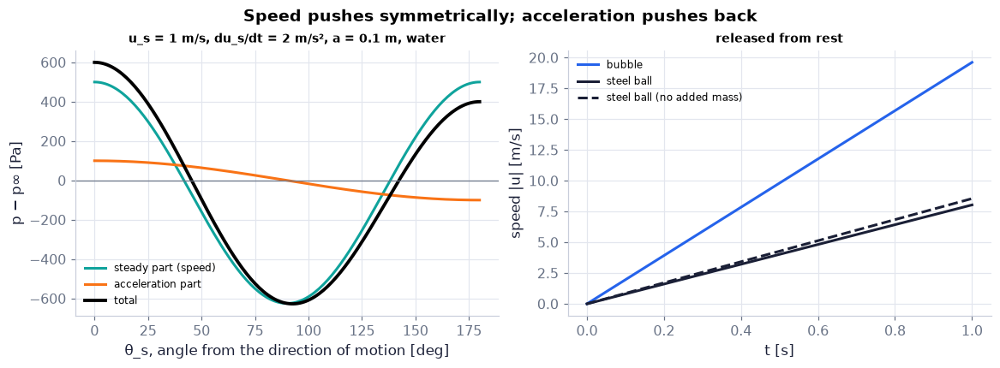

In [135]:
ths = np.radians(np.linspace(0, 180, 181))               # angle from the direction of motion θ_s [rad]
E_ = np.array([np.sin(ths), 0*ths, np.cos(ths)])         # surface normals in the (x, z) plane
parts = pf.moving_sphere_surface_pressure(E_, us, dus, a, rho, split=True)   # steady, acceleration and total [Pa]
T = np.linspace(0, 1.0, 101)                             # time after release [s]
fig, (a1, a2) = plt.subplots(1, 2, figsize=(10.5, 3.8))  # pressure | motion
a1.plot(np.degrees(ths), parts["steady"], color=COLORS["teal"], lw=2, label="steady part (speed)")   # symmetric about 90°
a1.plot(np.degrees(ths), parts["acceleration"], color=COLORS["orange"], lw=2, label="acceleration part")   # + in front, − behind
a1.plot(np.degrees(ths), parts["total"], color="k", lw=2.5, label="total")   # (6.105)
a1.axhline(0, color=COLORS["muted"], lw=0.8); a1.set_xlabel("θ_s, angle from the direction of motion [deg]")   # p = p∞ and the x-axis
a1.set_ylabel("p − p∞ [Pa]"); a1.legend(fontsize=8); a1.set_title("u_s = 1 m/s, du_s/dt = 2 m/s², a = 0.1 m, water", fontsize=9)   # the case
for mass, lab, col in ((0.0, "bubble", COLORS["blue"]), (32.67, "steel ball", COLORS["ink"])):   # two bodies released from rest
    for am, ls_ in ((True, "-"), (False, "--")):         # with and without added mass
        if mass == 0.0 and not am:   # a massless bubble without added mass …
            continue                                     # a massless bubble without added mass would accelerate infinitely
        sm = ch06.sphere_motion(mass, a, rho, g=9.81, mode="bubble" if mass == 0.0 else "ball", t_eval=T, added_mass=am)   # (6.109) in time
        a2.plot(T, np.abs(sm["u"]), ls=ls_, color=col, lw=2, label=f"{lab}{'' if am else ' (no added mass)'}")   # speed [m/s]
a2.set_xlabel("t [s]"); a2.set_ylabel("speed |u| [m/s]"); a2.legend(fontsize=8)   # axes with units
a2.set_title("released from rest", fontsize=9)   # the case
fig.suptitle("Speed pushes symmetrically; acceleration pushes back", fontweight="bold")   # the message
savefig(fig, "ch06", "c15_added_mass"); plt.show()       # save, then draw

**What you see.** Left, a teal curve symmetric about 90° (500 Pa at both ends, −625 Pa at the side), an orange curve that is +100 Pa in front and −100 Pa behind, and their black sum. Right, speeds after release growing linearly: the bubble at 2g = 19.6 m/s², the steel ball at 8.04 m/s² with added mass and a little faster without (dashed).

**How to read it.** Only the orange part survives the force integral: F = −M du_s/dt. The lighter the body, the more its motion is ruled by M (a bubble's initial acceleration 2g instead of infinity; a steel ball changes by only 6 %).

**What would change if…** …the body a long cylinder moving sideways: its added mass equals the whole displaced mass per unit length — a massless cylinder would start at g, not 2g.

In [136]:
nfr = 60 if not FAST else 30                             # number of frames
om, A0 = 2.0, 0.05                                       # angular frequency [rad/s] and amplitude [m] of x_s = A0 sin ωt
tt = np.linspace(0, 2*np.pi/om, nfr)                     # one period [s]
sm = ch06.sphere_motion(1.0, a, rho, mode="oscillating", amplitude=A0, omega=om, t_eval=tt)   # prescribed motion, F_s(t)
Mv = pf.added_mass_sphere(a, rho)                        # added mass [kg]
thc = np.linspace(0, 2*np.pi, 181)                       # angles round the section [rad]
fig, (a1, a2) = plt.subplots(1, 2, figsize=(9, 3.6))     # sphere section | force trace
sc = a1.scatter(0.1*np.sin(thc), 0.1*np.cos(thc), c=0*thc, cmap="coolwarm", vmin=-1.2, vmax=1.2, s=30)   # surface pressure
arr = a1.quiver([0], [0], [0], [0], color=COLORS["orange"], angles="xy", scale_units="xy", scale=2.0)    # the fluid force
a1.set_xlim(-0.25, 0.25); a1.set_ylim(-0.25, 0.25); a1.set_aspect("equal"); a1.set_xlabel("x [m]"); a1.set_ylabel("z [m]")
fig.colorbar(sc, ax=a1, label="p − p∞ [Pa]")
a2.plot(tt, sm["F_s"], color="k", lw=2, label="F_s from the pressure")
a2.plot(tt, -Mv*sm["du_dt"], "--", color=COLORS["orange"], lw=2, label="−M du_s/dt")
dot, = a2.plot([tt[0]], [sm["F_s"][0]], "o", color=COLORS["accent"])   # the current instant
a2.set_xlabel("t [s]"); a2.set_ylabel("force along z [N]"); a2.legend(fontsize=8)
def update(i):                                           # frame i
    e_ = np.array([np.sin(thc), 0*thc, np.cos(thc)])     # surface normals of the section
    pv = pf.moving_sphere_surface_pressure(e_, np.array([0, 0, sm["u"][i]]), np.array([0, 0, sm["du_dt"][i]]), a, rho)   # p − p∞
    sc.set_offsets(np.c_[0.1*np.sin(thc), sm["x"][i] + 0.1*np.cos(thc)]); sc.set_array(pv)   # move and recolour the sphere
    arr.set_offsets([[0, sm["x"][i]]]); arr.set_UVC([0], [sm["F_s"][i]])   # the force arrow
    dot.set_data([tt[i]], [sm["F_s"][i]])                # the dot on the trace
    a1.set_title(f"t = {tt[i]:.2f} s", fontsize=10)
show_animation(animate(update, frames=nfr, fig=fig, interval=60), player="video")   # smooth MP4

**What you see.** The sphere oscillating up and down with its surface colour flickering; the orange force arrow always points against the acceleration; on the right, the pressure force (black) and −M du_s/dt (dashed orange) lie on top of each other.

**How to read it.** The force is in phase with the acceleration, never with the speed: over a period it does no net work (no drag), but the sphere is harder to shake than its own mass suggests.

**What would change if…** …ω doubled: the accelerations, the pressures and the force grow four times (∝ ω²) at the same amplitude.

In [137]:
T = np.linspace(0, 0.5, 60)                              # time after release [s]
def release_traces(ratio):                               # a sphere of density ratio ρ_body/ρ released from rest in water
    mass = ratio*rho*4/3*np.pi*a**3                      # its mass [kg]
    with_am = ch06.sphere_motion(mass, a, rho, g=9.81, mode="bubble" if ratio < 1 else "ball", t_eval=T)   # (6.109)
    tr = {"with added mass": (T, np.abs(with_am["u"]))}   # speed [m/s]
    if ratio > 0:                                        # without added mass (undefined for a massless body)
        no_am = ch06.sphere_motion(mass, a, rho, g=9.81, mode="bubble" if ratio < 1 else "ball", t_eval=T, added_mass=False)   # M left out
        tr["without added mass"] = (T, np.abs(no_am["u"]))   # its speed [m/s]
    else:
        tr["without added mass"] = (T, np.full(T.size, np.nan))   # nothing to draw for a massless body
    return tr   # {trace name: (x, y)}
ratios = np.linspace(0, 8, 17 if not FAST else 9)        # ρ_body/ρ from a bubble (0) to steel (≈ 8)
fig = slider_figure(release_traces, "ρ_body/ρ", ratios, xlabel="t [s]", ylabel="speed |u| [m/s]",   # precompute every slider step
                    title="When added mass matters: light bodies", yrange=[0, 10])
recolor(fig, {"with added mass": COLORS["accent"], "without added mass": COLORS["muted"]}, dashes={"without added mass": "dash"})   # colours by meaning
g0 = [abs(ch06.sphere_motion(r_*rho*4/3*np.pi*a**3, a, rho, g=9.81, mode="bubble" if r_ < 1 else "ball",
                             t_eval=np.array([0.0, 0.01]))["du_dt"][0])/9.81 for r_ in ratios]   # initial acceleration / g
step_titles(fig, [f"When added mass matters: initial acceleration {g_:.2f} g (ρ_body/ρ = {r_:.1f})" for g_, r_ in zip(g0, ratios)])   # a title per step
fig.show()                                               # draw it (works on the web page too)

**What you see.** Two straight speed lines after release; for a bubble only the solid one exists (2g); for light bodies the gap to the dashed 'no added mass' line is large, for steel it almost vanishes.

**How to read it.** The acceleration is $\lvert m-\rho V\rvert g/(m+M)$: M matters most when m is small; at ρ_body = ρ nothing moves (neutral buoyancy).

**What would change if…** …the fluid were air instead of water: M would be 800 times smaller and irrelevant for everything but a balloon.

> 🔁 **Tools from earlier chapters used here** (see `knowledge/primers.md`)

- **live widgets** — `live(fn, name=(min, max, step), …)` gives sliders that re-run fn — only while a kernel runs (Ch. 1 P47).

> ▶️ **Live cell.** The widget below needs a running Python kernel. On the web page it is frozen — open this notebook in Colab (button at the top) or run it locally to drag the sliders.

In [138]:
def push_sphere(m=10.0, a=0.1, F_E=10.0):                # mass [kg], radius [m], constant push [N]
    tq = np.linspace(0, 2, 101)                          # time [s]
    w1 = ch06.sphere_motion(m, a, 1000.0, F_E=lambda t: F_E, t_eval=tq)   # (6.109) with added mass, water
    w0 = ch06.sphere_motion(m, a, 1000.0, F_E=lambda t: F_E, t_eval=tq, added_mass=False)   # without
    fig, ax = plt.subplots(figsize=(6, 3.2))             # one panel
    ax.plot(tq, w1["u"], color=COLORS["accent"], lw=2, label=f"with added mass: m + M = {m + pf.added_mass_sphere(a, 1000.0):.2f} kg")
    ax.plot(tq, w0["u"], "--", color=COLORS["muted"], lw=2, label="without")
    ax.set_xlabel("t [s]"); ax.set_ylabel("u [m/s]"); ax.legend(fontsize=8); plt.show()
live(push_sphere, m=(0.5, 40.0, 0.5), a=(0.02, 0.3, 0.01), F_E=(1.0, 50.0, 1.0))   # three sliders (the plotly figure above is the page version)

interactive(children=(FloatSlider(value=20.25, continuous_update=False, description='m', layout=Layout(width='…

<function __main__.push_sphere(m=10.0, a=0.1, F_E=10.0)>

#### 🎮 Interactive: Why does an ideal fluid resist acceleration?

**Why interactive rather than a static figure:** set speed and acceleration independently, even at an angle, and see the two pressure parts on the sphere with their separate forces — one always zero, the other always −M du_s/dt; the ball and bubble modes integrate (6.109), $\mathbf F_E=\Big(m+\frac{2\pi}{3}\rho a^3\Big)\frac{d\mathbf u_s}{dt}$ in time.

**What to try:**
- Preset 'steady motion': the teal pressure is strong, the force bar zero.
- Preset 'starting from rest': only the orange part, and the force equals −M du_s/dt.
- Turn the acceleration 90° away from the velocity: the force follows the acceleration, not the motion.
- Preset 'air bubble': the transport shows it starting at 2g.

In [139]:
show_viz("ch06", "added_mass_sphere")   # full-width explainer; ⤢ Full screen for more room

[explainer ch06/added_mass_sphere]

**What would change if…** …the body were not a sphere? M becomes a tensor: a flat plate accelerated broadside drags along far more fluid than
edgewise — why a kite or a sail reacts differently to gusts from different directions, and why fish shape their bodies as
they do (Ch. 16).

---

## 6.10 Concluding Remarks

**What is this section about?** Where ideal-flow theory came from, where it fails, and where it lives on.

📝 **Note.** **Two and a half centuries** `N106` — Euler, Bernoulli, d'Alembert, Lagrange, Stokes, Helmholtz, Kirchhoff and
Kelvin built potential-flow theory; the same mathematics describes heat conduction, elasticity and electrostatics. Its
zero-drag prediction contradicted every observation until Prandtl's boundary layer (Ch. 9) explained where viscosity
hides. It remains the working tool for pressure on streamlined bodies (Ch. 9) and lift (Ch. 14, with conformal maps and
the Kutta condition). It closes this chapter's force story: d'Alembert (C06) → lift (C07, C10) → added mass (C15).

*↪ S01 — Exercises 6.1–6.5, 6.8 and 6.33 check the §6.2 statements (delta-source integrals, orthogonality of ∇φ and ∇ψ, Bernoulli from the ideal-flow equations); their ideas are D03 and D04 above.*

*↪ S02 — Exercises 6.6–6.7, 6.9, 6.14–6.15, 6.17 and 6.22: harmonic polynomials (generated by `ch06.harmonic_polynomials`, N20), the doublet's stream function (N25, N47), sketched flows and a vortex-pair doublet — left to the reader.*

*↪ S03 — Exercises 6.10–6.13, 6.18–6.20 and 6.23–6.24: forces on held singularities, the half-body's width by a mass balance (D07 step 9) and its zero net force (N29), the Rankine oval (the superposition explainer's preset) — the rest left to the reader.*

*↪ S04 — Exercises 6.21, 6.25–6.27 and 6.29–6.32: Blasius for the cylinder (the Blasius explainer's cylinder preset) and a control-volume proof of Kutta–Zhukhovsky (`ch06.cv_force_on_body`, R18); corners, images and vortex pairs left to the reader.*

*↪ S05 — Exercises 6.16 and 6.41 are kitchen experiments (a paper cylinder vs an airfoil in a draught; a vacuum nozzle over sugar grains — a sink and its image). Try them.*

*↪ S06 — Exercises 6.34–6.40 and 6.42–6.43: the 3-D source and doublet (D25), 3-D d'Alembert (N91), the airship's length (D26 and the tiny example of C14) — the rest left to the reader.*

*↪ S07 — Exercises 6.44–6.49: cavity collapse, the cylinder's added mass (N104), a bubble's 2g start (the added-mass explainer's bubble preset), oscillation frequencies, and the kinetic-energy route to added mass (D31).*

---

## ✅ What should have clicked

- **C01** ω = 0 makes the viscous force vanish, so outside boundary layers and wakes the flow obeys $\nabla\cdot\mathbf u=0$ and $\rho D\mathbf u/Dt=-\nabla p$ (6.1) — at the price of the no-slip condition.
- **C02** $\omega_z=-\nabla^2\psi$ (6.4): irrotational means Laplace for ψ and φ, with vortices and sources as delta sources of strength −Γ and m.
- **C03** Laplace is linear, so flows add, and any streamline can be a wall: $\partial\psi/\partial s=0$ (6.16).
- **C04** a source and a sink merged at fixed 2mε give the doublet $\phi=\lvert\mathbf d\rvert\cos\theta/2\pi r$ (6.29), the error shrinking like ε².
- **C05** stream + source = half-body: stagnation at m/2πU, body ψ = m/2, width m/U far downstream (6.31), $\psi=Uy+\frac{m}{2\pi}\tan^{-1}\frac yx=Ur\sin\theta+\frac{m}{2\pi}\theta$.
- **C06** the cylinder's $C_p=1-4\sin^2\theta$ (6.35) is symmetric front–back and top–bottom: zero drag, d'Alembert's paradox, which separation resolves.
- **C07** circulation moves the stagnation points ($\sin\theta=-\Gamma/4\pi aU$, (6.38)) and gives $L=\rho U\Gamma$ (6.40), with D = 0.
- **C08** images turn walls into symmetry lines (vortex images flip sign, sources keep it); a passing eddy is felt as suction, then a small over-pressure.
- **C09** $w=\phi+i\psi$ (6.42) is analytic — Cauchy–Riemann — and $dw/dz=u-iv$ (6.45); corners $w=Az^n$ are calm (α < π) or violent (α > π).
- **C10** Blasius (6.60), $D-iL=\frac{i\rho}{2}\oint_C\Big(\frac{dw}{dz}\Big)^2dz$ plus residues: D = 0 and $L=\rho U\Gamma$ for any body (6.62), $D-iL=\frac{i\rho}{2}2\pi i\Big(\frac{iU\Gamma}{\pi}\Big)=-i\rho U\Gamma,\ D=0,\ L=\rho U\Gamma$ — only U × Γ/z survives far away.
- **C11** analytic maps keep angles (6.64), $\delta'w=\frac{dw}{dz}\delta'z,\ \alpha=\beta$; $z=\zeta+b^2/\zeta$ (6.65) carries the circle onto an ellipse — take the square root that lands outside the circle.
- **C12** on a grid Laplace is \"average of your neighbours\" (6.72), $\psi_{i,j}=\tfrac14\big[\psi_{i-1,j}+\psi_{i+1,j}+\psi_{i,j-1}+\psi_{i,j+1}\big]$; Gauss–Seidel relaxes to it, SOR faster; test the residual with a tight tolerance; a 270° corner limits the accuracy to order 4/3.
- **C13** the Stokes ψ obeys (6.77), $\frac{\partial}{\partial R}\Big(\frac1R\frac{\partial\psi}{\partial R}\Big)+\frac1R\frac{\partial^2\psi}{\partial z^2}=-\omega_\varphi=0$, not Laplace; the sphere has maximum speed 1.5U and $C_p=1-\frac94\sin^2\theta$ (6.91).
- **C14** unknown axial sources + ψ = 0 at N points = one linear solve for a given body; the shape converges, the individual strengths do not.
- **C15** the acceleration pressure gives $\mathbf F_s=-M\,d\mathbf u_s/dt$ with $M=2\pi\rho a^3/3$ (6.108), half the displaced mass — by force and by energy.

**What later chapters build on**

- velocity potentials of water waves and images at the bottom (Ch. 7)
- the ideal outer flow U_e(x) that drives boundary layers, wedge flows w = Azⁿ and separation (Ch. 9)
- elliptic solvers (relaxation, SOR, sparse direct) and panel methods (Ch. 10)
- ψ–vorticity inversion, deformation fields, coastal images and bounded-basin Poisson problems (Ch. 13)
- the Kutta condition, Zhukhovsky airfoils and induced drag (Ch. 14)
- added mass of bubbles, fish and structures (Ch. 16)

**Not taught here (and where to find it)**
- the exercise details (S01–S07 above)
- the measured cylinder pressure curve of the book's figure — only a labelled qualitative band here (no dataset cited)
- the moment (torque) form of Blasius's theorem
- added-mass tensors of non-spherical bodies (named in N104)